# Multiple particles falling in the F-layer

This notebook outlines how we can use our model of a single falling and growing iron particle 
to create a self consistent solution to propoerties of the F-layer and an estimate of the inner
core growth rate. We assume at the outset that we can track the growth and position of a single
falling iron particle with time. This is set up as a pair of coupled ODEs and solved as an IVP. 
This is implemented inside the `boundary_layer` model making use of the SciPy `integrate.solve_ivp`
interface to an explicit 5th order Runga-Kutta solver. We make extensive use of event tracking and
interpolated solutions given by this implementation.

The aim is to (1) look at how the results of our method varies with input parameters and (2)
compare our non-equilibrium approach to a simple equilibrium model. The results generated are
summarised in Figure **XX**, which this notebook generates.

The bulk of the code for this notebook lives in the `flayer` module (see `flayer.py`). This
module makes use of almost all of our other modules either directly or indirectly. 


In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import scipy.optimize as spo
import scipy.interpolate as spi
import particle_evolution
import feo_thermodynamics as feot
import earth_model
import flayer

## F-layer setup

We need a reasonable description of the F-layer. We do this by defining a radius for the ICB 
and a radius for the top of the F-layer, assume that pressure (and gravity) are given by PREM,
and define functions for temperature and composition. (The following function generates the functions
we'll need). 

The (total) composition is assumed to be constant in the core above the F-layer, and may vary as a linear 
function of radius within the F-layer. This is set up by providing two compositions, one
at the top and one at the bottom of the F-layer. These are provided as mole fraction Fe
and are needed to set up the temperature.

For temperature we extrapolate down an adiabat until we reach the top of the F-layer and then
assume a linear variation in temperature with radius. The adiabatic temperature is given by:

$$ T_a(r) = T_{CMB} \left(\frac{\rho(r)}{\rho_{CMB}}\right)^{\gamma} $$

where $\gamma$ is the Grunissen parameter for the core (e.g. 1.5) and $T_{CMB}$ is the 
temperature at the CMB. We $\gamma$, assume PREM for the density, and find $T_{CMB}$ such
that $T_a(r)$ is equal to the liquidus (at our chosen composition) at the top of the F-layer.
This is done by root finding. 
We choose the temperature at the ICB by further extrapolating down the adiabat and applying 
a small change (or order 10 K) such that the F-layer can be sub- (or super-) adiabatic.

Note that allowing the temperature and composition to vary with radius could allow the
F-layer to depart from the two phase region (either by dipping below the solidus/eutectic
temperature or by exceeding the pressure-dependent liquidus). Do check.

Pressure at ICB: 329.1010089948369 GPa
Pressure at top of F-layer 317.7026904318656 GPa
g at ICB: 4.403124222842614 m/s**2
g at top of F-layer 5.010242771751181 m/s**2


/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/function_base.py:2197: RuntimeWarning: invalid value encountered in find_liquidus (vectorized)
  outputs = ufunc(*inputs)


Temperature at CMB is 4091.0000127665962 K
Temberature at top of F-layer is 5495.375594101565 K
Temberature at ICB is 5560.445773134292 K


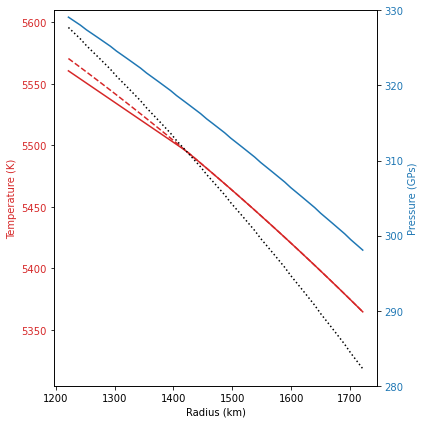

In [2]:
# This is where we set all the F-layer parameters. Quite slow (due to liquidus calc I think)

# F-layer setup
radius_inner_core = 1221.5e3
radius_top_flayer = radius_inner_core + 200.0e3 # 200 km thick.
radius_cmb = 3480.0e3 # We only need this for setup.
gamma = 1.5

# Check PREM works ... and print some interesting values
prem = earth_model.Prem()
print("Pressure at ICB:", prem.pressure(radius_inner_core/1000.0), "GPa")
print("Pressure at top of F-layer", prem.pressure(radius_top_flayer/1000.0), "GPa")
print("g at ICB:", prem.gravity(radius_inner_core/1000.0), "m/s**2")
print("g at top of F-layer", prem.gravity(radius_top_flayer/1000.0), "m/s**2")

# Generate the functions for temperautre,
# composition, pressure and gravity
tfunc, atfunc, xfunc, pfunc, \
    gfunc = flayer.setup_flayer_functions(radius_inner_core, radius_cmb, radius_top_flayer, 
                                                    gamma, 10.0, 0.92, 0.92)

print("Temperature at CMB is", tfunc(radius_cmb), "K")
print("Temberature at top of F-layer is", tfunc(radius_top_flayer), "K")
print("Temberature at ICB is", tfunc(radius_inner_core), "K")

# Interpolate onto radius for plotting
rs = np.linspace(radius_inner_core, radius_inner_core+500.0E3)
ts = tfunc(rs)
ats = atfunc(rs)
ps = pfunc(rs)
xs = xfunc(rs)
# Find the P-X dependent liquidus (storing the temperature at each point)
tl = feot.find_liquidus(xs, ps)


# Plot the F-layer setup alongside the liquidus
fig, ax1 = plt.subplots(figsize=(6,6), tight_layout=True)

color = 'tab:red'
ax1.set_xlabel('Radius (km)')
ax1.set_ylabel('Temperature (K)', color=color)
ax1.plot(rs/1000.0, ts, color=color)
ax1.plot(rs/1000.0, ats, color=color, ls='--')
ax1.plot(rs/1000.0, tl, color='k', ls=':')

ax1.tick_params(axis='y', labelcolor=color)
#ax1.set_ylim([5900, 6200])

ax2 = ax1.twinx()  

color = 'tab:blue'
ax2.set_ylabel('Pressure (GPs)', color=color)  
ax2.plot(rs/1000.0, ps, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim([280, 330])

fig.tight_layout()  
plt.show()

## Equilibrium calculation

We've covered all of this before elsewhere. The only innovation is to 
allow pressure and composition to vary with temperature.

/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/function_base.py:2197: RuntimeWarning: invalid value encountered in phase_relations_molar (vectorized)
  outputs = ufunc(*inputs)
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/function_base.py:2197: RuntimeWarning: invalid value encountered in phase_relations_molar (vectorized)
  outputs = ufunc(*inputs)


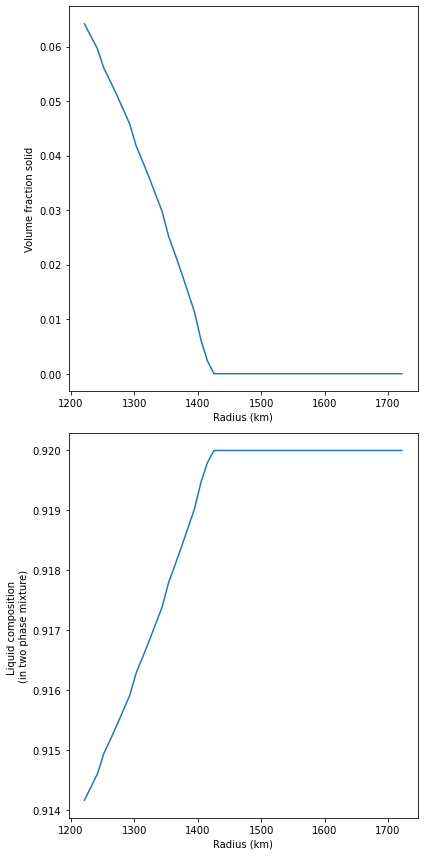

In [3]:
equilib_vol_frac = feot.volume_fraction_solid(xs, ps, ts) # Why do these give steppy answers?
x_lq, phi_fe, phi_lq, phi_feo, phi_solid = feot.phase_relations_molar(xs, ps, ts)

fig, ax = plt.subplots(nrows=2, figsize=(6,12), tight_layout=True)
ax[0].plot(rs/1000.0, equilib_vol_frac)
ax[0].set_ylabel('Volume fraction solid')
ax[0].set_xlabel('Radius (km)')
ax[1].plot(rs/1000.0, x_lq)
ax[1].set_ylabel('Liquid composition \n(in two phase mixture)')
ax[1].set_xlabel('Radius (km)')
plt.show()

**To Do:** 
1. work out why we have the steps in the melting curve and the phase relations output. Looks like
some numerical convergence thing but I would expect that to be more random.
2. Think about falling time and crstal size in the equilibrium case. 
3. Think about physical propertiese (layer density structure, bulk modulii, P-wave velocity

**TODO: check and integrate Chris comments. Do we care about the spacing any more?

## Non-equilibrium calculation

For the overall non-equilibrium calculation we make use of the previously implemented
code to track the growth and falling velocity of an isolated crystal. The new step
is to bring these together into a model of the F-layer. Setup of the F-layer is
described above.

### The particle density and optimisation of theliquid composition

Thus far we have treated the liquid composition around the falling particles as an
externally imposed parameter. However, we would like the composition (in terms of 
total oxygen content) of the F-layer to be conserved. As crystals grow oxygen
is enriched in the residual liquid (because it is excluded from the solid). What
we do is run a set of calculations with the liquid oxygen content set equal to the
imposed total oxygen content. Calculate the volume of solid in the F-layer from this
calculation and use this to recalculate the liquid composition (assuming that the
boundary layers play an insignificant role in the overall composition, and that the
total oxygen in the F-layer is conserved). This gives a new total oxygen content in
the layer. We then use this as the imposed oxygen content for the particle evolution
equation and iterate. We hope this converges (**question: can we argue that it must on
the basis of the growth rate being related to the oxygen content of the liquid?**)

In fact, we want the F-layer to be able to generate a gradient in oxygen content
and solid volume fraction. We'll thus set up a serise of layers and conserve
oxygen content in eacg layer. **Question: what sort of non-equilibroum will this
permit? The bulk liquid composition will not be the composition that is in
equilibrioum with the solid due to the boundary layer. This means that (once convereged)
we will not be in phase equilibrium either. However, we will conserve mass. 
I think this measn we say something like "we allow departures from phase equilibrium
and only impose chemical equilibrium in a limited way (no gradients in bulk solid or
bulk liquid).** 

In order to set this up we need to self consistently
solve the falling particles ODEs using the following algorithem:

1. Set an initial guess for the liquid composition (equal to the total composition)
2. Solve ODEs 
3. Calculate liquid composition in each layer such that the total coposition is conserved
4. If these do no match repeate from 2 otherwise
5. Evaluate crystal size distribution and inner core growth rate.

Note that for many falling particles nucleating throughout the liquid composition will
need to change through the layer (we may expect it will be more oxygen rich downwards as the 
number density of particles and their sizes increases downwards). 

Given the above, we need a way to evaluate the number density and total volume of particles at any
depth in the F-layer. The information we have is the nuclation rate, $\mathscr{N}(r_n)$, 
and relationship between the particle position $r_p(r_n, t)$ with time, $t$. Both are functions
of the nuclation position $r_n$. We also have access to the particle radius, $R(r_n, t)$. 

We start by calculating the 'partial number density', number of particles per cubic meter that
at position $r$ that nucleated at $r_n$. For this we need the spacing between particles nuclating
in a given volume around $r_n$, which we call $V_n$. From the definition of $\mathscr{N}$ we
know that the mean waiting time between nucleation events is:

$$\tau = \frac{1}{2 \mathscr{N}(r_n) V_n}$$

and the mean position of nucleation will be at the center of the volume represented by $V_n$.
The factor of a $\frac{1}{2}$ arised because half of the nuclii that reach the critical radius
then dissolve (some definitions of $\mathscr{N}$ will not include this). $\tau$ should be in
units of time.

Particles falling from any given location will follow identicle trajectories whatever time they
start (because we are assuming the F-layer is in steady state). That is, if $r_p(r_n, t)$ and
$R(r_n, t)$ are solutions to the IVP for a particle nucleating at $t_0$, solutions for an IVP
where the particle nucleated at $t_0 + \tau$ will be $r_p(r_n, t + \tau)$ and $R(r_n, t + \tau)$
and we have solutions available whatever the nucleation time. At some $r$ we can thus calculate
the vertical distance, $s_z$ between particles by taking the difference in $r_p$ for particles
nucleating $\tau$ before and after $t_0$:

$$s_z = \frac{\left(r_p(r_n, t) - r_p(r_n, t + \tau)\right) + \left(r_p(r_n, t - \tau) + r_p(r_n, t)\right)}{2}$$

And the vertical partial particle density is $\rho_p(r_n) = \frac{1}{s_z}$. The seperation between paticles in
the horizontal direction is determined by the cross sectional area of the nucleation volume 
(the particles just sink downwards). On average this will be the distance between the centers of
the nucleation volumes. If we arrange for the cross-sectional area to be 1 m$^2$ the vertical 
parital particle density will be the partial particle density (in particles per m$^3$). We can
either envisage these particles to nucleate and fall in 'sheets' or imagine a stocastic process
(in which case the positions are the mean positions and the density is a mean density. This
analysis ignores the change in shell area with radius. **Note: do we need to account for change in
cross sectional area with r in spherical geometry?**



We now need to consider the paricles that nucleate at other depths. These will have different solutions
to the IVP, and thus different seperations and densities. The total (number) density of particles
at some depth $\rho(r)$, is just the sum of the partial densities from all nucleation depths above the height of
interest. We can evaluate this as an integral over nucleation depths:

$$\rho(r) = \int_{r}^{r_{top}} \rho_p(r_n) \mathrm{d}r_n $$

where $r_{top}$ is the top of the F-layer.

So we need to calculate $\rho(r)$ at some set of radii, convert this into a particle seperation, express the 
seperation as a contiuous function, and feed this back in as the radius of the interaction volume in the IVPs.
The iteraction radius (particle seperation) is given by the Wigner–Seitz radius:

$$r_{sep}(r) = \left(\frac{3}{4\pi\rho(r)}\right)^{\frac{1}{3}} $$

### Inner core growth

Once we have a self-consistent solution, it is quite easy to evaluate the solid
volume fraction at any radius, and the inner core growth rate. 

The inner core growth rate (by sedimentation), $G_{ic}$, is given by the volume of solid reaching the
ICB per unit time. This is found by integrating the volume of particles that formed everywhere in the 
F-layer according to their nuclation radius and deviding by the area of the ICB:

$$G_{ic} = \frac{1}{ 4 \pi r_{icb}^2}\int_{r_{icb}}^{r_{top}} 4 \pi r_n^2 . \frac{4}{3}\pi R(r_n, t_{icb})^3 . \frac{ \mathscr{N}(r_n)}{2} \mathrm{d}r_n$$

The term outside the integral is the area of the ICB. The first term inside the intergral accounts for the 
spherical shell geometry, the second is the volume of the particles as they reach the ICB having nucleated
at $r_n$, and the third term gives the number of these particles. The integral is over nucleation position.

**To do:** do we actually implement the factor of a half in the nucleation rate?


### Solid volume fraction

The volume fraction solid, $V_f(r)$ at any radius can be evaluated in a similar way as the total volume of solid
(per unit volume) is the product of the particle number density and the radii:

$$V_f(r) = \int_{r}^{r_{top}} \rho_p(r_n) \frac{4}{3}\pi R(r_n, t_r)^3 \mathrm{d}r_n $$

**To do:** do we need a geometrical term?

Once we know $V_f(r)$ we can evaluate the liquid composition (and thus density) by conservation of oxygen 
(all the oxygen is in the liquid).

### Implementation

We choose a set of integration depths / nucleation depths ($r_n$) above and use each one as the starting
depth for the IVP solver and for the descrete depths for numerical integration of the integrals above. 
Some brief testing seems to show that O(10) is more than enough points for the case I looked at (but careful
checking may be useful). We also choose a set of radii (just $r$ above) where we want to evaluate $\rho_p$ and 
$V_f$. We provide these to the IVP solver as non terminal 'events' and also check for dissolution of the particle
and for the particle hitting the ICB (these are 'terminal events'). What this means is that we can easily get hold
of the time and particle radius when the solution hit these depths from the IVP solution objects. We run each IVP
and store the solution objects in a list. We also need to apply small changes to the time to work out the 
seperation between particles. We do this by asking the IVP solver to fit an interpolation function to the solution.
We can then use the time (from the event) and apply an offset to find the position the particle was at a short time
before or after the event was triggered. We can use the termination event to find the ICB growth rate. To make this
all work we need to know when event corresponds to which depth. Events are stored (in the IVP solution) in a list.
Event 0 is 'hit the ICB', event 1 is 'dissolved' and subsiquent events correspond to our analysis radii in order.
Note that accessing these events needs us to check that the particle has not dissovled (or never reached) the analysis
radius of interest. Super. Glad that makes sense. It is also useful to know that the events information is stored in
`t_events` (for times) and `y_events` (for radius, in element 0, and position, in element 1). 

This may all make a bit more sense in terms of code. The function in the next cell just dumps out everything we 
know about the events found in a single IVP solution. Last thing to watch - events can (in principle) be triggered
multiple times, so we have to watch for this!

### The actual integration

The next couple of cells shows how this can be used and illustrate one solution. 

Note that as well as F-layer setup (above) we have other parameters to set here.

In [4]:
# IVP defaults
start_time = 0 # s
max_time = 1.0E20 # s

# Physical properties
initial_particle_size = 1.0E-9 # initial radius, m - should be critical radius for nucleation
k0 = 150.0 # growth rate prefactor, m/s
dl = 1.0E-9 # diffusion
mu = 1.0e-6 # kinematic viscosity
surface_energy = 1.08E-2 # J/m^2 ... try E-8?
i0 = 1.0E-10 # s^-1 m^-3 - other estimates include 0.71E-48... 

nucleation_radii = np.linspace(radius_inner_core, radius_top_flayer, 200)
analysis_radii = np.linspace(radius_inner_core, radius_top_flayer, 200)

solutions, particle_densities, growth_rate, solid_vf, \
    particle_radius_unnormalised, partial_particle_densities, opt_xlfunc, crit_nuc_radii, \
    nucleation_rates = flayer.evaluate_flayer(
    tfunc, xfunc, pfunc, gfunc, start_time, max_time, k0, dl, mu, i0, surface_energy,
    nucleation_radii, analysis_radii, radius_inner_core, radius_top_flayer)

print("Nuc radii:", crit_nuc_radii)
print("Nuc rates:", nucleation_rates)

R = 1221500.0 I =  9.473056363807186e-11 r0 =  3.0309112983643827e-10
R = 1222505.025125628 I =  9.468924675311243e-11 r0 =  3.0430099490412523e-10
R = 1223510.0502512562 I =  9.464735044827695e-11 r0 =  3.055234549907687e-10
R = 1224515.0753768843 I =  9.460486382649993e-11 r0 =  3.0675869793848604e-10
R = 1225520.1005025127 I =  9.456177573010476e-11 r0 =  3.0800691543890127e-10
R = 1226525.1256281408 I =  9.451807474079276e-11 r0 =  3.0926830291444716e-10
R = 1227530.1507537689 I =  9.447374915802302e-11 r0 =  3.105430600250034e-10
R = 1228535.175879397 I =  9.442878700187512e-11 r0 =  3.1183139045604063e-10
R = 1229540.201005025 I =  9.438317600651976e-11 r0 =  3.131335019787711e-10
R = 1230545.2261306532 I =  9.433690360460418e-11 r0 =  3.14449606766502e-10
R = 1231550.2512562815 I =  9.428995692759348e-11 r0 =  3.1577992124719183e-10
R = 1232555.2763819096 I =  9.424232278462815e-11 r0 =  3.1712466656651964e-10
R = 1233560.3015075377 I =  9.419398767176953e-11 r0 =  3.18484068179

R = 1377278.8944723618 I =  4.1432035133614844e-11 r0 =  1.2172179218148058e-09
R = 1378283.9195979899 I =  3.980955061816132e-11 r0 =  1.2444679087670244e-09
R = 1379288.9447236182 I =  3.8141563946149956e-11 r0 =  1.2730172896596995e-09
R = 1380293.9698492463 I =  3.642908064850907e-11 r0 =  1.3029611445177444e-09
R = 1381298.9949748744 I =  3.467363356088617e-11 r0 =  1.3344040520547327e-09
R = 1382304.0201005025 I =  3.287737452337017e-11 r0 =  1.3674613198013508e-09
R = 1383309.0452261306 I =  3.104317760430242e-11 r0 =  1.4022603910569436e-09
R = 1384314.0703517587 I =  2.917475207754845e-11 r0 =  1.4389424918463074e-09
R = 1385319.0954773868 I =  2.727676588339137e-11 r0 =  1.4776645290811524e-09
R = 1386324.1206030152 I =  2.5354973925552117e-11 r0 =  1.5186013654724617e-09
R = 1387329.1457286433 I =  2.341635415646313e-11 r0 =  1.5619484048292705e-09
R = 1388334.1708542714 I =  2.1469236856100552e-11 r0 =  1.607924755455604e-09
R = 1389339.1959798995 I =  1.9523426694722386e-1

icb at t =  51478.30809451527 s, with particle radius =  0.002342077673181407
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  56.933166196914605 s, with particle radius =  2.4844108120904057e-05
did not reach r =  1223510.0502512562 m
did not reach r =  1224515.0753768843 m
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271356785 m
did not reach r =  1239590.4522613066 m
did not reach r =  1240595.4773869347 m
did not reach r =  1241600.5025125628 m
did not 

icb at t =  75937.79346282627 s, with particle radius =  0.0032356939738963563
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  51612.59816313824 s, with particle radius =  0.0023290614217734615
reached r =  1223510.0502512562 m at t =  57.13330699057979 s, with particle radius =  2.4795655952818174e-05
did not reach r =  1224515.0753768843 m
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271356785 m
did not reach r =  1239590.4522613066 m
did not reach r =  

icb at t =  95521.36621381137 s, with particle radius =  0.003936130373120503
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  75924.62503874599 s, with particle radius =  0.003230920218359649
reached r =  1223510.0502512562 m at t =  51616.35461693088 s, with particle radius =  0.002333436949483402
reached r =  1224515.0753768843 m at t =  57.33385790135647 s, with particle radius =  2.4747051789688815e-05
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.427135

icb at t =  112672.20096673239 s, with particle radius =  0.004554580175492303
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  95627.87660393401 s, with particle radius =  0.0039428395828571975
reached r =  1223510.0502512562 m at t =  76056.21561981193 s, with particle radius =  0.0032324182697215983
reached r =  1224515.0753768843 m at t =  51725.47969024827 s, with particle radius =  0.002325925935598753
reached r =  1225520.1005025127 m at t =  57.53509309637537 s, with particle radius =  2.4698263140625287e-05
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
di

icb at t =  128229.56425352902 s, with particle radius =  0.005103902345177153
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  112825.77470219163 s, with particle radius =  0.004553731681204568
reached r =  1223510.0502512562 m at t =  95760.27456005718 s, with particle radius =  0.003935776591575705
reached r =  1224515.0753768843 m at t =  76142.66144440988 s, with particle radius =  0.0032186746209990286
reached r =  1225520.1005025127 m at t =  51778.52620644234 s, with particle radius =  0.002322887476950704
reached r =  1226525.1256281408 m at t =  57.73627430197959 s, with particle radius =  2.4649249075876122e-05
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reac

icb at t =  142842.5692438743 s, with particle radius =  0.005577298055456847
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  128562.82805567626 s, with particle radius =  0.0050706797006667605
reached r =  1223510.0502512562 m at t =  113092.44948963166 s, with particle radius =  0.004523321540071266
reached r =  1224515.0753768843 m at t =  95959.3159225602 s, with particle radius =  0.003912287933276161
reached r =  1225520.1005025127 m at t =  76286.13342577181 s, with particle radius =  0.0032095933362494833
reached r =  1226525.1256281408 m at t =  51874.00754072105 s, with particle radius =  0.0023184930076874137
reached r =  1227530.1507537689 m at t =  57.93729329740478 s, with particle radius =  2.4600047805547445e-05
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233

icb at t =  156389.30624342442 s, with particle radius =  0.006018519426244732
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  142990.24413437338 s, with particle radius =  0.005559622252850763
reached r =  1223510.0502512562 m at t =  128694.69572478805 s, with particle radius =  0.005065054158039406
reached r =  1224515.0753768843 m at t =  113211.58703873368 s, with particle radius =  0.004519159989969195
reached r =  1225520.1005025127 m at t =  96060.3831827922 s, with particle radius =  0.0039042224786639923
reached r =  1226525.1256281408 m at t =  76362.30605834337 s, with particle radius =  0.0032037427249939155
reached r =  1227530.1507537689 m at t =  51923.98537404196 s, with particle radius =  0.002314612906330054
reached r =  1228535.175879397 m at t =  58.13942150450354 s, with particle radius =  2.455068704219492e-05
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.25125628

icb at t =  169414.77639591048 s, with particle radius =  0.006442868451786135
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  156710.6608559319 s, with particle radius =  0.006008001161493385
reached r =  1223510.0502512562 m at t =  143298.57128884774 s, with particle radius =  0.005548496696141127
reached r =  1224515.0753768843 m at t =  128987.48760046845 s, with particle radius =  0.005054188688669277
reached r =  1225520.1005025127 m at t =  113484.6456450142 s, with particle radius =  0.004508828059052284
reached r =  1226525.1256281408 m at t =  96307.16019790225 s, with particle radius =  0.0038942246311900563
reached r =  1227530.1507537689 m at t =  76568.08496490262 s, with particle radius =  0.003192806062343275
reached r =  1228535.175879397 m at t =  52060.12808433053 s, with particle radius =  0.0023044850685719886
reached r =  1229540.201005025 m at t =  58.341092459912616 s, with particle radius =  2.4501100505947482e-05
did n

icb at t =  181603.57071074602 s, with particle radius =  0.0068496011229214355
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  169485.3345487507 s, with particle radius =  0.006436062645903615
reached r =  1223510.0502512562 m at t =  156785.7935750602 s, with particle radius =  0.006004047528521515
reached r =  1224515.0753768843 m at t =  143372.10066642315 s, with particle radius =  0.005545311943053379
reached r =  1225520.1005025127 m at t =  129054.88252126206 s, with particle radius =  0.0050501045319245085
reached r =  1226525.1256281408 m at t =  113547.60468562182 s, with particle radius =  0.00450628195161752
reached r =  1227530.1507537689 m at t =  96378.25547660823 s, with particle radius =  0.0038974982105979003
reached r =  1228535.175879397 m at t =  76653.65259435867 s, with particle radius =  0.003192877892444887
reached r =  1229540.201005025 m at t =  52129.77810574189 s, with particle radius =  0.002299794793666174
reached

icb at t =  193296.88820143524 s, with particle radius =  0.007236093079392165
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  181675.66294972584 s, with particle radius =  0.006841088508297701
reached r =  1223510.0502512562 m at t =  169567.18106002972 s, with particle radius =  0.006428010847921012
reached r =  1224515.0753768843 m at t =  156872.26889211868 s, with particle radius =  0.005993286745953695
reached r =  1225520.1005025127 m at t =  143456.4082802751 s, with particle radius =  0.005531947102295913
reached r =  1226525.1256281408 m at t =  129128.9285486906 s, with particle radius =  0.005036796469222114
reached r =  1227530.1507537689 m at t =  113603.21643865663 s, with particle radius =  0.004496817527076592
reached r =  1228535.175879397 m at t =  96411.20548817085 s, with particle radius =  0.0038937270314238076
reached r =  1229540.201005025 m at t =  76678.61432629768 s, with particle radius =  0.0031919394404694617
reache

icb at t =  204832.09447267948 s, with particle radius =  0.00760154341772842
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  193606.1891839335 s, with particle radius =  0.007221933545748521
reached r =  1223510.0502512562 m at t =  181958.85043578225 s, with particle radius =  0.006825977608703724
reached r =  1224515.0753768843 m at t =  169817.16892892827 s, with particle radius =  0.006412474357311383
reached r =  1225520.1005025127 m at t =  157088.11838822963 s, with particle radius =  0.005980717849720454
reached r =  1226525.1256281408 m at t =  143655.9481878523 s, with particle radius =  0.005526578832697895
reached r =  1227530.1507537689 m at t =  129328.17027765105 s, with particle radius =  0.005037187398246329
reached r =  1228535.175879397 m at t =  113810.09605170517 s, with particle radius =  0.004496966198292179
reached r =  1229540.201005025 m at t =  96621.11088112261 s, with particle radius =  0.003887258146137417
reached 

icb at t =  215979.49167025837 s, with particle radius =  0.0079667783922793
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  205126.90736510506 s, with particle radius =  0.007606026813098904
reached r =  1223510.0502512562 m at t =  193915.02656732893 s, with particle radius =  0.007231823450983603
reached r =  1224515.0753768843 m at t =  182281.1315517837 s, with particle radius =  0.006836355030535119
reached r =  1225520.1005025127 m at t =  170150.46177705753 s, with particle radius =  0.006418559361231493
reached r =  1226525.1256281408 m at t =  157426.4380263179 s, with particle radius =  0.005977959754054192
reached r =  1227530.1507537689 m at t =  143977.37707457526 s, with particle radius =  0.005512227694188628
reached r =  1228535.175879397 m at t =  129615.71261785114 s, with particle radius =  0.0050159736530247115
reached r =  1229540.201005025 m at t =  114058.10398517163 s, with particle radius =  0.0044783534160600805
reache

icb at t =  226731.83274066963 s, with particle radius =  0.00828962241162562
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  216176.42604202 s, with particle radius =  0.007939215903516591
reached r =  1223510.0502512562 m at t =  205301.57417045117 s, with particle radius =  0.007576180167854883
reached r =  1224515.0753768843 m at t =  194060.39589939674 s, with particle radius =  0.00719815197651915
reached r =  1225520.1005025127 m at t =  182394.58689523727 s, with particle radius =  0.006802873828483262
reached r =  1226525.1256281408 m at t =  170230.0511793997 s, with particle radius =  0.00638825850439441
reached r =  1227530.1507537689 m at t =  157470.12350487465 s, with particle radius =  0.005952504237997913
reached r =  1228535.175879397 m at t =  143985.97198274653 s, with particle radius =  0.005494305821399616
reached r =  1229540.201005025 m at t =  129606.3680703533 s, with particle radius =  0.005007996964884624
reached r = 

icb at t =  237358.35543617068 s, with particle radius =  0.008596731692551013
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  227063.7771490404 s, with particle radius =  0.00825791053853728
reached r =  1223510.0502512562 m at t =  216486.53953413368 s, with particle radius =  0.007909092354419252
reached r =  1224515.0753768843 m at t =  205589.5807112017 s, with particle radius =  0.007548546557082597
reached r =  1225520.1005025127 m at t =  194327.24175796425 s, with particle radius =  0.007174040125718764
reached r =  1226525.1256281408 m at t =  182642.24367360747 s, with particle radius =  0.006782658718710883
reached r =  1227530.1507537689 m at t =  170464.16039987945 s, with particle radius =  0.006373574501816774
reached r =  1228535.175879397 m at t =  157700.38279584618 s, with particle radius =  0.005945698155156831
reached r =  1229540.201005025 m at t =  144217.54959372454 s, with particle radius =  0.005491359600768214
reached

icb at t =  247603.47225582125 s, with particle radius =  0.00894118669026675
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  237572.42318083163 s, with particle radius =  0.008610124993341838
reached r =  1223510.0502512562 m at t =  227288.55240186886 s, with particle radius =  0.008269690066075395
reached r =  1224515.0753768843 m at t =  216721.55890528887 s, with particle radius =  0.007918962549876314
reached r =  1225520.1005025127 m at t =  205835.09517063192 s, with particle radius =  0.00755690451341525
reached r =  1226525.1256281408 m at t =  194584.9247661366 s, with particle radius =  0.007182325344047934
reached r =  1227530.1507537689 m at t =  182915.97640167197 s, with particle radius =  0.006793553681199588
reached r =  1228535.175879397 m at t =  170748.69970935155 s, with particle radius =  0.0063817011204973855
reached r =  1229540.201005025 m at t =  157982.2950108359 s, with particle radius =  0.005943299955058765
reached

icb at t =  257943.96368006084 s, with particle radius =  0.009213515960881267
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  248114.15422403786 s, with particle radius =  0.00889224595993215
reached r =  1223510.0502512562 m at t =  238056.6239392059 s, with particle radius =  0.008563595029574019
reached r =  1224515.0753768843 m at t =  227745.73236634617 s, with particle radius =  0.00822636331138884
reached r =  1225520.1005025127 m at t =  217150.78047367852 s, with particle radius =  0.007879014134047093
reached r =  1226525.1256281408 m at t =  206234.53189104202 s, with particle radius =  0.0075195748026796495
reached r =  1227530.1507537689 m at t =  194951.12617400457 s, with particle radius =  0.007145495795703119
reached r =  1228535.175879397 m at t =  183244.18279142678 s, with particle radius =  0.006755105336675563
reached r =  1229540.201005025 m at t =  171042.29240737003 s, with particle radius =  0.006347980312309607
reache

icb at t =  267730.88856084814 s, with particle radius =  0.009517429916119242
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  258101.6966182363 s, with particle radius =  0.009206700632874772
reached r =  1223510.0502512562 m at t =  248268.01094840356 s, with particle radius =  0.008888074542630225
reached r =  1224515.0753768843 m at t =  238207.8090457089 s, with particle radius =  0.008560687245092301
reached r =  1225520.1005025127 m at t =  227895.13036278504 s, with particle radius =  0.008223563809020923
reached r =  1226525.1256281408 m at t =  217299.02493121638 s, with particle radius =  0.007875589405169709
reached r =  1227530.1507537689 m at t =  206382.1107625467 s, with particle radius =  0.007515469311187864
reached r =  1228535.175879397 m at t =  195098.5460823748 s, with particle radius =  0.007141673108492708
reached r =  1229540.201005025 m at t =  183391.09747209406 s, with particle radius =  0.00675235459201607
reached r

icb at t =  277783.95331809355 s, with particle radius =  0.009783179803478318
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  268326.8939813474 s, with particle radius =  0.009480277419279861
reached r =  1223510.0502512562 m at t =  258683.89531026568 s, with particle radius =  0.00917078361854768
reached r =  1224515.0753768843 m at t =  248835.0571377392 s, with particle radius =  0.008853428936010481
reached r =  1225520.1005025127 m at t =  238757.35575552224 s, with particle radius =  0.008526953294645182
reached r =  1226525.1256281408 m at t =  228423.88196218584 s, with particle radius =  0.008190108224740828
reached r =  1227530.1507537689 m at t =  217802.82466999913 s, with particle radius =  0.007841661699519333
reached r =  1228535.175879397 m at t =  206856.08768522344 s, with particle radius =  0.007480407083156733
reached r =  1229540.201005025 m at t =  195537.3634713757 s, with particle radius =  0.007105178689315462
reached 

icb at t =  287454.1123188204 s, with particle radius =  0.010046527302729952
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  278146.836133512 s, with particle radius =  0.009747896307903667
reached r =  1223510.0502512562 m at t =  268666.60718509613 s, with particle radius =  0.009443967967971086
reached r =  1224515.0753768843 m at t =  258998.03639488498 s, with particle radius =  0.009134486581005213
reached r =  1225520.1005025127 m at t =  249124.49503309597 s, with particle radius =  0.008818965486897786
reached r =  1226525.1256281408 m at t =  239023.9692560345 s, with particle radius =  0.008495676277872982
reached r =  1227530.1507537689 m at t =  228669.7944453781 s, with particle radius =  0.008162729955153845
reached r =  1228535.175879397 m at t =  218030.29886885238 s, with particle radius =  0.007818320170548336
reached r =  1229540.201005025 m at t =  207067.36460614842 s, with particle radius =  0.007460750112069135
reached r

icb at t =  297172.8078536358 s, with particle radius =  0.010307212235171219
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  288009.5660767115 s, with particle radius =  0.010014004000815892
reached r =  1223510.0502512562 m at t =  278686.24679395906 s, with particle radius =  0.009715225768031752
reached r =  1224515.0753768843 m at t =  269189.2972722252 s, with particle radius =  0.009410696050979533
reached r =  1225520.1005025127 m at t =  259502.99760316455 s, with particle radius =  0.00910008170258868
reached r =  1226525.1256281408 m at t =  249608.9824574094 s, with particle radius =  0.008782865224706811
reached r =  1227530.1507537689 m at t =  239485.61719731122 s, with particle radius =  0.00845830203458258
reached r =  1228535.175879397 m at t =  229107.17009030728 s, with particle radius =  0.008125363566413623
reached r =  1229540.201005025 m at t =  218442.69268437783 s, with particle radius =  0.007782659960051636
reached r 

icb at t =  306368.3944482306 s, with particle radius =  0.010586803479388448
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  297360.4350566074 s, with particle radius =  0.010303415066597207
reached r =  1223510.0502512562 m at t =  288205.6555717096 s, with particle radius =  0.010015221243804055
reached r =  1224515.0753768843 m at t =  278891.7550591479 s, with particle radius =  0.00972124753665719
reached r =  1225520.1005025127 m at t =  269404.6397605044 s, with particle radius =  0.009420284485116203
reached r =  1226525.1256281408 m at t =  259728.0538666916 s, with particle radius =  0.009110840306425737
reached r =  1227530.1507537689 m at t =  249843.5728972832 s, with particle radius =  0.008791840296316319
reached r =  1228535.175879397 m at t =  239730.7822893834 s, with particle radius =  0.008465017502792174
reached r =  1229540.201005025 m at t =  229363.30410595858 s, with particle radius =  0.008130007881974467
reached r =  

icb at t =  315849.3175912955 s, with particle radius =  0.01084437720699486
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  306966.6213250547 s, with particle radius =  0.010566025704859117
reached r =  1223510.0502512562 m at t =  297948.1377119304 s, with particle radius =  0.010282672358516973
reached r =  1224515.0753768843 m at t =  288782.9948805062 s, with particle radius =  0.00999385224123945
reached r =  1225520.1005025127 m at t =  279458.8127224156 s, with particle radius =  0.009699049515648931
reached r =  1226525.1256281408 m at t =  269961.4096530607 s, with particle radius =  0.00939768740943797
reached r =  1227530.1507537689 m at t =  260274.43113903533 s, with particle radius =  0.009089115533476334
reached r =  1228535.175879397 m at t =  250378.87288409963 s, with particle radius =  0.008772593628612414
reached r =  1229540.201005025 m at t =  240252.45972391797 s, with particle radius =  0.008447270429978794
reached r =  

icb at t =  324946.3504336188 s, with particle radius =  0.011117674655273253
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  316191.35042298865 s, with particle radius =  0.010842743326548143
reached r =  1223510.0502512562 m at t =  307309.53079992946 s, with particle radius =  0.0105634314057703
reached r =  1224515.0753768843 m at t =  298291.6915419013 s, with particle radius =  0.010279341231981952
reached r =  1225520.1005025127 m at t =  289127.5269113152 s, with particle radius =  0.009990022039697967
reached r =  1226525.1256281408 m at t =  279804.2608762877 s, with particle radius =  0.009694394614979495
reached r =  1227530.1507537689 m at t =  270306.72607924155 s, with particle radius =  0.009391575349232604
reached r =  1228535.175879397 m at t =  260618.70433457763 s, with particle radius =  0.009081437256041415
reached r =  1229540.201005025 m at t =  250721.4132440401 s, with particle radius =  0.008763719368169583
reached r =

icb at t =  334184.0553365658 s, with particle radius =  0.01136112024464047
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  325542.052383463 s, with particle radius =  0.011090998299980817
reached r =  1223510.0502512562 m at t =  316781.28517978656 s, with particle radius =  0.010816848326987344
reached r =  1224515.0753768843 m at t =  307893.164780543 s, with particle radius =  0.010538270079830173
reached r =  1225520.1005025127 m at t =  298868.0474795541 s, with particle radius =  0.01025480068475472
reached r =  1226525.1256281408 m at t =  289695.05336947856 s, with particle radius =  0.009965904034266263
reached r =  1227530.1507537689 m at t =  280361.8423762224 s, with particle radius =  0.009670957665577013
reached r =  1228535.175879397 m at t =  270854.33492570795 s, with particle radius =  0.009369236356992345
reached r =  1229540.201005025 m at t =  261155.77935191456 s, with particle radius =  0.00905959902718966
reached r =  1

icb at t =  343011.7856572926 s, with particle radius =  0.011578612913971281
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  334462.4501055808 s, with particle radius =  0.011313946014585291
reached r =  1223510.0502512562 m at t =  325801.4541801002 s, with particle radius =  0.011044549038335362
reached r =  1224515.0753768843 m at t =  317020.9109351666 s, with particle radius =  0.010769806668253864
reached r =  1225520.1005025127 m at t =  308112.06891615916 s, with particle radius =  0.010489456583539405
reached r =  1226525.1256281408 m at t =  299065.5704063906 s, with particle radius =  0.010204980054834575
reached r =  1227530.1507537689 m at t =  289870.6947168893 s, with particle radius =  0.009916213310872224
reached r =  1228535.175879397 m at t =  280515.2265357354 s, with particle radius =  0.00962267247586859
reached r =  1229540.201005025 m at t =  270985.21663950296 s, with particle radius =  0.009323797382412171
reached r = 

icb at t =  351702.6759860504 s, with particle radius =  0.011804838201226539
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  343245.7420301982 s, with particle radius =  0.011541529776433268
reached r =  1223510.0502512562 m at t =  334682.4950377657 s, with particle radius =  0.011273983198214068
reached r =  1224515.0753768843 m at t =  326005.84870681574 s, with particle radius =  0.011002059094581428
reached r =  1225520.1005025127 m at t =  317207.954834912 s, with particle radius =  0.010725676110423195
reached r =  1226525.1256281408 m at t =  308280.0863801533 s, with particle radius =  0.010444819270449934
reached r =  1227530.1507537689 m at t =  299212.49628181325 s, with particle radius =  0.010159550211670131
reached r =  1228535.175879397 m at t =  289994.2456104972 s, with particle radius =  0.009870019803671417
reached r =  1229540.201005025 m at t =  280615.63080481545 s, with particle radius =  0.009578018878581195
reached r =

icb at t =  361353.04711680557 s, with particle radius =  0.012020888656345666
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  352986.60343481414 s, with particle radius =  0.01176560286186177
reached r =  1223510.0502512562 m at t =  344520.86119407916 s, with particle radius =  0.011506578696109887
reached r =  1224515.0753768843 m at t =  335949.2778298025 s, with particle radius =  0.011243376871363486
reached r =  1225520.1005025127 m at t =  327264.63022524246 s, with particle radius =  0.010975586748592597
reached r =  1226525.1256281408 m at t =  318458.9137243571 s, with particle radius =  0.010702829779682347
reached r =  1227530.1507537689 m at t =  309523.22091676324 s, with particle radius =  0.01042476375411368
reached r =  1228535.175879397 m at t =  300447.5950207714 s, with particle radius =  0.010141088073301472
reached r =  1229540.201005025 m at t =  291220.85104996554 s, with particle radius =  0.009851550349870949
reached r

icb at t =  369261.97644249786 s, with particle radius =  0.01228164402976575
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  360993.8945111292 s, with particle radius =  0.012026855544470357
reached r =  1223510.0502512562 m at t =  352632.007222141 s, with particle radius =  0.011768887911401361
reached r =  1224515.0753768843 m at t =  344170.5566542135 s, with particle radius =  0.011507537944329292
reached r =  1225520.1005025127 m at t =  335603.19340485404 s, with particle radius =  0.011242585319319908
reached r =  1226525.1256281408 m at t =  326922.89267933846 s, with particle radius =  0.010973790102065412
reached r =  1227530.1507537689 m at t =  318121.8542696946 s, with particle radius =  0.01070088980378346
reached r =  1228535.175879397 m at t =  309191.38247919135 s, with particle radius =  0.010423595851045235
reached r =  1229540.201005025 m at t =  300121.7408539985 s, with particle radius =  0.010141589320317619
reached r = 

icb at t =  378096.18310161505 s, with particle radius =  0.012496142982307324
did not dissolve
reached r =  1221500.0 m at t =  378096.18310161505 s, with particle radius =  0.012496142982307324
reached r =  1222505.025125628 m at t =  369905.3089060375 s, with particle radius =  0.012243772591855332
reached r =  1223510.0502512562 m at t =  361625.5375597964 s, with particle radius =  0.011988502980480532
reached r =  1224515.0753768843 m at t =  353251.6810307683 s, with particle radius =  0.011730201300307382
reached r =  1225520.1005025127 m at t =  344778.02060867625 s, with particle radius =  0.011468710474603395
reached r =  1226525.1256281408 m at t =  336198.23415798997 s, with particle radius =  0.011203846000666097
reached r =  1227530.1507537689 m at t =  327505.30984533293 s, with particle radius =  0.010935392154449709
reached r =  1228535.175879397 m at t =  318691.44313437707 s, with particle radius =  0.010663097453011689
reached r =  1229540.201005025 m at t =  30974

icb at t =  386989.67507253605 s, with particle radius =  0.012704215866860949
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  378871.43965182034 s, with particle radius =  0.012458968468934826
reached r =  1223510.0502512562 m at t =  370668.92097951454 s, with particle radius =  0.01221013875848383
reached r =  1224515.0753768843 m at t =  362377.25795419014 s, with particle radius =  0.011957547308763469
reached r =  1225520.1005025127 m at t =  353991.1347291572 s, with particle radius =  0.011701036861634052
reached r =  1226525.1256281408 m at t =  345504.7216124366 s, with particle radius =  0.011440474746796974
reached r =  1227530.1507537689 m at t =  336911.6056120857 s, with particle radius =  0.011175755764359205
reached r =  1228535.175879397 m at t =  328204.70832358784 s, with particle radius =  0.010906805640278641
reached r =  1229540.201005025 m at t =  319376.18822526315 s, with particle radius =  0.010633585195168863
reached 

icb at t =  395357.10431009624 s, with particle radius =  0.01293019038502567
did not dissolve
reached r =  1221500.0 m at t =  395357.10431009624 s, with particle radius =  0.01293019038502567
reached r =  1222505.025125628 m at t =  387321.3672257663 s, with particle radius =  0.012688094058679048
reached r =  1223510.0502512562 m at t =  379204.94514747756 s, with particle radius =  0.012443013926297743
reached r =  1224515.0753768843 m at t =  371003.3449006838 s, with particle radius =  0.012194770473893146
reached r =  1225520.1005025127 m at t =  362711.6794205695 s, with particle radius =  0.011943179119396054
reached r =  1226525.1256281408 m at t =  354324.61900989566 s, with particle radius =  0.011688049479109007
reached r =  1227530.1507537689 m at t =  345836.3345072134 s, with particle radius =  0.011429184523879435
reached r =  1228535.175879397 m at t =  337240.43066465226 s, with particle radius =  0.011166379603267891
reached r =  1229540.201005025 m at t =  328529.8

icb at t =  403652.0550315134 s, with particle radius =  0.013109005393602484
did not dissolve
reached r =  1221500.0 m at t =  403652.0550315134 s, with particle radius =  0.013109005393602484
reached r =  1222505.025125628 m at t =  395674.01828311663 s, with particle radius =  0.012873030479780423
reached r =  1223510.0502512562 m at t =  387620.63390049676 s, with particle radius =  0.012634554356011124
reached r =  1224515.0753768843 m at t =  379487.9270872678 s, with particle radius =  0.012393312893157381
reached r =  1225520.1005025127 m at t =  371271.5573533253 s, with particle radius =  0.012149043078014
reached r =  1226525.1256281408 m at t =  362966.77424854256 s, with particle radius =  0.011901482835651584
reached r =  1227530.1507537689 m at t =  354568.36582980416 s, with particle radius =  0.011650370826626679
reached r =  1228535.175879397 m at t =  346070.59834771854 s, with particle radius =  0.011395446217223828
reached r =  1229540.201005025 m at t =  337467.14

icb at t =  412030.74910080945 s, with particle radius =  0.013358531914319391
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  404129.1941627497 s, with particle radius =  0.013120783194587697
reached r =  1223510.0502512562 m at t =  396154.83790241234 s, with particle radius =  0.012880702184278304
reached r =  1224515.0753768843 m at t =  388104.0577782357 s, with particle radius =  0.012638143975211305
reached r =  1225520.1005025127 m at t =  379972.9354803567 s, with particle radius =  0.012392953422661192
reached r =  1226525.1256281408 m at t =  371757.22367248515 s, with particle radius =  0.012144963982930105
reached r =  1227530.1507537689 m at t =  363452.3077193014 s, with particle radius =  0.01189399637599425
reached r =  1228535.175879397 m at t =  355053.16144463903 s, with particle radius =  0.011639857040040771
reached r =  1229540.201005025 m at t =  346554.2957431573 s, with particle radius =  0.01138233633699031
reached r =

icb at t =  421211.35577172943 s, with particle radius =  0.013505407238106334
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  413354.4176025115 s, with particle radius =  0.013270045067655445
reached r =  1223510.0502512562 m at t =  405427.477465996 s, with particle radius =  0.013032315808896517
reached r =  1224515.0753768843 m at t =  397427.24308016454 s, with particle radius =  0.012792049575092258
reached r =  1225520.1005025127 m at t =  389350.1702946657 s, with particle radius =  0.012549061506267499
reached r =  1226525.1256281408 m at t =  381191.9845037189 s, with particle radius =  0.01230347478583455
reached r =  1227530.1507537689 m at t =  372947.8097823794 s, with particle radius =  0.012055613185694536
reached r =  1228535.175879397 m at t =  364613.0934011689 s, with particle radius =  0.011805270185209202
reached r =  1229540.201005025 m at t =  356182.81376786646 s, with particle radius =  0.011552215934340034
reached r = 

icb at t =  428882.39899921825 s, with particle radius =  0.013732696301646329
did not dissolve
reached r =  1221500.0 m at t =  428882.39899921825 s, with particle radius =  0.013732696301646329
reached r =  1222505.025125628 m at t =  421101.7152077552 s, with particle radius =  0.013504608445572129
reached r =  1223510.0502512562 m at t =  413255.1459729477 s, with particle radius =  0.013274356114251977
reached r =  1224515.0753768843 m at t =  405339.36653215514 s, with particle radius =  0.013041672762985273
reached r =  1225520.1005025127 m at t =  397350.79609944473 s, with particle radius =  0.012806300249503896
reached r =  1226525.1256281408 m at t =  389285.57025283034 s, with particle radius =  0.012567989372700542
reached r =  1227530.1507537689 m at t =  381139.5093336447 s, with particle radius =  0.012326500510712969
reached r =  1228535.175879397 m at t =  372908.0821327428 s, with particle radius =  0.01208160437866092
reached r =  1229540.201005025 m at t =  364586.

icb at t =  437593.10958780686 s, with particle radius =  0.013949950363355314
did not dissolve
reached r =  1221500.0 m at t =  437593.10958780686 s, with particle radius =  0.013949950363355314
reached r =  1222505.025125628 m at t =  429871.09665695124 s, with particle radius =  0.013717723877570621
reached r =  1223510.0502512562 m at t =  422084.6755556974 s, with particle radius =  0.013483406066360372
reached r =  1224515.0753768843 m at t =  414230.7600624982 s, with particle radius =  0.013246917648965925
reached r =  1225520.1005025127 m at t =  406306.0364377846 s, with particle radius =  0.013008172275248392
reached r =  1226525.1256281408 m at t =  398306.9398738073 s, with particle radius =  0.012767075806606444
reached r =  1227530.1507537689 m at t =  390229.62769080314 s, with particle radius =  0.012523525496961632
reached r =  1228535.175879397 m at t =  382069.9487139666 s, with particle radius =  0.012277409056373551
reached r =  1229540.201005025 m at t =  373823.

icb at t =  446050.3412847794 s, with particle radius =  0.014107857120906129
did not dissolve
reached r =  1221500.0 m at t =  446050.3412847794 s, with particle radius =  0.014107857120906129
reached r =  1222505.025125628 m at t =  438371.63033480034 s, with particle radius =  0.013880977749771421
reached r =  1223510.0502512562 m at t =  430631.7338351026 s, with particle radius =  0.013652217055355907
reached r =  1224515.0753768843 m at t =  422827.904231549 s, with particle radius =  0.01342145715532317
reached r =  1225520.1005025127 m at t =  414957.1736022461 s, with particle radius =  0.013188574033839873
reached r =  1226525.1256281408 m at t =  407016.33110871515 s, with particle radius =  0.012953436881563444
reached r =  1227530.1507537689 m at t =  399001.8973210348 s, with particle radius =  0.012715907343627023
reached r =  1228535.175879397 m at t =  390910.0948693038 s, with particle radius =  0.012475838659778476
reached r =  1229540.201005025 m at t =  382736.8147

icb at t =  454553.27423532057 s, with particle radius =  0.014260120846262828
did not dissolve
reached r =  1221500.0 m at t =  454553.27423532057 s, with particle radius =  0.014260120846262828
reached r =  1222505.025125628 m at t =  446920.5047649408 s, with particle radius =  0.014036685903329607
reached r =  1223510.0502512562 m at t =  439229.13785530085 s, with particle radius =  0.013812081090250585
reached r =  1224515.0753768843 m at t =  431476.51362771756 s, with particle radius =  0.013586009481699968
reached r =  1225520.1005025127 m at t =  423659.77652307216 s, with particle radius =  0.013358183221763402
reached r =  1226525.1256281408 m at t =  415775.856014914 s, with particle radius =  0.013128324050837206
reached r =  1227530.1507537689 m at t =  407821.44476157695 s, with particle radius =  0.012896163911305367
reached r =  1228535.175879397 m at t =  399792.9737700321 s, with particle radius =  0.012661445647146647
reached r =  1229540.201005025 m at t =  391686

icb at t =  462639.98605331895 s, with particle radius =  0.014483742178421816
did not dissolve
reached r =  1221500.0 m at t =  462639.98605331895 s, with particle radius =  0.014483742178421816
reached r =  1222505.025125628 m at t =  455061.6737041289 s, with particle radius =  0.014260527066290172
reached r =  1223510.0502512562 m at t =  447426.4920007256 s, with particle radius =  0.014035467504069005
reached r =  1224515.0753768843 m at t =  439732.1458438873 s, with particle radius =  0.013808558489799908
reached r =  1225520.1005025127 m at t =  431976.15516981104 s, with particle radius =  0.013579781577746045
reached r =  1226525.1256281408 m at t =  424155.8371142006 s, with particle radius =  0.013349103722959839
reached r =  1227530.1507537689 m at t =  416268.28584667516 s, with particle radius =  0.013116475979673064
reached r =  1228535.175879397 m at t =  408310.3496882829 s, with particle radius =  0.012881832028070852
reached r =  1229540.201005025 m at t =  400278.

icb at t =  471407.05739138013 s, with particle radius =  0.014614193368248294
did not dissolve
reached r =  1221500.0 m at t =  471407.05739138013 s, with particle radius =  0.014614193368248294
reached r =  1222505.025125628 m at t =  463866.5472019277 s, with particle radius =  0.01439529036329146
reached r =  1223510.0502512562 m at t =  456272.534164295 s, with particle radius =  0.014175984643436237
reached r =  1224515.0753768843 m at t =  448622.71447101084 s, with particle radius =  0.013955918030694882
reached r =  1225520.1005025127 m at t =  440914.61621653347 s, with particle radius =  0.013734741641403356
reached r =  1226525.1256281408 m at t =  433145.5836838671 s, with particle radius =  0.013512116328615868
reached r =  1227530.1507537689 m at t =  425312.7596353214 s, with particle radius =  0.013287713181448522
reached r =  1228535.175879397 m at t =  417413.0652888903 s, with particle radius =  0.013061214092704066
reached r =  1229540.201005025 m at t =  409443.17

icb at t =  479302.1460347693 s, with particle radius =  0.014815292465203096
did not dissolve
reached r =  1221500.0 m at t =  479302.1460347693 s, with particle radius =  0.014815292465203096
reached r =  1222505.025125628 m at t =  471811.9692708504 s, with particle radius =  0.014597008728031347
reached r =  1223510.0502512562 m at t =  464269.0009535736 s, with particle radius =  0.01437702820235505
reached r =  1224515.0753768843 m at t =  456671.09795497416 s, with particle radius =  0.014155303227090143
reached r =  1225520.1005025127 m at t =  449015.96750342846 s, with particle radius =  0.013931780958581379
reached r =  1226525.1256281408 m at t =  441301.1537045497 s, with particle radius =  0.013706402921416606
reached r =  1227530.1507537689 m at t =  433524.02242294943 s, with particle radius =  0.013479104504668167
reached r =  1228535.175879397 m at t =  425681.7442745011 s, with particle radius =  0.013249814395124841
reached r =  1229540.201005025 m at t =  417771.27

icb at t =  487415.08061105094 s, with particle radius =  0.01501153075155031
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  479971.51825473143 s, with particle radius =  0.014794775722307424
reached r =  1223510.0502512562 m at t =  472476.64925016335 s, with particle radius =  0.014576399687397311
reached r =  1224515.0753768843 m at t =  464928.49489675154 s, with particle radius =  0.014356342609523575
reached r =  1225520.1005025127 m at t =  457324.95242351864 s, with particle radius =  0.01413454241065371
reached r =  1226525.1256281408 m at t =  449663.78448525665 s, with particle radius =  0.013910934782588757
reached r =  1227530.1507537689 m at t =  441942.6074712285 s, with particle radius =  0.013685452976728801
reached r =  1228535.175879397 m at t =  434158.8784584804 s, with particle radius =  0.013458027570171805
reached r =  1229540.201005025 m at t =  426309.88061287545 s, with particle radius =  0.013228586204793792
reached 

icb at t =  495748.8949141673 s, with particle radius =  0.015154276421415456
did not dissolve
reached r =  1221500.0 m at t =  495748.8949141673 s, with particle radius =  0.015154276421415456
reached r =  1222505.025125628 m at t =  488349.33953637193 s, with particle radius =  0.014943867285857818
reached r =  1223510.0502512562 m at t =  480901.62302607147 s, with particle radius =  0.014732745557451552
reached r =  1224515.0753768843 m at t =  473403.65159812727 s, with particle radius =  0.01452056557186179
reached r =  1225520.1005025127 m at t =  465853.2140762523 s, with particle radius =  0.01430699896750064
reached r =  1226525.1256281408 m at t =  458247.9719647479 s, with particle radius =  0.01409173563570326
reached r =  1227530.1507537689 m at t =  450585.448428653 s, with particle radius =  0.013874484809981848
reached r =  1228535.175879397 m at t =  442863.0160317211 s, with particle radius =  0.01365497631423943
reached r =  1229540.201005025 m at t =  435077.883056

icb at t =  503356.7036445601 s, with particle radius =  0.015379855226812733
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  496002.4467072143 s, with particle radius =  0.015166316497571053
reached r =  1223510.0502512562 m at t =  488600.28168131283 s, with particle radius =  0.014951247752346571
reached r =  1224515.0753768843 m at t =  481148.44320884516 s, with particle radius =  0.014734620473576241
reached r =  1225520.1005025127 m at t =  473645.06029689685 s, with particle radius =  0.014516409920977653
reached r =  1226525.1256281408 m at t =  466088.14782647643 s, with particle radius =  0.014296595379178167
reached r =  1227530.1507537689 m at t =  458475.5971498739 s, with particle radius =  0.014075160433838971
reached r =  1228535.175879397 m at t =  450805.16565431294 s, with particle radius =  0.01385209328032134
reached r =  1229540.201005025 m at t =  443074.465149723 s, with particle radius =  0.013627387069611948
reached r 

icb at t =  511102.890527514 s, with particle radius =  0.015592233359118857
did not dissolve
reached r =  1221500.0 m at t =  511102.890527514 s, with particle radius =  0.015592233359118857
reached r =  1222505.025125628 m at t =  503798.71838539117 s, with particle radius =  0.01537944558837597
reached r =  1223510.0502512562 m at t =  496448.4629364958 s, with particle radius =  0.015165097161620279
reached r =  1224515.0753768843 m at t =  489050.42106969893 s, with particle radius =  0.014949213507248826
reached r =  1225520.1005025127 m at t =  481602.78500700823 s, with particle radius =  0.014731810642750075
reached r =  1226525.1256281408 m at t =  474103.633906229 s, with particle radius =  0.014512894531362125
reached r =  1227530.1507537689 m at t =  466550.9245575447 s, with particle radius =  0.014292460368025669
reached r =  1228535.175879397 m at t =  458942.4810517336 s, with particle radius =  0.014070491784667304
reached r =  1229540.201005025 m at t =  451275.98327

icb at t =  519625.37961119734 s, with particle radius =  0.015725404203490608
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  512351.49097327935 s, with particle radius =  0.015514712771218984
reached r =  1223510.0502512562 m at t =  505032.05730627914 s, with particle radius =  0.015302477464070909
reached r =  1224515.0753768843 m at t =  497665.4487214331 s, with particle radius =  0.015088650864391286
reached r =  1225520.1005025127 m at t =  490249.9498821294 s, with particle radius =  0.01487319001904432
reached r =  1226525.1256281408 m at t =  482783.7536012691 s, with particle radius =  0.014656056725072437
reached r =  1227530.1507537689 m at t =  475264.95380742947 s, with particle radius =  0.014437217847371644
reached r =  1228535.175879397 m at t =  467691.5378022817 s, with particle radius =  0.014216645672517571
reached r =  1229540.201005025 m at t =  460061.37772003526 s, with particle radius =  0.013994318303506696
reached r

icb at t =  527090.0749852052 s, with particle radius =  0.01589264154036855
did not dissolve
reached r =  1221500.0 m at t =  527090.0749852052 s, with particle radius =  0.01589264154036855
reached r =  1222505.025125628 m at t =  519853.4636750791 s, with particle radius =  0.015686767191309486
reached r =  1223510.0502512562 m at t =  512573.92503414315 s, with particle radius =  0.01547976761757569
reached r =  1224515.0753768843 m at t =  505250.0041006907 s, with particle radius =  0.01527156692677144
reached r =  1225520.1005025127 m at t =  497880.156338946 s, with particle radius =  0.01506208823754224
reached r =  1226525.1256281408 m at t =  490462.7408389491 s, with particle radius =  0.014851253572259318
reached r =  1227530.1507537689 m at t =  482996.0128185862 s, with particle radius =  0.0146389837382121
reached r =  1228535.175879397 m at t =  475478.11533789244 s, with particle radius =  0.014425198195971198
reached r =  1229540.201005025 m at t =  467907.0701216788

icb at t =  535314.12430301 s, with particle radius =  0.016027144390503532
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  528106.1807742905 s, with particle radius =  0.01581923887630745
reached r =  1223510.0502512562 m at t =  520855.5972520644 s, with particle radius =  0.015610305213747417
reached r =  1224515.0753768843 m at t =  513560.96260150755 s, with particle radius =  0.015400310814927102
reached r =  1225520.1005025127 m at t =  506220.78958349593 s, with particle radius =  0.01518922042341542
reached r =  1226525.1256281408 m at t =  498833.50936070114 s, with particle radius =  0.014976995929182368
reached r =  1227530.1507537689 m at t =  491397.46547542437 s, with particle radius =  0.014763596165545527
reached r =  1228535.175879397 m at t =  483910.90723587736 s, with particle radius =  0.014548976685946461
reached r =  1229540.201005025 m at t =  476371.98243838473 s, with particle radius =  0.014333089518056926
reached r =

icb at t =  543375.9507310828 s, with particle radius =  0.016163835903497355
did not dissolve
reached r =  1221500.0 m at t =  543375.9507310828 s, with particle radius =  0.016163835903497355
reached r =  1222505.025125628 m at t =  536200.3301080262 s, with particle radius =  0.015959948651803637
reached r =  1223510.0502512562 m at t =  528984.315065296 s, with particle radius =  0.015755871235135943
reached r =  1224515.0753768843 m at t =  521726.59350139333 s, with particle radius =  0.015551415572705982
reached r =  1225520.1005025127 m at t =  514425.7710695723 s, with particle radius =  0.015346396642599592
reached r =  1226525.1256281408 m at t =  507080.36513755115 s, with particle radius =  0.015140632586555795
reached r =  1227530.1507537689 m at t =  499688.79814355884 s, with particle radius =  0.014933944821110864
reached r =  1228535.175879397 m at t =  492249.3902725904 s, with particle radius =  0.014726158156507423
reached r =  1229540.201005025 m at t =  484760.35

icb at t =  550933.8361853156 s, with particle radius =  0.01639070887128508
did not dissolve
reached r =  1221500.0 m at t =  550933.8361853156 s, with particle radius =  0.01639070887128508
reached r =  1222505.025125628 m at t =  543804.0889092482 s, with particle radius =  0.01618853803949491
reached r =  1223510.0502512562 m at t =  536634.8392076571 s, with particle radius =  0.015985359983089652
reached r =  1224515.0753768843 m at t =  529424.8122280969 s, with particle radius =  0.01578112802031878
reached r =  1225520.1005025127 m at t =  522172.66466738214 s, with particle radius =  0.015575793085049647
reached r =  1226525.1256281408 m at t =  514876.9799961734 s, with particle radius =  0.015369303561330719
reached r =  1227530.1507537689 m at t =  507536.2632367665 s, with particle radius =  0.015161605102375197
reached r =  1228535.175879397 m at t =  500148.9352420262 s, with particle radius =  0.014952640432149653
reached r =  1229540.201005025 m at t =  492713.3264159

icb at t =  559411.132382519 s, with particle radius =  0.0165157325021951
did not dissolve
reached r =  1221500.0 m at t =  559411.132382519 s, with particle radius =  0.0165157325021951
reached r =  1222505.025125628 m at t =  552306.2105881067 s, with particle radius =  0.01631499330897538
reached r =  1223510.0502512562 m at t =  545162.4232537645 s, with particle radius =  0.016113025806483862
reached r =  1224515.0753768843 m at t =  537978.5358268492 s, with particle radius =  0.015909781596050554
reached r =  1225520.1005025127 m at t =  530753.2503331534 s, with particle radius =  0.015705215517662872
reached r =  1226525.1256281408 m at t =  523485.2010571266 s, with particle radius =  0.01549928581801049
reached r =  1227530.1507537689 m at t =  516172.94982921367 s, with particle radius =  0.015291954334881563
reached r =  1228535.175879397 m at t =  508814.9808758506 s, with particle radius =  0.015083186699896917
reached r =  1229540.201005025 m at t =  501409.69518157124

icb at t =  566691.6256597296 s, with particle radius =  0.016666048444109134
did not dissolve
reached r =  1221500.0 m at t =  566691.6256597296 s, with particle radius =  0.016666048444109134
reached r =  1222505.025125628 m at t =  559616.8461654533 s, with particle radius =  0.016464393595909406
reached r =  1223510.0502512562 m at t =  552503.9003947792 s, with particle radius =  0.01626193048735314
reached r =  1224515.0753768843 m at t =  545351.6424438428 s, with particle radius =  0.01605862563731426
reached r =  1225520.1005025127 m at t =  538158.8695335465 s, with particle radius =  0.015854443310584786
reached r =  1226525.1256281408 m at t =  530924.3182753967 s, with particle radius =  0.015649345375526647
reached r =  1227530.1507537689 m at t =  523646.66061094264 s, with particle radius =  0.015443291149132388
reached r =  1228535.175879397 m at t =  516324.49938928307 s, with particle radius =  0.015236237228109753
reached r =  1229540.201005025 m at t =  508956.3635

icb at t =  575601.593209889 s, with particle radius =  0.0168016857439178
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  568554.0456504526 s, with particle radius =  0.016600696800353167
reached r =  1223510.0502512562 m at t =  561469.1908004069 s, with particle radius =  0.016398712092888654
reached r =  1224515.0753768843 m at t =  554345.8697631416 s, with particle radius =  0.01619568063650661
reached r =  1225520.1005025127 m at t =  547182.8610080748 s, with particle radius =  0.015991548450790302
reached r =  1226525.1256281408 m at t =  539978.8761309831 s, with particle radius =  0.01578625836395815
reached r =  1227530.1507537689 m at t =  532732.5552271885 s, with particle radius =  0.015579749798802745
reached r =  1228535.175879397 m at t =  525442.4618334455 s, with particle radius =  0.015371958538459915
reached r =  1229540.201005025 m at t =  518107.44226890535 s, with particle radius =  0.015163215509293924
reached r =  1230

icb at t =  583048.244626187 s, with particle radius =  0.016967782895484496
did not dissolve
reached r =  1221500.0 m at t =  583048.244626187 s, with particle radius =  0.016967782895484496
reached r =  1222505.025125628 m at t =  576033.9717650559 s, with particle radius =  0.01677026788163618
reached r =  1223510.0502512562 m at t =  568983.4103753578 s, with particle radius =  0.016571713121024078
reached r =  1224515.0753768843 m at t =  561895.466102048 s, with particle radius =  0.016372075959401586
reached r =  1225520.1005025127 m at t =  554768.9922394106 s, with particle radius =  0.016171313598356905
reached r =  1226525.1256281408 m at t =  547602.7863776942 s, with particle radius =  0.015969383070461037
reached r =  1227530.1507537689 m at t =  540395.5867637601 s, with particle radius =  0.015766241212622652
reached r =  1228535.175879397 m at t =  533146.068345504 s, with particle radius =  0.015561844637496283
reached r =  1229540.201005025 m at t =  525852.838465827

icb at t =  591314.4786570335 s, with particle radius =  0.01715600477795966
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  584331.0101105723 s, with particle radius =  0.016957429095966554
reached r =  1223510.0502512562 m at t =  577312.8095817375 s, with particle radius =  0.016757983130228842
reached r =  1224515.0753768843 m at t =  570258.9823915233 s, with particle radius =  0.016557640081500707
reached r =  1225520.1005025127 m at t =  563168.597158071 s, with particle radius =  0.01635637208546212
reached r =  1226525.1256281408 m at t =  556040.6837236 s, with particle radius =  0.016154150152474973
reached r =  1227530.1507537689 m at t =  548874.0917270004 s, with particle radius =  0.015951009944291134
reached r =  1228535.175879397 m at t =  541667.0438451576 s, with particle radius =  0.01574719649403421
reached r =  1229540.201005025 m at t =  534418.1700958674 s, with particle radius =  0.015542643650640914
reached r =  1230545

icb at t =  599745.1474599519 s, with particle radius =  0.017236139305817782
did not dissolve
reached r =  1221500.0 m at t =  599745.1474599519 s, with particle radius =  0.017236139305817782
reached r =  1222505.025125628 m at t =  592756.4886946396 s, with particle radius =  0.017039785940327193
reached r =  1223510.0502512562 m at t =  585733.4176533244 s, with particle radius =  0.016842710999992534
reached r =  1224515.0753768843 m at t =  578675.1224012813 s, with particle radius =  0.01664489294102676
reached r =  1225520.1005025127 m at t =  571580.7606426766 s, with particle radius =  0.01644630937292616
reached r =  1226525.1256281408 m at t =  564449.4581292411 s, with particle radius =  0.016246937014000276
reached r =  1227530.1507537689 m at t =  557280.3069598567 s, with particle radius =  0.01604675164383425
reached r =  1228535.175879397 m at t =  550072.3637618743 s, with particle radius =  0.015845728052424374
reached r =  1229540.201005025 m at t =  542824.6477438

icb at t =  607289.9426130258 s, with particle radius =  0.017436567353670773
did not dissolve
reached r =  1221500.0 m at t =  607289.9426130258 s, with particle radius =  0.017436567353670773
reached r =  1222505.025125628 m at t =  600362.1563756897 s, with particle radius =  0.017239606905440855
reached r =  1223510.0502512562 m at t =  593400.7682975574 s, with particle radius =  0.017041950877687673
reached r =  1224515.0753768843 m at t =  586404.8566164575 s, with particle radius =  0.016843588154716472
reached r =  1225520.1005025127 m at t =  579373.4548812642 s, with particle radius =  0.01664450529454316
reached r =  1226525.1256281408 m at t =  572305.5492416981 s, with particle radius =  0.01644468640263356
reached r =  1227530.1507537689 m at t =  565200.0755175824 s, with particle radius =  0.01624411299536923
reached r =  1228535.175879397 m at t =  558055.9160251998 s, with particle radius =  0.01604276385216247
reached r =  1229540.201005025 m at t =  550871.89613561

icb at t =  614727.5803097814 s, with particle radius =  0.017587617906158134
did not dissolve
reached r =  1221500.0 m at t =  614727.5803097814 s, with particle radius =  0.017587617906158134
reached r =  1222505.025125628 m at t =  607828.7440378227 s, with particle radius =  0.017394384900073803
reached r =  1223510.0502512562 m at t =  600897.3254244033 s, with particle radius =  0.017200413337230415
reached r =  1224515.0753768843 m at t =  593932.4340486167 s, with particle radius =  0.017005669481510336
reached r =  1225520.1005025127 m at t =  586933.1380468686 s, with particle radius =  0.016810117661086164
reached r =  1226525.1256281408 m at t =  579898.4616587015 s, with particle radius =  0.01661372015892514
reached r =  1227530.1507537689 m at t =  572827.3825777723 s, with particle radius =  0.01641643709449779
reached r =  1228535.175879397 m at t =  565718.8290887747 s, with particle radius =  0.016218226295814916
reached r =  1229540.201005025 m at t =  558571.676968

icb at t =  621278.0078975164 s, with particle radius =  0.017716555606315968
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  614401.8770819014 s, with particle radius =  0.01752367387945389
reached r =  1223510.0502512562 m at t =  607493.7821395587 s, with particle radius =  0.01733006542084847
reached r =  1224515.0753768843 m at t =  600552.8645215483 s, with particle radius =  0.01713570622864443
reached r =  1225520.1005025127 m at t =  593578.2261106224 s, with particle radius =  0.016940571563891015
reached r =  1226525.1256281408 m at t =  586568.9269135674 s, with particle radius =  0.01674463590488311
reached r =  1227530.1507537689 m at t =  579523.9825730267 s, with particle radius =  0.016547872897927432
reached r =  1228535.175879397 m at t =  572442.3616812702 s, with particle radius =  0.016350255304192745
reached r =  1229540.201005025 m at t =  565322.9828762459 s, with particle radius =  0.016151754942261225
reached r =  1230

icb at t =  629935.7838876711 s, with particle radius =  0.01789496209617049
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  623092.0147301474 s, with particle radius =  0.01770378629665899
reached r =  1223510.0502512562 m at t =  616217.0977474991 s, with particle radius =  0.017512008871976046
reached r =  1224515.0753768843 m at t =  609310.2212042285 s, with particle radius =  0.017319586862998088
reached r =  1225520.1005025127 m at t =  602370.5368305284 s, with particle radius =  0.017126473960794246
reached r =  1226525.1256281408 m at t =  595397.1577459302 s, with particle radius =  0.016932620332080373
reached r =  1227530.1507537689 m at t =  588389.1562248204 s, with particle radius =  0.0167379724311726
reached r =  1228535.175879397 m at t =  581345.5612888758 s, with particle radius =  0.016542472797136058
reached r =  1229540.201005025 m at t =  574265.3561096763 s, with particle radius =  0.016346059834673094
reached r =  1230

icb at t =  637125.8496152158 s, with particle radius =  0.018072502311374375
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  630311.6999493769 s, with particle radius =  0.017883111904659726
reached r =  1223510.0502512562 m at t =  623467.613147401 s, with particle radius =  0.01769352804059443
reached r =  1224515.0753768843 m at t =  616592.8972962026 s, with particle radius =  0.017503786608545773
reached r =  1225520.1005025127 m at t =  609686.7632185599 s, with particle radius =  0.017313774908147145
reached r =  1226525.1256281408 m at t =  602747.795261212 s, with particle radius =  0.017122212038476414
reached r =  1227530.1507537689 m at t =  595774.9648713571 s, with particle radius =  0.01692889253095365
reached r =  1228535.175879397 m at t =  588767.3447778733 s, with particle radius =  0.016733927485478087
reached r =  1229540.201005025 m at t =  581723.962096022 s, with particle radius =  0.016537421394377208
reached r =  12305

icb at t =  646097.353461045 s, with particle radius =  0.018119031566498776
did not dissolve
reached r =  1221500.0 m at t =  646097.353461045 s, with particle radius =  0.018119031566498776
reached r =  1222505.025125628 m at t =  639290.2120433303 s, with particle radius =  0.01793071549199144
reached r =  1223510.0502512562 m at t =  632453.210504809 s, with particle radius =  0.017741500941435808
reached r =  1224515.0753768843 m at t =  625585.576074473 s, with particle radius =  0.01755136576651844
reached r =  1225520.1005025127 m at t =  618686.50184112 s, with particle radius =  0.017360290166607534
reached r =  1226525.1256281408 m at t =  611755.1448565728 s, with particle radius =  0.017168256788935465
reached r =  1227530.1507537689 m at t =  604790.6240972722 s, with particle radius =  0.016975250836451978
reached r =  1228535.175879397 m at t =  597792.0182711121 s, with particle radius =  0.01678126018411177
reached r =  1229540.201005025 m at t =  590758.3634549 s, wi

icb at t =  653916.5505874087 s, with particle radius =  0.018233887871529297
did not dissolve
reached r =  1221500.0 m at t =  653916.5505874087 s, with particle radius =  0.018233887871529297
reached r =  1222505.025125628 m at t =  647133.0783208917 s, with particle radius =  0.018044417267051898
reached r =  1223510.0502512562 m at t =  640319.8910125884 s, with particle radius =  0.017854467234206025
reached r =  1224515.0753768843 m at t =  633476.2545354919 s, with particle radius =  0.01766401936098861
reached r =  1225520.1005025127 m at t =  626601.4048461479 s, with particle radius =  0.01747305414514833
reached r =  1226525.1256281408 m at t =  619694.5463885951 s, with particle radius =  0.017281550938918654
reached r =  1227530.1507537689 m at t =  612754.8503850754 s, with particle radius =  0.017089487889774865
reached r =  1228535.175879397 m at t =  605781.4530035892 s, with particle radius =  0.016896841876861815
reached r =  1229540.201005025 m at t =  598773.453391

icb at t =  662326.8753166737 s, with particle radius =  0.018423132256899878
did not dissolve
reached r =  1221500.0 m at t =  662326.8753166737 s, with particle radius =  0.018423132256899878
reached r =  1222505.025125628 m at t =  655570.7235504016 s, with particle radius =  0.01823271211981931
reached r =  1223510.0502512562 m at t =  648785.6486036144 s, with particle radius =  0.018041733798514873
reached r =  1224515.0753768843 m at t =  641970.9577116361 s, with particle radius =  0.01785021198539058
reached r =  1225520.1005025127 m at t =  635125.92802742 s, with particle radius =  0.017658158306489403
reached r =  1226525.1256281408 m at t =  628249.8050179516 s, with particle radius =  0.017465581183840704
reached r =  1227530.1507537689 m at t =  621341.800746075 s, with particle radius =  0.01727248568813108
reached r =  1228535.175879397 m at t =  614401.0920275174 s, with particle radius =  0.017078873380783753
reached r =  1229540.201005025 m at t =  607426.8184518346

icb at t =  669339.3234767661 s, with particle radius =  0.0185275937111532
did not dissolve
reached r =  1221500.0 m at t =  669339.3234767661 s, with particle radius =  0.0185275937111532
reached r =  1222505.025125628 m at t =  662601.7801920242 s, with particle radius =  0.018340884589987835
reached r =  1223510.0502512562 m at t =  655836.3374556729 s, with particle radius =  0.018153828733501035
reached r =  1224515.0753768843 m at t =  649042.3435358205 s, with particle radius =  0.017966415697020725
reached r =  1225520.1005025127 m at t =  642219.1175037447 s, with particle radius =  0.017778631613345558
reached r =  1226525.1256281408 m at t =  635365.9476999625 s, with particle radius =  0.017590459039655868
reached r =  1227530.1507537689 m at t =  628482.090091661 s, with particle radius =  0.017401876793731903
reached r =  1228535.175879397 m at t =  621566.7665118481 s, with particle radius =  0.01721285977848106
reached r =  1229540.201005025 m at t =  614619.1627695292

icb at t =  676387.0726505283 s, with particle radius =  0.01868198017844803
did not dissolve
reached r =  1221500.0 m at t =  676387.0726505283 s, with particle radius =  0.01868198017844803
reached r =  1222505.025125628 m at t =  669672.86687849 s, with particle radius =  0.01849706262236315
reached r =  1223510.0502512562 m at t =  662931.2012031534 s, with particle radius =  0.018311605739466164
reached r =  1224515.0753768843 m at t =  656161.4510694795 s, with particle radius =  0.018125604194714002
reached r =  1225520.1005025127 m at t =  649362.9686802306 s, with particle radius =  0.017939053108128017
reached r =  1226525.1256281408 m at t =  642535.0818547285 s, with particle radius =  0.017751948072786423
reached r =  1227530.1507537689 m at t =  635677.0928133372 s, with particle radius =  0.017564285174062902
reached r =  1228535.175879397 m at t =  628788.276881743 s, with particle radius =  0.017376061010219653
reached r =  1229540.201005025 m at t =  621867.8811084207

icb at t =  685552.7732334972 s, with particle radius =  0.01873843860185293
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  678849.7419242337 s, with particle radius =  0.018553109270418047
reached r =  1223510.0502512562 m at t =  672119.3990724598 s, with particle radius =  0.018367427724001326
reached r =  1224515.0753768843 m at t =  665361.1239541599 s, with particle radius =  0.018181388548098882
reached r =  1225520.1005025127 m at t =  658574.2717954464 s, with particle radius =  0.01799498601094914
reached r =  1226525.1256281408 m at t =  651758.1725785022 s, with particle radius =  0.017808214048280695
reached r =  1227530.1507537689 m at t =  644912.1297685688 s, with particle radius =  0.01762106624705411
reached r =  1228535.175879397 m at t =  638035.4189555574 s, with particle radius =  0.01743353582811565
reached r =  1229540.201005025 m at t =  631127.2864031467 s, with particle radius =  0.01724561562767065
reached r =  12305

icb at t =  692976.9008416734 s, with particle radius =  0.018907555762722756
did not dissolve
reached r =  1221500.0 m at t =  692976.9008416734 s, with particle radius =  0.018907555762722756
reached r =  1222505.025125628 m at t =  686301.009820752 s, with particle radius =  0.01872494676183991
reached r =  1223510.0502512562 m at t =  679598.5675696534 s, with particle radius =  0.0185417296881817
reached r =  1224515.0753768843 m at t =  672868.9425143708 s, with particle radius =  0.018357877594448
reached r =  1225520.1005025127 m at t =  666111.4789909064 s, with particle radius =  0.018173363843519023
reached r =  1226525.1256281408 m at t =  659325.4960458161 s, with particle radius =  0.017988162114291058
reached r =  1227530.1507537689 m at t =  652510.2861570808 s, with particle radius =  0.017802246407996367
reached r =  1228535.175879397 m at t =  645665.1138687759 s, with particle radius =  0.01761559105505972
reached r =  1229540.201005025 m at t =  638789.2143323404 s

icb at t =  700993.9721116885 s, with particle radius =  0.019047403925795105
did not dissolve
reached r =  1221500.0 m at t =  700993.9721116885 s, with particle radius =  0.019047403925795105
reached r =  1222505.025125628 m at t =  694338.3652443233 s, with particle radius =  0.01886430777790779
reached r =  1223510.0502512562 m at t =  687656.3345365621 s, with particle radius =  0.01868057660137988
reached r =  1224515.0753768843 m at t =  680947.3456216878 s, with particle radius =  0.01849621206257661
reached r =  1225520.1005025127 m at t =  674210.8386458113 s, with particle radius =  0.018311214886221748
reached r =  1226525.1256281408 m at t =  667446.2269872413 s, with particle radius =  0.018125584812458156
reached r =  1227530.1507537689 m at t =  660652.8958901955 s, with particle radius =  0.01793932055131552
reached r =  1228535.175879397 m at t =  653830.2010055118 s, with particle radius =  0.01775241973434666
reached r =  1229540.201005025 m at t =  646977.466830183

icb at t =  708969.5435646083 s, with particle radius =  0.0192077958914376
did not dissolve
reached r =  1221500.0 m at t =  708969.5435646083 s, with particle radius =  0.0192077958914376
reached r =  1222505.025125628 m at t =  702339.7202484425 s, with particle radius =  0.019026222582253643
reached r =  1223510.0502512562 m at t =  695684.1487502061 s, with particle radius =  0.018844037185305924
reached r =  1224515.0753768843 m at t =  689002.2468728955 s, with particle radius =  0.0186612154225266
reached r =  1225520.1005025127 m at t =  682293.4126956884 s, with particle radius =  0.01847773490832774
reached r =  1226525.1256281408 m at t =  675557.0236520427 s, with particle radius =  0.018293575222184114
reached r =  1227530.1507537689 m at t =  668792.4355511391 s, with particle radius =  0.018108717986102994
reached r =  1228535.175879397 m at t =  661998.9815383545 s, with particle radius =  0.017923146947369215
reached r =  1229540.201005025 m at t =  655175.970990084 s

icb at t =  716584.275702704 s, with particle radius =  0.019303360289797962
did not dissolve
reached r =  1221500.0 m at t =  716584.275702704 s, with particle radius =  0.019303360289797962
reached r =  1222505.025125628 m at t =  709968.6179568818 s, with particle radius =  0.019121388499000483
reached r =  1223510.0502512562 m at t =  703327.4684572566 s, with particle radius =  0.018938994805400965
reached r =  1224515.0753768843 m at t =  696660.2832436748 s, with particle radius =  0.018756164105603733
reached r =  1225520.1005025127 m at t =  689966.4994020109 s, with particle radius =  0.018572880604524545
reached r =  1226525.1256281408 m at t =  683245.5341919251 s, with particle radius =  0.018389127784776846
reached r =  1227530.1507537689 m at t =  676496.7841215141 s, with particle radius =  0.01820488837416797
reached r =  1228535.175879397 m at t =  669719.6239648454 s, with particle radius =  0.01802014431116118
reached r =  1229540.201005025 m at t =  662913.40571802

icb at t =  723221.9726920008 s, with particle radius =  0.019436991372992332
did not dissolve
reached r =  1221500.0 m at t =  723221.9726920008 s, with particle radius =  0.019436991372992332
reached r =  1222505.025125628 m at t =  716627.1761676191 s, with particle radius =  0.01925718774130356
reached r =  1223510.0502512562 m at t =  710007.6924265334 s, with particle radius =  0.019077049736100124
reached r =  1224515.0753768843 m at t =  703363.0087724107 s, with particle radius =  0.01889656310304186
reached r =  1225520.1005025127 m at t =  696692.5945847766 s, with particle radius =  0.018715712799230694
reached r =  1226525.1256281408 m at t =  689995.9005095474 s, with particle radius =  0.018534482959802145
reached r =  1227530.1507537689 m at t =  683272.3576010051 s, with particle radius =  0.018352856862482787
reached r =  1228535.175879397 m at t =  676521.3764116664 s, with particle radius =  0.018170816889961694
reached r =  1229540.201005025 m at t =  669742.346026

icb at t =  732522.4104349496 s, with particle radius =  0.0195336518260156
did not dissolve
reached r =  1221500.0 m at t =  732522.4104349496 s, with particle radius =  0.0195336518260156
reached r =  1222505.025125628 m at t =  725944.6118007457 s, with particle radius =  0.01935470378457733
reached r =  1223510.0502512562 m at t =  719342.5125848886 s, with particle radius =  0.01917530202445163
reached r =  1224515.0753768843 m at t =  712715.5643940069 s, with particle radius =  0.018995432334111818
reached r =  1225520.1005025127 m at t =  706063.2009398025 s, with particle radius =  0.018815079789771434
reached r =  1226525.1256281408 m at t =  699384.8372253791 s, with particle radius =  0.018634228724653125
reached r =  1227530.1507537689 m at t =  692679.8686829676 s, with particle radius =  0.018452862696370514
reached r =  1228535.175879397 m at t =  685947.670259514 s, with particle radius =  0.018270964452283888
reached r =  1229540.201005025 m at t =  679187.5954461829 

icb at t =  740200.8783539964 s, with particle radius =  0.019613340265969968
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  733632.06441083 s, with particle radius =  0.01943635031000663
reached r =  1223510.0502512562 m at t =  727039.4206093707 s, with particle radius =  0.01925893673014477
reached r =  1224515.0753768843 m at t =  720422.4569744337 s, with particle radius =  0.0190810818761538
reached r =  1225520.1005025127 m at t =  713780.6661532772 s, with particle radius =  0.01890276791328269
reached r =  1226525.1256281408 m at t =  707113.522639599 s, with particle radius =  0.018723976811836723
reached r =  1227530.1507537689 m at t =  700420.4819512723 s, with particle radius =  0.01854469033612168
reached r =  1228535.175879397 m at t =  693700.9797584508 s, with particle radius =  0.018364890032713292
reached r =  1229540.201005025 m at t =  686954.4309582768 s, with particle radius =  0.018184557218003144
reached r =  1230545.2

icb at t =  748822.512203015 s, with particle radius =  0.01975009310911872
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  742272.4822668384 s, with particle radius =  0.01957332542393831
reached r =  1223510.0502512562 m at t =  735698.8890471169 s, with particle radius =  0.019396121821051
reached r =  1224515.0753768843 m at t =  729101.2713797906 s, with particle radius =  0.019218455332517356
reached r =  1225520.1005025127 m at t =  722479.1531970731 s, with particle radius =  0.01904029772278974
reached r =  1226525.1256281408 m at t =  715832.0428937427 s, with particle radius =  0.018861619437566098
reached r =  1227530.1507537689 m at t =  709159.4326578017 s, with particle radius =  0.01868238954971519
reached r =  1228535.175879397 m at t =  702460.7977630971 s, with particle radius =  0.018502575702068806
reached r =  1229540.201005025 m at t =  695735.5958211788 s, with particle radius =  0.018322144046856143
reached r =  1230545.

icb at t =  756021.4416280336 s, with particle radius =  0.019902427854172806
did not dissolve
reached r =  1221500.0 m at t =  756021.4416280336 s, with particle radius =  0.019902427854172806
reached r =  1222505.025125628 m at t =  749494.7496899065 s, with particle radius =  0.019724575650832618
reached r =  1223510.0502512562 m at t =  742944.8724488334 s, with particle radius =  0.019546391159429972
reached r =  1224515.0753768843 m at t =  736371.3414378942 s, with particle radius =  0.019367862421473734
reached r =  1225520.1005025127 m at t =  729773.6717007569 s, with particle radius =  0.019188976720099764
reached r =  1226525.1256281408 m at t =  723151.3610674755 s, with particle radius =  0.019009720549506056
reached r =  1227530.1507537689 m at t =  716503.8893877672 s, with particle radius =  0.018830079582574714
reached r =  1228535.175879397 m at t =  709830.7177187135 s, with particle radius =  0.018650038636547028
reached r =  1229540.201005025 m at t =  703131.2874

icb at t =  762830.8940047208 s, with particle radius =  0.020062662737820713
did not dissolve
reached r =  1221500.0 m at t =  762830.8940047208 s, with particle radius =  0.020062662737820713
reached r =  1222505.025125628 m at t =  756325.5282199683 s, with particle radius =  0.01988644248140554
reached r =  1223510.0502512562 m at t =  749797.3227930373 s, with particle radius =  0.01970970111657425
reached r =  1224515.0753768843 m at t =  743245.8256482644 s, with particle radius =  0.019532429530113752
reached r =  1225520.1005025127 m at t =  736670.5708562013 s, with particle radius =  0.01935462004393163
reached r =  1226525.1256281408 m at t =  730071.0780570436 s, with particle radius =  0.01917626646633014
reached r =  1227530.1507537689 m at t =  723446.8518524724 s, with particle radius =  0.018997364146270533
reached r =  1228535.175879397 m at t =  716797.3811638062 s, with particle radius =  0.018817910030839134
reached r =  1229540.201005025 m at t =  710122.13855411

icb at t =  770733.3160577866 s, with particle radius =  0.02014728474014737
did not dissolve
reached r =  1221500.0 m at t =  770733.3160577866 s, with particle radius =  0.02014728474014737
reached r =  1222505.025125628 m at t =  764243.7589178514 s, with particle radius =  0.019972969781964077
reached r =  1223510.0502512562 m at t =  757731.9135491186 s, with particle radius =  0.019798317222027233
reached r =  1224515.0753768843 m at t =  751197.3187706138 s, with particle radius =  0.01962330223282527
reached r =  1225520.1005025127 m at t =  744639.5000172423 s, with particle radius =  0.019447900766274565
reached r =  1226525.1256281408 m at t =  738057.9687859209 s, with particle radius =  0.019272089577600418
reached r =  1227530.1507537689 m at t =  731452.222051847 s, with particle radius =  0.01909584625075534
reached r =  1228535.175879397 m at t =  724821.7416529477 s, with particle radius =  0.01891914922548276
reached r =  1229540.201005025 m at t =  718165.9936403634

icb at t =  780089.1903764292 s, with particle radius =  0.020188517314310414
did not dissolve
reached r =  1221500.0 m at t =  780089.1903764292 s, with particle radius =  0.020188517314310414
reached r =  1222505.025125628 m at t =  773603.2969009439 s, with particle radius =  0.02001276055567014
reached r =  1223510.0502512562 m at t =  767095.2346709375 s, with particle radius =  0.019836612349012798
reached r =  1224515.0753768843 m at t =  760564.5598179289 s, with particle radius =  0.019660093155952886
reached r =  1225520.1005025127 m at t =  754010.8154084994 s, with particle radius =  0.019483221276074016
reached r =  1226525.1256281408 m at t =  747433.5309094851 s, with particle radius =  0.019306012772736428
reached r =  1227530.1507537689 m at t =  740832.221624486 s, with particle radius =  0.01912848139455422
reached r =  1228535.175879397 m at t =  734206.3880998016 s, with particle radius =  0.018950638492244994
reached r =  1229540.201005025 m at t =  727555.5154977

icb at t =  787475.7201117745 s, with particle radius =  0.020340957668333784
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  781008.6914793202 s, with particle radius =  0.020165384702040087
reached r =  1223510.0502512562 m at t =  774519.7910871413 s, with particle radius =  0.01998957379979477
reached r =  1224515.0753768843 m at t =  768008.6254560761 s, with particle radius =  0.019813529975853655
reached r =  1225520.1005025127 m at t =  761474.7896311422 s, with particle radius =  0.019637258807967888
reached r =  1226525.1256281408 m at t =  754917.8667335113 s, with particle radius =  0.019460766457561274
reached r =  1227530.1507537689 m at t =  748337.4274894794 s, with particle radius =  0.019284059690981584
reached r =  1228535.175879397 m at t =  741733.029735 s, with particle radius =  0.019107145901896775
reached r =  1229540.201005025 m at t =  735104.2178941814 s, with particle radius =  0.01893003313491075
reached r =  123054

icb at t =  794911.3144743905 s, with particle radius =  0.02042801790191812
did not dissolve
reached r =  1221500.0 m at t =  794911.3144743905 s, with particle radius =  0.02042801790191812
reached r =  1222505.025125628 m at t =  788459.1957068112 s, with particle radius =  0.020256608293218445
reached r =  1223510.0502512562 m at t =  781985.665317256 s, with particle radius =  0.020084789117874622
reached r =  1224515.0753768843 m at t =  775490.3083737817 s, with particle radius =  0.019912534549691635
reached r =  1225520.1005025127 m at t =  768972.6978990979 s, with particle radius =  0.01973982059123261
reached r =  1226525.1256281408 m at t =  762432.3943904192 s, with particle radius =  0.01956662513346867
reached r =  1227530.1507537689 m at t =  755868.9453141695 s, with particle radius =  0.01939292801883093
reached r =  1228535.175879397 m at t =  749281.8845739298 s, with particle radius =  0.019218711107894672
reached r =  1229540.201005025 m at t =  742670.7319498739

icb at t =  803139.4148773826 s, with particle radius =  0.02053627408123884
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  796702.4446327433 s, with particle radius =  0.020363872934596367
reached r =  1223510.0502512562 m at t =  790245.7791174774 s, with particle radius =  0.02019177840869378
reached r =  1224515.0753768843 m at t =  783768.9077580434 s, with particle radius =  0.020019900134619305
reached r =  1225520.1005025127 m at t =  777271.3081215628 s, with particle radius =  0.019848150111734606
reached r =  1226525.1256281408 m at t =  770752.4460812367 s, with particle radius =  0.019676442897403806
reached r =  1227530.1507537689 m at t =  764211.7753094111 s, with particle radius =  0.019504695660139248
reached r =  1228535.175879397 m at t =  757648.7367465263 s, with particle radius =  0.019332828238083882
reached r =  1229540.201005025 m at t =  751062.7580443965 s, with particle radius =  0.019160763203136724
reached r =  12

icb at t =  812193.4114182392 s, with particle radius =  0.020648358221972488
did not dissolve
reached r =  1221500.0 m at t =  812193.4114182392 s, with particle radius =  0.020648358221972488
reached r =  1222505.025125628 m at t =  805768.6251066554 s, with particle radius =  0.020475131838458557
reached r =  1223510.0502512562 m at t =  799322.7815397325 s, with particle radius =  0.020301622908178028
reached r =  1224515.0753768843 m at t =  792855.5051067197 s, with particle radius =  0.02012782667472688
reached r =  1225520.1005025127 m at t =  786366.4091691865 s, with particle radius =  0.019953738392499625
reached r =  1226525.1256281408 m at t =  779855.0956351494 s, with particle radius =  0.01977935332641753
reached r =  1227530.1507537689 m at t =  773321.154511481 s, with particle radius =  0.019604666751650544
reached r =  1228535.175879397 m at t =  766764.1634332748 s, with particle radius =  0.019429673953334267
reached r =  1229540.201005025 m at t =  760183.6871686

icb at t =  818816.2362756865 s, with particle radius =  0.020820494737624276
did not dissolve
reached r =  1221500.0 m at t =  818816.2362756865 s, with particle radius =  0.020820494737624276
reached r =  1222505.025125628 m at t =  812416.5761793919 s, with particle radius =  0.02064938087806986
reached r =  1223510.0502512562 m at t =  805996.6133692804 s, with particle radius =  0.02047809640971891
reached r =  1224515.0753768843 m at t =  799555.9835431407 s, with particle radius =  0.020306626741981276
reached r =  1225520.1005025127 m at t =  793094.3098601153 s, with particle radius =  0.020134955958904806
reached r =  1226525.1256281408 m at t =  786611.2024396085 s, with particle radius =  0.019963066773299572
reached r =  1227530.1507537689 m at t =  780106.2578332248 s, with particle radius =  0.019790940478396392
reached r =  1228535.175879397 m at t =  773579.0584679964 s, with particle radius =  0.019618556896869196
reached r =  1229540.201005025 m at t =  767029.172058

icb at t =  826786.8633420685 s, with particle radius =  0.020905876672767092
did not dissolve
reached r =  1221500.0 m at t =  826786.8633420685 s, with particle radius =  0.020905876672767092
reached r =  1222505.025125628 m at t =  820397.5585995873 s, with particle radius =  0.020733626683665428
reached r =  1223510.0502512562 m at t =  813987.2806926818 s, with particle radius =  0.020560671756952538
reached r =  1224515.0753768843 m at t =  807555.7287689426 s, with particle radius =  0.0203870714193322
reached r =  1225520.1005025127 m at t =  801102.5892896247 s, with particle radius =  0.020212882586715518
reached r =  1226525.1256281408 m at t =  794627.5355120961 s, with particle radius =  0.02003815947240721
reached r =  1227530.1507537689 m at t =  788130.226945417 s, with particle radius =  0.019862953491761818
reached r =  1228535.175879397 m at t =  781610.3087771948 s, with particle radius =  0.01968731316301953
reached r =  1229540.201005025 m at t =  775067.411269706

icb at t =  834172.3759253368 s, with particle radius =  0.02094471556711676
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  827788.2048056788 s, with particle radius =  0.02077397387930495
reached r =  1223510.0502512562 m at t =  821383.957198833 s, with particle radius =  0.020602727418410766
reached r =  1224515.0753768843 m at t =  814959.2688644516 s, with particle radius =  0.020430937478962335
reached r =  1225520.1005025127 m at t =  808513.7638257324 s, with particle radius =  0.020258563435217765
reached r =  1226525.1256281408 m at t =  802047.1196244531 s, with particle radius =  0.020085724787607683
reached r =  1227530.1507537689 m at t =  795559.2807417114 s, with particle radius =  0.019913203414656563
reached r =  1228535.175879397 m at t =  789049.8921626136 s, with particle radius =  0.019741037393362963
reached r =  1229540.201005025 m at t =  782518.5373667837 s, with particle radius =  0.01956914497188053
reached r =  1230

icb at t =  842292.2084953722 s, with particle radius =  0.02108315259800564
did not dissolve
reached r =  1221500.0 m at t =  842292.2084953722 s, with particle radius =  0.02108315259800564
reached r =  1222505.025125628 m at t =  835927.8056905582 s, with particle radius =  0.020914446774573704
reached r =  1223510.0502512562 m at t =  829544.0983475468 s, with particle radius =  0.020746034868090377
reached r =  1224515.0753768843 m at t =  823140.7591937986 s, with particle radius =  0.020577849833767887
reached r =  1225520.1005025127 m at t =  816717.4494873859 s, with particle radius =  0.020409826073341547
reached r =  1226525.1256281408 m at t =  810273.8185742024 s, with particle radius =  0.020241899474407597
reached r =  1227530.1507537689 m at t =  803809.5034220844 s, with particle radius =  0.02007400745136308
reached r =  1228535.175879397 m at t =  797324.128130415 s, with particle radius =  0.019906088988082
reached r =  1229540.201005025 m at t =  790817.3034135128 

/Users/andreww/Code/slurry/falling.py:165: RuntimeWarning: invalid value encountered in double_scalars
  delta_u = (fr/re)**(0.5) * 2.0 * radius
/Users/andreww/Code/slurry/falling.py:171: RuntimeWarning: invalid value encountered in double_scalars
  delta_c = fr**(1/6) / (re**(1/6) * pe_c**(1/6)) * 2.0 * radius
/Users/andreww/Code/slurry/falling.py:172: RuntimeWarning: invalid value encountered in double_scalars
  delta_t = fr**(1/6) / (re**(1/6) * pe_t**(1/6)) * 2.0 * radius


icb at t =  851823.4474079912 s, with particle radius =  0.021224901364741384
did not dissolve
reached r =  1221500.0 m at t =  851823.4474079912 s, with particle radius =  0.021224901364741384
reached r =  1222505.025125628 m at t =  845475.1100243884 s, with particle radius =  0.02105654920675595
reached r =  1223510.0502512562 m at t =  839107.2706470488 s, with particle radius =  0.02088771179712172
reached r =  1224515.0753768843 m at t =  832719.5815674018 s, with particle radius =  0.020718376873635085
reached r =  1225520.1005025127 m at t =  826311.6863848385 s, with particle radius =  0.02054853499077904
reached r =  1226525.1256281408 m at t =  819883.2196948276 s, with particle radius =  0.020378179608509177
reached r =  1227530.1507537689 m at t =  813433.8067625156 s, with particle radius =  0.02020730718561907
reached r =  1228535.175879397 m at t =  806963.0631810102 s, with particle radius =  0.0200359172779566
reached r =  1229540.201005025 m at t =  800470.5945134347

icb at t =  860918.5990531911 s, with particle radius =  0.021213026414939495
did not dissolve
reached r =  1221500.0 m at t =  860918.5990531911 s, with particle radius =  0.021213026414939495
reached r =  1222505.025125628 m at t =  854570.2652126915 s, with particle radius =  0.0210451825627573
reached r =  1223510.0502512562 m at t =  848202.6530244586 s, with particle radius =  0.02087714500275184
reached r =  1224515.0753768843 m at t =  841815.4367777753 s, with particle radius =  0.020708905446840224
reached r =  1225520.1005025127 m at t =  835408.2814034127 s, with particle radius =  0.020540455402252085
reached r =  1226525.1256281408 m at t =  828980.8421309316 s, with particle radius =  0.020371786164114117
reached r =  1227530.1507537689 m at t =  822532.7641293261 s, with particle radius =  0.020202888807668552
reached r =  1228535.175879397 m at t =  816063.6821300249 s, with particle radius =  0.020033754180104002
reached r =  1229540.201005025 m at t =  809573.2200311

icb at t =  867746.67978596 s, with particle radius =  0.021340070823277244
did not dissolve
reached r =  1221500.0 m at t =  867746.67978596 s, with particle radius =  0.021340070823277244
reached r =  1222505.025125628 m at t =  861414.3317155305 s, with particle radius =  0.021171098771877474
reached r =  1223510.0502512562 m at t =  855062.9927530661 s, with particle radius =  0.0210020593896736
reached r =  1224515.0753768843 m at t =  848692.354656601 s, with particle radius =  0.020832952510333666
reached r =  1225520.1005025127 m at t =  842302.0994105751 s, with particle radius =  0.020663776802356624
reached r =  1226525.1256281408 m at t =  835891.8988643573 s, with particle radius =  0.020494529732707923
reached r =  1227530.1507537689 m at t =  829461.4143528991 s, with particle radius =  0.020325207528708426
reached r =  1228535.175879397 m at t =  823010.2962984551 s, with particle radius =  0.020155805138063036
reached r =  1229540.201005025 m at t =  816538.1837921663 

icb at t =  875622.1878264712 s, with particle radius =  0.021424047330137894
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  869298.5154729829 s, with particle radius =  0.021256292505505404
reached r =  1223510.0502512562 m at t =  862956.2053253325 s, with particle radius =  0.021088442317506822
reached r =  1224515.0753768843 m at t =  856594.9912177356 s, with particle radius =  0.02092049346307985
reached r =  1225520.1005025127 m at t =  850214.6009132008 s, with particle radius =  0.020752442486734315
reached r =  1226525.1256281408 m at t =  843814.7559126535 s, with particle radius =  0.020584285775835775
reached r =  1227530.1507537689 m at t =  837395.1666434581 s, with particle radius =  0.020416020194493102
reached r =  1228535.175879397 m at t =  830955.3014977465 s, with particle radius =  0.020247671971494515
reached r =  1229540.201005025 m at t =  824494.7102799539 s, with particle radius =  0.020079245587940484
reached r =  1

icb at t =  883924.0935272636 s, with particle radius =  0.02156366324443655
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  877618.993739808 s, with particle radius =  0.0213961991414302
reached r =  1223510.0502512562 m at t =  871295.2968927124 s, with particle radius =  0.021228481696674597
reached r =  1224515.0753768843 m at t =  864952.6978117763 s, with particle radius =  0.021060495965620776
reached r =  1225520.1005025127 m at t =  858590.8826210408 s, with particle radius =  0.020892226246577782
reached r =  1226525.1256281408 m at t =  852209.528431543 s, with particle radius =  0.020723656055946987
reached r =  1227530.1507537689 m at t =  845808.3030152515 s, with particle radius =  0.020554768102260906
reached r =  1228535.175879397 m at t =  839386.8644633592 s, with particle radius =  0.020385544258955814
reached r =  1229540.201005025 m at t =  832944.956854516 s, with particle radius =  0.020216220282195368
reached r =  123054

icb at t =  891553.9998036781 s, with particle radius =  0.021638507474858466
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  885257.9843054626 s, with particle radius =  0.021470346782652854
reached r =  1223510.0502512562 m at t =  878943.4156355034 s, with particle radius =  0.021301944023574357
reached r =  1224515.0753768843 m at t =  872609.9918907176 s, with particle radius =  0.021133306088859535
reached r =  1225520.1005025127 m at t =  866257.4030804308 s, with particle radius =  0.020964441182425332
reached r =  1226525.1256281408 m at t =  859885.3308434385 s, with particle radius =  0.02079535886144999
reached r =  1227530.1507537689 m at t =  853493.4481519968 s, with particle radius =  0.0206260700788833
reached r =  1228535.175879397 m at t =  847081.4190019947 s, with particle radius =  0.02045658722800005
reached r =  1229540.201005025 m at t =  840648.8980885228 s, with particle radius =  0.02028692418911879
reached r =  12305

icb at t =  898947.0649830172 s, with particle radius =  0.021842522347188722
did not dissolve
reached r =  1221500.0 m at t =  898947.0649830172 s, with particle radius =  0.021842522347188722
reached r =  1222505.025125628 m at t =  892678.1513472645 s, with particle radius =  0.021676065362598255
reached r =  1223510.0502512562 m at t =  886391.2455808041 s, with particle radius =  0.021509339685323436
reached r =  1224515.0753768843 m at t =  880086.0325054454 s, with particle radius =  0.021342348634993333
reached r =  1225520.1005025127 m at t =  873762.189770821 s, with particle radius =  0.021175095011335982
reached r =  1226525.1256281408 m at t =  867419.3876107971 s, with particle radius =  0.021007581079230075
reached r =  1227530.1507537689 m at t =  861057.2885893027 s, with particle radius =  0.02083980855300791
reached r =  1228535.175879397 m at t =  854675.5473350242 s, with particle radius =  0.02067177857996885
reached r =  1229540.201005025 m at t =  848273.8102643

icb at t =  905539.5072574249 s, with particle radius =  0.021955004535188036
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  899283.5696083234 s, with particle radius =  0.021792155535060854
reached r =  1223510.0502512562 m at t =  893010.4234617483 s, with particle radius =  0.02162915106719246
reached r =  1224515.0753768843 m at t =  886719.4728614276 s, with particle radius =  0.021465628317428126
reached r =  1225520.1005025127 m at t =  880410.3659599335 s, with particle radius =  0.0213015462607364
reached r =  1226525.1256281408 m at t =  874082.7957016171 s, with particle radius =  0.02113692386531906
reached r =  1227530.1507537689 m at t =  867736.4464817763 s, with particle radius =  0.020971779458846422
reached r =  1228535.175879397 m at t =  861370.9938423249 s, with particle radius =  0.020806130710953247
reached r =  1229540.201005025 m at t =  854986.1041530397 s, with particle radius =  0.020639994614898193
reached r =  1230

icb at t =  915763.4946556257 s, with particle radius =  0.021980664618637805
did not dissolve
reached r =  1221500.0 m at t =  915763.4946556257 s, with particle radius =  0.021980664618637805
reached r =  1222505.025125628 m at t =  909510.9738483044 s, with particle radius =  0.02181509006703851
reached r =  1223510.0502512562 m at t =  903240.6817787774 s, with particle radius =  0.021649400671414944
reached r =  1224515.0753768843 m at t =  896952.3421751243 s, with particle radius =  0.021483587918492204
reached r =  1225520.1005025127 m at t =  890645.6713834293 s, with particle radius =  0.021317642833385973
reached r =  1226525.1256281408 m at t =  884320.378117092 s, with particle radius =  0.021151555965286273
reached r =  1227530.1507537689 m at t =  877976.163194855 s, with particle radius =  0.02098531737248672
reached r =  1228535.175879397 m at t =  871612.7192669428 s, with particle radius =  0.020818916606722526
reached r =  1229540.201005025 m at t =  865229.73052863

icb at t =  924790.2333800304 s, with particle radius =  0.022065441121323994
did not dissolve
reached r =  1221500.0 m at t =  924790.2333800304 s, with particle radius =  0.022065441121323994
reached r =  1222505.025125628 m at t =  918546.7016703127 s, with particle radius =  0.021901707307405698
reached r =  1223510.0502512562 m at t =  912285.7650254084 s, with particle radius =  0.021737770187206996
reached r =  1224515.0753768843 m at t =  906007.1528296168 s, with particle radius =  0.021573624501100327
reached r =  1225520.1005025127 m at t =  899710.5872681449 s, with particle radius =  0.021409265074532856
reached r =  1226525.1256281408 m at t =  893395.7830847678 s, with particle radius =  0.02124468681990587
reached r =  1227530.1507537689 m at t =  887062.4473286397 s, with particle radius =  0.021079884738539043
reached r =  1228535.175879397 m at t =  880710.2790896915 s, with particle radius =  0.020914853922725844
reached r =  1229540.201005025 m at t =  874338.96922

icb at t =  934102.7835150447 s, with particle radius =  0.022086808335691002
did not dissolve
reached r =  1221500.0 m at t =  934102.7835150447 s, with particle radius =  0.022086808335691002
reached r =  1222505.025125628 m at t =  927862.3415364422 s, with particle radius =  0.02192297866951284
reached r =  1223510.0502512562 m at t =  921604.6448278124 s, with particle radius =  0.021759101783768962
reached r =  1224515.0753768843 m at t =  915329.4312972954 s, with particle radius =  0.021595168091351234
reached r =  1225520.1005025127 m at t =  909036.4307723896 s, with particle radius =  0.0214311669496278
reached r =  1226525.1256281408 m at t =  902725.3647200166 s, with particle radius =  0.02126708662942041
reached r =  1227530.1507537689 m at t =  896395.9459535504 s, with particle radius =  0.021102914282560892
reached r =  1228535.175879397 m at t =  890047.8783261119 s, with particle radius =  0.020938635907941115
reached r =  1229540.201005025 m at t =  883680.85640927

icb at t =  941427.2954168859 s, with particle radius =  0.022212923104689412
did not dissolve
reached r =  1221500.0 m at t =  941427.2954168859 s, with particle radius =  0.022212923104689412
reached r =  1222505.025125628 m at t =  935202.0823314114 s, with particle radius =  0.02205040585120919
reached r =  1223510.0502512562 m at t =  928959.7311275209 s, with particle radius =  0.021887836876838523
reached r =  1224515.0753768843 m at t =  922700.0229597938 s, with particle radius =  0.02172521235118956
reached r =  1225520.1005025127 m at t =  916422.730844875 s, with particle radius =  0.02156252780782575
reached r =  1226525.1256281408 m at t =  910127.6193783379 s, with particle radius =  0.02139977812603726
reached r =  1227530.1507537689 m at t =  903814.4444388252 s, with particle radius =  0.021236957511856096
reached r =  1228535.175879397 m at t =  897482.9528787262 s, with particle radius =  0.021074059478261527
reached r =  1229540.201005025 m at t =  891132.882200564

icb at t =  948975.9194507189 s, with particle radius =  0.022337187879636983
did not dissolve
reached r =  1221500.0 m at t =  948975.9194507189 s, with particle radius =  0.022337187879636983
reached r =  1222505.025125628 m at t =  942768.6968009236 s, with particle radius =  0.022175642761873927
reached r =  1223510.0502512562 m at t =  936544.5527749019 s, with particle radius =  0.022013894447448223
reached r =  1224515.0753768843 m at t =  930303.2187200432 s, with particle radius =  0.021851932175691334
reached r =  1225520.1005025127 m at t =  924044.4192311048 s, with particle radius =  0.021689745358213202
reached r =  1226525.1256281408 m at t =  917767.8719268016 s, with particle radius =  0.021527323582651452
reached r =  1227530.1507537689 m at t =  911473.2872166091 s, with particle radius =  0.021364656616599656
reached r =  1228535.175879397 m at t =  905160.3680572708 s, with particle radius =  0.021201734411726042
reached r =  1229540.201005025 m at t =  898828.8096

icb at t =  957675.562004193 s, with particle radius =  0.02247012763928932
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  951480.1593781619 s, with particle radius =  0.022309146466474777
reached r =  1223510.0502512562 m at t =  945268.4624872281 s, with particle radius =  0.022148175218373457
reached r =  1224515.0753768843 m at t =  939040.2592473346 s, with particle radius =  0.021987217257094203
reached r =  1225520.1005025127 m at t =  932795.306471508 s, with particle radius =  0.021826231694133592
reached r =  1226525.1256281408 m at t =  926533.1220667455 s, with particle radius =  0.021664821422665768
reached r =  1227530.1507537689 m at t =  920253.3714825797 s, with particle radius =  0.02150290832978282
reached r =  1228535.175879397 m at t =  913955.7689023198 s, with particle radius =  0.021340512900881452
reached r =  1229540.201005025 m at t =  907640.0211164545 s, with particle radius =  0.021177654974348488
reached r =  1230

icb at t =  967842.1459203615 s, with particle radius =  0.022481492310997997
did not dissolve
reached r =  1221500.0 m at t =  967842.1459203615 s, with particle radius =  0.022481492310997997
reached r =  1222505.025125628 m at t =  961648.9440216918 s, with particle radius =  0.0223186567529519
reached r =  1223510.0502512562 m at t =  955438.9839687716 s, with particle radius =  0.022155632528389646
reached r =  1224515.0753768843 m at t =  949211.9993465173 s, with particle radius =  0.021992412853715004
reached r =  1225520.1005025127 m at t =  942967.7189336974 s, with particle radius =  0.021828991559525574
reached r =  1226525.1256281408 m at t =  936705.8665617931 s, with particle radius =  0.021665363107407572
reached r =  1227530.1507537689 m at t =  930426.1609688147 s, with particle radius =  0.021501522607517226
reached r =  1228535.175879397 m at t =  924128.3156478592 s, with particle radius =  0.021337465836985845
reached r =  1229540.201005025 m at t =  917812.038690

icb at t =  974776.4485919509 s, with particle radius =  0.0225513339965131
did not dissolve
reached r =  1221500.0 m at t =  974776.4485919509 s, with particle radius =  0.0225513339965131
reached r =  1222505.025125628 m at t =  968591.7743495685 s, with particle radius =  0.022390030791098053
reached r =  1223510.0502512562 m at t =  962390.6902660037 s, with particle radius =  0.022228608495290163
reached r =  1224515.0753768843 m at t =  956172.9466619887 s, with particle radius =  0.022067053481922946
reached r =  1225520.1005025127 m at t =  949938.2866000143 s, with particle radius =  0.021905351407746847
reached r =  1226525.1256281408 m at t =  943686.4456412602 s, with particle radius =  0.021743487192405236
reached r =  1227530.1507537689 m at t =  937417.151591565 s, with particle radius =  0.021581444996452454
reached r =  1228535.175879397 m at t =  931130.1242358357 s, with particle radius =  0.021419208198358842
reached r =  1229540.201005025 m at t =  924825.075060211

icb at t =  983060.3013472436 s, with particle radius =  0.02261563708682951
did not dissolve
reached r =  1221500.0 m at t =  983060.3013472436 s, with particle radius =  0.02261563708682951
reached r =  1222505.025125628 m at t =  976884.4064609226 s, with particle radius =  0.02245619726913067
reached r =  1223510.0502512562 m at t =  970692.4959244891 s, with particle radius =  0.022296754884518884
reached r =  1224515.0753768843 m at t =  964484.3271876735 s, with particle radius =  0.02213728681565026
reached r =  1225520.1005025127 m at t =  958259.6516113149 s, with particle radius =  0.02197777046137019
reached r =  1226525.1256281408 m at t =  952018.2142731238 s, with particle radius =  0.021818183748500444
reached r =  1227530.1507537689 m at t =  945759.753765185 s, with particle radius =  0.021658505144133037
reached r =  1228535.175879397 m at t =  939484.0019828035 s, with particle radius =  0.02149871366846111
reached r =  1229540.201005025 m at t =  933190.6839041985 

icb at t =  991019.4934380384 s, with particle radius =  0.022744488161038245
did not dissolve
reached r =  1221500.0 m at t =  991019.4934380384 s, with particle radius =  0.022744488161038245
reached r =  1222505.025125628 m at t =  984854.7714223966 s, with particle radius =  0.022581359355721718
reached r =  1223510.0502512562 m at t =  978673.9167308774 s, with particle radius =  0.022418237829903567
reached r =  1224515.0753768843 m at t =  972476.7100213178 s, with particle radius =  0.022255127782000124
reached r =  1225520.1005025127 m at t =  966262.9259675032 s, with particle radius =  0.02209203274331605
reached r =  1226525.1256281408 m at t =  960032.3330695726 s, with particle radius =  0.021928955560259904
reached r =  1227530.1507537689 m at t =  953784.6934564674 s, with particle radius =  0.021765898375849045
reached r =  1228535.175879397 m at t =  947519.7626800038 s, with particle radius =  0.02160286261046359
reached r =  1229540.201005025 m at t =  941237.289500

icb at t =  998823.7999685423 s, with particle radius =  0.022815062253581122
did not dissolve
reached r =  1221500.0 m at t =  998823.7999685423 s, with particle radius =  0.022815062253581122
reached r =  1222505.025125628 m at t =  992668.4204430273 s, with particle radius =  0.0226552122755252
reached r =  1223510.0502512562 m at t =  986497.1547902807 s, with particle radius =  0.02249531206357023
reached r =  1224515.0753768843 m at t =  980309.7831256208 s, with particle radius =  0.02233535763327245
reached r =  1225520.1005025127 m at t =  974106.080284212 s, with particle radius =  0.022175344867944306
reached r =  1226525.1256281408 m at t =  967885.8156601354 s, with particle radius =  0.022015269514885152
reached r =  1227530.1507537689 m at t =  961648.7530389745 s, with particle radius =  0.021855127181457316
reached r =  1228535.175879397 m at t =  955394.6504236116 s, with particle radius =  0.021694913331000258
reached r =  1229540.201005025 m at t =  949123.259852873

icb at t =  1008727.3090937964 s, with particle radius =  0.022937997852871064
did not dissolve
reached r =  1221500.0 m at t =  1008727.3090937964 s, with particle radius =  0.022937997852871064
reached r =  1222505.025125628 m at t =  1002583.9289186337 s, with particle radius =  0.022776610156846913
reached r =  1223510.0502512562 m at t =  996424.6211193277 s, with particle radius =  0.0226151019131898
reached r =  1224515.0753768843 m at t =  990249.1871004839 s, with particle radius =  0.02245348008458725
reached r =  1225520.1005025127 m at t =  984057.4221228019 s, with particle radius =  0.022291751099961322
reached r =  1226525.1256281408 m at t =  977849.1151067012 s, with particle radius =  0.022129920840196136
reached r =  1227530.1507537689 m at t =  971624.0484277161 s, with particle radius =  0.02196799462335122
reached r =  1228535.175879397 m at t =  965381.9977032883 s, with particle radius =  0.021805977189331503
reached r =  1229540.201005025 m at t =  959122.73157

icb at t =  1017335.8564092004 s, with particle radius =  0.023011260442710426
did not dissolve
reached r =  1221500.0 m at t =  1017335.8564092004 s, with particle radius =  0.023011260442710426
reached r =  1222505.025125628 m at t =  1011201.678154549 s, with particle radius =  0.022851017999574282
reached r =  1223510.0502512562 m at t =  1005051.9541774205 s, with particle radius =  0.02269075521082159
reached r =  1224515.0753768843 m at t =  998886.473604521 s, with particle radius =  0.02253047119343702
reached r =  1225520.1005025127 m at t =  992705.020155687 s, with particle radius =  0.022370164646161712
reached r =  1226525.1256281408 m at t =  986507.3719781372 s, with particle radius =  0.022209833838503105
reached r =  1227530.1507537689 m at t =  980293.301473935 s, with particle radius =  0.02204947659930359
reached r =  1228535.175879397 m at t =  974062.5751203913 s, with particle radius =  0.021889090304846523
reached r =  1229540.201005025 m at t =  967814.9532829

icb at t =  1025978.8442848391 s, with particle radius =  0.02299910724432609
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1019842.545859516 s, with particle radius =  0.022839416236324284
reached r =  1223510.0502512562 m at t =  1013690.6545033988 s, with particle radius =  0.022679651831140304
reached r =  1224515.0753768843 m at t =  1007522.9681159625 s, with particle radius =  0.02251981063710226
reached r =  1225520.1005025127 m at t =  1001339.2803273443 s, with particle radius =  0.022359889169383605
reached r =  1226525.1256281408 m at t =  995139.3803772797 s, with particle radius =  0.022199883847434432
reached r =  1227530.1507537689 m at t =  988923.0529895242 s, with particle radius =  0.02203979099231515
reached r =  1228535.175879397 m at t =  982690.0782416136 s, with particle radius =  0.02187960682392944
reached r =  1229540.201005025 m at t =  976440.2314296935 s, with particle radius =  0.021719327458150483
reached r =  

icb at t =  1034118.826679856 s, with particle radius =  0.023078000438486124
did not dissolve
reached r =  1221500.0 m at t =  1034118.826679856 s, with particle radius =  0.023078000438486124
reached r =  1222505.025125628 m at t =  1027992.2784818123 s, with particle radius =  0.02291897116981135
reached r =  1223510.0502512562 m at t =  1021850.2777238516 s, with particle radius =  0.022759901963895178
reached r =  1224515.0753768843 m at t =  1015692.6157820186 s, with particle radius =  0.022600789194628837
reached r =  1225520.1005025127 m at t =  1009519.0791036696 s, with particle radius =  0.022441629012315386
reached r =  1226525.1256281408 m at t =  1003329.449060523 s, with particle radius =  0.02228241733764547
reached r =  1227530.1507537689 m at t =  997123.5017959076 s, with particle radius =  0.022123149855432428
reached r =  1228535.175879397 m at t =  990901.0080659452 s, with particle radius =  0.02196382200809532
reached r =  1229540.201005025 m at t =  984661.733

icb at t =  1043233.2029551027 s, with particle radius =  0.02324950294356732
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1037125.3308098495 s, with particle radius =  0.023091229690305706
reached r =  1223510.0502512562 m at t =  1031002.2981232711 s, with particle radius =  0.022932969453353252
reached r =  1224515.0753768843 m at t =  1024863.9145408896 s, with particle radius =  0.022774719235538202
reached r =  1225520.1005025127 m at t =  1018709.9857212789 s, with particle radius =  0.022616475826489818
reached r =  1226525.1256281408 m at t =  1012540.3132253434 s, with particle radius =  0.022458235797103543
reached r =  1227530.1507537689 m at t =  1006354.6944015463 s, with particle radius =  0.02229999549379932
reached r =  1228535.175879397 m at t =  1000152.9222669676 s, with particle radius =  0.02214175103256504
reached r =  1229540.201005025 m at t =  993934.7853839387 s, with particle radius =  0.021983498292773518
reached 

icb at t =  1051383.737527906 s, with particle radius =  0.023303309997099723
did not dissolve
reached r =  1221500.0 m at t =  1051383.737527906 s, with particle radius =  0.023303309997099723
reached r =  1222505.025125628 m at t =  1045281.0023433584 s, with particle radius =  0.02314556059920063
reached r =  1223510.0502512562 m at t =  1039163.1432114296 s, with particle radius =  0.022987656013386044
reached r =  1224515.0753768843 m at t =  1033029.95571119 s, with particle radius =  0.022829591563729237
reached r =  1225520.1005025127 m at t =  1026881.2308065334 s, with particle radius =  0.022671362911924193
reached r =  1226525.1256281408 m at t =  1020716.7547113526 s, with particle radius =  0.02251296606558761
reached r =  1227530.1507537689 m at t =  1014536.3087495196 s, with particle radius =  0.022354397386888582
reached r =  1228535.175879397 m at t =  1008339.6692094249 s, with particle radius =  0.02219565360152254
reached r =  1229540.201005025 m at t =  1002126.6

icb at t =  1060911.0753934504 s, with particle radius =  0.023349786121306684
did not dissolve
reached r =  1221500.0 m at t =  1060911.0753934504 s, with particle radius =  0.023349786121306684
reached r =  1222505.025125628 m at t =  1054815.610776183 s, with particle radius =  0.02319246846793968
reached r =  1223510.0502512562 m at t =  1048705.055864128 s, with particle radius =  0.02303504332296623
reached r =  1224515.0753768843 m at t =  1042579.2008051511 s, with particle radius =  0.022877500153403823
reached r =  1225520.1005025127 m at t =  1036437.8319774923 s, with particle radius =  0.022719829082609926
reached r =  1226525.1256281408 m at t =  1030280.7318872918 s, with particle radius =  0.022562020906418144
reached r =  1227530.1507537689 m at t =  1024107.679062563 s, with particle radius =  0.02240406710994266
reached r =  1228535.175879397 m at t =  1017918.4479435121 s, with particle radius =  0.022245959885081767
reached r =  1229540.201005025 m at t =  1011712.

icb at t =  1069387.5749506785 s, with particle radius =  0.023447601127062047
did not dissolve
reached r =  1221500.0 m at t =  1069387.5749506785 s, with particle radius =  0.023447601127062047
reached r =  1222505.025125628 m at t =  1063302.2015369534 s, with particle radius =  0.023291471315149453
reached r =  1223510.0502512562 m at t =  1057202.0697767113 s, with particle radius =  0.023135281164327816
reached r =  1224515.0753768843 m at t =  1051086.9899801875 s, with particle radius =  0.022979028422691797
reached r =  1225520.1005025127 m at t =  1044956.7685145286 s, with particle radius =  0.02282271087702132
reached r =  1226525.1256281408 m at t =  1038811.2076945083 s, with particle radius =  0.022666326353636274
reached r =  1227530.1507537689 m at t =  1032650.1056692391 s, with particle radius =  0.022509872719283574
reached r =  1228535.175879397 m at t =  1026473.2563047657 s, with particle radius =  0.02235334788205981
reached r =  1229540.201005025 m at t =  1020

icb at t =  1079118.3785937277 s, with particle radius =  0.023560074974582915
did not dissolve
reached r =  1221500.0 m at t =  1079118.3785937277 s, with particle radius =  0.023560074974582915
reached r =  1222505.025125628 m at t =  1073042.3204344255 s, with particle radius =  0.023401535751677194
reached r =  1223510.0502512562 m at t =  1066951.5049910664 s, with particle radius =  0.023242855550031603
reached r =  1224515.0753768843 m at t =  1060845.751317415 s, with particle radius =  0.02308404063485734
reached r =  1225520.1005025127 m at t =  1054724.873545581 s, with particle radius =  0.022925097010088817
reached r =  1226525.1256281408 m at t =  1048588.6807397425 s, with particle radius =  0.022766030411909374
reached r =  1227530.1507537689 m at t =  1042436.97674411 s, with particle radius =  0.022606846302057185
reached r =  1228535.175879397 m at t =  1036269.5600248786 s, with particle radius =  0.022447549860899727
reached r =  1229540.201005025 m at t =  1030086

icb at t =  1087766.3779339502 s, with particle radius =  0.02359987358388209
did not dissolve
reached r =  1221500.0 m at t =  1087766.3779339502 s, with particle radius =  0.02359987358388209
reached r =  1222505.025125628 m at t =  1081702.2963959218 s, with particle radius =  0.02344199714613597
reached r =  1223510.0502512562 m at t =  1075623.6399370767 s, with particle radius =  0.02328408198809325
reached r =  1224515.0753768843 m at t =  1069530.21031759 s, with particle radius =  0.02312612784684174
reached r =  1225520.1005025127 m at t =  1063421.8048788707 s, with particle radius =  0.022968134314674583
reached r =  1226525.1256281408 m at t =  1057298.2164161142 s, with particle radius =  0.02281010083547206
reached r =  1227530.1507537689 m at t =  1051159.2330459978 s, with particle radius =  0.02265202670094208
reached r =  1228535.175879397 m at t =  1045004.6380692816 s, with particle radius =  0.022493911046712306
reached r =  1229540.201005025 m at t =  1038834.209

icb at t =  1095851.7681639765 s, with particle radius =  0.023675149907089667
did not dissolve
reached r =  1221500.0 m at t =  1095851.7681639765 s, with particle radius =  0.023675149907089667
reached r =  1222505.025125628 m at t =  1089788.1049064118 s, with particle radius =  0.023517180609235525
reached r =  1223510.0502512562 m at t =  1083709.9117930376 s, with particle radius =  0.023359151315406057
reached r =  1224515.0753768843 m at t =  1077617.0164463122 s, with particle radius =  0.02320106480318696
reached r =  1225520.1005025127 m at t =  1071509.2418673798 s, with particle radius =  0.02304292366377282
reached r =  1226525.1256281408 m at t =  1065386.4063012348 s, with particle radius =  0.022884730297389966
reached r =  1227530.1507537689 m at t =  1059248.3230967023 s, with particle radius =  0.022726486908562875
reached r =  1228535.175879397 m at t =  1053094.800561009 s, with particle radius =  0.02256819550121684
reached r =  1229540.201005025 m at t =  104692

icb at t =  1107503.6843827164 s, with particle radius =  0.023688660702302463
did not dissolve
reached r =  1221500.0 m at t =  1107503.6843827164 s, with particle radius =  0.023688660702302463
reached r =  1222505.025125628 m at t =  1101443.2252259753 s, with particle radius =  0.023533027743211143
reached r =  1223510.0502512562 m at t =  1095368.395398581 s, with particle radius =  0.023377250987728596
reached r =  1224515.0753768843 m at t =  1089279.0064372597 s, with particle radius =  0.023221326830103833
reached r =  1225520.1005025127 m at t =  1083174.865407395 s, with particle radius =  0.02306525210121001
reached r =  1226525.1256281408 m at t =  1077055.7747740566 s, with particle radius =  0.022909024078909046
reached r =  1227530.1507537689 m at t =  1070921.5322680592 s, with particle radius =  0.02275264049880888
reached r =  1228535.175879397 m at t =  1064771.9307468513 s, with particle radius =  0.022596099565434326
reached r =  1229540.201005025 m at t =  105860

icb at t =  1114274.1073253683 s, with particle radius =  0.023765109579984046
did not dissolve
reached r =  1221500.0 m at t =  1114274.1073253683 s, with particle radius =  0.023765109579984046
reached r =  1222505.025125628 m at t =  1108222.7267078282 s, with particle radius =  0.023610380388373865
reached r =  1223510.0502512562 m at t =  1102157.128865749 s, with particle radius =  0.023455603245198773
reached r =  1224515.0753768843 m at t =  1096077.133698159 s, with particle radius =  0.02330077310196586
reached r =  1225520.1005025127 m at t =  1089982.5570960178 s, with particle radius =  0.023145884723411895
reached r =  1226525.1256281408 m at t =  1083873.2108303972 s, with particle radius =  0.022990932682723834
reached r =  1227530.1507537689 m at t =  1077748.9024365281 s, with particle radius =  0.02283591135658009
reached r =  1228535.175879397 m at t =  1071609.4350935472 s, with particle radius =  0.02268081492000451
reached r =  1229540.201005025 m at t =  1065454

icb at t =  1121807.485827256 s, with particle radius =  0.02387451119815554
did not dissolve
reached r =  1221500.0 m at t =  1121807.485827256 s, with particle radius =  0.02387451119815554
reached r =  1222505.025125628 m at t =  1115766.7071985549 s, with particle radius =  0.023718678187346052
reached r =  1223510.0502512562 m at t =  1109711.6828541635 s, with particle radius =  0.023562860322466826
reached r =  1224515.0753768843 m at t =  1103642.244442641 s, with particle radius =  0.02340705510465836
reached r =  1225520.1005025127 m at t =  1097558.2203630444 s, with particle radius =  0.023251259905868477
reached r =  1226525.1256281408 m at t =  1091459.4356805535 s, with particle radius =  0.02309547196566117
reached r =  1227530.1507537689 m at t =  1085345.712039196 s, with particle radius =  0.02293968838791296
reached r =  1228535.175879397 m at t =  1079216.867571632 s, with particle radius =  0.022783906137394064
reached r =  1229540.201005025 m at t =  1073072.7168

icb at t =  1130113.7716759958 s, with particle radius =  0.023990616082776656
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1124084.5736045942 s, with particle radius =  0.02383577079750489
reached r =  1223510.0502512562 m at t =  1118041.5462592328 s, with particle radius =  0.02368098033347811
reached r =  1224515.0753768843 m at t =  1111984.5340876607 s, with particle radius =  0.023526249778178392
reached r =  1225520.1005025127 m at t =  1105913.3787270188 s, with particle radius =  0.02337158440299075
reached r =  1226525.1256281408 m at t =  1099827.918934515 s, with particle radius =  0.023216989667625542
reached r =  1227530.1507537689 m at t =  1093727.9905158475 s, with particle radius =  0.0230624712246865
reached r =  1228535.175879397 m at t =  1087613.4262513404 s, with particle radius =  0.022908034924391665
reached r =  1229540.201005025 m at t =  1081484.055819657 s, with particle radius =  0.02275368681945227
reached r = 

icb at t =  1144215.6158875006 s, with particle radius =  0.0239383655884194
did not dissolve
reached r =  1221500.0 m at t =  1144215.6158875006 s, with particle radius =  0.0239383655884194
reached r =  1222505.025125628 m at t =  1138182.093533671 s, with particle radius =  0.023782388458433126
reached r =  1223510.0502512562 m at t =  1132134.6343953998 s, with particle radius =  0.0236264902611387
reached r =  1224515.0753768843 m at t =  1126073.0721646855 s, with particle radius =  0.023470670714065122
reached r =  1225520.1005025127 m at t =  1119997.2365783858 s, with particle radius =  0.023314929204925026
reached r =  1226525.1256281408 m at t =  1113906.9533084556 s, with particle radius =  0.023159264783838097
reached r =  1227530.1507537689 m at t =  1107802.043848132 s, with particle radius =  0.023003676155277222
reached r =  1228535.175879397 m at t =  1101682.3253939399 s, with particle radius =  0.022848161669725406
reached r =  1229540.201005025 m at t =  1095547.61

icb at t =  1150354.7390589565 s, with particle radius =  0.02403970327780431
did not dissolve
reached r =  1221500.0 m at t =  1150354.7390589565 s, with particle radius =  0.02403970327780431
reached r =  1222505.025125628 m at t =  1144333.4020779275 s, with particle radius =  0.023885245541326282
reached r =  1223510.0502512562 m at t =  1138298.2850122952 s, with particle radius =  0.02373078535500759
reached r =  1224515.0753768843 m at t =  1132249.2162137548 s, with particle radius =  0.023576320609284267
reached r =  1225520.1005025127 m at t =  1126186.0202701944 s, with particle radius =  0.023421849074726563
reached r =  1226525.1256281408 m at t =  1120108.517902794 s, with particle radius =  0.023267368399114474
reached r =  1227530.1507537689 m at t =  1114016.5258593895 s, with particle radius =  0.023112876104405725
reached r =  1228535.175879397 m at t =  1107909.8568039625 s, with particle radius =  0.022958369583592174
reached r =  1229540.201005025 m at t =  110178

icb at t =  1162254.077127429 s, with particle radius =  0.024097059122433106
did not dissolve
reached r =  1221500.0 m at t =  1162254.077127429 s, with particle radius =  0.024097059122433106
reached r =  1222505.025125628 m at t =  1156236.644358279 s, with particle radius =  0.023941414624861646
reached r =  1223510.0502512562 m at t =  1150205.3105438992 s, with particle radius =  0.023785750731093964
reached r =  1224515.0753768843 m at t =  1144159.9059198243 s, with particle radius =  0.023630066313344845
reached r =  1225520.1005025127 m at t =  1138100.2571521252 s, with particle radius =  0.023474360214977747
reached r =  1226525.1256281408 m at t =  1132026.1872413638 s, with particle radius =  0.023318631249767737
reached r =  1227530.1507537689 m at t =  1125937.5154231403 s, with particle radius =  0.02316287820113777
reached r =  1228535.175879397 m at t =  1119834.0570650937 s, with particle radius =  0.023007099821367356
reached r =  1229540.201005025 m at t =  111371

icb at t =  1168007.5068205772 s, with particle radius =  0.024274633471744286
did not dissolve
reached r =  1221500.0 m at t =  1168007.5068205772 s, with particle radius =  0.024274633471744286
reached r =  1222505.025125628 m at t =  1162008.1938336005 s, with particle radius =  0.024120598734153585
reached r =  1223510.0502512562 m at t =  1155995.320615699 s, with particle radius =  0.023966469443826507
reached r =  1224515.0753768843 m at t =  1149968.7206042502 s, with particle radius =  0.0238122449014524
reached r =  1225520.1005025127 m at t =  1143928.223613022 s, with particle radius =  0.02365792473719869
reached r =  1226525.1256281408 m at t =  1137873.6557342652 s, with particle radius =  0.02350350891829124
reached r =  1227530.1507537689 m at t =  1131804.8392373067 s, with particle radius =  0.023348997756866274
reached r =  1228535.175879397 m at t =  1125721.592463475 s, with particle radius =  0.02319439191810639
reached r =  1229540.201005025 m at t =  1119623.72

icb at t =  1177783.1141042432 s, with particle radius =  0.024230653996658413
did not dissolve
reached r =  1221500.0 m at t =  1177783.1141042432 s, with particle radius =  0.024230653996658413
reached r =  1222505.025125628 m at t =  1171780.3702622603 s, with particle radius =  0.024078255624930406
reached r =  1223510.0502512562 m at t =  1165764.0781427284 s, with particle radius =  0.023925821540878994
reached r =  1224515.0753768843 m at t =  1159734.075090453 s, with particle radius =  0.023773347035050164
reached r =  1225520.1005025127 m at t =  1153690.1951299044 s, with particle radius =  0.023620827240116403
reached r =  1226525.1256281408 m at t =  1147632.2688779705 s, with particle radius =  0.023468257127016043
reached r =  1227530.1507537689 m at t =  1141560.1234536837 s, with particle radius =  0.023315631500956297
reached r =  1228535.175879397 m at t =  1135473.582384808 s, with particle radius =  0.023162944997274372
reached r =  1229540.201005025 m at t =  1129

icb at t =  1186793.4048615398 s, with particle radius =  0.02431448724088814
did not dissolve
reached r =  1221500.0 m at t =  1186793.4048615398 s, with particle radius =  0.02431448724088814
reached r =  1222505.025125628 m at t =  1180801.4882130018 s, with particle radius =  0.02416252376102281
reached r =  1223510.0502512562 m at t =  1174796.3284632456 s, with particle radius =  0.024010678585776532
reached r =  1224515.0753768843 m at t =  1168777.7574812016 s, with particle radius =  0.023858932934166383
reached r =  1225520.1005025127 m at t =  1162745.6038099942 s, with particle radius =  0.02370726842503559
reached r =  1226525.1256281408 m at t =  1156699.692579299 s, with particle radius =  0.023555667085046313
reached r =  1227530.1507537689 m at t =  1150639.8454146716 s, with particle radius =  0.02340411135696974
reached r =  1228535.175879397 m at t =  1144565.8803437094 s, with particle radius =  0.023252584108286796
reached r =  1229540.201005025 m at t =  1138477.

icb at t =  1199000.1666036856 s, with particle radius =  0.02433149485624507
did not dissolve
reached r =  1221500.0 m at t =  1199000.1666036856 s, with particle radius =  0.02433149485624507
reached r =  1222505.025125628 m at t =  1193007.3637990097 s, with particle radius =  0.02417654810147989
reached r =  1223510.0502512562 m at t =  1187001.0689254173 s, with particle radius =  0.0240216437230715
reached r =  1224515.0753768843 m at t =  1180981.1254220987 s, with particle radius =  0.023866789797841056
reached r =  1225520.1005025127 m at t =  1174947.3736899046 s, with particle radius =  0.02371199387583008
reached r =  1226525.1256281408 m at t =  1168899.6510138295 s, with particle radius =  0.023557262968395408
reached r =  1227530.1507537689 m at t =  1162837.7914829054 s, with particle radius =  0.023402603535896103
reached r =  1228535.175879397 m at t =  1156761.625907406 s, with particle radius =  0.023248021474955034
reached r =  1229540.201005025 m at t =  1150670.9

icb at t =  1205929.8505418045 s, with particle radius =  0.02453122436308844
did not dissolve
reached r =  1221500.0 m at t =  1205929.8505418045 s, with particle radius =  0.02453122436308844
reached r =  1222505.025125628 m at t =  1199956.9789945416 s, with particle radius =  0.0243772267737983
reached r =  1223510.0502512562 m at t =  1193970.8164295754 s, with particle radius =  0.024223222567516016
reached r =  1224515.0753768843 m at t =  1187971.2064506367 s, with particle radius =  0.024069216309455074
reached r =  1225520.1005025127 m at t =  1181957.9901276676 s, with particle radius =  0.023915212463517153
reached r =  1226525.1256281408 m at t =  1175931.0059365777 s, with particle radius =  0.023761215390145373
reached r =  1227530.1507537689 m at t =  1169890.0896971344 s, with particle radius =  0.023607229344097088
reached r =  1228535.175879397 m at t =  1163835.074508989 s, with particle radius =  0.02345325847213492
reached r =  1229540.201005025 m at t =  1157765.

icb at t =  1217677.202128809 s, with particle radius =  0.024528502069862734
did not dissolve
reached r =  1221500.0 m at t =  1217677.202128809 s, with particle radius =  0.024528502069862734
reached r =  1222505.025125628 m at t =  1211704.7705447006 s, with particle radius =  0.024376060248055192
reached r =  1223510.0502512562 m at t =  1205719.0967550825 s, with particle radius =  0.02422357463963409
reached r =  1224515.0753768843 m at t =  1199720.020336088 s, with particle radius =  0.02407104030378513
reached r =  1225520.1005025127 m at t =  1193707.3783163368 s, with particle radius =  0.02391845273026794
reached r =  1226525.1256281408 m at t =  1187681.0051161258 s, with particle radius =  0.02376580784901868
reached r =  1227530.1507537689 m at t =  1181640.7324847756 s, with particle radius =  0.023613102040095653
reached r =  1228535.175879397 m at t =  1175586.3894360699 s, with particle radius =  0.02346033214398141
reached r =  1229540.201005025 m at t =  1169517.80

icb at t =  1228160.6505058412 s, with particle radius =  0.024521421949605916
did not dissolve
reached r =  1221500.0 m at t =  1228160.6505058412 s, with particle radius =  0.024521421949605916
reached r =  1222505.025125628 m at t =  1222188.3807908304 s, with particle radius =  0.024370412747294463
reached r =  1223510.0502512562 m at t =  1216203.0559046324 s, with particle radius =  0.02421948109883175
reached r =  1224515.0753768843 m at t =  1210204.527336372 s, with particle radius =  0.024068619904770876
reached r =  1225520.1005025127 m at t =  1204192.6434962247 s, with particle radius =  0.02391782156652936
reached r =  1226525.1256281408 m at t =  1198167.2496364396 s, with particle radius =  0.02376707797499392
reached r =  1227530.1507537689 m at t =  1192128.1877696817 s, with particle radius =  0.023616380498738113
reached r =  1228535.175879397 m at t =  1186075.296584602 s, with particle radius =  0.02346571997183657
reached r =  1229540.201005025 m at t =  1180008.

icb at t =  1236942.8921140726 s, with particle radius =  0.024564435472300184
did not dissolve
reached r =  1221500.0 m at t =  1236942.8921140726 s, with particle radius =  0.024564435472300184
reached r =  1222505.025125628 m at t =  1230972.5486185104 s, with particle radius =  0.024413323851478957
reached r =  1223510.0502512562 m at t =  1224989.203612645 s, with particle radius =  0.024262138144850478
reached r =  1224515.0753768843 m at t =  1218992.7068057724 s, with particle radius =  0.02411087787419783
reached r =  1225520.1005025127 m at t =  1212982.904982711 s, with particle radius =  0.023959542888609915
reached r =  1226525.1256281408 m at t =  1206959.6419300323 s, with particle radius =  0.02380813337176053
reached r =  1227530.1507537689 m at t =  1200922.7583598613 s, with particle radius =  0.023656649849434146
reached r =  1228535.175879397 m at t =  1194872.091831129 s, with particle radius =  0.023505093197308417
reached r =  1229540.201005025 m at t =  1188807

icb at t =  1247276.5308113415 s, with particle radius =  0.02463402387085672
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1241314.54708961 s, with particle radius =  0.024482553241778435
reached r =  1223510.0502512562 m at t =  1235339.6165862025 s, with particle radius =  0.024331094935609306
reached r =  1224515.0753768843 m at t =  1229351.5880221655 s, with particle radius =  0.024179648127683837
reached r =  1225520.1005025127 m at t =  1223350.3068603897 s, with particle radius =  0.0240282120385627
reached r =  1226525.1256281408 m at t =  1217335.6152206217 s, with particle radius =  0.023876785935012662
reached r =  1227530.1507537689 m at t =  1211307.3517915178 s, with particle radius =  0.023725369131018765
reached r =  1228535.175879397 m at t =  1205265.3517396492 s, with particle radius =  0.02357396098883115
reached r =  1229540.201005025 m at t =  1199209.4466153109 s, with particle radius =  0.02342256092004779
reached r =

icb at t =  1260826.421066635 s, with particle radius =  0.02463147590820559
did not dissolve
reached r =  1221500.0 m at t =  1260826.421066635 s, with particle radius =  0.02463147590820559
reached r =  1222505.025125628 m at t =  1254867.2027764844 s, with particle radius =  0.024482659944027423
reached r =  1223510.0502512562 m at t =  1248895.3611815248 s, with particle radius =  0.024333919438155147
reached r =  1224515.0753768843 m at t =  1242910.7275679682 s, with particle radius =  0.024185235606949095
reached r =  1225520.1005025127 m at t =  1236913.130745927 s, with particle radius =  0.024036590196752573
reached r =  1226525.1256281408 m at t =  1230902.3969893176 s, with particle radius =  0.023887965493959835
reached r =  1227530.1507537689 m at t =  1224878.3499739948 s, with particle radius =  0.023739344335507367
reached r =  1228535.175879397 m at t =  1218840.8107140705 s, with particle radius =  0.023590710119804716
reached r =  1229540.201005025 m at t =  1212789

icb at t =  1267654.3229205336 s, with particle radius =  0.024710975681757306
did not dissolve
reached r =  1221500.0 m at t =  1267654.3229205336 s, with particle radius =  0.024710975681757306
reached r =  1222505.025125628 m at t =  1261702.2809002432 s, with particle radius =  0.02456156250983693
reached r =  1223510.0502512562 m at t =  1255737.595640247 s, with particle radius =  0.02441221508740791
reached r =  1224515.0753768843 m at t =  1249760.124054549 s, with particle radius =  0.024262928156165278
reached r =  1225520.1005025127 m at t =  1243769.7201406541 s, with particle radius =  0.02411369645849494
reached r =  1226525.1256281408 m at t =  1237766.2349061226 s, with particle radius =  0.02396451473731877
reached r =  1227530.1507537689 m at t =  1231749.516292664 s, with particle radius =  0.02381537773593097
reached r =  1228535.175879397 m at t =  1225719.4090977036 s, with particle radius =  0.023666280197826385
reached r =  1229540.201005025 m at t =  1219675.75

icb at t =  1278338.617941447 s, with particle radius =  0.024858499094574944
did not dissolve
reached r =  1221500.0 m at t =  1278338.617941447 s, with particle radius =  0.024858499094574944
reached r =  1222505.025125628 m at t =  1272403.9049607345 s, with particle radius =  0.024710735606177175
reached r =  1223510.0502512562 m at t =  1266456.761394417 s, with particle radius =  0.024562977372290365
reached r =  1224515.0753768843 m at t =  1260497.0319138966 s, with particle radius =  0.02441521371984244
reached r =  1225520.1005025127 m at t =  1254524.5584456485 s, with particle radius =  0.024267434186929518
reached r =  1226525.1256281408 m at t =  1248539.180102919 s, with particle radius =  0.0241196285266968
reached r =  1227530.1507537689 m at t =  1242540.7331151753 s, with particle radius =  0.023971786711365593
reached r =  1228535.175879397 m at t =  1236529.0507553038 s, with particle radius =  0.023823898936414865
reached r =  1229540.201005025 m at t =  1230503.9

icb at t =  1287942.7509950453 s, with particle radius =  0.024947989965520233
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1282011.6355835518 s, with particle radius =  0.024797186284369003
reached r =  1223510.0502512562 m at t =  1276068.0418280028 s, with particle radius =  0.024646384283473752
reached r =  1224515.0753768843 m at t =  1270111.8420103448 s, with particle radius =  0.024495578185725304
reached r =  1225520.1005025127 m at t =  1264142.906249287 s, with particle radius =  0.02434476193026682
reached r =  1226525.1256281408 m at t =  1258160.9480102158 s, with particle radius =  0.024193862678863504
reached r =  1227530.1507537689 m at t =  1252165.5084646852 s, with particle radius =  0.024042748184169346
reached r =  1228535.175879397 m at t =  1246156.438151221 s, with particle radius =  0.023891432132616533
reached r =  1229540.201005025 m at t =  1240133.5947437873 s, with particle radius =  0.023739932352453714
reached

icb at t =  1300057.5359199443 s, with particle radius =  0.024887982833831077
did not dissolve
reached r =  1221500.0 m at t =  1300057.5359199443 s, with particle radius =  0.024887982833831077
reached r =  1222505.025125628 m at t =  1294121.115489852 s, with particle radius =  0.024736918219322383
reached r =  1223510.0502512562 m at t =  1288172.080000103 s, with particle radius =  0.024585993469886044
reached r =  1224515.0753768843 m at t =  1282210.2940937488 s, with particle radius =  0.024435207182181708
reached r =  1225520.1005025127 m at t =  1276235.6196941065 s, with particle radius =  0.024284557470349417
reached r =  1226525.1256281408 m at t =  1270247.9159376302 s, with particle radius =  0.02413404195552698
reached r =  1227530.1507537689 m at t =  1264247.039104596 s, with particle radius =  0.023983657755031113
reached r =  1228535.175879397 m at t =  1258232.8425475378 s, with particle radius =  0.023833401471188887
reached r =  1229540.201005025 m at t =  125220

icb at t =  1307799.3857677048 s, with particle radius =  0.02503851201082262
did not dissolve
reached r =  1221500.0 m at t =  1307799.3857677048 s, with particle radius =  0.02503851201082262
reached r =  1222505.025125628 m at t =  1301875.3516892367 s, with particle radius =  0.024886582899012244
reached r =  1223510.0502512562 m at t =  1295938.614545463 s, with particle radius =  0.024734647976618663
reached r =  1224515.0753768843 m at t =  1289989.0489651673 s, with particle radius =  0.024582709436821254
reached r =  1225520.1005025127 m at t =  1284026.5266822786 s, with particle radius =  0.02443076939500926
reached r =  1226525.1256281408 m at t =  1278050.9164624077 s, with particle radius =  0.02427882988708509
reached r =  1227530.1507537689 m at t =  1272062.0840269479 s, with particle radius =  0.02412689286771957
reached r =  1228535.175879397 m at t =  1266059.8919746925 s, with particle radius =  0.023974960208558264
reached r =  1229540.201005025 m at t =  1260044.

icb at t =  1321205.0535460166 s, with particle radius =  0.02502332344579085
did not dissolve
reached r =  1221500.0 m at t =  1321205.0535460166 s, with particle radius =  0.02502332344579085
reached r =  1222505.025125628 m at t =  1315280.9770455067 s, with particle radius =  0.024871239082257905
reached r =  1223510.0502512562 m at t =  1309344.364239592 s, with particle radius =  0.024719226808457513
reached r =  1224515.0753768843 m at t =  1303395.080667902 s, with particle radius =  0.024567291320591173
reached r =  1225520.1005025127 m at t =  1297432.989359943 s, with particle radius =  0.02441543703712356
reached r =  1226525.1256281408 m at t =  1291457.9507747919 s, with particle radius =  0.024263668092894364
reached r =  1227530.1507537689 m at t =  1285469.822738871 s, with particle radius =  0.024111988333043184
reached r =  1228535.175879397 m at t =  1279468.4603817738 s, with particle radius =  0.02396040130674095
reached r =  1229540.201005025 m at t =  1273453.71

icb at t =  1332461.2866274745 s, with particle radius =  0.02508163640575742
did not dissolve
reached r =  1221500.0 m at t =  1332461.2866274745 s, with particle radius =  0.02508163640575742
reached r =  1222505.025125628 m at t =  1326542.7111805638 s, with particle radius =  0.024929321215594852
reached r =  1223510.0502512562 m at t =  1320611.6290661152 s, with particle radius =  0.02477707440274774
reached r =  1224515.0753768843 m at t =  1314667.9067322947 s, with particle radius =  0.024624900984476988
reached r =  1225520.1005025127 m at t =  1308711.408148857 s, with particle radius =  0.024472805711787872
reached r =  1226525.1256281408 m at t =  1302741.9947478366 s, with particle radius =  0.024320793063802255
reached r =  1227530.1507537689 m at t =  1296759.5253623687 s, with particle radius =  0.024168867241953027
reached r =  1228535.175879397 m at t =  1290763.8561635818 s, with particle radius =  0.024017032163993826
reached r =  1229540.201005025 m at t =  128475

icb at t =  1340418.5784181347 s, with particle radius =  0.02515010979103649
did not dissolve
reached r =  1221500.0 m at t =  1340418.5784181347 s, with particle radius =  0.02515010979103649
reached r =  1222505.025125628 m at t =  1334506.7998737087 s, with particle radius =  0.025000420910425397
reached r =  1223510.0502512562 m at t =  1328582.7707235303 s, with particle radius =  0.024850747480417837
reached r =  1224515.0753768843 m at t =  1322646.3614093547 s, with particle radius =  0.024701090975003274
reached r =  1225520.1005025127 m at t =  1316697.4397975684 s, with particle radius =  0.02455145278424542
reached r =  1226525.1256281408 m at t =  1310735.871116761 s, with particle radius =  0.024401834212545513
reached r =  1227530.1507537689 m at t =  1304761.5178932787 s, with particle radius =  0.024252236476851534
reached r =  1228535.175879397 m at t =  1298774.2398847337 s, with particle radius =  0.02410266070481218
reached r =  1229540.201005025 m at t =  1292773

icb at t =  1353949.9213569898 s, with particle radius =  0.025177625525598227
did not dissolve
reached r =  1221500.0 m at t =  1353949.9213569898 s, with particle radius =  0.025177625525598227
reached r =  1222505.025125628 m at t =  1348042.4199959247 s, with particle radius =  0.025026795433557108
reached r =  1223510.0502512562 m at t =  1342122.6041657757 s, with particle radius =  0.024876061645374488
reached r =  1224515.0753768843 m at t =  1336190.3421070108 s, with particle radius =  0.024725423143970034
reached r =  1225520.1005025127 m at t =  1330245.49953082 s, with particle radius =  0.02457487875100686
reached r =  1226525.1256281408 m at t =  1324287.9395581447 s, with particle radius =  0.024424427123449444
reached r =  1227530.1507537689 m at t =  1318317.5226567506 s, with particle radius =  0.024274066750011338
reached r =  1228535.175879397 m at t =  1312334.1065763158 s, with particle radius =  0.02412379594748948
reached r =  1229540.201005025 m at t =  130633

icb at t =  1364902.8740965428 s, with particle radius =  0.02512810476004625
did not dissolve
reached r =  1221500.0 m at t =  1364902.8740965428 s, with particle radius =  0.02512810476004625
reached r =  1222505.025125628 m at t =  1358994.9104644412 s, with particle radius =  0.024982770732454748
reached r =  1223510.0502512562 m at t =  1353075.1012494706 s, with particle radius =  0.024837608855036306
reached r =  1224515.0753768843 m at t =  1347143.3122847783 s, with particle radius =  0.024692604334248573
reached r =  1225520.1005025127 m at t =  1341199.4069739166 s, with particle radius =  0.02454774259653951
reached r =  1226525.1256281408 m at t =  1335243.2462330726 s, with particle radius =  0.024403009292226756
reached r =  1227530.1507537689 m at t =  1329274.6884314567 s, with particle radius =  0.024258390299503843
reached r =  1228535.175879397 m at t =  1323293.5893298339 s, with particle radius =  0.02411387172857997
reached r =  1229540.201005025 m at t =  131729

icb at t =  1377384.2329293862 s, with particle radius =  0.02530758861493931
did not dissolve
reached r =  1221500.0 m at t =  1377384.2329293862 s, with particle radius =  0.02530758861493931
reached r =  1222505.025125628 m at t =  1371487.079123775 s, with particle radius =  0.02515788454385542
reached r =  1223510.0502512562 m at t =  1365577.8032664007 s, with particle radius =  0.0250081391444504
reached r =  1224515.0753768843 m at t =  1359656.274728311 s, with particle radius =  0.02485835753043975
reached r =  1225520.1005025127 m at t =  1353722.3604982654 s, with particle radius =  0.02470854537816472
reached r =  1226525.1256281408 m at t =  1347775.9251264443 s, with particle radius =  0.02455870893858593
reached r =  1227530.1507537689 m at t =  1341816.8306664003 s, with particle radius =  0.024408855049655776
reached r =  1228535.175879397 m at t =  1335844.9366152093 s, with particle radius =  0.024258991149085418
reached r =  1229540.201005025 m at t =  1329860.0998

icb at t =  1386390.2804968844 s, with particle radius =  0.02529699188374016
did not dissolve
reached r =  1221500.0 m at t =  1386390.2804968844 s, with particle radius =  0.02529699188374016
reached r =  1222505.025125628 m at t =  1380493.7929056522 s, with particle radius =  0.025146733492716337
reached r =  1223510.0502512562 m at t =  1374585.235887073 s, with particle radius =  0.024996700838654837
reached r =  1224515.0753768843 m at t =  1368664.4896854786 s, with particle radius =  0.024846895172154077
reached r =  1225520.1005025127 m at t =  1362731.4322384982 s, with particle radius =  0.024697317187868773
reached r =  1226525.1256281408 m at t =  1356785.9391229341 s, with particle radius =  0.024547967012974577
reached r =  1227530.1507537689 m at t =  1350827.8834989876 s, with particle radius =  0.024398844195288708
reached r =  1228535.175879397 m at t =  1344857.1360527547 s, with particle radius =  0.024249947691032343
reached r =  1229540.201005025 m at t =  13388

icb at t =  1397175.718711099 s, with particle radius =  0.02536527165099966
did not dissolve
reached r =  1221500.0 m at t =  1397175.718711099 s, with particle radius =  0.02536527165099966
reached r =  1222505.025125628 m at t =  1391285.5778364667 s, with particle radius =  0.025216579554397326
reached r =  1223510.0502512562 m at t =  1385383.3032931911 s, with particle radius =  0.025067952425012818
reached r =  1224515.0753768843 m at t =  1379468.76979676 s, with particle radius =  0.024919386340917872
reached r =  1225520.1005025127 m at t =  1373541.849885896 s, with particle radius =  0.02477087718766022
reached r =  1226525.1256281408 m at t =  1367602.4138726918 s, with particle radius =  0.024622420654133656
reached r =  1227530.1507537689 m at t =  1361650.3297912183 s, with particle radius =  0.024474012228320685
reached r =  1228535.175879397 m at t =  1355685.4633446136 s, with particle radius =  0.02432564719290458
reached r =  1229540.201005025 m at t =  1349707.677

icb at t =  1411647.8235229123 s, with particle radius =  0.025399582241748694
did not dissolve
reached r =  1221500.0 m at t =  1411647.8235229123 s, with particle radius =  0.025399582241748694
reached r =  1222505.025125628 m at t =  1405760.269028496 s, with particle radius =  0.02525172976461157
reached r =  1223510.0502512562 m at t =  1399860.782666513 s, with particle radius =  0.025103933269004258
reached r =  1224515.0753768843 m at t =  1393949.242625113 s, with particle radius =  0.024956192003362916
reached r =  1225520.1005025127 m at t =  1388025.5249702788 s, with particle radius =  0.02480850519338763
reached r =  1226525.1256281408 m at t =  1382089.5035975808 s, with particle radius =  0.024660872041563513
reached r =  1227530.1507537689 m at t =  1376141.0501824797 s, with particle radius =  0.024513291726666688
reached r =  1228535.175879397 m at t =  1370180.0341291577 s, with particle radius =  0.024365763403255466
reached r =  1229540.201005025 m at t =  1364206

icb at t =  1422346.9968762961 s, with particle radius =  0.025453215466534448
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1416465.8655883651 s, with particle radius =  0.025304841802902447
reached r =  1223510.0502512562 m at t =  1410572.986351116 s, with particle radius =  0.025156476850839903
reached r =  1224515.0753768843 m at t =  1404668.2235576003 s, with particle radius =  0.02500812338923147
reached r =  1225520.1005025127 m at t =  1398751.4394924522 s, with particle radius =  0.02485978387658195
reached r =  1226525.1256281408 m at t =  1392822.4942413617 s, with particle radius =  0.024711460657966297
reached r =  1227530.1507537689 m at t =  1386881.2456403128 s, with particle radius =  0.02456315596280053
reached r =  1228535.175879397 m at t =  1380927.5492233299 s, with particle radius =  0.024414871902537136
reached r =  1229540.201005025 m at t =  1374961.2581686617 s, with particle radius =  0.02426661046828174
reached r

icb at t =  1431813.9150667705 s, with particle radius =  0.025574252991117014
did not dissolve
reached r =  1221500.0 m at t =  1431813.9150667705 s, with particle radius =  0.025574252991117014
reached r =  1222505.025125628 m at t =  1425942.8254047327 s, with particle radius =  0.02542709542267043
reached r =  1223510.0502512562 m at t =  1420059.975093813 s, with particle radius =  0.025279973226720827
reached r =  1224515.0753768843 m at t =  1414165.2433582472 s, with particle radius =  0.02513288155596751
reached r =  1225520.1005025127 m at t =  1408258.50723886 s, with particle radius =  0.024985815369660477
reached r =  1226525.1256281408 m at t =  1402339.6415428852 s, with particle radius =  0.024838769429525703
reached r =  1227530.1507537689 m at t =  1396408.518792235 s, with particle radius =  0.02469173829556474
reached r =  1228535.175879397 m at t =  1390465.009170232 s, with particle radius =  0.024544716321725703
reached r =  1229540.201005025 m at t =  1384508.98

icb at t =  1442598.0556773613 s, with particle radius =  0.0255275869821703
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1436722.1341155486 s, with particle radius =  0.0253801977494052
reached r =  1223510.0502512562 m at t =  1430834.7186580745 s, with particle radius =  0.025232892190091713
reached r =  1224515.0753768843 m at t =  1424935.7110484461 s, with particle radius =  0.02508567084137126
reached r =  1225520.1005025127 m at t =  1419025.0117483225 s, with particle radius =  0.02493853423587661
reached r =  1226525.1256281408 m at t =  1413102.5182045111 s, with particle radius =  0.024791478054006943
reached r =  1227530.1507537689 m at t =  1407168.0787545587 s, with particle radius =  0.024644388265517875
reached r =  1228535.175879397 m at t =  1401221.5409597314 s, with particle radius =  0.02449721908054983
reached r =  1229540.201005025 m at t =  1395262.7637905465 s, with particle radius =  0.02434997381996884
reached r = 

icb at t =  1460969.717407329 s, with particle radius =  0.025497048521397205
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1455091.7560663708 s, with particle radius =  0.02534957225467894
reached r =  1223510.0502512562 m at t =  1449202.2677480322 s, with particle radius =  0.025202163241616025
reached r =  1224515.0753768843 m at t =  1443301.144290946 s, with particle radius =  0.025054820647615897
reached r =  1225520.1005025127 m at t =  1437388.0013548103 s, with particle radius =  0.02490751383886991
reached r =  1226525.1256281408 m at t =  1431462.585846082 s, with particle radius =  0.024760230206663167
reached r =  1227530.1507537689 m at t =  1425524.782266185 s, with particle radius =  0.024612973282839186
reached r =  1228535.175879397 m at t =  1419574.4726532022 s, with particle radius =  0.02446574646848713
reached r =  1229540.201005025 m at t =  1413611.5365224485 s, with particle radius =  0.024318553031191396
reached r =

icb at t =  1469557.6719104697 s, with particle radius =  0.02563050118252949
did not dissolve
reached r =  1221500.0 m at t =  1469557.6719104697 s, with particle radius =  0.02563050118252949
reached r =  1222505.025125628 m at t =  1463691.7299841437 s, with particle radius =  0.025480118472528956
reached r =  1223510.0502512562 m at t =  1457813.8508046453 s, with particle radius =  0.0253297880711312
reached r =  1224515.0753768843 m at t =  1451923.9090106091 s, with particle radius =  0.025179514603413635
reached r =  1225520.1005025127 m at t =  1446021.7774362196 s, with particle radius =  0.025029302512729654
reached r =  1226525.1256281408 m at t =  1440107.3270729377 s, with particle radius =  0.024879156057029544
reached r =  1227530.1507537689 m at t =  1434180.4270301687 s, with particle radius =  0.024729079305063018
reached r =  1228535.175879397 m at t =  1428240.9444948747 s, with particle radius =  0.024579076132460256
reached r =  1229540.201005025 m at t =  142228

icb at t =  1479099.3702606915 s, with particle radius =  0.02573458454790231
did not dissolve
reached r =  1221500.0 m at t =  1479099.3702606915 s, with particle radius =  0.02573458454790231
reached r =  1222505.025125628 m at t =  1473243.10010916 s, with particle radius =  0.025586376845274317
reached r =  1223510.0502512562 m at t =  1467375.195496855 s, with particle radius =  0.025438208934033847
reached r =  1224515.0753768843 m at t =  1461495.53751096 s, with particle radius =  0.02529008098780739
reached r =  1225520.1005025127 m at t =  1455604.0051349958 s, with particle radius =  0.025141993188487595
reached r =  1226525.1256281408 m at t =  1449700.4752010345 s, with particle radius =  0.02499394572641283
reached r =  1227530.1507537689 m at t =  1443784.8223404754 s, with particle radius =  0.024845938800551828
reached r =  1228535.175879397 m at t =  1437856.918933353 s, with particle radius =  0.024697972618694004
reached r =  1229540.201005025 m at t =  1431916.6350

icb at t =  1497905.6563905054 s, with particle radius =  0.025679759870339134
did not dissolve
reached r =  1221500.0 m at t =  1497905.6563905054 s, with particle radius =  0.025679759870339134
reached r =  1222505.025125628 m at t =  1492044.206747602 s, with particle radius =  0.025533206976665328
reached r =  1223510.0502512562 m at t =  1486171.0921285544 s, with particle radius =  0.025386688420276818
reached r =  1224515.0753768843 m at t =  1480286.1965077627 s, with particle radius =  0.025240204181707502
reached r =  1225520.1005025127 m at t =  1474389.4020036543 s, with particle radius =  0.025093754244163064
reached r =  1226525.1256281408 m at t =  1468480.588838428 s, with particle radius =  0.024947338593575962
reached r =  1227530.1507537689 m at t =  1462559.6352966663 s, with particle radius =  0.024800957218662066
reached r =  1228535.175879397 m at t =  1456626.4176827667 s, with particle radius =  0.024654610110978824
reached r =  1229540.201005025 m at t =  1450

icb at t =  1509109.4282031145 s, with particle radius =  0.025723905871789236
did not dissolve
reached r =  1221500.0 m at t =  1509109.4282031145 s, with particle radius =  0.025723905871789236
reached r =  1222505.025125628 m at t =  1503253.9168056718 s, with particle radius =  0.025575801817166094
reached r =  1223510.0502512562 m at t =  1497386.6518036034 s, with particle radius =  0.025427692490326566
reached r =  1224515.0753768843 m at t =  1491507.4963438136 s, with particle radius =  0.025279574473061606
reached r =  1225520.1005025127 m at t =  1485616.3125859622 s, with particle radius =  0.025131444840174606
reached r =  1226525.1256281408 m at t =  1479712.961689152 s, with particle radius =  0.024983301169482323
reached r =  1227530.1507537689 m at t =  1473797.3037986518 s, with particle radius =  0.02483514155215346
reached r =  1228535.175879397 m at t =  1467869.198032686 s, with particle radius =  0.024686964603394344
reached r =  1229540.201005025 m at t =  14619

icb at t =  1523833.0025560276 s, with particle radius =  0.02576918830029875
did not dissolve
reached r =  1221500.0 m at t =  1523833.0025560276 s, with particle radius =  0.02576918830029875
reached r =  1222505.025125628 m at t =  1517979.7311651618 s, with particle radius =  0.025622195422138526
reached r =  1223510.0502512562 m at t =  1512114.9337064403 s, with particle radius =  0.025475178104240898
reached r =  1224515.0753768843 m at t =  1506238.490714852 s, with particle radius =  0.0253281360274057
reached r =  1225520.1005025127 m at t =  1500350.2805369634 s, with particle radius =  0.025181069292858786
reached r =  1226525.1256281408 m at t =  1494450.1792805777 s, with particle radius =  0.025033978430709
reached r =  1227530.1507537689 m at t =  1488538.0607628378 s, with particle radius =  0.024886864408660947
reached r =  1228535.175879397 m at t =  1482613.7964567752 s, with particle radius =  0.024739728640995145
reached r =  1229540.201005025 m at t =  1476677.25

icb at t =  1533733.9925847123 s, with particle radius =  0.02588037058903295
did not dissolve
reached r =  1221500.0 m at t =  1533733.9925847123 s, with particle radius =  0.02588037058903295
reached r =  1222505.025125628 m at t =  1527891.4621840362 s, with particle radius =  0.025733394778544742
reached r =  1223510.0502512562 m at t =  1522037.581587912 s, with particle radius =  0.025586541238138916
reached r =  1224515.0753768843 m at t =  1516172.2407109174 s, with particle radius =  0.025439812267115985
reached r =  1225520.1005025127 m at t =  1510295.3273810686 s, with particle radius =  0.025293209694039538
reached r =  1226525.1256281408 m at t =  1504406.7272924748 s, with particle radius =  0.02514673486747763
reached r =  1227530.1507537689 m at t =  1498506.3239565727 s, with particle radius =  0.02500038864647764
reached r =  1228535.175879397 m at t =  1492593.9986519122 s, with particle radius =  0.024854171390764623
reached r =  1229540.201005025 m at t =  1486669

icb at t =  1550172.8267308609 s, with particle radius =  0.025919390978832613
did not dissolve
reached r =  1221500.0 m at t =  1550172.8267308609 s, with particle radius =  0.025919390978832613
reached r =  1222505.025125628 m at t =  1544342.7511309648 s, with particle radius =  0.025770033012436105
reached r =  1223510.0502512562 m at t =  1538501.183410366 s, with particle radius =  0.025620698919233936
reached r =  1224515.0753768843 m at t =  1532647.9904741528 s, with particle radius =  0.025471391247488477
reached r =  1225520.1005025127 m at t =  1526783.0373707938 s, with particle radius =  0.025322112501915767
reached r =  1226525.1256281408 m at t =  1520906.187251552 s, with particle radius =  0.02517286514292698
reached r =  1227530.1507537689 m at t =  1515017.301328774 s, with particle radius =  0.025023651585840453
reached r =  1228535.175879397 m at t =  1509116.2388330693 s, with particle radius =  0.024874474200064563
reached r =  1229540.201005025 m at t =  150320

icb at t =  1567878.3794724215 s, with particle radius =  0.025879247390220142
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1562035.3746924012 s, with particle radius =  0.02573170021834918
reached r =  1223510.0502512562 m at t =  1556180.9000838485 s, with particle radius =  0.025584224409573347
reached r =  1224515.0753768843 m at t =  1550314.8443305243 s, with particle radius =  0.02543682052157251
reached r =  1225520.1005025127 m at t =  1544437.0943235597 s, with particle radius =  0.02528948911511622
reached r =  1226525.1256281408 m at t =  1538547.5351229282 s, with particle radius =  0.025142230754139502
reached r =  1227530.1507537689 m at t =  1532646.0499178446 s, with particle radius =  0.024995046005820715
reached r =  1228535.175879397 m at t =  1526732.5199860386 s, with particle radius =  0.02484793544066133
reached r =  1229540.201005025 m at t =  1520806.8246518872 s, with particle radius =  0.024700899632568142
reached 

icb at t =  1574870.1393814266 s, with particle radius =  0.025907986560110993
did not dissolve
reached r =  1221500.0 m at t =  1574870.1393814266 s, with particle radius =  0.025907986560110993
reached r =  1222505.025125628 m at t =  1569029.4325811586 s, with particle radius =  0.025760859290180977
reached r =  1223510.0502512562 m at t =  1563177.2218081884 s, with particle radius =  0.02561376062543491
reached r =  1224515.0753768843 m at t =  1557313.3929046665 s, with particle radius =  0.025466690237173302
reached r =  1225520.1005025127 m at t =  1551437.8298792078 s, with particle radius =  0.025319647823393618
reached r =  1226525.1256281408 m at t =  1545550.4148672095 s, with particle radius =  0.025172633109322842
reached r =  1227530.1507537689 m at t =  1539651.0280900358 s, with particle radius =  0.02502564584796526
reached r =  1228535.175879397 m at t =  1533739.5478130516 s, with particle radius =  0.024878685820666657
reached r =  1229540.201005025 m at t =  1527

icb at t =  1593360.1133581945 s, with particle radius =  0.02592643349538027
did not dissolve
reached r =  1221500.0 m at t =  1593360.1133581945 s, with particle radius =  0.02592643349538027
reached r =  1222505.025125628 m at t =  1587522.4715869725 s, with particle radius =  0.025780712547925255
reached r =  1223510.0502512562 m at t =  1581673.526484858 s, with particle radius =  0.025635034731777504
reached r =  1224515.0753768843 m at t =  1575813.1646433233 s, with particle radius =  0.02548939818738176
reached r =  1225520.1005025127 m at t =  1569941.2706416883 s, with particle radius =  0.025343801006718777
reached r =  1226525.1256281408 m at t =  1564057.72700205 s, with particle radius =  0.025198241232308523
reached r =  1227530.1507537689 m at t =  1558162.4141428778 s, with particle radius =  0.02505271685618314
reached r =  1228535.175879397 m at t =  1552255.210331244 s, with particle radius =  0.024907225818829124
reached r =  1229540.201005025 m at t =  1546335.99

icb at t =  1613138.348029274 s, with particle radius =  0.025956906732900492
did not dissolve
reached r =  1221500.0 m at t =  1613138.348029274 s, with particle radius =  0.025956906732900492
reached r =  1222505.025125628 m at t =  1607302.3989327794 s, with particle radius =  0.025810717458401747
reached r =  1223510.0502512562 m at t =  1601455.133091205 s, with particle radius =  0.025664575458237183
reached r =  1224515.0753768843 m at t =  1595596.4387058793 s, with particle radius =  0.025518478942474426
reached r =  1225520.1005025127 m at t =  1589726.2020080814 s, with particle radius =  0.02537242612770626
reached r =  1226525.1256281408 m at t =  1583844.3072151914 s, with particle radius =  0.025226415237150697
reached r =  1227530.1507537689 m at t =  1577950.6364855699 s, with particle radius =  0.025080444500753613
reached r =  1228535.175879397 m at t =  1572045.0698721006 s, with particle radius =  0.024934512155293527
reached r =  1229540.201005025 m at t =  156612

icb at t =  1617170.3697374172 s, with particle radius =  0.026027518758442544
did not dissolve
reached r =  1221500.0 m at t =  1617170.3697374172 s, with particle radius =  0.026027518758442544
reached r =  1222505.025125628 m at t =  1611342.1904810395 s, with particle radius =  0.0258830450858982
reached r =  1223510.0502512562 m at t =  1605502.9232859712 s, with particle radius =  0.025738620618021173
reached r =  1224515.0753768843 m at t =  1599652.4573813695 s, with particle radius =  0.02559424233362379
reached r =  1225520.1005025127 m at t =  1593790.6798821713 s, with particle radius =  0.02544990714148328
reached r =  1226525.1256281408 m at t =  1587917.4757410698 s, with particle radius =  0.025305611878914707
reached r =  1227530.1507537689 m at t =  1582032.7276990362 s, with particle radius =  0.025161353310299544
reached r =  1228535.175879397 m at t =  1576136.3162343535 s, with particle radius =  0.025017128125568694
reached r =  1229540.201005025 m at t =  157022

icb at t =  1637816.6955605156 s, with particle radius =  0.02600825551516627
did not dissolve
reached r =  1221500.0 m at t =  1637816.6955605156 s, with particle radius =  0.02600825551516627
reached r =  1222505.025125628 m at t =  1631987.413117605 s, with particle radius =  0.025863483863833966
reached r =  1223510.0502512562 m at t =  1626147.0276631261 s, with particle radius =  0.025718810596243275
reached r =  1224515.0753768843 m at t =  1620295.4282015814 s, with particle radius =  0.025574231479729877
reached r =  1225520.1005025127 m at t =  1614432.5015106453 s, with particle radius =  0.02542974200340128
reached r =  1226525.1256281408 m at t =  1608558.1320898328 s, with particle radius =  0.02528533737264556
reached r =  1227530.1507537689 m at t =  1602672.2021075927 s, with particle radius =  0.025141012503474065
reached r =  1228535.175879397 m at t =  1596774.5913467722 s, with particle radius =  0.024996762016691595
reached r =  1229540.201005025 m at t =  1590865

icb at t =  1656765.250863627 s, with particle radius =  0.02601785890109454
did not dissolve
reached r =  1221500.0 m at t =  1656765.250863627 s, with particle radius =  0.02601785890109454
reached r =  1222505.025125628 m at t =  1650935.8555549292 s, with particle radius =  0.025869803748971906
reached r =  1223510.0502512562 m at t =  1645095.1177105254 s, with particle radius =  0.02572182571377958
reached r =  1224515.0753768843 m at t =  1639242.924640459 s, with particle radius =  0.025573939247241943
reached r =  1225520.1005025127 m at t =  1633379.1622480396 s, with particle radius =  0.025426158076613775
reached r =  1226525.1256281408 m at t =  1627503.7150028436 s, with particle radius =  0.02527849519054707
reached r =  1227530.1507537689 m at t =  1621616.4659130736 s, with particle radius =  0.025130962824529587
reached r =  1228535.175879397 m at t =  1615717.2964972623 s, with particle radius =  0.02498357244588182
reached r =  1229540.201005025 m at t =  1609806.08

icb at t =  1666914.8944415664 s, with particle radius =  0.026051236484291872
did not dissolve
reached r =  1221500.0 m at t =  1666914.8944415664 s, with particle radius =  0.026051236484291872
reached r =  1222505.025125628 m at t =  1661089.2498326937 s, with particle radius =  0.025905659901597447
reached r =  1223510.0502512562 m at t =  1655252.4706307238 s, with particle radius =  0.025760135081963523
reached r =  1224515.0753768843 m at t =  1649404.4425040116 s, with particle radius =  0.02561466115176462
reached r =  1225520.1005025127 m at t =  1643545.0493117624 s, with particle radius =  0.025469237213755408
reached r =  1226525.1256281408 m at t =  1637674.1730649462 s, with particle radius =  0.02532386234658316
reached r =  1227530.1507537689 m at t =  1631791.6938860926 s, with particle radius =  0.02517853560428548
reached r =  1228535.175879397 m at t =  1625897.489967965 s, with particle radius =  0.025033256015773643
reached r =  1229540.201005025 m at t =  161999

icb at t =  1685701.8068060952 s, with particle radius =  0.02611447762699968
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1679882.013877971 s, with particle radius =  0.025968290036173503
reached r =  1223510.0502512562 m at t =  1674050.5719787553 s, with particle radius =  0.025821820333769417
reached r =  1224515.0753768843 m at t =  1668207.3609068696 s, with particle radius =  0.025675079572591963
reached r =  1225520.1005025127 m at t =  1662352.2851682892 s, with particle radius =  0.025528093844540974
reached r =  1226525.1256281408 m at t =  1656485.247447177 s, with particle radius =  0.02538088876110811
reached r =  1227530.1507537689 m at t =  1650606.148565254 s, with particle radius =  0.025233489442881063
reached r =  1228535.175879397 m at t =  1644714.88744002 s, with particle radius =  0.02508592050880276
reached r =  1229540.201005025 m at t =  1638811.3610418038 s, with particle radius =  0.02493820606517643
reached r =  

icb at t =  1702619.0226147578 s, with particle radius =  0.0261307710015881
did not dissolve
reached r =  1221500.0 m at t =  1702619.0226147578 s, with particle radius =  0.0261307710015881
reached r =  1222505.025125628 m at t =  1696800.120960359 s, with particle radius =  0.025984853449043083
reached r =  1223510.0502512562 m at t =  1690970.1475015606 s, with particle radius =  0.025839015472283407
reached r =  1224515.0753768843 m at t =  1685128.9951572423 s, with particle radius =  0.025693261640070277
reached r =  1225520.1005025127 m at t =  1679276.5551636934 s, with particle radius =  0.02554759629142143
reached r =  1226525.1256281408 m at t =  1673412.7170391625 s, with particle radius =  0.025402023531241307
reached r =  1227530.1507537689 m at t =  1667537.3685474282 s, with particle radius =  0.025256547225825692
reached r =  1228535.175879397 m at t =  1661650.3956603694 s, with particle radius =  0.025111170998236697
reached r =  1229540.201005025 m at t =  1655751.

icb at t =  1722453.4537421062 s, with particle radius =  0.02625616845541038
did not dissolve
reached r =  1221500.0 m at t =  1722453.4537421062 s, with particle radius =  0.02625616845541038
reached r =  1222505.025125628 m at t =  1716645.045205898 s, with particle radius =  0.026108681581875372
reached r =  1223510.0502512562 m at t =  1710825.463323985 s, with particle radius =  0.025961266465912153
reached r =  1224515.0753768843 m at t =  1704994.5996203457 s, with particle radius =  0.025813927974636088
reached r =  1225520.1005025127 m at t =  1699152.3442508483 s, with particle radius =  0.02566667086964528
reached r =  1226525.1256281408 m at t =  1693298.5859771366 s, with particle radius =  0.025519499805017706
reached r =  1227530.1507537689 m at t =  1687433.2121398798 s, with particle radius =  0.025372419325245886
reached r =  1228535.175879397 m at t =  1681556.1086313697 s, with particle radius =  0.025225433863107164
reached r =  1229540.201005025 m at t =  1675667

icb at t =  1741450.5392998622 s, with particle radius =  0.026118586861894815
did not dissolve
reached r =  1221500.0 m at t =  1741450.5392998622 s, with particle radius =  0.026118586861894815
reached r =  1222505.025125628 m at t =  1735630.3426144323 s, with particle radius =  0.025973616030701856
reached r =  1223510.0502512562 m at t =  1729799.0828714513 s, with particle radius =  0.025828717742337325
reached r =  1224515.0753768843 m at t =  1723956.6537278437 s, with particle radius =  0.02568389112296372
reached r =  1225520.1005025127 m at t =  1718102.9470126738 s, with particle radius =  0.025539135288656745
reached r =  1226525.1256281408 m at t =  1712237.8526874501 s, with particle radius =  0.025394449345206738
reached r =  1227530.1507537689 m at t =  1706361.2588052745 s, with particle radius =  0.025249832387913403
reached r =  1228535.175879397 m at t =  1700473.0514688364 s, with particle radius =  0.025105283501374694
reached r =  1229540.201005025 m at t =  169

icb at t =  1757051.8469371404 s, with particle radius =  0.026169505716296844
did not dissolve
reached r =  1221500.0 m at t =  1757051.8469371404 s, with particle radius =  0.026169505716296844
reached r =  1222505.025125628 m at t =  1751236.0408785068 s, with particle radius =  0.02602373302196828
reached r =  1223510.0502512562 m at t =  1745409.1332733072 s, with particle radius =  0.025877999194565154
reached r =  1224515.0753768843 m at t =  1739571.0148152334 s, with particle radius =  0.025732305851929867
reached r =  1225520.1005025127 m at t =  1733721.574586555 s, with particle radius =  0.025586654614876844
reached r =  1226525.1256281408 m at t =  1727860.7000247904 s, with particle radius =  0.02544104710728502
reached r =  1227530.1507537689 m at t =  1721988.2768884806 s, with particle radius =  0.025295484956191973
reached r =  1228535.175879397 m at t =  1716104.1892220546 s, with particle radius =  0.02514996979189029
reached r =  1229540.201005025 m at t =  171020

icb at t =  1775890.2254330167 s, with particle radius =  0.026252204133726798
did not dissolve
reached r =  1221500.0 m at t =  1775890.2254330167 s, with particle radius =  0.026252204133726798
reached r =  1222505.025125628 m at t =  1770081.6169385032 s, with particle radius =  0.026106788879988015
reached r =  1223510.0502512562 m at t =  1764261.923950771 s, with particle radius =  0.0259614402198862
reached r =  1224515.0753768843 m at t =  1758431.0411737352 s, with particle radius =  0.02581615750643844
reached r =  1225520.1005025127 m at t =  1752588.8616867843 s, with particle radius =  0.02567094006349907
reached r =  1226525.1256281408 m at t =  1746735.2769109723 s, with particle radius =  0.02552578718518331
reached r =  1227530.1507537689 m at t =  1740870.176574306 s, with particle radius =  0.025380698135274996
reached r =  1228535.175879397 m at t =  1734993.4486760749 s, with particle radius =  0.025235672146617275
reached r =  1229540.201005025 m at t =  1729104.9

icb at t =  1798606.4272448982 s, with particle radius =  0.02620725795535899
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1792793.7761483341 s, with particle radius =  0.026061800492491512
reached r =  1223510.0502512562 m at t =  1786970.1242584721 s, with particle radius =  0.02591652270261832
reached r =  1224515.0753768843 m at t =  1781135.375833683 s, with particle radius =  0.0257714288551196
reached r =  1225520.1005025127 m at t =  1775289.4338151587 s, with particle radius =  0.025626523301999635
reached r =  1226525.1256281408 m at t =  1769432.199801689 s, with particle radius =  0.02548181047948296
reached r =  1227530.1507537689 m at t =  1763563.5740238174 s, with particle radius =  0.025337294909651236
reached r =  1228535.175879397 m at t =  1757683.455317361 s, with particle radius =  0.025192981202122117
reached r =  1229540.201005025 m at t =  1751791.7410962528 s, with particle radius =  0.025048874055770932
reached r = 

icb at t =  1812490.816595416 s, with particle radius =  0.02623490687726911
did not dissolve
reached r =  1221500.0 m at t =  1812490.816595416 s, with particle radius =  0.02623490687726911
reached r =  1222505.025125628 m at t =  1806679.4094906289 s, with particle radius =  0.02608802708308809
reached r =  1223510.0502512562 m at t =  1800856.8450571839 s, with particle radius =  0.02594119488329427
reached r =  1224515.0753768843 m at t =  1795023.0179974788 s, with particle radius =  0.025794412339663057
reached r =  1225520.1005025127 m at t =  1789177.8214861837 s, with particle radius =  0.025647681667616183
reached r =  1226525.1256281408 m at t =  1783321.1471393171 s, with particle radius =  0.02550100523926004
reached r =  1227530.1507537689 m at t =  1777452.8849825005 s, with particle radius =  0.02535438558650803
reached r =  1228535.175879397 m at t =  1771572.9234183803 s, with particle radius =  0.0252078254042902
reached r =  1229540.201005025 m at t =  1765681.1491

icb at t =  1837531.2190099722 s, with particle radius =  0.026359888323369444
did not dissolve
reached r =  1221500.0 m at t =  1837531.2190099722 s, with particle radius =  0.026359888323369444
reached r =  1222505.025125628 m at t =  1831731.6650885968 s, with particle radius =  0.026214484474269144
reached r =  1223510.0502512562 m at t =  1825921.2133924463 s, with particle radius =  0.02606911162403237
reached r =  1224515.0753768843 m at t =  1820099.758948028 s, with particle radius =  0.025923772568281583
reached r =  1225520.1005025127 m at t =  1814267.1950509548 s, with particle radius =  0.025778470303133013
reached r =  1226525.1256281408 m at t =  1808423.413229021 s, with particle radius =  0.025633208029109428
reached r =  1227530.1507537689 m at t =  1802568.3032042307 s, with particle radius =  0.025487989155163593
reached r =  1228535.175879397 m at t =  1796701.7528537645 s, with particle radius =  0.02534281730281692
reached r =  1229540.201005025 m at t =  179082

icb at t =  1860883.3035055604 s, with particle radius =  0.02631489801035828
did not dissolve
reached r =  1221500.0 m at t =  1860883.3035055604 s, with particle radius =  0.02631489801035828
reached r =  1222505.025125628 m at t =  1855082.4604362205 s, with particle radius =  0.026170677395291896
reached r =  1223510.0502512562 m at t =  1849270.7835812005 s, with particle radius =  0.026026582322742957
reached r =  1224515.0753768843 m at t =  1843448.1677831043 s, with particle radius =  0.025882609135895462
reached r =  1225520.1005025127 m at t =  1837614.5058918565 s, with particle radius =  0.025738753868650266
reached r =  1226525.1256281408 m at t =  1831769.6887202598 s, with particle radius =  0.025595012239678312
reached r =  1227530.1507537689 m at t =  1825913.6049982354 s, with particle radius =  0.025451379646300686
reached r =  1228535.175879397 m at t =  1820046.141325721 s, with particle radius =  0.02530785115818939
reached r =  1229540.201005025 m at t =  181416

icb at t =  1886343.690548 s, with particle radius =  0.026278331974876584
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1880537.2734480558 s, with particle radius =  0.026133428909868278
reached r =  1223510.0502512562 m at t =  1874719.9355983085 s, with particle radius =  0.025988648443286515
reached r =  1224515.0753768843 m at t =  1868891.5807837786 s, with particle radius =  0.025843991251113634
reached r =  1225520.1005025127 m at t =  1863052.1114285304 s, with particle radius =  0.025699457989759974
reached r =  1226525.1256281408 m at t =  1857201.428569183 s, with particle radius =  0.025555049295691037
reached r =  1227530.1507537689 m at t =  1851339.431827742 s, with particle radius =  0.0254107657850441
reached r =  1228535.175879397 m at t =  1845466.0193837609 s, with particle radius =  0.025266608053234794
reached r =  1229540.201005025 m at t =  1839581.0879457772 s, with particle radius =  0.025122576674552408
reached r = 

icb at t =  1905427.858636749 s, with particle radius =  0.026272939366787887
did not dissolve
reached r =  1221500.0 m at t =  1905427.858636749 s, with particle radius =  0.026272939366787887
reached r =  1222505.025125628 m at t =  1899621.3111701095 s, with particle radius =  0.026128758647477643
reached r =  1223510.0502512562 m at t =  1893803.8789515772 s, with particle radius =  0.025984673398880512
reached r =  1224515.0753768843 m at t =  1887975.4596636957 s, with particle radius =  0.025840681584338894
reached r =  1225520.1005025127 m at t =  1882135.949220292 s, with particle radius =  0.02569678106511674
reached r =  1226525.1256281408 m at t =  1876285.241728439 s, with particle radius =  0.02555296959843109
reached r =  1227530.1507537689 m at t =  1870423.2294493243 s, with particle radius =  0.025409244835427284
reached r =  1228535.175879397 m at t =  1864549.802758031 s, with particle radius =  0.025265604319096725
reached r =  1229540.201005025 m at t =  1858664.8

icb at t =  1932758.6589472198 s, with particle radius =  0.026356011544685195
did not dissolve
reached r =  1221500.0 m at t =  1932758.6589472198 s, with particle radius =  0.026356011544685195
reached r =  1222505.025125628 m at t =  1926962.3439287348 s, with particle radius =  0.026213589298546683
reached r =  1223510.0502512562 m at t =  1921155.2858749726 s, with particle radius =  0.026071233468222266
reached r =  1224515.0753768843 m at t =  1915337.3764104885 s, with particle radius =  0.025928938126124543
reached r =  1225520.1005025127 m at t =  1909508.5057014888 s, with particle radius =  0.02578669753346132
reached r =  1226525.1256281408 m at t =  1903668.5624266749 s, with particle radius =  0.025644506143621362
reached r =  1227530.1507537689 m at t =  1897817.4337473237 s, with particle radius =  0.02550235860566305
reached r =  1228535.175879397 m at t =  1891955.0052766174 s, with particle radius =  0.02536024976791021
reached r =  1229540.201005025 m at t =  18860

icb at t =  1953053.3941898283 s, with particle radius =  0.026306542289425555
did not dissolve
reached r =  1221500.0 m at t =  1953053.3941898283 s, with particle radius =  0.026306542289425555
reached r =  1222505.025125628 m at t =  1947251.2255342198 s, with particle radius =  0.026161553570355045
reached r =  1223510.0502512562 m at t =  1941438.0570968308 s, with particle radius =  0.02601668314770644
reached r =  1224515.0753768843 m at t =  1935613.7886108053 s, with particle radius =  0.025871930809438
reached r =  1225520.1005025127 m at t =  1929778.3183258297 s, with particle radius =  0.025727296296249105
reached r =  1226525.1256281408 m at t =  1923931.5429782823 s, with particle radius =  0.025582779300666325
reached r =  1227530.1507537689 m at t =  1918073.3577605796 s, with particle radius =  0.025438379466103916
reached r =  1228535.175879397 m at t =  1912203.6562897356 s, with particle radius =  0.02529409638589887
reached r =  1229540.201005025 m at t =  1906322

icb at t =  1993558.4286293858 s, with particle radius =  0.026307996763568313
did not dissolve
reached r =  1221500.0 m at t =  1993558.4286293858 s, with particle radius =  0.026307996763568313
reached r =  1222505.025125628 m at t =  1987754.056008583 s, with particle radius =  0.026163216664340495
reached r =  1223510.0502512562 m at t =  1981938.7758647485 s, with particle radius =  0.02601852979062807
reached r =  1224515.0753768843 m at t =  1976112.4886107668 s, with particle radius =  0.025873936515742855
reached r =  1225520.1005025127 m at t =  1970275.093134492 s, with particle radius =  0.025729437220896274
reached r =  1226525.1256281408 m at t =  1964426.4867676622 s, with particle radius =  0.025585032295361503
reached r =  1227530.1507537689 m at t =  1958566.5652539614 s, with particle radius =  0.025440722136639195
reached r =  1228535.175879397 m at t =  1952695.222716252 s, with particle radius =  0.025296507150628193
reached r =  1229540.201005025 m at t =  194681

icb at t =  2015805.4720717918 s, with particle radius =  0.02632270194153659
did not dissolve
reached r =  1221500.0 m at t =  2015805.4720717918 s, with particle radius =  0.02632270194153659
reached r =  1222505.025125628 m at t =  2010005.0813426326 s, with particle radius =  0.026177577364111308
reached r =  1223510.0502512562 m at t =  2004193.785695447 s, with particle radius =  0.02603267754539296
reached r =  1224515.0753768843 m at t =  1998371.488837851 s, with particle radius =  0.025888002420110433
reached r =  1225520.1005025127 m at t =  1992538.0930387636 s, with particle radius =  0.025743551536043838
reached r =  1226525.1256281408 m at t =  1986693.4990996718 s, with particle radius =  0.02559932404662004
reached r =  1227530.1507537689 m at t =  1980837.6063251381 s, with particle radius =  0.025455318703310165
reached r =  1228535.175879397 m at t =  1974970.3124925522 s, with particle radius =  0.025311533847823267
reached r =  1229540.201005025 m at t =  1969091.

icb at t =  2052387.6525932045 s, with particle radius =  0.026352861324042364
did not dissolve
reached r =  1221500.0 m at t =  2052387.6525932045 s, with particle radius =  0.026352861324042364
reached r =  1222505.025125628 m at t =  2046589.3608801549 s, with particle radius =  0.026207186710995638
reached r =  1223510.0502512562 m at t =  2040780.1285041329 s, with particle radius =  0.026061623520629157
reached r =  1224515.0753768843 m at t =  2034959.8512943033 s, with particle radius =  0.02591617126952505
reached r =  1225520.1005025127 m at t =  2029128.423486636 s, with particle radius =  0.025770829421054173
reached r =  1226525.1256281408 m at t =  2023285.7376909514 s, with particle radius =  0.025625597384345642
reached r =  1227530.1507537689 m at t =  2017431.684857059 s, with particle radius =  0.02548047451322676
reached r =  1228535.175879397 m at t =  2011566.1542400094 s, with particle radius =  0.025335460105133753
reached r =  1229540.201005025 m at t =  200568

icb at t =  2087679.8101043375 s, with particle radius =  0.026471373064503447
did not dissolve
reached r =  1221500.0 m at t =  2087679.8101043375 s, with particle radius =  0.026471373064503447
reached r =  1222505.025125628 m at t =  2081890.8091747202 s, with particle radius =  0.02632539095967122
reached r =  1223510.0502512562 m at t =  2076090.916294382 s, with particle radius =  0.026179362242431475
reached r =  1224515.0753768843 m at t =  2070280.0249634797 s, with particle radius =  0.026033292872087506
reached r =  1225520.1005025127 m at t =  2064458.027069058 s, with particle radius =  0.02588718874852288
reached r =  1226525.1256281408 m at t =  2058624.8128515203 s, with particle radius =  0.025741055711198956
reached r =  1227530.1507537689 m at t =  2052780.270870186 s, with particle radius =  0.0255948995381216
reached r =  1228535.175879397 m at t =  2046924.2879679184 s, with particle radius =  0.02544872594477643
reached r =  1229540.201005025 m at t =  2041056.74

icb at t =  2104125.4623139673 s, with particle radius =  0.026459058750350213
did not dissolve
reached r =  1221500.0 m at t =  2104125.4623139673 s, with particle radius =  0.026459058750350213
reached r =  1222505.025125628 m at t =  2098333.8288943153 s, with particle radius =  0.02631371025976399
reached r =  1223510.0502512562 m at t =  2092531.3494773116 s, with particle radius =  0.02616840226909146
reached r =  1224515.0753768843 m at t =  2086717.9229721993 s, with particle radius =  0.026023135065881522
reached r =  1225520.1005025127 m at t =  2080893.4466899352 s, with particle radius =  0.025877909025828504
reached r =  1226525.1256281408 m at t =  2075057.8163099969 s, with particle radius =  0.025732724614465585
reached r =  1227530.1507537689 m at t =  2069210.9258462891 s, with particle radius =  0.025587582388904916
reached r =  1228535.175879397 m at t =  2063352.6676121221 s, with particle radius =  0.02544248299962619
reached r =  1229540.201005025 m at t =  20574

icb at t =  2147729.413477551 s, with particle radius =  0.026452040768324737
did not dissolve
reached r =  1221500.0 m at t =  2147729.413477551 s, with particle radius =  0.026452040768324737
reached r =  1222505.025125628 m at t =  2141938.2527840124 s, with particle radius =  0.02630544492281261
reached r =  1223510.0502512562 m at t =  2136136.254373911 s, with particle radius =  0.02615900252183765
reached r =  1224515.0753768843 m at t =  2130323.3225044855 s, with particle radius =  0.02601271608414102
reached r =  1225520.1005025127 m at t =  2124499.359837219 s, with particle radius =  0.025866587996832648
reached r =  1226525.1256281408 m at t =  2118664.2674045563 s, with particle radius =  0.025720620512928435
reached r =  1227530.1507537689 m at t =  2112817.9445756995 s, with particle radius =  0.025574815748821915
reached r =  1228535.175879397 m at t =  2106960.2890214934 s, with particle radius =  0.02542917568168898
reached r =  1229540.201005025 m at t =  2101091.19

icb at t =  2189987.1099096187 s, with particle radius =  0.026464745496170103
did not dissolve
reached r =  1221500.0 m at t =  2189987.1099096187 s, with particle radius =  0.026464745496170103
reached r =  1222505.025125628 m at t =  2184197.2810113262 s, with particle radius =  0.026321436057708057
reached r =  1223510.0502512562 m at t =  2178396.670414803 s, with particle radius =  0.02617814227150479
reached r =  1224515.0753768843 m at t =  2172585.175486565 s, with particle radius =  0.02603486180971481
reached r =  1225520.1005025127 m at t =  2166762.692103466 s, with particle radius =  0.0258915925095633
reached r =  1226525.1256281408 m at t =  2160929.1146226376 s, with particle radius =  0.025748332376438546
reached r =  1227530.1507537689 m at t =  2155084.3358506393 s, with particle radius =  0.025605079587071523
reached r =  1228535.175879397 m at t =  2149228.2470117924 s, with particle radius =  0.02546183249280572
reached r =  1229540.201005025 m at t =  2143360.73

icb at t =  2196345.551897609 s, with particle radius =  0.02640567699721123
did not dissolve
reached r =  1221500.0 m at t =  2196345.551897609 s, with particle radius =  0.02640567699721123
reached r =  1222505.025125628 m at t =  2190551.5712968023 s, with particle radius =  0.026259898460277036
reached r =  1223510.0502512562 m at t =  2184746.7135016466 s, with particle radius =  0.026114235393943926
reached r =  1224515.0753768843 m at t =  2178930.8775571347 s, with particle radius =  0.025968689601809397
reached r =  1225520.1005025127 m at t =  2173103.961034247 s, with particle radius =  0.025823262814998076
reached r =  1226525.1256281408 m at t =  2167265.860000336 s, with particle radius =  0.02567795669079798
reached r =  1227530.1507537689 m at t =  2161416.468988751 s, with particle radius =  0.025532772811258875
reached r =  1228535.175879397 m at t =  2155555.680967652 s, with particle radius =  0.025387712681750742
reached r =  1229540.201005025 m at t =  2149683.387

icb at t =  2252325.185065004 s, with particle radius =  0.026379677916817446
did not dissolve
reached r =  1221500.0 m at t =  2252325.185065004 s, with particle radius =  0.026379677916817446
reached r =  1222505.025125628 m at t =  2246533.3262587255 s, with particle radius =  0.026237975451793634
reached r =  1223510.0502512562 m at t =  2240730.8372916305 s, with particle radius =  0.02609639782802739
reached r =  1224515.0753768843 m at t =  2234917.6038967394 s, with particle radius =  0.025954933477634615
reached r =  1225520.1005025127 m at t =  2229093.5104643903 s, with particle radius =  0.025813571145128847
reached r =  1226525.1256281408 m at t =  2223258.440016092 s, with particle radius =  0.02567229989274545
reached r =  1227530.1507537689 m at t =  2217412.274177774 s, with particle radius =  0.025531109105945755
reached r =  1228535.175879397 m at t =  2211554.893152419 s, with particle radius =  0.025389988499106626
reached r =  1229540.201005025 m at t =  2205686.1

icb at t =  2302265.591495352 s, with particle radius =  0.026408039701828694
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  2296470.7035096106 s, with particle radius =  0.026263279487980858
reached r =  1223510.0502512562 m at t =  2290665.206175891 s, with particle radius =  0.02611858985770919
reached r =  1224515.0753768843 m at t =  2284849.0155292675 s, with particle radius =  0.025973969475284606
reached r =  1225520.1005025127 m at t =  2279022.0465996074 s, with particle radius =  0.025829416949960476
reached r =  1226525.1256281408 m at t =  2273184.2133943997 s, with particle radius =  0.02568493083495182
reached r =  1227530.1507537689 m at t =  2267335.259033032 s, with particle radius =  0.0255405043772752
reached r =  1228535.175879397 m at t =  2261474.7989095626 s, with particle radius =  0.02539613128408686
reached r =  1229540.201005025 m at t =  2255602.732919931 s, with particle radius =  0.025251817272902738
reached r =  

icb at t =  2366025.157240355 s, with particle radius =  0.02659894226634774
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  2360247.103990293 s, with particle radius =  0.026453559792633644
reached r =  1223510.0502512562 m at t =  2354458.450778931 s, with particle radius =  0.026308361663499397
reached r =  1224515.0753768843 m at t =  2348659.1126398346 s, with particle radius =  0.026163356753237717
reached r =  1225520.1005025127 m at t =  2342849.0036618276 s, with particle radius =  0.02601855419821997
reached r =  1226525.1256281408 m at t =  2337028.036973584 s, with particle radius =  0.025873963401704152
reached r =  1227530.1507537689 m at t =  2331196.124727884 s, with particle radius =  0.025729594038754897
reached r =  1228535.175879397 m at t =  2325353.1780855497 s, with particle radius =  0.025585456061279207
reached r =  1229540.201005025 m at t =  2319498.9402423166 s, with particle radius =  0.025441440558216247
reached r =

icb at t =  2442078.8178204726 s, with particle radius =  0.0264564686631182
did not dissolve
reached r =  1221500.0 m at t =  2442078.8178204726 s, with particle radius =  0.0264564686631182
reached r =  1222505.025125628 m at t =  2436286.324855334 s, with particle radius =  0.026310833206109312
reached r =  1223510.0502512562 m at t =  2430482.977979278 s, with particle radius =  0.026165277887894325
reached r =  1224515.0753768843 m at t =  2424668.6825190824 s, with particle radius =  0.02601980522322866
reached r =  1225520.1005025127 m at t =  2418843.3425423554 s, with particle radius =  0.02587441781586968
reached r =  1226525.1256281408 m at t =  2413006.8608338754 s, with particle radius =  0.025729118360280884
reached r =  1227530.1507537689 m at t =  2407159.1388713405 s, with particle radius =  0.02558390964337947
reached r =  1228535.175879397 m at t =  2401300.0768005447 s, with particle radius =  0.025438794546329403
reached r =  1229540.201005025 m at t =  2395429.573

icb at t =  2517213.815418767 s, with particle radius =  0.026418234434684496
did not dissolve
reached r =  1221500.0 m at t =  2517213.815418767 s, with particle radius =  0.026418234434684496
reached r =  1222505.025125628 m at t =  2511420.9297914295 s, with particle radius =  0.026272873484070747
reached r =  1223510.0502512562 m at t =  2505617.2277927897 s, with particle radius =  0.02612763025931295
reached r =  1224515.0753768843 m at t =  2499802.609958501 s, with particle radius =  0.025982507576848526
reached r =  1225520.1005025127 m at t =  2493976.975380429 s, with particle radius =  0.025837508154416395
reached r =  1226525.1256281408 m at t =  2488140.221677855 s, with particle radius =  0.0256926346092142
reached r =  1227530.1507537689 m at t =  2482292.2449679263 s, with particle radius =  0.02554788945600403
reached r =  1228535.175879397 m at t =  2476432.9398353444 s, with particle radius =  0.02540327510516538
reached r =  1229540.201005025 m at t =  2470562.1993

icb at t =  2641317.4090862963 s, with particle radius =  0.026656913064075864
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  2635545.1229442446 s, with particle radius =  0.02651317889667472
reached r =  1223510.0502512562 m at t =  2629762.336139692 s, with particle radius =  0.026369574391673
reached r =  1224515.0753768843 m at t =  2623968.956116044 s, with particle radius =  0.02622610538679647
reached r =  1225520.1005025127 m at t =  2618164.888975523 s, with particle radius =  0.026082777938394735
reached r =  1226525.1256281408 m at t =  2612350.0394529803 s, with particle radius =  0.025939598325561378
reached r =  1227530.1507537689 m at t =  2606524.3108890415 s, with particle radius =  0.02579657305436155
reached r =  1228535.175879397 m at t =  2600687.605202555 s, with particle radius =  0.02565370886217028
reached r =  1229540.201005025 m at t =  2594839.8228623504 s, with particle radius =  0.025511012722125716
reached r =  12

Partial density calc for r = 1222505.025125628 with nuc at r = 1251650.7537688443 nuc_rate =  9.31687694718413e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1222505.025125628 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1222505.025125628 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1222505.025125628 with nuc at r = 1254665.8291457286 nuc_rate =  9.297061086690658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1222505.025125628 with nuc at r = 1255670.8542713567 nuc_rate =  9.290237075464563e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1222505.025125628 with nuc at r = 1256675.8793969848 nuc_rate =  9.283299654806055e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1222505.025125628 with nuc at r = 1257680.9045226132 nuc_rate =  9.276246294548003e-11 nuc_

Partial density calc for r = 1223510.0502512562 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1223510.0502512562 with nuc at r = 1364213.567839196 nuc_rate =  5.848434053119945e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1223510.0502512562 with nuc at r = 1365218.592964824 nuc_rate =  5.741758375290308e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1223510.0502512562 with nuc at r = 1366223.6180904522 nuc_rate =  5.631401654812552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1223510.0502512562 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1223510.0502512562 with nuc at r = 1368233.6683417086 nuc_rate =  5.399166587622784e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1223510.0502512562 with nuc at r = 1369238.6934673367 nuc_rate =  5.277053330701872e

Partial density calc for r = 1225520.1005025127 with nuc at r = 1272756.2814070352 nuc_rate =  9.154574452737839e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1225520.1005025127 with nuc at r = 1273761.3065326633 nuc_rate =  9.145256210856405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1225520.1005025127 with nuc at r = 1274766.3316582914 nuc_rate =  9.135765955459866e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1225520.1005025127 with nuc at r = 1275771.3567839195 nuc_rate =  9.126099436554199e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1225520.1005025127 with nuc at r = 1276776.3819095478 nuc_rate =  9.116252265628517e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1225520.1005025127 with nuc at r = 1277781.407035176 nuc_rate =  9.10621992502063e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1225520.1005025127 with nuc at r = 1278786.432160804 nuc_rate =  9.095997752067083e-1

Partial density calc for r = 1227530.1507537689 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1227530.1507537689 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1227530.1507537689 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1227530.1507537689 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1227530.1507537689 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1227530.1507537689 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1227530.1507537689 with nuc at r = 1231550.2512562815 nuc_rate =  9.428995692759348e-

Partial density calc for r = 1228535.175879397 with nuc at r = 1320997.4874371858 nuc_rate =  8.402487309609962e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1322002.5125628142 nuc_rate =  8.262338339215604e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1323007.5376884423 nuc_rate =  8.232802022668829e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1228535.175879397 with nuc at r = 1324012.5628140704 nuc_rate =  8.202479299354736e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1228535.175879397 with nuc at r = 1326022.6130653266 nuc_rate =  8.139364421819545e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1327027.6381909547 nuc_rate =  8.106514285620392e-11 nu

Partial density calc for r = 1230545.2261306532 with nuc at r = 1240595.4773869347 nuc_rate =  9.383480670654352e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1241600.5025125628 nuc_rate =  9.37648837549547e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1230545.2261306532 with nuc at r = 1242605.527638191 nuc_rate =  9.37093686258784e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1243610.552763819 nuc_rate =  9.365299320853321e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1230545.2261306532 with nuc at r = 1244615.5778894473 nuc_rate =  9.359573960900788e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1230545.2261306532 with nuc at r = 1245620.6030150754 nuc_rate =  9.353758945446156e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1246625.6281407035 nuc_rate =  9.347852388859226e-11


Partial density calc for r = 1231550.2512562815 with nuc at r = 1361198.4924623116 nuc_rate =  6.147572906540076e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1362203.5175879397 nuc_rate =  6.051222371008541e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1364213.567839196 nuc_rate =  5.848434053119945e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1365218.592964824 nuc_rate =  5.741758375290308e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1366223.6180904522 nuc_rate =  5.631401654812552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256

Partial density calc for r = 1233560.3015075377 with nuc at r = 1288836.6834170853 nuc_rate =  8.982197728682151e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1233560.3015075377 with nuc at r = 1289841.7085427137 nuc_rate =  8.969533697214274e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1233560.3015075377 with nuc at r = 1290846.7336683418 nuc_rate =  8.956610742428818e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1291851.7587939699 nuc_rate =  8.943421803872968e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1233560.3015075377 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1233560.3015075377 with nuc at r = 1294866.8341708542 nuc_rate =  8.902184797497082e-


Partial density calc for r = 1235570.351758794 with nuc at r = 1261701.0050251256 nuc_rate =  9.246820339756637e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1262706.0301507537 nuc_rate =  9.239146777118325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1235570.351758794 with nuc at r = 1263711.055276382 nuc_rate =  9.231340525867616e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1235570.351758794 with nuc at r = 1264716.0804020101 nuc_rate =  9.223398507875505e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1235570.351758794 with nuc at r = 1266726.1306532663 nuc_rate =  9.207094409698031e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1267731.1557788944 nuc_rate =  9.198725715292195e-11 nu

Partial density calc for r = 1236575.376884422 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582e-15 nuc_vol =  1005025125.6283373

Partial density calc for r = 1236575.376884422 with nuc at r = 1410444.7236180904 nuc_rate =  1.5692775355514581e-16 nuc_vol =  1005025125.6278716

Partial density calc for r = 1236575.376884422 with nuc at r = 1411449.7487437185 nuc_rate =  9.727323068640436e-18 nuc_vol =  1005025125.6283373

Partial density calc for r = 1236575.376884422 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1236575.376884422 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 nuc_vol =  1005025125.6278716

Partial density calc for r = 1236575.376884422 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1236575.376884422 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 


Partial density calc for r = 1238585.4271356785 with nuc at r = 1346123.1155778894 nuc_rate =  7.266664004247215e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1238585.4271356785 with nuc at r = 1347128.1407035175 nuc_rate =  7.20777911584526e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1238585.4271356785 with nuc at r = 1348133.1658291458 nuc_rate =  7.147009045708151e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1238585.4271356785 with nuc at r = 1349138.190954774 nuc_rate =  7.084279970042151e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1238585.4271356785 with nuc at r = 1350143.216080402 nuc_rate =  7.019515055688489e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1238585.4271356785 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1238585.4271356785 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-

Partial density calc for r = 1240595.4773869347 with nuc at r = 1275771.3567839195 nuc_rate =  9.126099436554199e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1276776.3819095478 nuc_rate =  9.116252265628517e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1277781.407035176 nuc_rate =  9.10621992502063e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1240595.4773869347 with nuc at r = 1278786.432160804 nuc_rate =  9.095997752067083e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1279791.4572864322 nuc_rate =  9.085580940033316e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1240595.4773869347 with nuc at r = 1280796.4824120603 nuc_rate =  9.074964528734451e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1281801.5075376884 nuc_rate =  9.064143401798792e-1

Partial density calc for r = 1242605.527638191 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1242605.527638191 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1242605.527638191 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1231550.2512562815 nuc_rate =  9.428995692759348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1232555.2763819096 nuc_rate =  9.424232278462815e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1242605.527638191 with nuc at r = 1233560.3015075377 nuc_rate =  9.419398767176953e-11 nuc_

Partial density calc for r = 1243610.552763819 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115038919646e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1243610.552763819 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685858182937e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1243610.552763819 with nuc at r = 1404414.5728643215 nuc_rate =  3.5187056185459416e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1243610.552763819 with nuc at r = 1405419.5979899499 nuc_rate =  1.716065526557447e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1243610.552763819 with nuc at r = 1406424.623115578 nuc_rate =  7.220225891630862e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1243610.552763819 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1243610.552763819 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc

Partial density calc for r = 1245620.6030150754 with nuc at r = 1375268.8442211056 nuc_rate =  4.453862506237291e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1245620.6030150754 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008455990843624e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1245620.6030150754 with nuc at r = 1377278.8944723618 nuc_rate =  4.1432035133614844e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1245620.6030150754 with nuc at r = 1378283.9195979899 nuc_rate =  3.980955061816132e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1245620.6030150754 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141563946149956e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1245620.6030150754 with nuc at r = 1380293.9698492463 nuc_rate =  3.642908064850907e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1245620.6030150754 with nuc at r = 1381298.9949748744 nuc_rate =  3.467363356088

Partial density calc for r = 1247630.6532663316 with nuc at r = 1348133.1658291458 nuc_rate =  7.147009045708151e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1247630.6532663316 with nuc at r = 1349138.190954774 nuc_rate =  7.084279970042151e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1247630.6532663316 with nuc at r = 1350143.216080402 nuc_rate =  7.019515055688489e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1247630.6532663316 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1247630.6532663316 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1247630.6532663316 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1247630.6532663316 with nuc at r = 1354163.3165829144 nuc_rate =  6.738450882737973e-

Partial density calc for r = 1249640.7035175879 with nuc at r = 1319992.4623115577 nuc_rate =  8.427930900412006e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1249640.7035175879 with nuc at r = 1320997.4874371858 nuc_rate =  8.402487309609962e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1322002.5125628142 nuc_rate =  8.262338339215604e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1323007.5376884423 nuc_rate =  8.232802022668829e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1249640.7035175879 with nuc at r = 1324012.5628140704 nuc_rate =  8.202479299354736e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1249640.7035175879 with nuc at r = 1326022.6130653266 nuc_rate =  8.139364421819545

Partial density calc for r = 1251650.7537688443 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1251650.7537688443 with nuc at r = 1294866.8341708542 nuc_rate =  8.902184797497082e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1295871.8592964825 nuc_rate =  8.88785635363916e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1296876.8844221106 nuc_rate =  8.873222823094961e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1251650.7537688443 with nuc at r = 1297881.9095477387 nuc_rate =  8.858275554033738e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1298886.9346733668 nuc_rate =  8.843005593078244e-1

Partial density calc for r = 1253660.8040201005 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1253660.8040201005 with nuc at r = 1266726.1306532663 nuc_rate =  9.207094409698031e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1253660.8040201005 with nuc at r = 1267731.1557788944 nuc_rate =  9.198725715292195e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1253660.8040201005 with nuc at r = 1268736.1809045225 nuc_rate =  9.1902080183814e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1253660.8040201005 with nuc at r = 1269741.2060301506 nuc_rate =  9.181537761681921e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1253660.8040201005 with nuc at r = 1270746.231155779 nuc_rate =  9.172711282499721e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1253660.8040201005 with nuc at r = 1271751.256281407 nuc_rate =  9.163724807860812e-11

Partial density calc for r = 1255670.8542713567 with nuc at r = 1237580.4020100501 nuc_rate =  9.399335528818265e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1238585.4271356785 nuc_rate =  9.394130054531057e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1239590.4522613066 nuc_rate =  9.388845637900782e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1255670.8542713567 with nuc at r = 1240595.4773869347 nuc_rate =  9.383480670654352e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1241600.5025125628 nuc_rate =  9.37648837549547e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1255670.8542713567 with nuc at r = 1242605.527638191 nuc_rate =  9.37093686258784e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1243610.552763819 nuc_rate =  9.365299320853321e-11

Partial density calc for r = 1256675.8793969848 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1256675.8793969848 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 nuc_vol =  1005025125.6278716

Partial density calc for r = 1256675.8793969848 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1256675.8793969848 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1256675.8793969848 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1256675.8793969848 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1256675.8793969848 with nuc at r = 1418484.9246231155 nuc_rate =  8.93991163338694

Partial density calc for r = 1258685.9296482413 with nuc at r = 1385319.0954773868 nuc_rate =  2.727676588339137e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1386324.1206030152 nuc_rate =  2.5354973925552117e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1387329.1457286433 nuc_rate =  2.341635415646313e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1258685.9296482413 with nuc at r = 1388334.1708542714 nuc_rate =  2.1469236856100552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523426694722386e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1258685.9296482413 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590300809503232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1391349.2462311557 nuc_rate =  1.56828684462


Partial density calc for r = 1260695.9798994975 with nuc at r = 1358183.417085427 nuc_rate =  6.417840044456671e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1359188.4422110552 nuc_rate =  6.330768765568851e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1360193.4673366835 nuc_rate =  6.24071694545276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1361198.4924623116 nuc_rate =  6.147572906540076e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1362203.5175879397 nuc_rate =  6.051222371008541e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1364213.567839196 nuc_rate =  5.848434053119945e-

Partial density calc for r = 1262706.0301507537 with nuc at r = 1330042.7135678392 nuc_rate =  8.002419201502613e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1262706.0301507537 with nuc at r = 1331047.7386934673 nuc_rate =  7.965761005344512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1262706.0301507537 with nuc at r = 1332052.7638190954 nuc_rate =  7.928063512824356e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1262706.0301507537 with nuc at r = 1333057.7889447236 nuc_rate =  7.889288823827728e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1262706.0301507537 with nuc at r = 1334062.8140703517 nuc_rate =  7.849397412960465e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1262706.0301507537 with nuc at r = 1335067.83919598 nuc_rate =  7.808348069782325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1262706.0301507537 with nuc at r = 1336072.864321608 nuc_rate =  7.766097819813638e-1

Partial density calc for r = 1264716.0804020101 with nuc at r = 1302907.0351758795 nuc_rate =  8.778508420941862e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1303912.0603015076 nuc_rate =  8.761479169300644e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1264716.0804020101 with nuc at r = 1304917.0854271357 nuc_rate =  8.744066392090653e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1305922.1105527638 nuc_rate =  8.726258625064697e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1264716.0804020101 with nuc at r = 1306927.135678392 nuc_rate =  8.708043987221788e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1307932.16080402 nuc_rate =  8.689410153892964e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1264716.0804020101 with nuc at r = 1308937.1859296483 nuc_rate =  8.670344345334135e-1

Partial density calc for r = 1266726.1306532663 with nuc at r = 1275771.3567839195 nuc_rate =  9.126099436554199e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1276776.3819095478 nuc_rate =  9.116252265628517e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1277781.407035176 nuc_rate =  9.10621992502063e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1266726.1306532663 with nuc at r = 1278786.432160804 nuc_rate =  9.095997752067083e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1279791.4572864322 nuc_rate =  9.085580940033316e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1266726.1306532663 with nuc at r = 1280796.4824120603 nuc_rate =  9.074964528734451e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1281801.5075376884 nuc_rate =  9.064143401798792e-1

Partial density calc for r = 1268736.1809045225 with nuc at r = 1247630.6532663316 nuc_rate =  9.34185235702322e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1268736.1809045225 with nuc at r = 1248635.6783919598 nuc_rate =  9.33575686437426e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1268736.1809045225 with nuc at r = 1249640.7035175879 nuc_rate =  9.329563869887405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1268736.1809045225 with nuc at r = 1250645.7286432162 nuc_rate =  9.323271281216092e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1268736.1809045225 with nuc at r = 1251650.7537688443 nuc_rate =  9.31687694718413e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1268736.1809045225 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1268736.1809045225 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11

Total particle density at r =  1269741.2060301506 is 8.284924964619739 particles per m^3
Solid volume fraction at r =  1269741.2060301506  is  1.5698031131239073e-06

Partial density calc for r = 1270746.231155779 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1270746.231155779 with nuc at r = 1222505.025125628 nuc_rate =  9.468924675311243e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1270746.231155779 with nuc at r = 1223510.0502512562 nuc_rate =  9.464735044827695e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1270746.231155779 with nuc at r = 1224515.0753768843 nuc_rate =  9.460486382649993e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1270746.231155779 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1270746.231155779 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079

Partial density calc for r = 1271751.256281407 with nuc at r = 1395369.3467336684 nuc_rate =  8.62448805482717e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1396374.3718592965 nuc_rate =  7.091643838252554e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1271751.256281407 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417656323263e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1398384.4221105527 nuc_rate =  4.4316002547439236e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1271751.256281407 with nuc at r = 1399389.447236181 nuc_rate =  3.3350763009259203e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1271751.256281407 with nuc at r = 1400394.472361809 nuc_rate =  2.4082833973330444e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276801803065e-12 n

Partial density calc for r = 1273761.3065326633 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1368233.6683417086 nuc_rate =  5.399166587622784e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1273761.3065326633 with nuc at r = 1369238.6934673367 nuc_rate =  5.277053330701872e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1370243.7185929648 nuc_rate =  5.1507919081735034e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1273761.3065326633 with nuc at r = 1371248.743718593 nuc_rate =  5.020275784540552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1372253.768844221 nuc_rate =  4.8854062159884374e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1273761.3065326633 with nuc at r = 1373258.7939698491 nuc_rate =  4.74609478435688

Partial density calc for r = 1275771.3567839195 with nuc at r = 1340092.9648241205 nuc_rate =  7.584161963467298e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1341097.9899497489 nuc_rate =  7.535195118151015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1342103.015075377 nuc_rate =  7.484727865309725e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1275771.3567839195 with nuc at r = 1343108.040201005 nuc_rate =  7.432702541412214e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1344113.0653266332 nuc_rate =  7.37905901943515e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1275771.3567839195 with nuc at r = 1345118.0904522613 nuc_rate =  7.323734615992806e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1346123.1155778894 nuc_rate =  7.266664004247215e-1

Partial density calc for r = 1277781.407035176 with nuc at r = 1249640.7035175879 nuc_rate =  9.329563869887405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1250645.7286432162 nuc_rate =  9.323271281216092e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1251650.7537688443 nuc_rate =  9.31687694718413e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1277781.407035176 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1277781.407035176 with nuc at r = 1254665.8291457286 nuc_rate =  9.297061086690658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1255670.8542713567 nuc_rate =  9.290237075464563e-11 nuc_

Partial density calc for r = 1279791.4572864322 with nuc at r = 1222505.025125628 nuc_rate =  9.468924675311243e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1279791.4572864322 with nuc at r = 1223510.0502512562 nuc_rate =  9.464735044827695e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1279791.4572864322 with nuc at r = 1224515.0753768843 nuc_rate =  9.460486382649993e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1279791.4572864322 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1279791.4572864322 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1279791.4572864322 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1279791.4572864322 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-

Partial density calc for r = 1280796.4824120603 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417656323263e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1280796.4824120603 with nuc at r = 1398384.4221105527 nuc_rate =  4.4316002547439236e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1280796.4824120603 with nuc at r = 1399389.447236181 nuc_rate =  3.3350763009259203e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1280796.4824120603 with nuc at r = 1400394.472361809 nuc_rate =  2.4082833973330444e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1280796.4824120603 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276801803065e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1280796.4824120603 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115038919646e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1280796.4824120603 with nuc at r = 1403409.5477386934 nuc_rate =  6.4256858581829


Partial density calc for r = 1282806.5326633165 with nuc at r = 1370243.7185929648 nuc_rate =  5.1507919081735034e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1371248.743718593 nuc_rate =  5.020275784540552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1372253.768844221 nuc_rate =  4.8854062159884374e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1373258.7939698491 nuc_rate =  4.7460947843568845e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1374263.8190954775 nuc_rate =  4.6022663535401704e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1375268.8442211056 nuc_rate =  4.453862506237291e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1376273.8693467337 nuc_rate =  4.300845599084

Partial density calc for r = 1284816.582914573 with nuc at r = 1342103.015075377 nuc_rate =  7.484727865309725e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1343108.040201005 nuc_rate =  7.432702541412214e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1344113.0653266332 nuc_rate =  7.37905901943515e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1345118.0904522613 nuc_rate =  7.323734615992806e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1346123.1155778894 nuc_rate =  7.266664004247215e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1347128.1407035175 nuc_rate =  7.20777911584526e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1348133.1658291458 nuc_rate =  7.147009045708151e-11 nuc_vo

Partial density calc for r = 1286826.6331658291 with nuc at r = 1314967.3366834172 nuc_rate =  8.546099271197671e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1315972.3618090453 nuc_rate =  8.523608822428096e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1316977.3869346734 nuc_rate =  8.500565043438424e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1317982.4120603015 nuc_rate =  8.476950011046667e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1318987.4371859296 nuc_rate =  8.452745085747502e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1319992.4623115577 nuc_rate =  8.427930900412006e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1320997.4874371858 nuc_rate =  8.402487309609962

Partial density calc for r = 1288836.6834170853 with nuc at r = 1287831.6582914572 nuc_rate =  8.994609675676066e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1288836.6834170853 nuc_rate =  8.982197728682151e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1288836.6834170853 with nuc at r = 1289841.7085427137 nuc_rate =  8.969533697214274e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1288836.6834170853 with nuc at r = 1290846.7336683418 nuc_rate =  8.956610742428818e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1291851.7587939699 nuc_rate =  8.943421803872968e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1288836.6834170853 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-

Partial density calc for r = 1290846.7336683418 with nuc at r = 1259690.9547738694 nuc_rate =  9.261781280682413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1260695.9798994975 nuc_rate =  9.25436420543349e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1290846.7336683418 with nuc at r = 1261701.0050251256 nuc_rate =  9.246820339756637e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1262706.0301507537 nuc_rate =  9.239146777118325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1290846.7336683418 with nuc at r = 1263711.055276382 nuc_rate =  9.231340525867616e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1290846.7336683418 with nuc at r = 1264716.0804020101 nuc_rate =  9.223398507875505e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e-

Partial density calc for r = 1292856.783919598 with nuc at r = 1232555.2763819096 nuc_rate =  9.424232278462815e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1292856.783919598 with nuc at r = 1233560.3015075377 nuc_rate =  9.419398767176953e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1292856.783919598 with nuc at r = 1234565.3266331658 nuc_rate =  9.414493772959504e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1292856.783919598 with nuc at r = 1235570.351758794 nuc_rate =  9.409515877931397e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1292856.783919598 with nuc at r = 1236575.376884422 nuc_rate =  9.40446362688474e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1292856.783919598 with nuc at r = 1237580.4020100501 nuc_rate =  9.399335528818265e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1292856.783919598 with nuc at r = 1238585.4271356785 nuc_rate =  9.394130054531057e-11 nuc_v

Partial density calc for r = 1293861.809045226 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc_vol =  1005025125.6278716

Partial density calc for r = 1293861.809045226 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582e-15 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1410444.7236180904 nuc_rate =  1.5692775355514581e-16 nuc_vol =  1005025125.6278716

Partial density calc for r = 1293861.809045226 with nuc at r = 1411449.7487437185 nuc_rate =  9.727323068640436e-18 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 

Partial density calc for r = 1295871.8592964825 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141563946149956e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1380293.9698492463 nuc_rate =  3.642908064850907e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1295871.8592964825 with nuc at r = 1381298.9949748744 nuc_rate =  3.467363356088617e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1382304.0201005025 nuc_rate =  3.287737452337017e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1295871.8592964825 with nuc at r = 1383309.0452261306 nuc_rate =  3.104317760430242e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1384314.0703517587 nuc_rate =  2.917475207754845e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1295871.8592964825 with nuc at r = 1385319.0954773868 nuc_rate =  2.72767658833913

Partial density calc for r = 1297881.9095477387 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1297881.9095477387 with nuc at r = 1354163.3165829144 nuc_rate =  6.738450882737973e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1355168.3417085428 nuc_rate =  6.662243996757763e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1356173.3668341709 nuc_rate =  6.583473398096796e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1297881.9095477387 with nuc at r = 1357178.391959799 nuc_rate =  6.502039641446856e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1358183.417085427 nuc_rate =  6.417840044456671e-

Partial density calc for r = 1299891.959798995 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1326022.6130653266 nuc_rate =  8.139364421819545e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1327027.6381909547 nuc_rate =  8.106514285620392e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1328032.6633165828 nuc_rate =  8.072761669945232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1329037.6884422111 nuc_rate =  8.038074462176718e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1330042.7135678392 nuc_rate =  8.002419201502613e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1331047.7386934673 nuc_rate =  7.965761005344512e-11 nu


Partial density calc for r = 1301902.0100502511 with nuc at r = 1297881.9095477387 nuc_rate =  8.858275554033738e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1298886.9346733668 nuc_rate =  8.843005593078244e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1301902.0100502511 with nuc at r = 1299891.959798995 nuc_rate =  8.827403670568987e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1300896.984924623 nuc_rate =  8.811460187345816e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1301902.0100502511 with nuc at r = 1301902.0100502511 nuc_rate =  8.795165204153853e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1302907.0351758795 nuc_rate =  8.778508420941862e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1303912.0603015076 nuc_rate =  8.761479169300644e

Partial density calc for r = 1303912.0603015076 with nuc at r = 1269741.2060301506 nuc_rate =  9.181537761681921e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1303912.0603015076 with nuc at r = 1270746.231155779 nuc_rate =  9.172711282499721e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1303912.0603015076 with nuc at r = 1271751.256281407 nuc_rate =  9.163724807860812e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1303912.0603015076 with nuc at r = 1272756.2814070352 nuc_rate =  9.154574452737839e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1303912.0603015076 with nuc at r = 1273761.3065326633 nuc_rate =  9.145256210856405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1303912.0603015076 with nuc at r = 1274766.3316582914 nuc_rate =  9.135765955459866e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1303912.0603015076 with nuc at r = 1275771.3567839195 nuc_rate =  9.126099436554199e-

Partial density calc for r = 1305922.1105527638 with nuc at r = 1242605.527638191 nuc_rate =  9.37093686258784e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1305922.1105527638 with nuc at r = 1243610.552763819 nuc_rate =  9.365299320853321e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1305922.1105527638 with nuc at r = 1244615.5778894473 nuc_rate =  9.359573960900788e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1305922.1105527638 with nuc at r = 1245620.6030150754 nuc_rate =  9.353758945446156e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1305922.1105527638 with nuc at r = 1246625.6281407035 nuc_rate =  9.347852388859226e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1305922.1105527638 with nuc at r = 1247630.6532663316 nuc_rate =  9.34185235702322e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1305922.1105527638 with nuc at r = 1248635.6783919598 nuc_rate =  9.33575686437426e-11 

Partial density calc for r = 1306927.135678392 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1306927.135678392 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1306927.135678392 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1306927.135678392 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1306927.135678392 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1306927.135678392 is 9.004677635961011 particles per m^3
Solid volume fraction at r =  1306927.135678392  is  4.2206507287076346e-07

Partial density calc for r = 1307932.16080402 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial 

Partial density calc for r = 1308937.1859296483 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523426694722386e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590300809503232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1391349.2462311557 nuc_rate =  1.5682868446298507e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815768852055944e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005179933670864e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268603629739161e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1395369.3467336684 nuc_rate =  8.624488054

Partial density calc for r = 1310947.2361809046 with nuc at r = 1362203.5175879397 nuc_rate =  6.051222371008541e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1310947.2361809046 with nuc at r = 1364213.567839196 nuc_rate =  5.848434053119945e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1365218.592964824 nuc_rate =  5.741758375290308e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1310947.2361809046 with nuc at r = 1366223.6180904522 nuc_rate =  5.631401654812552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1368233.6683417086 nuc_rate =  5.399166587622784e

Partial density calc for r = 1312957.2864321608 with nuc at r = 1335067.83919598 nuc_rate =  7.808348069782325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1312957.2864321608 with nuc at r = 1336072.864321608 nuc_rate =  7.766097819813638e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1337077.8894472362 nuc_rate =  7.7226018408319e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1312957.2864321608 with nuc at r = 1338082.9145728643 nuc_rate =  7.677813390326739e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1339087.9396984924 nuc_rate =  7.631683713835381e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1312957.2864321608 with nuc at r = 1340092.9648241205 nuc_rate =  7.584161963467298e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1341097.9899497489 nuc_rate =  7.535195118151015e-11 

Partial density calc for r = 1314967.3366834172 with nuc at r = 1306927.135678392 nuc_rate =  8.708043987221788e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1307932.16080402 nuc_rate =  8.689410153892964e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1314967.3366834172 with nuc at r = 1308937.1859296483 nuc_rate =  8.670344345334135e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1314967.3366834172 with nuc at r = 1309942.2110552764 nuc_rate =  8.650833301046219e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1310947.2361809046 nuc_rate =  8.630863265388988e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1314967.3366834172 with nuc at r = 1311952.2613065327 nuc_rate =  8.610419951847117e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1312957.2864321608 nuc_rate =  8.589488541602499e-1

Partial density calc for r = 1316977.3869346734 with nuc at r = 1279791.4572864322 nuc_rate =  9.085580940033316e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1280796.4824120603 nuc_rate =  9.074964528734451e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1281801.5075376884 nuc_rate =  9.064143401798792e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1282806.5326633165 nuc_rate =  9.053112278053891e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1283811.5577889448 nuc_rate =  9.041865708559508e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1284816.582914573 nuc_rate =  9.030398068064314e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1285821.608040201 nuc_rate =  9.018703547212532e-

Partial density calc for r = 1318987.4371859296 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1318987.4371859296 with nuc at r = 1254665.8291457286 nuc_rate =  9.297061086690658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1255670.8542713567 nuc_rate =  9.290237075464563e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1318987.4371859296 with nuc at r = 1256675.8793969848 nuc_rate =  9.283299654806055e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1257680.9045226132 nuc_rate =  9.276246294548003e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1258685.9296482413 nuc_rate =  9.269074394329473e


Partial density calc for r = 1320997.4874371858 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1320997.4874371858 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1320997.4874371858 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1320997.4874371858 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1320997.4874371858 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1320997.4874371858 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1320997.4874371858 with nuc at r = 1231550.2512562815 nuc_rate =  9.428995692759348e

Partial density calc for r = 1322002.5125628142 with nuc at r = 1399389.447236181 nuc_rate =  3.3350763009259203e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1322002.5125628142 with nuc at r = 1400394.472361809 nuc_rate =  2.4082833973330444e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276801803065e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1322002.5125628142 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115038919646e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685858182937e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1322002.5125628142 with nuc at r = 1404414.5728643215 nuc_rate =  3.5187056185459416e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1405419.5979899499 nuc_rate =  1.7160655265574

Partial density calc for r = 1324012.5628140704 with nuc at r = 1372253.768844221 nuc_rate =  4.8854062159884374e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1324012.5628140704 with nuc at r = 1373258.7939698491 nuc_rate =  4.7460947843568845e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1374263.8190954775 nuc_rate =  4.6022663535401704e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1375268.8442211056 nuc_rate =  4.453862506237291e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1324012.5628140704 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008455990843624e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1377278.8944723618 nuc_rate =  4.1432035133614844e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1324012.5628140704 with nuc at r = 1378283.9195979899 nuc_rate =  3.98095506181

Partial density calc for r = 1326022.6130653266 with nuc at r = 1345118.0904522613 nuc_rate =  7.323734615992806e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1346123.1155778894 nuc_rate =  7.266664004247215e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1326022.6130653266 with nuc at r = 1347128.1407035175 nuc_rate =  7.20777911584526e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1348133.1658291458 nuc_rate =  7.147009045708151e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1349138.190954774 nuc_rate =  7.084279970042151e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1326022.6130653266 with nuc at r = 1350143.216080402 nuc_rate =  7.019515055688489e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-1

Partial density calc for r = 1328032.6633165828 with nuc at r = 1316977.3869346734 nuc_rate =  8.500565043438424e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1317982.4120603015 nuc_rate =  8.476950011046667e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1328032.6633165828 with nuc at r = 1318987.4371859296 nuc_rate =  8.452745085747502e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1319992.4623115577 nuc_rate =  8.427930900412006e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1328032.6633165828 with nuc at r = 1320997.4874371858 nuc_rate =  8.402487309609962e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1322002.5125628142 nuc_rate =  8.262338339215604e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1323007.5376884423 nuc_rate =  8.232802022668829

Partial density calc for r = 1330042.7135678392 with nuc at r = 1289841.7085427137 nuc_rate =  8.969533697214274e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1330042.7135678392 with nuc at r = 1290846.7336683418 nuc_rate =  8.956610742428818e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1330042.7135678392 with nuc at r = 1291851.7587939699 nuc_rate =  8.943421803872968e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1330042.7135678392 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1330042.7135678392 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1330042.7135678392 with nuc at r = 1294866.8341708542 nuc_rate =  8.902184797497082e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1330042.7135678392 with nuc at r = 1295871.8592964825 nuc_rate =  8.88785635363916e-1

Partial density calc for r = 1332052.7638190954 with nuc at r = 1262706.0301507537 nuc_rate =  9.239146777118325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1332052.7638190954 with nuc at r = 1263711.055276382 nuc_rate =  9.231340525867616e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1332052.7638190954 with nuc at r = 1264716.0804020101 nuc_rate =  9.223398507875505e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1332052.7638190954 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1332052.7638190954 with nuc at r = 1266726.1306532663 nuc_rate =  9.207094409698031e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1332052.7638190954 with nuc at r = 1267731.1557788944 nuc_rate =  9.198725715292195e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1332052.7638190954 with nuc at r = 1268736.1809045225 nuc_rate =  9.1902080183814e-1

Partial density calc for r = 1333057.7889447236 with nuc at r = 1374263.8190954775 nuc_rate =  4.6022663535401704e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1375268.8442211056 nuc_rate =  4.453862506237291e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1333057.7889447236 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008455990843624e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1377278.8944723618 nuc_rate =  4.1432035133614844e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1333057.7889447236 with nuc at r = 1378283.9195979899 nuc_rate =  3.980955061816132e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141563946149956e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1380293.9698492463 nuc_rate =  3.64290806485

Partial density calc for r = 1335067.83919598 with nuc at r = 1347128.1407035175 nuc_rate =  7.20777911584526e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1348133.1658291458 nuc_rate =  7.147009045708151e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1349138.190954774 nuc_rate =  7.084279970042151e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1335067.83919598 with nuc at r = 1350143.216080402 nuc_rate =  7.019515055688489e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1335067.83919598 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1

Partial density calc for r = 1337077.8894472362 with nuc at r = 1318987.4371859296 nuc_rate =  8.452745085747502e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1319992.4623115577 nuc_rate =  8.427930900412006e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1337077.8894472362 with nuc at r = 1320997.4874371858 nuc_rate =  8.402487309609962e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1322002.5125628142 nuc_rate =  8.262338339215604e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1323007.5376884423 nuc_rate =  8.232802022668829e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1337077.8894472362 with nuc at r = 1324012.5628140704 nuc_rate =  8.202479299354736e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436

Partial density calc for r = 1339087.9396984924 with nuc at r = 1291851.7587939699 nuc_rate =  8.943421803872968e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1339087.9396984924 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1339087.9396984924 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1339087.9396984924 with nuc at r = 1294866.8341708542 nuc_rate =  8.902184797497082e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1339087.9396984924 with nuc at r = 1295871.8592964825 nuc_rate =  8.88785635363916e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1339087.9396984924 with nuc at r = 1296876.8844221106 nuc_rate =  8.873222823094961e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1339087.9396984924 with nuc at r = 1297881.9095477387 nuc_rate =  8.858275554033738e-1

Partial density calc for r = 1341097.9899497489 with nuc at r = 1264716.0804020101 nuc_rate =  9.223398507875505e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1341097.9899497489 with nuc at r = 1266726.1306532663 nuc_rate =  9.207094409698031e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1267731.1557788944 nuc_rate =  9.198725715292195e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1341097.9899497489 with nuc at r = 1268736.1809045225 nuc_rate =  9.1902080183814e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1269741.2060301506 nuc_rate =  9.181537761681921e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1341097.9899497489 with nuc at r = 1270746.231155779 nuc_rate =  9.172711282499721e-1


Partial density calc for r = 1343108.040201005 with nuc at r = 1237580.4020100501 nuc_rate =  9.399335528818265e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1343108.040201005 with nuc at r = 1238585.4271356785 nuc_rate =  9.394130054531057e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1343108.040201005 with nuc at r = 1239590.4522613066 nuc_rate =  9.388845637900782e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1343108.040201005 with nuc at r = 1240595.4773869347 nuc_rate =  9.383480670654352e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1343108.040201005 with nuc at r = 1241600.5025125628 nuc_rate =  9.37648837549547e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1343108.040201005 with nuc at r = 1242605.527638191 nuc_rate =  9.37093686258784e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1343108.040201005 with nuc at r = 1243610.552763819 nuc_rate =  9.365299320853321e-11 nuc_v

Partial density calc for r = 1344113.0653266332 with nuc at r = 1411449.7487437185 nuc_rate =  9.727323068640436e-18 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 nuc_vol =  1005025125.6278716

Partial density calc for r = 1344113.0653266332 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1344113.0653266332 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1417479.8994974873 nuc_rate =  3.90223966456395

Partial density calc for r = 1346123.1155778894 with nuc at r = 1384314.0703517587 nuc_rate =  2.917475207754845e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1346123.1155778894 with nuc at r = 1385319.0954773868 nuc_rate =  2.727676588339137e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1386324.1206030152 nuc_rate =  2.5354973925552117e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1387329.1457286433 nuc_rate =  2.341635415646313e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1346123.1155778894 with nuc at r = 1388334.1708542714 nuc_rate =  2.1469236856100552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523426694722386e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1346123.1155778894 with nuc at r = 1390344.2211055276 nuc_rate =  1.759030080950

Partial density calc for r = 1348133.1658291458 with nuc at r = 1357178.391959799 nuc_rate =  6.502039641446856e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1358183.417085427 nuc_rate =  6.417840044456671e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1348133.1658291458 with nuc at r = 1359188.4422110552 nuc_rate =  6.330768765568851e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1360193.4673366835 nuc_rate =  6.24071694545276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1361198.4924623116 nuc_rate =  6.147572906540076e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1348133.1658291458 with nuc at r = 1362203.5175879397 nuc_rate =  6.051222371008541e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-1

Partial density calc for r = 1350143.216080402 with nuc at r = 1329037.6884422111 nuc_rate =  8.038074462176718e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1330042.7135678392 nuc_rate =  8.002419201502613e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1350143.216080402 with nuc at r = 1331047.7386934673 nuc_rate =  7.965761005344512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1332052.7638190954 nuc_rate =  7.928063512824356e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1350143.216080402 with nuc at r = 1333057.7889447236 nuc_rate =  7.889288823827728e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1334062.8140703517 nuc_rate =  7.849397412960465e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1350143.216080402 with nuc at r = 1335067.83919598 nuc_rate =  7.808348069782325e-11 nuc_

Partial density calc for r = 1352153.2663316582 with nuc at r = 1301902.0100502511 nuc_rate =  8.795165204153853e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1302907.0351758795 nuc_rate =  8.778508420941862e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1303912.0603015076 nuc_rate =  8.761479169300644e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1352153.2663316582 with nuc at r = 1304917.0854271357 nuc_rate =  8.744066392090653e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1305922.1105527638 nuc_rate =  8.726258625064697e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1352153.2663316582 with nuc at r = 1306927.135678392 nuc_rate =  8.708043987221788e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1307932.16080402 nuc_rate =  8.689410153892964e-1

Partial density calc for r = 1354163.3165829144 with nuc at r = 1274766.3316582914 nuc_rate =  9.135765955459866e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1354163.3165829144 with nuc at r = 1275771.3567839195 nuc_rate =  9.126099436554199e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1276776.3819095478 nuc_rate =  9.116252265628517e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1277781.407035176 nuc_rate =  9.10621992502063e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1354163.3165829144 with nuc at r = 1278786.432160804 nuc_rate =  9.095997752067083e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1279791.4572864322 nuc_rate =  9.085580940033316e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1354163.3165829144 with nuc at r = 1280796.4824120603 nuc_rate =  9.074964528734451e-1

Partial density calc for r = 1356173.3668341709 with nuc at r = 1246625.6281407035 nuc_rate =  9.347852388859226e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1356173.3668341709 with nuc at r = 1247630.6532663316 nuc_rate =  9.34185235702322e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1356173.3668341709 with nuc at r = 1248635.6783919598 nuc_rate =  9.33575686437426e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1356173.3668341709 with nuc at r = 1249640.7035175879 nuc_rate =  9.329563869887405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1356173.3668341709 with nuc at r = 1250645.7286432162 nuc_rate =  9.323271281216092e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1356173.3668341709 with nuc at r = 1251650.7537688443 nuc_rate =  9.31687694718413e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1356173.3668341709 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-1

Partial density calc for r = 1357178.391959799 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1357178.391959799 is 9.306489416082128 particles per m^3
Solid volume fraction at r =  1357178.391959799  is  2.2615594681716983e-08

Partial density calc for r = 1358183.417085427 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1358183.417085427 with nuc at r = 1222505.025125628 nuc_rate =  9.468924675311243e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1358183.417085427 with nuc at r = 1223510.0502512562 nuc_rate =  9.464735044827695e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1358183.417085427 with nuc at r = 1224515.0753768843 nuc_rate =  9.460486382649993e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1358183.417085427 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125

Partial density calc for r = 1359188.4422110552 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268603629739161e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1359188.4422110552 with nuc at r = 1395369.3467336684 nuc_rate =  8.62448805482717e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1359188.4422110552 with nuc at r = 1396374.3718592965 nuc_rate =  7.091643838252554e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1359188.4422110552 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417656323263e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1359188.4422110552 with nuc at r = 1398384.4221105527 nuc_rate =  4.4316002547439236e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1359188.4422110552 with nuc at r = 1399389.447236181 nuc_rate =  3.3350763009259203e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1359188.4422110552 with nuc at r = 1400394.472361809 nuc_rate =  2.408283397333044

Partial density calc for r = 1361198.4924623116 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1368233.6683417086 nuc_rate =  5.399166587622784e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1369238.6934673367 nuc_rate =  5.277053330701872e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1370243.7185929648 nuc_rate =  5.1507919081735034e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1371248.743718593 nuc_rate =  5.020275784540552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1372253.768844221 nuc_rate =  4.8854062159884374e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1373258.7939698491 nuc_rate =  4.74609478435688

Partial density calc for r = 1363208.5427135678 with nuc at r = 1339087.9396984924 nuc_rate =  7.631683713835381e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1363208.5427135678 with nuc at r = 1340092.9648241205 nuc_rate =  7.584161963467298e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1341097.9899497489 nuc_rate =  7.535195118151015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1342103.015075377 nuc_rate =  7.484727865309725e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1363208.5427135678 with nuc at r = 1343108.040201005 nuc_rate =  7.432702541412214e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1344113.0653266332 nuc_rate =  7.37905901943515e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1363208.5427135678 with nuc at r = 1345118.0904522613 nuc_rate =  7.323734615992806e-1

Partial density calc for r = 1365218.592964824 with nuc at r = 1311952.2613065327 nuc_rate =  8.610419951847117e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1312957.2864321608 nuc_rate =  8.589488541602499e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1365218.592964824 with nuc at r = 1313962.3115577889 nuc_rate =  8.568053644381224e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1314967.3366834172 nuc_rate =  8.546099271197671e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1315972.3618090453 nuc_rate =  8.523608822428096e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1365218.592964824 with nuc at r = 1316977.3869346734 nuc_rate =  8.500565043438424e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1317982.4120603015 nuc_rate =  8.476950011046667e-11 nu

Partial density calc for r = 1367228.6432160805 with nuc at r = 1284816.582914573 nuc_rate =  9.030398068064314e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1367228.6432160805 with nuc at r = 1285821.608040201 nuc_rate =  9.018703547212532e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1286826.6331658291 nuc_rate =  9.006776148578437e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1367228.6432160805 with nuc at r = 1287831.6582914572 nuc_rate =  8.994609675676066e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1288836.6834170853 nuc_rate =  8.982197728682151e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1367228.6432160805 with nuc at r = 1289841.7085427137 nuc_rate =  8.969533697214274e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1367228.6432160805 with nuc at r = 1290846.7336683418 nuc_rate =  8.956610742428818e-

Partial density calc for r = 1369238.6934673367 with nuc at r = 1256675.8793969848 nuc_rate =  9.283299654806055e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1257680.9045226132 nuc_rate =  9.276246294548003e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1258685.9296482413 nuc_rate =  9.269074394329473e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1369238.6934673367 with nuc at r = 1259690.9547738694 nuc_rate =  9.261781280682413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1260695.9798994975 nuc_rate =  9.25436420543349e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1369238.6934673367 with nuc at r = 1261701.0050251256 nuc_rate =  9.246820339756637e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1262706.0301507537 nuc_rate =  9.239146777118325e

Partial density calc for r = 1371248.743718593 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1371248.743718593 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1371248.743718593 with nuc at r = 1231550.2512562815 nuc_rate =  9.428995692759348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1371248.743718593 with nuc at r = 1232555.2763819096 nuc_rate =  9.424232278462815e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1371248.743718593 with nuc at r = 1233560.3015075377 nuc_rate =  9.419398767176953e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1371248.743718593 with nuc at r = 1234565.3266331658 nuc_rate =  9.414493772959504e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1371248.743718593 with nuc at r = 1235570.351758794 nuc_rate =  9.409515877931397e-11 nuc_

Partial density calc for r = 1372253.768844221 with nuc at r = 1404414.5728643215 nuc_rate =  3.5187056185459416e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1405419.5979899499 nuc_rate =  1.716065526557447e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1406424.623115578 nuc_rate =  7.220225891630862e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1372253.768844221 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc_vol =  1005025125.6278716

Partial density calc for r = 1372253.768844221 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582e-15 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1410444.7236180904 nuc_rate =  1.5692775355514581e-16 n

Partial density calc for r = 1374263.8190954775 with nuc at r = 1377278.8944723618 nuc_rate =  4.1432035133614844e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1374263.8190954775 with nuc at r = 1378283.9195979899 nuc_rate =  3.980955061816132e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1374263.8190954775 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141563946149956e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1374263.8190954775 with nuc at r = 1380293.9698492463 nuc_rate =  3.642908064850907e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1374263.8190954775 with nuc at r = 1381298.9949748744 nuc_rate =  3.467363356088617e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1374263.8190954775 with nuc at r = 1382304.0201005025 nuc_rate =  3.287737452337017e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1374263.8190954775 with nuc at r = 1383309.0452261306 nuc_rate =  3.1043177604302

Partial density calc for r = 1376273.8693467337 with nuc at r = 1349138.190954774 nuc_rate =  7.084279970042151e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1376273.8693467337 with nuc at r = 1350143.216080402 nuc_rate =  7.019515055688489e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1376273.8693467337 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1376273.8693467337 with nuc at r = 1354163.3165829144 nuc_rate =  6.738450882737973e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1355168.3417085428 nuc_rate =  6.662243996757763e-

Partial density calc for r = 1378283.9195979899 with nuc at r = 1322002.5125628142 nuc_rate =  8.262338339215604e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1323007.5376884423 nuc_rate =  8.232802022668829e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1324012.5628140704 nuc_rate =  8.202479299354736e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1326022.6130653266 nuc_rate =  8.139364421819545e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1327027.6381909547 nuc_rate =  8.106514285620392e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1328032.6633165828 nuc_rate =  8.072761669945232

Partial density calc for r = 1380293.9698492463 with nuc at r = 1288836.6834170853 nuc_rate =  8.982197728682151e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1380293.9698492463 with nuc at r = 1289841.7085427137 nuc_rate =  8.969533697214274e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1380293.9698492463 with nuc at r = 1290846.7336683418 nuc_rate =  8.956610742428818e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1380293.9698492463 with nuc at r = 1291851.7587939699 nuc_rate =  8.943421803872968e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1380293.9698492463 with nuc at r = 1292856.783919598 nuc_rate =  8.929959577309234e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1380293.9698492463 with nuc at r = 1293861.809045226 nuc_rate =  8.916216512858025e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1380293.9698492463 with nuc at r = 1294866.8341708542 nuc_rate =  8.902184797497082e-


Partial density calc for r = 1382304.0201005025 with nuc at r = 1259690.9547738694 nuc_rate =  9.261781280682413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1382304.0201005025 with nuc at r = 1260695.9798994975 nuc_rate =  9.25436420543349e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1382304.0201005025 with nuc at r = 1261701.0050251256 nuc_rate =  9.246820339756637e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1382304.0201005025 with nuc at r = 1262706.0301507537 nuc_rate =  9.239146777118325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1382304.0201005025 with nuc at r = 1263711.055276382 nuc_rate =  9.231340525867616e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1382304.0201005025 with nuc at r = 1264716.0804020101 nuc_rate =  9.223398507875505e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1382304.0201005025 with nuc at r = 1265721.1055276382 nuc_rate =  9.215317554819284e

Partial density calc for r = 1383309.0452261306 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1383309.0452261306 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1383309.0452261306 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1383309.0452261306 is 5.249422810567659 particles per m^3
Solid volume fraction at r =  1383309.0452261306  is  8.650012984573514e-10

Partial density calc for r = 1384314.0703517587 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1384314.0703517587 with nuc at r = 1222505.025125628 nuc_rate =  9.468924675311243e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1384314.0703517587 with nuc at r = 1223510.0502512562 nuc_rate =  9.464735044827695e-11 nuc_vol =  1005025125.6283373

P

Partial density calc for r = 1385319.0954773868 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1354163.3165829144 nuc_rate =  6.738450882737973e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1355168.3417085428 nuc_rate =  6.662243996757763e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1356173.3668341709 nuc_rate =  6.583473398096796e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1357178.391959799 nuc_rate =  6.502039641446856e

Partial density calc for r = 1387329.1457286433 with nuc at r = 1324012.5628140704 nuc_rate =  8.202479299354736e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1325017.5879396985 nuc_rate =  8.171342898808436e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1387329.1457286433 with nuc at r = 1326022.6130653266 nuc_rate =  8.139364421819545e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1327027.6381909547 nuc_rate =  8.106514285620392e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1387329.1457286433 with nuc at r = 1328032.6633165828 nuc_rate =  8.072761669945232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1329037.6884422111 nuc_rate =  8.038074462176718e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1330042.7135678392 nuc_rate =  8.002419201502613

Partial density calc for r = 1389339.1959798995 with nuc at r = 1296876.8844221106 nuc_rate =  8.873222823094961e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1389339.1959798995 with nuc at r = 1297881.9095477387 nuc_rate =  8.858275554033738e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1298886.9346733668 nuc_rate =  8.843005593078244e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1389339.1959798995 with nuc at r = 1299891.959798995 nuc_rate =  8.827403670568987e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1300896.984924623 nuc_rate =  8.811460187345816e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1389339.1959798995 with nuc at r = 1301902.0100502511 nuc_rate =  8.795165204153853e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1302907.0351758795 nuc_rate =  8.778508420941862e-

Partial density calc for r = 1391349.2462311557 with nuc at r = 1268736.1809045225 nuc_rate =  9.1902080183814e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1391349.2462311557 with nuc at r = 1269741.2060301506 nuc_rate =  9.181537761681921e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1391349.2462311557 with nuc at r = 1270746.231155779 nuc_rate =  9.172711282499721e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1391349.2462311557 with nuc at r = 1271751.256281407 nuc_rate =  9.163724807860812e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1391349.2462311557 with nuc at r = 1272756.2814070352 nuc_rate =  9.154574452737839e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1391349.2462311557 with nuc at r = 1273761.3065326633 nuc_rate =  9.145256210856405e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1391349.2462311557 with nuc at r = 1274766.3316582914 nuc_rate =  9.135765955459866e-11

Partial density calc for r = 1393359.2964824121 with nuc at r = 1241600.5025125628 nuc_rate =  9.37648837549547e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1393359.2964824121 with nuc at r = 1242605.527638191 nuc_rate =  9.37093686258784e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1393359.2964824121 with nuc at r = 1243610.552763819 nuc_rate =  9.365299320853321e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1393359.2964824121 with nuc at r = 1244615.5778894473 nuc_rate =  9.359573960900788e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1393359.2964824121 with nuc at r = 1245620.6030150754 nuc_rate =  9.353758945446156e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1393359.2964824121 with nuc at r = 1246625.6281407035 nuc_rate =  9.347852388859226e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1393359.2964824121 with nuc at r = 1247630.6532663316 nuc_rate =  9.34185235702322e-11 

Partial density calc for r = 1394364.3216080402 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1394364.3216080402 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1394364.3216080402 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1394364.3216080402 is 2.268376037503391 particles per m^3
Solid volume fraction at r =  1394364.3216080402  is  5.05833577536

Partial density calc for r = 1396374.3718592965 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523426694722386e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1396374.3718592965 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590300809503232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1391349.2462311557 nuc_rate =  1.5682868446298507e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1396374.3718592965 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815768852055944e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005179933670864e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268603629739161e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1396374.3718592965 with nuc at r = 1395369.3467336684 nuc_rate =  8.624488054

Partial density calc for r = 1398384.4221105527 with nuc at r = 1361198.4924623116 nuc_rate =  6.147572906540076e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1398384.4221105527 with nuc at r = 1362203.5175879397 nuc_rate =  6.051222371008541e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1398384.4221105527 with nuc at r = 1363208.5427135678 nuc_rate =  5.951548862407448e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1398384.4221105527 with nuc at r = 1364213.567839196 nuc_rate =  5.848434053119945e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1398384.4221105527 with nuc at r = 1365218.592964824 nuc_rate =  5.741758375290308e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1398384.4221105527 with nuc at r = 1366223.6180904522 nuc_rate =  5.631401654812552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1398384.4221105527 with nuc at r = 1367228.6432160805 nuc_rate =  5.5172439522373256e

Partial density calc for r = 1400394.472361809 with nuc at r = 1334062.8140703517 nuc_rate =  7.849397412960465e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1400394.472361809 with nuc at r = 1335067.83919598 nuc_rate =  7.808348069782325e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1400394.472361809 with nuc at r = 1336072.864321608 nuc_rate =  7.766097819813638e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1400394.472361809 with nuc at r = 1337077.8894472362 nuc_rate =  7.7226018408319e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1400394.472361809 with nuc at r = 1338082.9145728643 nuc_rate =  7.677813390326739e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1400394.472361809 with nuc at r = 1339087.9396984924 nuc_rate =  7.631683713835381e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1400394.472361809 with nuc at r = 1340092.9648241205 nuc_rate =  7.584161963467298e-11 nuc_vol

Partial density calc for r = 1402404.5226130653 with nuc at r = 1306927.135678392 nuc_rate =  8.708043987221788e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1307932.16080402 nuc_rate =  8.689410153892964e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1402404.5226130653 with nuc at r = 1308937.1859296483 nuc_rate =  8.670344345334135e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1402404.5226130653 with nuc at r = 1309942.2110552764 nuc_rate =  8.650833301046219e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1310947.2361809046 nuc_rate =  8.630863265388988e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1402404.5226130653 with nuc at r = 1311952.2613065327 nuc_rate =  8.610419951847117e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1312957.2864321608 nuc_rate =  8.589488541602499e-1

Partial density calc for r = 1404414.5728643215 with nuc at r = 1278786.432160804 nuc_rate =  9.095997752067083e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1279791.4572864322 nuc_rate =  9.085580940033316e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1404414.5728643215 with nuc at r = 1280796.4824120603 nuc_rate =  9.074964528734451e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1281801.5075376884 nuc_rate =  9.064143401798792e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1404414.5728643215 with nuc at r = 1282806.5326633165 nuc_rate =  9.053112278053891e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1283811.5577889448 nuc_rate =  9.041865708559508e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1284816.582914573 nuc_rate =  9.030398068064314e-

Partial density calc for r = 1406424.623115578 with nuc at r = 1251650.7537688443 nuc_rate =  9.31687694718413e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1406424.623115578 with nuc at r = 1252655.7788944724 nuc_rate =  9.310378659910848e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1406424.623115578 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1406424.623115578 with nuc at r = 1254665.8291457286 nuc_rate =  9.297061086690658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1406424.623115578 with nuc at r = 1255670.8542713567 nuc_rate =  9.290237075464563e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1406424.623115578 with nuc at r = 1256675.8793969848 nuc_rate =  9.283299654806055e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1406424.623115578 with nuc at r = 1257680.9045226132 nuc_rate =  9.276246294548003e-11 nuc_

Partial density calc for r = 1408434.6733668342 with nuc at r = 1224515.0753768843 nuc_rate =  9.460486382649993e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1408434.6733668342 with nuc at r = 1225520.1005025127 nuc_rate =  9.456177573010476e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1408434.6733668342 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1408434.6733668342 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1408434.6733668342 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1408434.6733668342 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1408434.6733668342 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-


Partial density calc for r = 1409439.6984924623 with nuc at r = 1399389.447236181 nuc_rate =  3.3350763009259203e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1409439.6984924623 with nuc at r = 1400394.472361809 nuc_rate =  2.4082833973330444e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276801803065e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1409439.6984924623 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115038919646e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685858182937e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1409439.6984924623 with nuc at r = 1404414.5728643215 nuc_rate =  3.5187056185459416e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1405419.5979899499 nuc_rate =  1.716065526557

Partial density calc for r = 1411449.7487437185 with nuc at r = 1387329.1457286433 nuc_rate =  2.341635415646313e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1388334.1708542714 nuc_rate =  2.1469236856100552e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523426694722386e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590300809503232e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1391349.2462311557 nuc_rate =  1.5682868446298507e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815768852055944e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005179933

Partial density calc for r = 1413459.798994975 with nuc at r = 1351148.2412060301 nuc_rate =  6.952634380921853e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1352153.2663316582 nuc_rate =  6.883554869679112e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1353158.2914572863 nuc_rate =  6.812190221493001e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1354163.3165829144 nuc_rate =  6.738450882737973e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1355168.3417085428 nuc_rate =  6.662243996757763e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1356173.3668341709 nuc_rate =  6.583473398096796e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1357178.391959799 nuc_rate =  6.502039641446856e-11 nuc

Partial density calc for r = 1415469.8492462311 with nuc at r = 1253660.8040201005 nuc_rate =  9.30377414977672e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1415469.8492462311 with nuc at r = 1254665.8291457286 nuc_rate =  9.297061086690658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1415469.8492462311 with nuc at r = 1255670.8542713567 nuc_rate =  9.290237075464563e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1415469.8492462311 with nuc at r = 1256675.8793969848 nuc_rate =  9.283299654806055e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1415469.8492462311 with nuc at r = 1257680.9045226132 nuc_rate =  9.276246294548003e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1415469.8492462311 with nuc at r = 1258685.9296482413 nuc_rate =  9.269074394329473e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1415469.8492462311 with nuc at r = 1259690.9547738694 nuc_rate =  9.261781280682413e

Partial density calc for r = 1417479.8994974873 with nuc at r = 1226525.1256281408 nuc_rate =  9.451807474079276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1417479.8994974873 with nuc at r = 1227530.1507537689 nuc_rate =  9.447374915802302e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1417479.8994974873 with nuc at r = 1228535.175879397 nuc_rate =  9.442878700187512e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1417479.8994974873 with nuc at r = 1229540.201005025 nuc_rate =  9.438317600651976e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1417479.8994974873 with nuc at r = 1230545.2261306532 nuc_rate =  9.433690360460418e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1417479.8994974873 with nuc at r = 1231550.2512562815 nuc_rate =  9.428995692759348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1417479.8994974873 with nuc at r = 1232555.2763819096 nuc_rate =  9.424232278462815e-

Partial density calc for r = 1418484.9246231155 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1418484.9246231155 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1418484.9246231155 is 0.0 particles per m^3
Solid volume fraction at r =  1418484.9246231155  is  0.0

Partial density calc for r = 1419489.9497487438 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1419489.9497487438 with nuc at r = 1222505.025125628 nuc_rate =  9.468924675311243e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1419


Partial density calc for r = 1420494.974874372 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008455990843624e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1377278.8944723618 nuc_rate =  4.1432035133614844e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1420494.974874372 with nuc at r = 1378283.9195979899 nuc_rate =  3.980955061816132e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141563946149956e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1380293.9698492463 nuc_rate =  3.642908064850907e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1420494.974874372 with nuc at r = 1381298.9949748744 nuc_rate =  3.467363356088617e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1382304.0201005025 nuc_rate =  3.287737452337017e-1

Starting ODE IVP solver for nuclation at 1221500.001 with r0 3.0309112983643827e-10
icb at t =  56.74042879352007 s, with particle radius =  2.4893514605296144e-05
did not dissolve
did not reach r =  1221500.0 m
did not reach r =  1222505.025125628 m
did not reach r =  1223510.0502512562 m
did not reach r =  1224515.0753768843 m
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271356785 m
did not reach r =  1239590.4522613066 m
did not reach r =  1240595.4773869347 m
did not reach r =  1241600.502512

icb at t =  51495.82372438477 s, with particle radius =  0.0023415421814787837
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  56.98429677441029 s, with particle radius =  2.4833769933702593e-05
did not reach r =  1223510.0502512562 m
did not reach r =  1224515.0753768843 m
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271356785 m
did not reach r =  1239590.4522613066 m
did not reach r =  1240595.4773869347 m
did not reach r =  1241600.5025125628 m
did not 

icb at t =  75850.10916485499 s, with particle radius =  0.0032403120946775396
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  51563.60370534699 s, with particle radius =  0.002335444449008185
reached r =  1223510.0502512562 m at t =  57.18275786669476 s, with particle radius =  2.4785489323719294e-05
did not reach r =  1224515.0753768843 m
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271356785 m
did not reach r =  1239590.4522613066 m
did not reach r =  1

icb at t =  95469.91265047985 s, with particle radius =  0.0039605561149737714
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  75939.66552017492 s, with particle radius =  0.003241124264971572
reached r =  1223510.0502512562 m at t =  51654.380202498425 s, with particle radius =  0.002331668679712968
reached r =  1224515.0753768843 m at t =  57.38223268912551 s, with particle radius =  2.4737078812282594e-05
did not reach r =  1225520.1005025127 m
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did not reach r =  1237580.4020100501 m
did not reach r =  1238585.4271

icb at t =  112786.31542402864 s, with particle radius =  0.004540647091368567
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  95689.11553546875 s, with particle radius =  0.003926625728047774
reached r =  1223510.0502512562 m at t =  76060.76405307428 s, with particle radius =  0.003222730821298925
reached r =  1224515.0753768843 m at t =  51711.87475427715 s, with particle radius =  0.002327776289092474
reached r =  1225520.1005025127 m at t =  57.58243223831075 s, with particle radius =  2.4688511435640777e-05
did not reach r =  1226525.1256281408 m
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reach r =  1235570.351758794 m
did not reach r =  1236575.376884422 m
did 

icb at t =  128218.58596651448 s, with particle radius =  0.0051082065719764164
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  112825.6439793271 s, with particle radius =  0.004554565036658731
reached r =  1223510.0502512562 m at t =  95775.78904677622 s, with particle radius =  0.003937605159023294
reached r =  1224515.0753768843 m at t =  76170.58785925471 s, with particle radius =  0.003220738057144964
reached r =  1225520.1005025127 m at t =  51803.91114920709 s, with particle radius =  0.002323087074582178
reached r =  1226525.1256281408 m at t =  57.782133243681756 s, with particle radius =  2.4639709851265942e-05
did not reach r =  1227530.1507537689 m
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  1233560.3015075377 m
did not reach r =  1234565.3266331658 m
did not reac

icb at t =  142853.1210317891 s, with particle radius =  0.005578326330845306
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  128571.89476327944 s, with particle radius =  0.005069406845222077
reached r =  1223510.0502512562 m at t =  113096.44328889003 s, with particle radius =  0.004520976588936627
reached r =  1224515.0753768843 m at t =  95956.03220336145 s, with particle radius =  0.00391010139797807
reached r =  1225520.1005025127 m at t =  76276.92390154525 s, with particle radius =  0.0032093209595719574
reached r =  1226525.1256281408 m at t =  51863.814785451585 s, with particle radius =  0.002318489291264011
reached r =  1227530.1507537689 m at t =  57.98297679401703 s, with particle radius =  2.4590761135718163e-05
did not reach r =  1228535.175879397 m
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.2512562815 m
did not reach r =  1232555.2763819096 m
did not reach r =  12335

icb at t =  156448.98294103573 s, with particle radius =  0.006019764590918566
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  143043.10524014503 s, with particle radius =  0.0055575959927531456
reached r =  1223510.0502512562 m at t =  128737.73948641287 s, with particle radius =  0.005060249570422553
reached r =  1224515.0753768843 m at t =  113247.65748470648 s, with particle radius =  0.0045148812986224255
reached r =  1225520.1005025127 m at t =  96092.25020924392 s, with particle radius =  0.003902280986632745
reached r =  1226525.1256281408 m at t =  76387.63197132619 s, with particle radius =  0.003202495697422468
reached r =  1227530.1507537689 m at t =  51941.65298329646 s, with particle radius =  0.002313774232710604
reached r =  1228535.175879397 m at t =  58.183886849653746 s, with particle radius =  2.4541622682195117e-05
did not reach r =  1229540.201005025 m
did not reach r =  1230545.2261306532 m
did not reach r =  1231550.25125

icb at t =  169124.12512770007 s, with particle radius =  0.006479451685850264
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  156473.78350769714 s, with particle radius =  0.006043176686232336
reached r =  1223510.0502512562 m at t =  143108.51715963104 s, with particle radius =  0.005577004975432568
reached r =  1224515.0753768843 m at t =  128839.36537260235 s, with particle radius =  0.005073511108992036
reached r =  1225520.1005025127 m at t =  113380.24862607542 s, with particle radius =  0.004523568938167933
reached r =  1226525.1256281408 m at t =  96248.6609013321 s, with particle radius =  0.003909011188991448
reached r =  1227530.1507537689 m at t =  76540.12052356121 s, with particle radius =  0.0031950306181302204
reached r =  1228535.175879397 m at t =  52047.061392450996 s, with particle radius =  0.0023052883614981534
reached r =  1229540.201005025 m at t =  58.38437073521308 s, with particle radius =  2.449221046330591e-05
did n

icb at t =  181584.8232955249 s, with particle radius =  0.006880271743079714
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  169494.24522457193 s, with particle radius =  0.006459709902069259
reached r =  1223510.0502512562 m at t =  156813.50490821386 s, with particle radius =  0.0060163563713077715
reached r =  1224515.0753768843 m at t =  143411.41250194976 s, with particle radius =  0.00554766679641971
reached r =  1225520.1005025127 m at t =  129101.0916099671 s, with particle radius =  0.005048080139954055
reached r =  1226525.1256281408 m at t =  113600.21247374361 s, with particle radius =  0.004506671948052575
reached r =  1227530.1507537689 m at t =  96443.31753233938 s, with particle radius =  0.003901336788823106
reached r =  1228535.175879397 m at t =  76710.0797438868 s, with particle radius =  0.0031872357271439545
reached r =  1229540.201005025 m at t =  52152.87972744197 s, with particle radius =  0.002296651504495681
reached r

icb at t =  193385.10346047976 s, with particle radius =  0.007232574361050421
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  181746.18717349207 s, with particle radius =  0.006836993080669209
reached r =  1223510.0502512562 m at t =  169613.9200700422 s, with particle radius =  0.006423607028825045
reached r =  1224515.0753768843 m at t =  156893.30979053487 s, with particle radius =  0.005989458295336791
reached r =  1225520.1005025127 m at t =  143460.84975149675 s, with particle radius =  0.0055302272602518205
reached r =  1226525.1256281408 m at t =  129130.22280778938 s, with particle radius =  0.005037675974604209
reached r =  1227530.1507537689 m at t =  113614.87005620464 s, with particle radius =  0.004499479974780251
reached r =  1228535.175879397 m at t =  96441.45955023145 s, with particle radius =  0.003896214739786433
reached r =  1229540.201005025 m at t =  76716.51979959662 s, with particle radius =  0.003192622469031141
reache

icb at t =  204916.7920150397 s, with particle radius =  0.007619087297675628
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  193713.3273424811 s, with particle radius =  0.007244150593886552
reached r =  1223510.0502512562 m at t =  182088.4876729899 s, with particle radius =  0.006847973676012573
reached r =  1224515.0753768843 m at t =  169967.7043769997 s, with particle radius =  0.00642956196396724
reached r =  1225520.1005025127 m at t =  157254.56587259506 s, with particle radius =  0.0059883700356227745
reached r =  1226525.1256281408 m at t =  143817.59727981687 s, with particle radius =  0.005522000803650614
reached r =  1227530.1507537689 m at t =  129469.49806582526 s, with particle radius =  0.005024998579314342
reached r =  1228535.175879397 m at t =  113927.27448127905 s, with particle radius =  0.004486460779182796
reached r =  1229540.201005025 m at t =  96724.0520324023 s, with particle radius =  0.0038840499422221173
reached r

icb at t =  215876.64014285267 s, with particle radius =  0.00796994277156158
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  205023.6617997038 s, with particle radius =  0.007605828710738117
reached r =  1223510.0502512562 m at t =  193809.44737767652 s, with particle radius =  0.007229237591054544
reached r =  1224515.0753768843 m at t =  182179.28117031459 s, with particle radius =  0.006838267030344182
reached r =  1225520.1005025127 m at t =  170053.8270269774 s, with particle radius =  0.006423940141066415
reached r =  1226525.1256281408 m at t =  157332.93913638874 s, with particle radius =  0.0059829307260322265
reached r =  1227530.1507537689 m at t =  143884.582056718 s, with particle radius =  0.0055139967766823245
reached r =  1228535.175879397 m at t =  129520.50244913355 s, with particle radius =  0.005013318817485872
reached r =  1229540.201005025 m at t =  113955.96787302782 s, with particle radius =  0.004472458262389051
reached

icb at t =  226877.34923718625 s, with particle radius =  0.008295816100435647
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  216326.596707559 s, with particle radius =  0.007946557237877818
reached r =  1223510.0502512562 m at t =  205460.1621215674 s, with particle radius =  0.007586561671868186
reached r =  1224515.0753768843 m at t =  194233.4970332979 s, with particle radius =  0.00721331639337899
reached r =  1225520.1005025127 m at t =  182583.86390779147 s, with particle radius =  0.006818895605191304
reached r =  1226525.1256281408 m at t =  170436.266241594 s, with particle radius =  0.006402128447979013
reached r =  1227530.1507537689 m at t =  157693.939857396 s, with particle radius =  0.005962582322381589
reached r =  1228535.175879397 m at t =  144224.94850410818 s, with particle radius =  0.005497975126222239
reached r =  1229540.201005025 m at t =  129841.3640212593 s, with particle radius =  0.00500296562823021
reached r =  12

icb at t =  237366.83618614203 s, with particle radius =  0.008629314492939947
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  227087.78396915374 s, with particle radius =  0.00828348119085378
reached r =  1223510.0502512562 m at t =  216524.83593048927 s, with particle radius =  0.007926816798338373
reached r =  1224515.0753768843 m at t =  205641.91266965223 s, with particle radius =  0.007560193184724805
reached r =  1225520.1005025127 m at t =  194394.50663969474 s, with particle radius =  0.007183338051612538
reached r =  1226525.1256281408 m at t =  182726.72981069272 s, with particle radius =  0.0067944098738592865
reached r =  1227530.1507537689 m at t =  170566.88111168164 s, with particle radius =  0.006389348217094446
reached r =  1228535.175879397 m at t =  157820.5115392489 s, with particle radius =  0.00596083796677187
reached r =  1229540.201005025 m at t =  144353.92834111452 s, with particle radius =  0.005499820738245696
reache

icb at t =  247845.61966555926 s, with particle radius =  0.0089115928470705
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  237795.7572201008 s, with particle radius =  0.008580587495703151
reached r =  1223510.0502512562 m at t =  227494.5547574298 s, with particle radius =  0.008241413829570594
reached r =  1224515.0753768843 m at t =  216910.89983771186 s, with particle radius =  0.007892993159069552
reached r =  1225520.1005025127 m at t =  206007.41951629816 s, with particle radius =  0.007533893134661925
reached r =  1226525.1256281408 m at t =  194738.54284117653 s, with particle radius =  0.007162215347400688
reached r =  1227530.1507537689 m at t =  183047.7189229761 s, with particle radius =  0.006775432111180062
reached r =  1228535.175879397 m at t =  170863.29207209364 s, with particle radius =  0.006370141829100719
reached r =  1229540.201005025 m at t =  158092.00570451864 s, with particle radius =  0.005941640220819661
reached r

icb at t =  258056.1088344597 s, with particle radius =  0.009230332260938851
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  248232.47483538085 s, with particle radius =  0.008912165382754723
reached r =  1223510.0502512562 m at t =  238180.138761636 s, with particle radius =  0.008583720788914046
reached r =  1224515.0753768843 m at t =  227872.81712608717 s, with particle radius =  0.008243912179877615
reached r =  1225520.1005025127 m at t =  217279.29364254154 s, with particle radius =  0.007891701132519583
reached r =  1226525.1256281408 m at t =  206362.01063278315 s, with particle radius =  0.007526114827919429
reached r =  1227530.1507537689 m at t =  195075.09783749894 s, with particle radius =  0.007146273477660737
reached r =  1228535.175879397 m at t =  183361.53709063173 s, with particle radius =  0.0067514334317155394
reached r =  1229540.201005025 m at t =  171150.0437879285 s, with particle radius =  0.006341366974376534
reached

icb at t =  267910.0024356935 s, with particle radius =  0.009487375302318114
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  258267.77656281335 s, with particle radius =  0.00917719580412565
reached r =  1223510.0502512562 m at t =  248419.80117740302 s, with particle radius =  0.00886071139777158
reached r =  1224515.0753768843 m at t =  238344.54780766615 s, with particle radius =  0.008536674982216663
reached r =  1225520.1005025127 m at t =  228016.53054633646 s, with particle radius =  0.008203490213299889
reached r =  1226525.1256281408 m at t =  217405.24213386155 s, with particle radius =  0.007859117455990746
reached r =  1227530.1507537689 m at t =  206473.69041033144 s, with particle radius =  0.007500943650316326
reached r =  1228535.175879397 m at t =  195176.66551504307 s, with particle radius =  0.007127906883944598
reached r =  1229540.201005025 m at t =  183457.3643726177 s, with particle radius =  0.006740513542785584
reached 

icb at t =  277856.6523194783 s, with particle radius =  0.009790441460880631
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  268398.4787423954 s, with particle radius =  0.00948424862749742
reached r =  1223510.0502512562 m at t =  258752.195539335 s, with particle radius =  0.009172064085690462
reached r =  1224515.0753768843 m at t =  248899.56235845262 s, with particle radius =  0.008853309311795255
reached r =  1225520.1005025127 m at t =  238819.30215141157 s, with particle radius =  0.008527250942591231
reached r =  1226525.1256281408 m at t =  228486.36063425394 s, with particle radius =  0.008192962822320064
reached r =  1227530.1507537689 m at t =  217870.9155788347 s, with particle radius =  0.007849274955038005
reached r =  1228535.175879397 m at t =  206937.02427442826 s, with particle radius =  0.0074947034322719545
reached r =  1229540.201005025 m at t =  195639.3488189073 s, with particle radius =  0.007126180549830896
reached r 

icb at t =  287477.88604905026 s, with particle radius =  0.010076491310759654
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  278188.25666993734 s, with particle radius =  0.009776314897036644
reached r =  1223510.0502512562 m at t =  268725.72710228735 s, with particle radius =  0.009470435815069532
reached r =  1224515.0753768843 m at t =  259074.3965412406 s, with particle radius =  0.009158365685574769
reached r =  1225520.1005025127 m at t =  249215.89444187016 s, with particle radius =  0.008839515936024457
reached r =  1226525.1256281408 m at t =  239128.81959567728 s, with particle radius =  0.008513175018822948
reached r =  1227530.1507537689 m at t =  228788.00364402178 s, with particle radius =  0.008178478402794545
reached r =  1228535.175879397 m at t =  218163.5268730753 s, with particle radius =  0.007834368341095693
reached r =  1229540.201005025 m at t =  207219.37624675297 s, with particle radius =  0.007479538835878782
reache

icb at t =  296501.2212702065 s, with particle radius =  0.010356159236920754
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  287366.15150868444 s, with particle radius =  0.010064938737816043
reached r =  1223510.0502512562 m at t =  278074.3350903596 s, with particle radius =  0.009768870183140729
reached r =  1224515.0753768843 m at t =  268612.15368982044 s, with particle radius =  0.009466909439021592
reached r =  1225520.1005025127 m at t =  258963.21868907995 s, with particle radius =  0.009157880998151815
reached r =  1226525.1256281408 m at t =  249108.6020813038 s, with particle radius =  0.008840960825868636
reached r =  1227530.1507537689 m at t =  239026.21545110352 s, with particle radius =  0.008515253583829803
reached r =  1228535.175879397 m at t =  228690.02724380282 s, with particle radius =  0.00817977490683531
reached r =  1229540.201005025 m at t =  218069.01137755078 s, with particle radius =  0.0078334279506779
reached r 

icb at t =  306737.6944286644 s, with particle radius =  0.010612321066776903
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  297738.479634626 s, with particle radius =  0.010325725487179622
reached r =  1223510.0502512562 m at t =  288592.10496270866 s, with particle radius =  0.010034324963484893
reached r =  1224515.0753768843 m at t =  279286.5218906213 s, with particle radius =  0.009737464413741776
reached r =  1225520.1005025127 m at t =  269808.01842544193 s, with particle radius =  0.00943433556113585
reached r =  1226525.1256281408 m at t =  260138.71990020305 s, with particle radius =  0.009122731030164758
reached r =  1227530.1507537689 m at t =  250255.62902580813 s, with particle radius =  0.008800033455239846
reached r =  1228535.175879397 m at t =  240138.3435344371 s, with particle radius =  0.0084677425630606
reached r =  1229540.201005025 m at t =  229762.6518458395 s, with particle radius =  0.008126991745831948
reached r =  

icb at t =  316042.07489473314 s, with particle radius =  0.010839198757940992
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  307157.6253984491 s, with particle radius =  0.010557077622462998
reached r =  1223510.0502512562 m at t =  298135.7332610798 s, with particle radius =  0.010270626282203401
reached r =  1224515.0753768843 m at t =  288965.5286901819 s, with particle radius =  0.009979432266669107
reached r =  1225520.1005025127 m at t =  279634.6681346528 s, with particle radius =  0.009683009717495817
reached r =  1226525.1256281408 m at t =  270129.05109655217 s, with particle radius =  0.009380785430194676
reached r =  1227530.1507537689 m at t =  260432.4624932453 s, with particle radius =  0.009072081182248174
reached r =  1228535.175879397 m at t =  250526.1151758056 s, with particle radius =  0.008756091069257326
reached r =  1229540.201005025 m at t =  240388.056299289 s, with particle radius =  0.008431852018670253
reached r = 

icb at t =  324694.1620911051 s, with particle radius =  0.011121155642235056
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  315941.9336644129 s, with particle radius =  0.010845612227191714
reached r =  1223510.0502512562 m at t =  307061.7794395497 s, with particle radius =  0.010565671862608594
reached r =  1224515.0753768843 m at t =  298044.2295453745 s, with particle radius =  0.010280932671791148
reached r =  1225520.1005025127 m at t =  288878.6697363528 s, with particle radius =  0.009990937444285397
reached r =  1226525.1256281408 m at t =  279553.1413564449 s, with particle radius =  0.009695163961841126
reached r =  1227530.1507537689 m at t =  270054.0938756257 s, with particle radius =  0.009393013007473196
reached r =  1228535.175879397 m at t =  260366.0755026491 s, with particle radius =  0.009083793345216707
reached r =  1229540.201005025 m at t =  250470.210306309 s, with particle radius =  0.008766300228762566
reached r =  1

icb at t =  334284.39977430546 s, with particle radius =  0.011336556734269738
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  325628.19944922085 s, with particle radius =  0.011060726102806133
reached r =  1223510.0502512562 m at t =  316852.27561549225 s, with particle radius =  0.010781757534546296
reached r =  1224515.0753768843 m at t =  307948.20309705514 s, with particle radius =  0.010499506640622162
reached r =  1225520.1005025127 m at t =  298906.4804778925 s, with particle radius =  0.010213732355507687
reached r =  1226525.1256281408 m at t =  289716.3431165638 s, with particle radius =  0.00992408099662323
reached r =  1227530.1507537689 m at t =  280365.53180667077 s, with particle radius =  0.009630066488491195
reached r =  1228535.175879397 m at t =  270840.0034932785 s, with particle radius =  0.009331045543425329
reached r =  1229540.201005025 m at t =  261123.5652498268 s, with particle radius =  0.009026186122156553
reached r

icb at t =  343327.43375751656 s, with particle radius =  0.011577922313534939
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  334774.35441310005 s, with particle radius =  0.011305985745435988
reached r =  1223510.0502512562 m at t =  326108.72280979925 s, with particle radius =  0.01103096728857431
reached r =  1224515.0753768843 m at t =  317323.00783412537 s, with particle radius =  0.010752804017450417
reached r =  1225520.1005025127 m at t =  308408.7541038992 s, with particle radius =  0.010471350062077184
reached r =  1226525.1256281408 m at t =  299356.42931143293 s, with particle radius =  0.010186363713880146
reached r =  1227530.1507537689 m at t =  290155.2372065654 s, with particle radius =  0.00989749160024621
reached r =  1228535.175879397 m at t =  280792.8862527665 s, with particle radius =  0.009604249050756797
reached r =  1229540.201005025 m at t =  271255.3003875282 s, with particle radius =  0.009305995457002456
reached r 

icb at t =  352051.12663681677 s, with particle radius =  0.011831421413309973
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  343605.91292600386 s, with particle radius =  0.011569907474974168
reached r =  1223510.0502512562 m at t =  335056.83719319495 s, with particle radius =  0.0113056253417253
reached r =  1224515.0753768843 m at t =  326396.2169658497 s, with particle radius =  0.011036613756982602
reached r =  1225520.1005025127 m at t =  317615.5983223274 s, with particle radius =  0.010761854281629483
reached r =  1226525.1256281408 m at t =  308706.2073567989 s, with particle radius =  0.010481481695285408
reached r =  1227530.1507537689 m at t =  299658.1960171949 s, with particle radius =  0.010195565064288616
reached r =  1228535.175879397 m at t =  290460.4564281878 s, with particle radius =  0.009904097083324697
reached r =  1229540.201005025 m at t =  281100.3915142116 s, with particle radius =  0.009606980809276704
reached r = 

icb at t =  360779.135142647 s, with particle radius =  0.01204418739071603
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  352418.5714035181 s, with particle radius =  0.011785115499794383
reached r =  1223510.0502512562 m at t =  343958.4209382976 s, with particle radius =  0.011522631809406464
reached r =  1224515.0753768843 m at t =  335392.35822241486 s, with particle radius =  0.011256541765032949
reached r =  1225520.1005025127 m at t =  326713.38522443594 s, with particle radius =  0.010986639856485106
reached r =  1226525.1256281408 m at t =  317913.73196796176 s, with particle radius =  0.010712707891498746
reached r =  1227530.1507537689 m at t =  308984.7371888469 s, with particle radius =  0.010434512936090719
reached r =  1228535.175879397 m at t =  299916.70399626717 s, with particle radius =  0.010151804839019668
reached r =  1229540.201005025 m at t =  290698.7238330605 s, with particle radius =  0.009864313231946517
reached r =

icb at t =  369826.48771997204 s, with particle radius =  0.01226494725227329
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  361551.69737532566 s, with particle radius =  0.012010307463937803
reached r =  1223510.0502512562 m at t =  353182.93437839724 s, with particle radius =  0.011752593444846702
reached r =  1224515.0753768843 m at t =  344714.4019348013 s, with particle radius =  0.011491527090964883
reached r =  1225520.1005025127 m at t =  336139.6864197358 s, with particle radius =  0.011226794847155885
reached r =  1226525.1256281408 m at t =  327451.66844801186 s, with particle radius =  0.010958042714039828
reached r =  1227530.1507537689 m at t =  318642.4165295687 s, with particle radius =  0.010684870267582226
reached r =  1228535.175879397 m at t =  309703.0589542495 s, with particle radius =  0.010406823442671718
reached r =  1229540.201005025 m at t =  300623.4502476205 s, with particle radius =  0.010123552891415482
reached r 

icb at t =  378617.09574227943 s, with particle radius =  0.012486993073782846
did not dissolve
reached r =  1221500.0 m at t =  378617.09574227943 s, with particle radius =  0.012486993073782846
reached r =  1222505.025125628 m at t =  370422.8356169056 s, with particle radius =  0.012234041542760435
reached r =  1223510.0502512562 m at t =  362139.3930004218 s, with particle radius =  0.011978278129847893
reached r =  1224515.0753768843 m at t =  353761.56824049633 s, with particle radius =  0.011719560578636077
reached r =  1225520.1005025127 m at t =  345283.6292619217 s, with particle radius =  0.011457722702943518
reached r =  1226525.1256281408 m at t =  336699.2385050943 s, with particle radius =  0.011192571215447344
reached r =  1227530.1507537689 m at t =  328001.36626906035 s, with particle radius =  0.010923881962346883
reached r =  1228535.175879397 m at t =  319182.1872325232 s, with particle radius =  0.010651395421229452
reached r =  1229540.201005025 m at t =  310232.

icb at t =  386903.2629126525 s, with particle radius =  0.012682470283822914
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  378777.4854189066 s, with particle radius =  0.012433584141131286
reached r =  1223510.0502512562 m at t =  370566.674940589 s, with particle radius =  0.01218191137453104
reached r =  1224515.0753768843 m at t =  362266.12509143486 s, with particle radius =  0.011927277079104145
reached r =  1225520.1005025127 m at t =  353871.0094021944 s, with particle radius =  0.011669886449591578
reached r =  1226525.1256281408 m at t =  345376.67698288214 s, with particle radius =  0.011410653219502038
reached r =  1227530.1507537689 m at t =  336776.9321917546 s, with particle radius =  0.011149136079041742
reached r =  1228535.175879397 m at t =  328064.8087342549 s, with particle radius =  0.01088478321304251
reached r =  1229540.201005025 m at t =  319232.54255512456 s, with particle radius =  0.010617033220619425
reached r =  

icb at t =  395523.0259742783 s, with particle radius =  0.012911891862431092
did not dissolve
reached r =  1221500.0 m at t =  395523.0259742783 s, with particle radius =  0.012911891862431092
reached r =  1222505.025125628 m at t =  387478.7283875358 s, with particle radius =  0.012666093459056168
reached r =  1223510.0502512562 m at t =  379353.9461982057 s, with particle radius =  0.012417975014562276
reached r =  1224515.0753768843 m at t =  371144.3189353187 s, with particle radius =  0.012167385504570201
reached r =  1225520.1005025127 m at t =  362845.0801413812 s, with particle radius =  0.011914158777301636
reached r =  1226525.1256281408 m at t =  354451.0065105554 s, with particle radius =  0.01165811168019199
reached r =  1227530.1507537689 m at t =  345956.35841763054 s, with particle radius =  0.011399041867847522
reached r =  1228535.175879397 m at t =  337354.80998767866 s, with particle radius =  0.01113672522263957
reached r =  1229540.201005025 m at t =  328639.3663

icb at t =  403966.62175440433 s, with particle radius =  0.013143562311310815
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  395997.81788895087 s, with particle radius =  0.012903015121098725
reached r =  1223510.0502512562 m at t =  387951.5318082117 s, with particle radius =  0.01265953597705143
reached r =  1224515.0753768843 m at t =  379823.6424965895 s, with particle radius =  0.012412963572655682
reached r =  1225520.1005025127 m at t =  371609.68953725754 s, with particle radius =  0.012163141074131306
reached r =  1226525.1256281408 m at t =  363304.8332498817 s, with particle radius =  0.011909916504395782
reached r =  1227530.1507537689 m at t =  354903.808577763 s, with particle radius =  0.011653143207514531
reached r =  1228535.175879397 m at t =  346400.87148514314 s, with particle radius =  0.011392680411740606
reached r =  1229540.201005025 m at t =  337789.7363242484 s, with particle radius =  0.011128393913980166
reached r =

icb at t =  412982.0456191591 s, with particle radius =  0.013291743349888044
did not dissolve
reached r =  1221500.0 m at t =  412982.0456191591 s, with particle radius =  0.013291743349888044
reached r =  1222505.025125628 m at t =  405063.4313877403 s, with particle radius =  0.013057113005498045
reached r =  1223510.0502512562 m at t =  397071.82863735856 s, with particle radius =  0.012819932761773544
reached r =  1224515.0753768843 m at t =  389003.4253267566 s, with particle radius =  0.012579943194663787
reached r =  1225520.1005025127 m at t =  380854.08924646495 s, with particle radius =  0.012336897339285101
reached r =  1226525.1256281408 m at t =  372619.33094995294 s, with particle radius =  0.0120905617356292
reached r =  1227530.1507537689 m at t =  364294.26091356226 s, with particle radius =  0.01184071765969185
reached r =  1228535.175879397 m at t =  355873.5397899249 s, with particle radius =  0.011587162580165346
reached r =  1229540.201005025 m at t =  347351.320

icb at t =  420971.46312396874 s, with particle radius =  0.013536504905366849
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  413125.3825713072 s, with particle radius =  0.013300986292434851
reached r =  1223510.0502512562 m at t =  405209.75051488105 s, with particle radius =  0.013063347812663906
reached r =  1224515.0753768843 m at t =  397221.1470333638 s, with particle radius =  0.01282344274418508
reached r =  1225520.1005025127 m at t =  389155.85292800027 s, with particle radius =  0.012581113896612641
reached r =  1226525.1256281408 m at t =  381009.8158076795 s, with particle radius =  0.012336192410879847
reached r =  1227530.1507537689 m at t =  372778.61096612277 s, with particle radius =  0.01208849637378237
reached r =  1228535.175879397 m at t =  364457.39603782987 s, with particle radius =  0.011837829211396353
reached r =  1229540.201005025 m at t =  356040.858178344 s, with particle radius =  0.011583977817027337
reached r =

icb at t =  429237.164396366 s, with particle radius =  0.013700040456131405
did not dissolve
reached r =  1221500.0 m at t =  429237.164396366 s, with particle radius =  0.013700040456131405
reached r =  1222505.025125628 m at t =  421448.11668777536 s, with particle radius =  0.013468570640817419
reached r =  1223510.0502512562 m at t =  413592.69783280743 s, with particle radius =  0.01323527360919564
reached r =  1224515.0753768843 m at t =  405667.6527195543 s, with particle radius =  0.013000026794250996
reached r =  1225520.1005025127 m at t =  397669.46898563387 s, with particle radius =  0.012762696712171426
reached r =  1226525.1256281408 m at t =  389594.3492852441 s, with particle radius =  0.012523137806494746
reached r =  1227530.1507537689 m at t =  381438.17953577 s, with particle radius =  0.0122811911231257
reached r =  1228535.175879397 m at t =  373196.4924094099 s, with particle radius =  0.01203668278516747
reached r =  1229540.201005025 m at t =  364864.425171347

icb at t =  437110.3541104356 s, with particle radius =  0.01394265302109088
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  429383.6306082615 s, with particle radius =  0.013712808012822693
reached r =  1223510.0502512562 m at t =  421593.14234256226 s, with particle radius =  0.013481028411741269
reached r =  1224515.0753768843 m at t =  413735.99827053136 s, with particle radius =  0.013247226683652122
reached r =  1225520.1005025127 m at t =  405809.08904019115 s, with particle radius =  0.01301131462278365
reached r =  1226525.1256281408 m at t =  397809.0647443853 s, with particle radius =  0.012773203220810232
reached r =  1227530.1507537689 m at t =  389732.3096335329 s, with particle radius =  0.012532802520528472
reached r =  1228535.175879397 m at t =  381574.9132636578 s, with particle radius =  0.012290021452025679
reached r =  1229540.201005025 m at t =  373332.6374463224 s, with particle radius =  0.012044767648767229
reached r = 

icb at t =  445791.52200502774 s, with particle radius =  0.014148762911007768
did not dissolve
reached r =  1221500.0 m at t =  445791.52200502774 s, with particle radius =  0.014148762911007768
reached r =  1222505.025125628 m at t =  438123.2629599734 s, with particle radius =  0.01392116996936292
reached r =  1223510.0502512562 m at t =  430393.7176628574 s, with particle radius =  0.01369094907293076
reached r =  1224515.0753768843 m at t =  422600.0998333308 s, with particle radius =  0.013458122167162682
reached r =  1225520.1005025127 m at t =  414739.4048170869 s, with particle radius =  0.01322270028723323
reached r =  1226525.1256281408 m at t =  406808.3872807846 s, with particle radius =  0.012984682566854144
reached r =  1227530.1507537689 m at t =  398803.5358273291 s, with particle radius =  0.012744055110576823
reached r =  1228535.175879397 m at t =  390721.0439953095 s, with particle radius =  0.012500789704853691
reached r =  1229540.201005025 m at t =  382556.77699

icb at t =  454221.9003816803 s, with particle radius =  0.014304120813473951
did not dissolve
reached r =  1221500.0 m at t =  454221.9003816803 s, with particle radius =  0.014304120813473951
reached r =  1222505.025125628 m at t =  446604.69771273667 s, with particle radius =  0.01408041372604535
reached r =  1223510.0502512562 m at t =  438929.39938706195 s, with particle radius =  0.01385521633997775
reached r =  1224515.0753768843 m at t =  431193.09698268265 s, with particle radius =  0.013628291233535147
reached r =  1225520.1005025127 m at t =  423392.7042172085 s, with particle radius =  0.013399406050380442
reached r =  1226525.1256281408 m at t =  415524.93974449474 s, with particle radius =  0.013168333706633771
reached r =  1227530.1507537689 m at t =  407586.30782185815 s, with particle radius =  0.01293485265576907
reached r =  1228535.175879397 m at t =  399573.0765137387 s, with particle radius =  0.012698747220951302
reached r =  1229540.201005025 m at t =  391481.25

icb at t =  462158.01421001245 s, with particle radius =  0.014499702865020902
did not dissolve
reached r =  1221500.0 m at t =  462158.01421001245 s, with particle radius =  0.014499702865020902
reached r =  1222505.025125628 m at t =  454588.24847586243 s, with particle radius =  0.01427675392662256
reached r =  1223510.0502512562 m at t =  446962.35372402606 s, with particle radius =  0.014052524775190662
reached r =  1224515.0753768843 m at t =  439277.8340755129 s, with particle radius =  0.013826820846863114
reached r =  1225520.1005025127 m at t =  431532.0166284345 s, with particle radius =  0.013599448732006497
reached r =  1226525.1256281408 m at t =  423722.03455765947 s, with particle radius =  0.013370216108007942
reached r =  1227530.1507537689 m at t =  415844.80804332887 s, with particle radius =  0.013138931667845962
reached r =  1228535.175879397 m at t =  407897.02267830714 s, with particle radius =  0.012905405044609297
reached r =  1229540.201005025 m at t =  39987

icb at t =  470411.17579842836 s, with particle radius =  0.014632716004529547
did not dissolve
reached r =  1221500.0 m at t =  470411.17579842836 s, with particle radius =  0.014632716004529547
reached r =  1222505.025125628 m at t =  462874.3852375273 s, with particle radius =  0.014411117095661181
reached r =  1223510.0502512562 m at t =  455283.0970583905 s, with particle radius =  0.014189206704713055
reached r =  1224515.0753768843 m at t =  447635.20973590424 s, with particle radius =  0.013966713281168202
reached r =  1225520.1005025127 m at t =  439928.45288343343 s, with particle radius =  0.013743367053085964
reached r =  1226525.1256281408 m at t =  432160.3714831357 s, with particle radius =  0.013518900033853965
reached r =  1227530.1507537689 m at t =  424328.3081213943 s, with particle radius =  0.013293046015014564
reached r =  1228535.175879397 m at t =  416429.3829070306 s, with particle radius =  0.013065540544772679
reached r =  1229540.201005025 m at t =  408460.

icb at t =  478822.3616256284 s, with particle radius =  0.014875595407768267
did not dissolve
reached r =  1221500.0 m at t =  478822.3616256284 s, with particle radius =  0.014875595407768267
reached r =  1222505.025125628 m at t =  471348.7888562749 s, with particle radius =  0.014656591756102679
reached r =  1223510.0502512562 m at t =  463822.34895528335 s, with particle radius =  0.014436162147372252
reached r =  1224515.0753768843 m at t =  456240.8827503237 s, with particle radius =  0.014214184557681487
reached r =  1225520.1005025127 m at t =  448602.08884611866 s, with particle radius =  0.013990535856176657
reached r =  1226525.1256281408 m at t =  440903.51100337465 s, with particle radius =  0.013765091638300588
reached r =  1227530.1507537689 m at t =  433142.5240172082 s, with particle radius =  0.0135377260409459
reached r =  1228535.175879397 m at t =  425316.31787162425 s, with particle radius =  0.01330831153713248
reached r =  1229540.201005025 m at t =  417421.879

icb at t =  487296.8967464432 s, with particle radius =  0.015045478146429075
did not dissolve
reached r =  1221500.0 m at t =  487296.8967464432 s, with particle radius =  0.015045478146429075
reached r =  1222505.025125628 m at t =  479861.7856966004 s, with particle radius =  0.014825103410289177
reached r =  1223510.0502512562 m at t =  472375.2423332031 s, with particle radius =  0.01460342243959063
reached r =  1224515.0753768843 m at t =  464835.30005833175 s, with particle radius =  0.014380404811195572
reached r =  1225520.1005025127 m at t =  457239.85721660545 s, with particle radius =  0.01415601211304826
reached r =  1226525.1256281408 m at t =  449586.6653304096 s, with particle radius =  0.013930197310914378
reached r =  1227530.1507537689 m at t =  441873.31595447566 s, with particle radius =  0.013702904040780287
reached r =  1228535.175879397 m at t =  434097.22594593966 s, with particle radius =  0.013474065815601484
reached r =  1229540.201005025 m at t =  426255.62

icb at t =  494887.3999034167 s, with particle radius =  0.01516646034038491
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  487483.4775482243 s, with particle radius =  0.0149518010452886
reached r =  1223510.0502512562 m at t =  480030.18855644343 s, with particle radius =  0.014736010535527458
reached r =  1224515.0753768843 m at t =  472525.7011017516 s, with particle radius =  0.0145189890466834
reached r =  1225520.1005025127 m at t =  464968.05784062354 s, with particle radius =  0.014300633493769416
reached r =  1226525.1256281408 m at t =  457355.16525909177 s, with particle radius =  0.014080837167742815
reached r =  1227530.1507537689 m at t =  449684.7817980186 s, with particle radius =  0.013859489396128823
reached r =  1228535.175879397 m at t =  441954.50458041334 s, with particle radius =  0.01363647516274034
reached r =  1229540.201005025 m at t =  434161.7545334438 s, with particle radius =  0.013411674680607864
reached r =  12

icb at t =  503349.256036631 s, with particle radius =  0.015394314160671184
did not dissolve
reached r =  1221500.0 m at t =  503349.256036631 s, with particle radius =  0.015394314160671184
reached r =  1222505.025125628 m at t =  495997.9619032896 s, with particle radius =  0.015176880482996728
reached r =  1223510.0502512562 m at t =  488598.3364263091 s, with particle radius =  0.014958302370401006
reached r =  1224515.0753768843 m at t =  481148.61240963143 s, with particle radius =  0.014738541403204679
reached r =  1225520.1005025127 m at t =  473646.911196587 s, with particle radius =  0.014517555074946929
reached r =  1226525.1256281408 m at t =  466091.2335485229 s, with particle radius =  0.014295296474565402
reached r =  1227530.1507537689 m at t =  458479.44952180627 s, with particle radius =  0.014071713933479063
reached r =  1228535.175879397 m at t =  450809.28720539634 s, with particle radius =  0.013846750632671309
reached r =  1229540.201005025 m at t =  443078.3201

icb at t =  511762.45239318424 s, with particle radius =  0.015521586423489692
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  504441.79151293414 s, with particle radius =  0.015310750160421506
reached r =  1223510.0502512562 m at t =  497074.6728233185 s, with particle radius =  0.015098596074845188
reached r =  1224515.0753768843 m at t =  489659.4284126771 s, with particle radius =  0.014885056532727422
reached r =  1225520.1005025127 m at t =  482194.29045038664 s, with particle radius =  0.014670060890191162
reached r =  1226525.1256281408 m at t =  474677.3833012771 s, with particle radius =  0.014453535248778335
reached r =  1227530.1507537689 m at t =  467106.71480662853 s, with particle radius =  0.014235402184838028
reached r =  1228535.175879397 m at t =  459480.1666216709 s, with particle radius =  0.014015580449655406
reached r =  1229540.201005025 m at t =  451795.48348178563 s, with particle radius =  0.013793984636393312
reached 

icb at t =  518504.45746470144 s, with particle radius =  0.01572684986556159
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  511231.3263027296 s, with particle radius =  0.015518768621366027
reached r =  1223510.0502512562 m at t =  503913.6211613417 s, with particle radius =  0.01530968241373862
reached r =  1224515.0753768843 m at t =  496549.8371812764 s, with particle radius =  0.015099490898708622
reached r =  1225520.1005025127 m at t =  489138.3833934186 s, with particle radius =  0.014888084477445615
reached r =  1226525.1256281408 m at t =  481677.5762525408 s, with particle radius =  0.014675343643299055
reached r =  1227530.1507537689 m at t =  474165.632522323 s, with particle radius =  0.014461138262145635
reached r =  1228535.175879397 m at t =  466600.6614303006 s, with particle radius =  0.014245326777543093
reached r =  1229540.201005025 m at t =  458980.65599911375 s, with particle radius =  0.01402775533089557
reached r =  12

icb at t =  527359.0985427817 s, with particle radius =  0.015917566556320217
did not dissolve
reached r =  1221500.0 m at t =  527359.0985427817 s, with particle radius =  0.015917566556320217
reached r =  1222505.025125628 m at t =  520127.2315610926 s, with particle radius =  0.015709268711358106
reached r =  1223510.0502512562 m at t =  512851.9049238679 s, with particle radius =  0.0154996822251448
reached r =  1224515.0753768843 m at t =  505531.6113848869 s, with particle radius =  0.015288739070972899
reached r =  1225520.1005025127 m at t =  498164.757229113 s, with particle radius =  0.015076374076438087
reached r =  1226525.1256281408 m at t =  490749.6557571357 s, with particle radius =  0.014862525072062682
reached r =  1227530.1507537689 m at t =  483284.52011172083 s, with particle radius =  0.014647133056039987
reached r =  1228535.175879397 m at t =  475767.45536350174 s, with particle radius =  0.014430142377351341
reached r =  1229540.201005025 m at t =  468196.44976

icb at t =  535241.8320732876 s, with particle radius =  0.016069011159693686
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  528042.5309437839 s, with particle radius =  0.01586067969695118
reached r =  1223510.0502512562 m at t =  520800.7782227199 s, with particle radius =  0.015651290309010822
reached r =  1224515.0753768843 m at t =  513515.1778101152 s, with particle radius =  0.015440794324454079
reached r =  1225520.1005025127 m at t =  506184.2568942859 s, with particle radius =  0.015229140768747065
reached r =  1226525.1256281408 m at t =  498806.4603983188 s, with particle radius =  0.015016276196081955
reached r =  1227530.1507537689 m at t =  491380.14488973055 s, with particle radius =  0.014802144504910115
reached r =  1228535.175879397 m at t =  483904.1828445029 s, with particle radius =  0.01458686303879321
reached r =  1229540.201005025 m at t =  476378.58271037723 s, with particle radius =  0.014370889077835862
reached r =  

icb at t =  542955.947031195 s, with particle radius =  0.016175798848974732
did not dissolve
reached r =  1221500.0 m at t =  542955.947031195 s, with particle radius =  0.016175798848974732
reached r =  1222505.025125628 m at t =  535779.2142343487 s, with particle radius =  0.01597169746667757
reached r =  1223510.0502512562 m at t =  528561.3749521857 s, with particle radius =  0.01576645777194975
reached r =  1224515.0753768843 m at t =  521301.09583882854 s, with particle radius =  0.015560034481333328
reached r =  1225520.1005025127 m at t =  513996.9705584816 s, with particle radius =  0.015352383402516651
reached r =  1226525.1256281408 m at t =  506647.5145890701 s, with particle radius =  0.015143461479146246
reached r =  1227530.1507537689 m at t =  499251.1595305924 s, with particle radius =  0.014933226840328563
reached r =  1228535.175879397 m at t =  491806.2468593397 s, with particle radius =  0.014721638855484158
reached r =  1229540.201005025 m at t =  484311.0210605

icb at t =  551611.3002347678 s, with particle radius =  0.01635395169106908
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  544471.9019597456 s, with particle radius =  0.01614869597147746
reached r =  1223510.0502512562 m at t =  537292.2949600313 s, with particle radius =  0.015942496764783095
reached r =  1224515.0753768843 m at t =  530071.2167506613 s, with particle radius =  0.015735335786454405
reached r =  1225520.1005025127 m at t =  522807.3390784884 s, with particle radius =  0.015527195669511537
reached r =  1226525.1256281408 m at t =  515499.2633954091 s, with particle radius =  0.015318060010669592
reached r =  1227530.1507537689 m at t =  508145.51591625996 s, with particle radius =  0.015107913421106445
reached r =  1228535.175879397 m at t =  500744.5422138553 s, with particle radius =  0.01489674158243283
reached r =  1229540.201005025 m at t =  493294.70129712916 s, with particle radius =  0.01468453130852571
reached r =  12

icb at t =  559558.224436662 s, with particle radius =  0.01653084536257983
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  552454.5549555382 s, with particle radius =  0.01632879126527512
reached r =  1223510.0502512562 m at t =  545312.3713112467 s, with particle radius =  0.016125925356524136
reached r =  1224515.0753768843 m at t =  538130.5638512056 s, with particle radius =  0.015922222953274057
reached r =  1225520.1005025127 m at t =  530907.9706683528 s, with particle radius =  0.015717658933870823
reached r =  1226525.1256281408 m at t =  523643.3742776817 s, with particle radius =  0.01551220770604741
reached r =  1227530.1507537689 m at t =  516335.4712547729 s, with particle radius =  0.015305799326185768
reached r =  1228535.175879397 m at t =  508982.3560851797 s, with particle radius =  0.015097614037071168
reached r =  1229540.201005025 m at t =  501582.2048810497 s, with particle radius =  0.014887409426459703
reached r =  1230

icb at t =  567148.5740474489 s, with particle radius =  0.01662298059843815
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  560068.3912598538 s, with particle radius =  0.016423069826172563
reached r =  1223510.0502512562 m at t =  552950.4127518258 s, with particle radius =  0.0162225608614302
reached r =  1224515.0753768843 m at t =  545793.4863472133 s, with particle radius =  0.01602138492075647
reached r =  1225520.1005025127 m at t =  538596.3968925775 s, with particle radius =  0.015819465457876273
reached r =  1226525.1256281408 m at t =  531357.8619935255 s, with particle radius =  0.015616717691924742
reached r =  1227530.1507537689 m at t =  524076.52736205654 s, with particle radius =  0.015413048092082444
reached r =  1228535.175879397 m at t =  516750.9617305056 s, with particle radius =  0.0152083538135079
reached r =  1229540.201005025 m at t =  509379.65128157986 s, with particle radius =  0.015002522078756773
reached r =  1230

icb at t =  574710.4230850878 s, with particle radius =  0.01681025715205083
did not dissolve
reached r =  1221500.0 m at t =  574710.4230850878 s, with particle radius =  0.01681025715205083
reached r =  1222505.025125628 m at t =  567664.2124573251 s, with particle radius =  0.016609551312635636
reached r =  1223510.0502512562 m at t =  560580.7956084106 s, with particle radius =  0.01640816843075564
reached r =  1224515.0753768843 m at t =  553459.0844640795 s, with particle radius =  0.01620607284758967
reached r =  1225520.1005025127 m at t =  546297.9371178716 s, with particle radius =  0.016003226361412555
reached r =  1226525.1256281408 m at t =  539096.1543599817 s, with particle radius =  0.015799588071903434
reached r =  1227530.1507537689 m at t =  531852.4759076263 s, with particle radius =  0.015595114210883299
reached r =  1228535.175879397 m at t =  524565.5763050145 s, with particle radius =  0.015389757958010312
reached r =  1229540.201005025 m at t =  517234.06045679

icb at t =  583492.5823408518 s, with particle radius =  0.016939439653206777
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  576471.5741535962 s, with particle radius =  0.016740089696049863
reached r =  1223510.0502512562 m at t =  569414.2854792504 s, with particle radius =  0.016539963108652956
reached r =  1224515.0753768843 m at t =  562319.6585135151 s, with particle radius =  0.01633902530357879
reached r =  1225520.1005025127 m at t =  555186.5830903758 s, with particle radius =  0.01613724002638241
reached r =  1226525.1256281408 m at t =  548013.8933357658 s, with particle radius =  0.01593456925032246
reached r =  1227530.1507537689 m at t =  540800.3640353275 s, with particle radius =  0.015730973062003824
reached r =  1228535.175879397 m at t =  533544.7066858675 s, with particle radius =  0.015526409536986398
reached r =  1229540.201005025 m at t =  526245.5651961454 s, with particle radius =  0.015320834604268937
reached r =  123

icb at t =  591597.4934862345 s, with particle radius =  0.01707066862810625
did not dissolve
reached r =  1221500.0 m at t =  591597.4934862345 s, with particle radius =  0.01707066862810625
reached r =  1222505.025125628 m at t =  584605.4844625503 s, with particle radius =  0.016873669415764275
reached r =  1223510.0502512562 m at t =  577578.5296773596 s, with particle radius =  0.01667598841546382
reached r =  1224515.0753768843 m at t =  570515.5581639607 s, with particle radius =  0.016477604156592274
reached r =  1225520.1005025127 m at t =  563415.4520393113 s, with particle radius =  0.016278491658868088
reached r =  1226525.1256281408 m at t =  556277.0435923323 s, with particle radius =  0.016078622236373852
reached r =  1227530.1507537689 m at t =  549099.1121346183 s, with particle radius =  0.01587796328464931
reached r =  1228535.175879397 m at t =  541880.3805894873 s, with particle radius =  0.01567647804909295
reached r =  1229540.201005025 m at t =  534619.511792382

icb at t =  599686.3515798156 s, with particle radius =  0.01722575071185191
did not dissolve
reached r =  1221500.0 m at t =  599686.3515798156 s, with particle radius =  0.01722575071185191
reached r =  1222505.025125628 m at t =  592719.2235910883 s, with particle radius =  0.017029404384259768
reached r =  1223510.0502512562 m at t =  585717.3245058676 s, with particle radius =  0.016832031244557757
reached r =  1224515.0753768843 m at t =  578679.6694364558 s, with particle radius =  0.016633598298767215
reached r =  1225520.1005025127 m at t =  571605.2306339442 s, with particle radius =  0.0164340808356698
reached r =  1226525.1256281408 m at t =  564492.9349202468 s, with particle radius =  0.01623346285767519
reached r =  1227530.1507537689 m at t =  557341.6609169956 s, with particle radius =  0.016031737548135104
reached r =  1228535.175879397 m at t =  550150.2360513563 s, with particle radius =  0.01582890777882368
reached r =  1229540.201005025 m at t =  542917.4333164892

icb at t =  606864.6155163273 s, with particle radius =  0.017430683859487303
did not dissolve
reached r =  1221500.0 m at t =  606864.6155163273 s, with particle radius =  0.017430683859487303
reached r =  1222505.025125628 m at t =  599935.2116221013 s, with particle radius =  0.01723459120556895
reached r =  1223510.0502512562 m at t =  592972.217909547 s, with particle radius =  0.017037718572404374
reached r =  1224515.0753768843 m at t =  585974.7100263711 s, with particle radius =  0.016840042379302964
reached r =  1225520.1005025127 m at t =  578941.7199219693 s, with particle radius =  0.016641539835597935
reached r =  1226525.1256281408 m at t =  571872.233214508 s, with particle radius =  0.01644218897201036
reached r =  1227530.1507537689 m at t =  564765.186345674 s, with particle radius =  0.01624196867465434
reached r =  1228535.175879397 m at t =  557619.4635017669 s, with particle radius =  0.01604085872198396
reached r =  1229540.201005025 m at t =  550433.893277211 s

icb at t =  613832.003919735 s, with particle radius =  0.017582435204451713
did not dissolve
reached r =  1221500.0 m at t =  613832.003919735 s, with particle radius =  0.017582435204451713
reached r =  1222505.025125628 m at t =  606931.8555404798 s, with particle radius =  0.017390235499788007
reached r =  1223510.0502512562 m at t =  599999.3686290242 s, with particle radius =  0.017197349352154678
reached r =  1224515.0753768843 m at t =  593033.663033063 s, with particle radius =  0.017003737587244282
reached r =  1225520.1005025127 m at t =  586033.8157485526 s, with particle radius =  0.016809359506414295
reached r =  1226525.1256281408 m at t =  578998.8583624563 s, with particle radius =  0.01661417279587088
reached r =  1227530.1507537689 m at t =  571927.774289661 s, with particle radius =  0.01641813342840591
reached r =  1228535.175879397 m at t =  564819.4957834232 s, with particle radius =  0.016221195556945477
reached r =  1229540.201005025 m at t =  557672.9006961432

icb at t =  622370.0524204208 s, with particle radius =  0.017739243102268466
did not dissolve
reached r =  1221500.0 m at t =  622370.0524204208 s, with particle radius =  0.017739243102268466
reached r =  1222505.025125628 m at t =  615496.68825321 s, with particle radius =  0.017545257298384163
reached r =  1223510.0502512562 m at t =  608591.2655656848 s, with particle radius =  0.017350593726783707
reached r =  1224515.0753768843 m at t =  601652.9418914858 s, with particle radius =  0.01715523610130319
reached r =  1225520.1005025127 m at t =  594680.8377603473 s, with particle radius =  0.01695916842111875
reached r =  1226525.1256281408 m at t =  587674.0345841976 s, with particle radius =  0.01676237497924363
reached r =  1227530.1507537689 m at t =  580631.572382368 s, with particle radius =  0.01656484037177213
reached r =  1228535.175879397 m at t =  573552.4473306898 s, with particle radius =  0.01636654950795614
reached r =  1229540.201005025 m at t =  566435.6091175304 s

icb at t =  630443.4829135358 s, with particle radius =  0.017841785643585035
did not dissolve
reached r =  1221500.0 m at t =  630443.4829135358 s, with particle radius =  0.017841785643585035
reached r =  1222505.025125628 m at t =  623590.1253044282 s, with particle radius =  0.01764937147364553
reached r =  1223510.0502512562 m at t =  616705.2945577506 s, with particle radius =  0.01745638645682897
reached r =  1224515.0753768843 m at t =  609788.1667354325 s, with particle radius =  0.017262804714412362
reached r =  1225520.1005025127 m at t =  602837.8818778605 s, with particle radius =  0.017068599521713558
reached r =  1226525.1256281408 m at t =  595853.5419636432 s, with particle radius =  0.016873743259018137
reached r =  1227530.1507537689 m at t =  588834.2087152099 s, with particle radius =  0.01667820735877498
reached r =  1228535.175879397 m at t =  581778.9012357697 s, with particle radius =  0.01648196224871337
reached r =  1229540.201005025 m at t =  574686.59346152

icb at t =  638638.6769030263 s, with particle radius =  0.018000926504175587
did not dissolve
reached r =  1221500.0 m at t =  638638.6769030263 s, with particle radius =  0.018000926504175587
reached r =  1222505.025125628 m at t =  631812.0767912166 s, with particle radius =  0.017809189864084658
reached r =  1223510.0502512562 m at t =  624954.8358686602 s, with particle radius =  0.017616959132708887
reached r =  1224515.0753768843 m at t =  618066.177131206 s, with particle radius =  0.017424208956210177
reached r =  1225520.1005025127 m at t =  611145.2884782345 s, with particle radius =  0.017230912121946024
reached r =  1226525.1256281408 m at t =  604191.3207458007 s, with particle radius =  0.01703703946236826
reached r =  1227530.1507537689 m at t =  597203.3855919502 s, with particle radius =  0.01684255975162252
reached r =  1228535.175879397 m at t =  590180.5532203611 s, with particle radius =  0.0166474395941514
reached r =  1229540.201005025 m at t =  583121.849926900

icb at t =  645907.2614493713 s, with particle radius =  0.018112436744873246
did not dissolve
reached r =  1221500.0 m at t =  645907.2614493713 s, with particle radius =  0.018112436744873246
reached r =  1222505.025125628 m at t =  639099.4430995737 s, with particle radius =  0.01792147204807984
reached r =  1223510.0502512562 m at t =  632261.2027576182 s, with particle radius =  0.017730020515587832
reached r =  1224515.0753768843 m at t =  625391.8001879941 s, with particle radius =  0.017538062873748334
reached r =  1225520.1005025127 m at t =  618490.465503108 s, with particle radius =  0.01734557905616794
reached r =  1226525.1256281408 m at t =  611556.3975879427 s, with particle radius =  0.017152548162161777
reached r =  1227530.1507537689 m at t =  604588.7624138962 s, with particle radius =  0.016958948412258323
reached r =  1228535.175879397 m at t =  597586.6912321537 s, with particle radius =  0.016764757100498694
reached r =  1229540.201005025 m at t =  590549.2786359

icb at t =  653553.3125871546 s, with particle radius =  0.01829940226763873
did not dissolve
reached r =  1221500.0 m at t =  653553.3125871546 s, with particle radius =  0.01829940226763873
reached r =  1222505.025125628 m at t =  646777.2585526884 s, with particle radius =  0.018109650214287808
reached r =  1223510.0502512562 m at t =  639971.907095816 s, with particle radius =  0.017919363783661487
reached r =  1224515.0753768843 m at t =  633136.5325872081 s, with particle radius =  0.01772852273384016
reached r =  1225520.1005025127 m at t =  626270.3774597787 s, with particle radius =  0.017537105676460604
reached r =  1226525.1256281408 m at t =  619372.6504733936 s, with particle radius =  0.017345090017680122
reached r =  1227530.1507537689 m at t =  612442.5248529223 s, with particle radius =  0.017152451894793735
reached r =  1228535.175879397 m at t =  605479.1362881522 s, with particle radius =  0.016959166108105606
reached r =  1229540.201005025 m at t =  598481.58078275

icb at t =  660918.5256487452 s, with particle radius =  0.01842951786830547
did not dissolve
reached r =  1221500.0 m at t =  660918.5256487452 s, with particle radius =  0.01842951786830547
reached r =  1222505.025125628 m at t =  654175.6937238738 s, with particle radius =  0.018243339904516022
reached r =  1223510.0502512562 m at t =  647404.7014571481 s, with particle radius =  0.01805668028888539
reached r =  1224515.0753768843 m at t =  640604.7800255944 s, with particle radius =  0.017869494485605143
reached r =  1225520.1005025127 m at t =  633775.1301024411 s, with particle radius =  0.01768173792232572
reached r =  1226525.1256281408 m at t =  626914.9202050447 s, with particle radius =  0.017493365972553084
reached r =  1227530.1507537689 m at t =  620023.2849239436 s, with particle radius =  0.017304333937065836
reached r =  1228535.175879397 m at t =  613099.3230225239 s, with particle radius =  0.017114597024281766
reached r =  1229540.201005025 m at t =  606142.09539556

icb at t =  669543.141043574 s, with particle radius =  0.01851315879232554
did not dissolve
reached r =  1221500.0 m at t =  669543.141043574 s, with particle radius =  0.01851315879232554
reached r =  1222505.025125628 m at t =  662805.35073106 s, with particle radius =  0.018326032766890803
reached r =  1223510.0502512562 m at t =  656039.3382790132 s, with particle radius =  0.018138749327179206
reached r =  1224515.0753768843 m at t =  649244.4520175593 s, with particle radius =  0.017951283937590167
reached r =  1225520.1005025127 m at t =  642420.0134670004 s, with particle radius =  0.01776360780297718
reached r =  1226525.1256281408 m at t =  635565.315960231 s, with particle radius =  0.01757568767600213
reached r =  1227530.1507537689 m at t =  628679.6231706461 s, with particle radius =  0.017387485651166167
reached r =  1228535.175879397 m at t =  621762.1675375067 s, with particle radius =  0.017198958944338302
reached r =  1229540.201005025 m at t =  614812.1485798345 s,

icb at t =  677980.369020533 s, with particle radius =  0.018633722887847527
did not dissolve
reached r =  1221500.0 m at t =  677980.369020533 s, with particle radius =  0.018633722887847527
reached r =  1222505.025125628 m at t =  671260.3144707455 s, with particle radius =  0.01844747671099562
reached r =  1223510.0502512562 m at t =  664512.5281188358 s, with particle radius =  0.018260760865169673
reached r =  1224515.0753768843 m at t =  657736.3534541891 s, with particle radius =  0.018073555056447105
reached r =  1225520.1005025127 m at t =  650931.1072347782 s, with particle radius =  0.01788583853819075
reached r =  1226525.1256281408 m at t =  644096.0781144414 s, with particle radius =  0.017697590085895276
reached r =  1227530.1507537689 m at t =  637230.5251758312 s, with particle radius =  0.017508787970285107
reached r =  1228535.175879397 m at t =  630333.6763609905 s, with particle radius =  0.017319409928518624
reached r =  1229540.201005025 m at t =  623404.72679066

icb at t =  684084.9444290763 s, with particle radius =  0.018815830313363504
did not dissolve
reached r =  1221500.0 m at t =  684084.9444290763 s, with particle radius =  0.018815830313363504
reached r =  1222505.025125628 m at t =  677396.0856264121 s, with particle radius =  0.018632797112041737
reached r =  1223510.0502512562 m at t =  670680.4954513533 s, with particle radius =  0.018449593009252536
reached r =  1224515.0753768843 m at t =  663937.5708444096 s, with particle radius =  0.018266171066969056
reached r =  1225520.1005025127 m at t =  657166.6833010848 s, with particle radius =  0.01808247903376095
reached r =  1226525.1256281408 m at t =  650367.1775912222 s, with particle radius =  0.017898459112062632
reached r =  1227530.1507537689 m at t =  643538.370391652 s, with particle radius =  0.017714047709603366
reached r =  1228535.175879397 m at t =  636679.5488248236 s, with particle radius =  0.01752917517361017
reached r =  1229540.201005025 m at t =  629789.9688953

icb at t =  692894.7658294581 s, with particle radius =  0.018931181893756584
did not dissolve
reached r =  1221500.0 m at t =  692894.7658294581 s, with particle radius =  0.018931181893756584
reached r =  1222505.025125628 m at t =  686221.7315633902 s, with particle radius =  0.018745626025836477
reached r =  1223510.0502512562 m at t =  679521.9201480896 s, with particle radius =  0.0185596520814105
reached r =  1224515.0753768843 m at t =  672794.7192877111 s, with particle radius =  0.018373251526484155
reached r =  1225520.1005025127 m at t =  666039.4938624427 s, with particle radius =  0.018186414694444073
reached r =  1226525.1256281408 m at t =  659255.5848124934 s, with particle radius =  0.017999130736034222
reached r =  1227530.1507537689 m at t =  652442.3079496137 s, with particle radius =  0.01781138756601506
reached r =  1228535.175879397 m at t =  645598.9526903036 s, with particle radius =  0.01762317180623102
reached r =  1229540.201005025 m at t =  638724.78070434

icb at t =  700262.5108509072 s, with particle radius =  0.01907194085362373
did not dissolve
reached r =  1221500.0 m at t =  700262.5108509072 s, with particle radius =  0.01907194085362373
reached r =  1222505.025125628 m at t =  693611.6138480032 s, with particle radius =  0.018887572431531763
reached r =  1223510.0502512562 m at t =  686934.4938166089 s, with particle radius =  0.018702827401449254
reached r =  1224515.0753768843 m at t =  680230.5656166602 s, with particle radius =  0.018517698137603466
reached r =  1225520.1005025127 m at t =  673499.223302113 s, with particle radius =  0.018332176056402378
reached r =  1226525.1256281408 m at t =  666739.8391336151 s, with particle radius =  0.018146251575073328
reached r =  1227530.1507537689 m at t =  659951.7625291593 s, with particle radius =  0.017959914067632445
reached r =  1228535.175879397 m at t =  653134.3189479735 s, with particle radius =  0.01777315181797424
reached r =  1229540.201005025 m at t =  646286.80870233

icb at t =  708250.8944005324 s, with particle radius =  0.0191930618688006
did not dissolve
reached r =  1221500.0 m at t =  708250.8944005324 s, with particle radius =  0.0191930618688006
reached r =  1222505.025125628 m at t =  701618.8625115004 s, with particle radius =  0.01901043635039666
reached r =  1223510.0502512562 m at t =  694961.3439229924 s, with particle radius =  0.018827657450565746
reached r =  1224515.0753768843 m at t =  688277.7991839801 s, with particle radius =  0.01864470948155334
reached r =  1225520.1005025127 m at t =  681567.6673920657 s, with particle radius =  0.018461573517590958
reached r =  1226525.1256281408 m at t =  674830.3651701742 s, with particle radius =  0.018278227261583378
reached r =  1227530.1507537689 m at t =  668065.2855778419 s, with particle radius =  0.018094644903324915
reached r =  1228535.175879397 m at t =  661271.7969519569 s, with particle radius =  0.01791079696853995
reached r =  1229540.201005025 m at t =  654449.2416711819 

icb at t =  715328.3517080013 s, with particle radius =  0.01940259854282169
did not dissolve
reached r =  1221500.0 m at t =  715328.3517080013 s, with particle radius =  0.01940259854282169
reached r =  1222505.025125628 m at t =  708725.0110858197 s, with particle radius =  0.019221711851070022
reached r =  1223510.0502512562 m at t =  702096.7067829536 s, with particle radius =  0.019040192385531337
reached r =  1224515.0753768843 m at t =  695442.8994188264 s, with particle radius =  0.018858028222320158
reached r =  1225520.1005025127 m at t =  688763.0301669658 s, with particle radius =  0.01867520922830325
reached r =  1226525.1256281408 m at t =  682056.519852816 s, with particle radius =  0.018491727129157243
reached r =  1227530.1507537689 m at t =  675322.7679958032 s, with particle radius =  0.018307575581759807
reached r =  1228535.175879397 m at t =  668561.1517914103 s, with particle radius =  0.01812275025126496
reached r =  1229540.201005025 m at t =  661771.025028584

icb at t =  725126.7961500286 s, with particle radius =  0.019404489654670086
did not dissolve
reached r =  1221500.0 m at t =  725126.7961500286 s, with particle radius =  0.019404489654670086
reached r =  1222505.025125628 m at t =  718527.6022427045 s, with particle radius =  0.01922610550841753
reached r =  1223510.0502512562 m at t =  711904.1286162626 s, with particle radius =  0.01904746185086064
reached r =  1224515.0753768843 m at t =  705255.8335080543 s, with particle radius =  0.018868503314185905
reached r =  1225520.1005025127 m at t =  698582.1541623407 s, with particle radius =  0.018689175784879095
reached r =  1226525.1256281408 m at t =  691882.5058374624 s, with particle radius =  0.018509426439783584
reached r =  1227530.1507537689 m at t =  685156.280749586 s, with particle radius =  0.01832920378435747
reached r =  1228535.175879397 m at t =  678402.8469480011 s, with particle radius =  0.018148457693337488
reached r =  1229540.201005025 m at t =  671621.54711646

icb at t =  732531.7239209415 s, with particle radius =  0.019538773101545184
did not dissolve
reached r =  1221500.0 m at t =  732531.7239209415 s, with particle radius =  0.019538773101545184
reached r =  1222505.025125628 m at t =  725952.2896569415 s, with particle radius =  0.019358971662137313
reached r =  1223510.0502512562 m at t =  719348.5625854249 s, with particle radius =  0.019178834694559763
reached r =  1224515.0753768843 m at t =  712720.0274946351 s, with particle radius =  0.01899834423291587
reached r =  1225520.1005025127 m at t =  706066.1506153134 s, with particle radius =  0.01881748209288473
reached r =  1226525.1256281408 m at t =  699386.3787734092 s, with particle radius =  0.01863622985967305
reached r =  1227530.1507537689 m at t =  692680.1384911595 s, with particle radius =  0.018454568875221292
reached r =  1228535.175879397 m at t =  685946.8350326249 s, with particle radius =  0.018272480224610466
reached r =  1229540.201005025 m at t =  679185.8513894

icb at t =  739585.991121661 s, with particle radius =  0.019625448796114008
did not dissolve
reached r =  1221500.0 m at t =  739585.991121661 s, with particle radius =  0.019625448796114008
reached r =  1222505.025125628 m at t =  733019.9808349491 s, with particle radius =  0.019445461059605023
reached r =  1223510.0502512562 m at t =  726430.0514363736 s, with particle radius =  0.019265552382057582
reached r =  1224515.0753768843 m at t =  719815.7373885568 s, with particle radius =  0.01908571214335447
reached r =  1225520.1005025127 m at t =  713176.5559345238 s, with particle radius =  0.018905925166857632
reached r =  1226525.1256281408 m at t =  706512.0063315858 s, with particle radius =  0.018726171545037477
reached r =  1227530.1507537689 m at t =  699821.5690397966 s, with particle radius =  0.018546426454893728
reached r =  1228535.175879397 m at t =  693104.7048616435 s, with particle radius =  0.018366659962374077
reached r =  1229540.201005025 m at t =  686360.8540292

icb at t =  748075.7487645481 s, with particle radius =  0.019765873046386002
did not dissolve
reached r =  1221500.0 m at t =  748075.7487645481 s, with particle radius =  0.019765873046386002
reached r =  1222505.025125628 m at t =  741529.6274114179 s, with particle radius =  0.019586656154771367
reached r =  1223510.0502512562 m at t =  734959.9897871396 s, with particle radius =  0.019407173842285658
reached r =  1224515.0753768843 m at t =  728366.3559065325 s, with particle radius =  0.01922742228092952
reached r =  1225520.1005025127 m at t =  721748.2284118453 s, with particle radius =  0.01904739628027657
reached r =  1226525.1256281408 m at t =  715105.0917976241 s, with particle radius =  0.018867089235096855
reached r =  1227530.1507537689 m at t =  708436.4115892905 s, with particle radius =  0.018686493069849888
reached r =  1228535.175879397 m at t =  701741.6334720044 s, with particle radius =  0.01850559817980482
reached r =  1229540.201005025 m at t =  695020.1823660

icb at t =  755148.9336753987 s, with particle radius =  0.01986081454329119
did not dissolve
reached r =  1221500.0 m at t =  755148.9336753987 s, with particle radius =  0.01986081454329119
reached r =  1222505.025125628 m at t =  748619.6161631105 s, with particle radius =  0.019682627200145207
reached r =  1223510.0502512562 m at t =  742067.1447051517 s, with particle radius =  0.01950444565205392
reached r =  1224515.0753768843 m at t =  735491.0686015739 s, with particle radius =  0.019326254563680537
reached r =  1225520.1005025127 m at t =  728890.9208200041 s, with particle radius =  0.019148036401052285
reached r =  1226525.1256281408 m at t =  722266.2172817318 s, with particle radius =  0.018969771348216924
reached r =  1227530.1507537689 m at t =  715616.4561060511 s, with particle radius =  0.018791437219029702
reached r =  1228535.175879397 m at t =  708941.116809914 s, with particle radius =  0.018613009363703796
reached r =  1229540.201005025 m at t =  702239.65945951

icb at t =  762733.4273422908 s, with particle radius =  0.020058123623349536
did not dissolve
reached r =  1221500.0 m at t =  762733.4273422908 s, with particle radius =  0.020058123623349536
reached r =  1222505.025125628 m at t =  756228.4435643008 s, with particle radius =  0.019883434707238294
reached r =  1223510.0502512562 m at t =  749700.8541247748 s, with particle radius =  0.01970824275041203
reached r =  1224515.0753768843 m at t =  743150.1957633721 s, with particle radius =  0.0195325198842047
reached r =  1225520.1005025127 m at t =  736575.9898447421 s, with particle radius =  0.019356239811289207
reached r =  1226525.1256281408 m at t =  729977.7416966447 s, with particle radius =  0.01917937785767911
reached r =  1227530.1507537689 m at t =  723354.9399100926 s, with particle radius =  0.019001911027841302
reached r =  1228535.175879397 m at t =  716707.0555989121 s, with particle radius =  0.018823818063157464
reached r =  1229540.201005025 m at t =  710033.54161572

icb at t =  771693.7885565303 s, with particle radius =  0.02015703789409967
did not dissolve
reached r =  1221500.0 m at t =  771693.7885565303 s, with particle radius =  0.02015703789409967
reached r =  1222505.025125628 m at t =  765202.0451252471 s, with particle radius =  0.019980281372247936
reached r =  1223510.0502512562 m at t =  758687.7726106023 s, with particle radius =  0.01980289590464978
reached r =  1224515.0753768843 m at t =  752150.5535395729 s, with particle radius =  0.019624939800974413
reached r =  1225520.1005025127 m at t =  745589.9554919278 s, with particle radius =  0.019446467716006714
reached r =  1226525.1256281408 m at t =  739005.530464806 s, with particle radius =  0.01926753052191182
reached r =  1227530.1507537689 m at t =  732396.8142012482 s, with particle radius =  0.01908817517370905
reached r =  1228535.175879397 m at t =  725763.3254802183 s, with particle radius =  0.018908444567432438
reached r =  1229540.201005025 m at t =  719104.565365271 

icb at t =  779202.4233635492 s, with particle radius =  0.02021876205113437
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  772719.0904780608 s, with particle radius =  0.02004217126613541
reached r =  1223510.0502512562 m at t =  766213.6962033623 s, with particle radius =  0.019865434310224177
reached r =  1224515.0753768843 m at t =  759685.8630753659 s, with particle radius =  0.019688547035872542
reached r =  1225520.1005025127 m at t =  753135.2030492395 s, with particle radius =  0.01951150516191042
reached r =  1226525.1256281408 m at t =  746561.2229701588 s, with particle radius =  0.01933430162176309
reached r =  1227530.1507537689 m at t =  739963.1590773099 s, with particle radius =  0.0191569144355767
reached r =  1228535.175879397 m at t =  733340.5345775279 s, with particle radius =  0.01897932106913141
reached r =  1229540.201005025 m at t =  726692.8856187821 s, with particle radius =  0.018801499468386523
reached r =  1230545

icb at t =  787352.0103088032 s, with particle radius =  0.020238644332304743
did not dissolve
reached r =  1221500.0 m at t =  787352.0103088032 s, with particle radius =  0.020238644332304743
reached r =  1222505.025125628 m at t =  780874.570857456 s, with particle radius =  0.0200647708322982
reached r =  1223510.0502512562 m at t =  774375.3391527156 s, with particle radius =  0.019890929422319164
reached r =  1224515.0753768843 m at t =  767853.9061917115 s, with particle radius =  0.019717088633980497
reached r =  1225520.1005025127 m at t =  761309.847402794 s, with particle radius =  0.01954321238865176
reached r =  1226525.1256281408 m at t =  754742.7219804551 s, with particle radius =  0.019369259831779794
reached r =  1227530.1507537689 m at t =  748152.0721819627 s, with particle radius =  0.019195185157796186
reached r =  1228535.175879397 m at t =  741537.4225829539 s, with particle radius =  0.019020937424893188
reached r =  1229540.201005025 m at t =  734898.279288954

icb at t =  794871.6382540932 s, with particle radius =  0.020426470836545276
did not dissolve
reached r =  1221500.0 m at t =  794871.6382540932 s, with particle radius =  0.020426470836545276
reached r =  1222505.025125628 m at t =  788418.9506046475 s, with particle radius =  0.02025259690878379
reached r =  1223510.0502512562 m at t =  781944.7952705134 s, with particle radius =  0.020078749677448392
reached r =  1224515.0753768843 m at t =  775448.7907807382 s, with particle radius =  0.019904912411202194
reached r =  1225520.1005025127 m at t =  768930.5435357816 s, with particle radius =  0.01973106521121914
reached r =  1226525.1256281408 m at t =  762389.6473248972 s, with particle radius =  0.019557184900050668
reached r =  1227530.1507537689 m at t =  755825.6828180249 s, with particle radius =  0.019383244904598425
reached r =  1228535.175879397 m at t =  749238.2170305734 s, with particle radius =  0.019209215132792893
reached r =  1229540.201005025 m at t =  742626.802759

icb at t =  803689.586371386 s, with particle radius =  0.02051648135119012
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  797247.3548471036 s, with particle radius =  0.020341963201457106
reached r =  1223510.0502512562 m at t =  790783.711638274 s, with particle radius =  0.020167206834134477
reached r =  1224515.0753768843 m at t =  784298.2694916462 s, with particle radius =  0.019992202270496803
reached r =  1225520.1005025127 m at t =  777790.6291454779 s, with particle radius =  0.01981693938761198
reached r =  1226525.1256281408 m at t =  771260.3788528681 s, with particle radius =  0.019641407912097644
reached r =  1227530.1507537689 m at t =  764707.093880019 s, with particle radius =  0.019465597413544557
reached r =  1228535.175879397 m at t =  758130.3359778016 s, with particle radius =  0.01928949729758621
reached r =  1229540.201005025 m at t =  751529.652824858 s, with particle radius =  0.019113096798591776
reached r =  1230545

icb at t =  810575.3809089105 s, with particle radius =  0.020724074582020507
did not dissolve
reached r =  1221500.0 m at t =  810575.3809089105 s, with particle radius =  0.020724074582020507
reached r =  1222505.025125628 m at t =  804162.5633831536 s, with particle radius =  0.020551977002928965
reached r =  1223510.0502512562 m at t =  797729.1925242826 s, with particle radius =  0.020379897398988246
reached r =  1224515.0753768843 m at t =  791274.9096544825 s, with particle radius =  0.02020781782236981
reached r =  1225520.1005025127 m at t =  784799.3433730445 s, with particle radius =  0.02003571709059822
reached r =  1226525.1256281408 m at t =  778302.1090456573 s, with particle radius =  0.01986357067698651
reached r =  1227530.1507537689 m at t =  771782.8082662132 s, with particle radius =  0.01969135059529361
reached r =  1228535.175879397 m at t =  765241.0282892932 s, with particle radius =  0.019519025278191302
reached r =  1229540.201005025 m at t =  758676.34143130

icb at t =  819352.8878435016 s, with particle radius =  0.02070515715743944
did not dissolve
reached r =  1221500.0 m at t =  819352.8878435016 s, with particle radius =  0.02070515715743944
reached r =  1222505.025125628 m at t =  812938.4591071152 s, with particle radius =  0.02053458969445334
reached r =  1223510.0502512562 m at t =  806503.8416054085 s, with particle radius =  0.02036433253571178
reached r =  1224515.0753768843 m at t =  800048.6850143934 s, with particle radius =  0.020194316301187037
reached r =  1225520.1005025127 m at t =  793572.6258070848 s, with particle radius =  0.020024472926100906
reached r =  1226525.1256281408 m at t =  787075.2867216264 s, with particle radius =  0.019854735697597114
reached r =  1227530.1507537689 m at t =  780556.276200525 s, with particle radius =  0.019685039292800036
reached r =  1228535.175879397 m at t =  774015.1877990358 s, with particle radius =  0.019515319818389623
reached r =  1229540.201005025 m at t =  767451.599560488

icb at t =  827952.2435085382 s, with particle radius =  0.02090234003280495
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  821562.2448016249 s, with particle radius =  0.02073086380081666
reached r =  1223510.0502512562 m at t =  815152.211570253 s, with particle radius =  0.02055935269451363
reached r =  1224515.0753768843 m at t =  808721.8197898603 s, with particle radius =  0.020387818680407156
reached r =  1225520.1005025127 m at t =  802270.7366299693 s, with particle radius =  0.020216274685076543
reached r =  1226525.1256281408 m at t =  795798.2682933297 s, with particle radius =  0.02004439619218963
reached r =  1227530.1507537689 m at t =  789303.6521739606 s, with particle radius =  0.01987182257441008
reached r =  1228535.175879397 m at t =  782786.5061040118 s, with particle radius =  0.019698582125058095
reached r =  1229540.201005025 m at t =  776246.4334159612 s, with particle radius =  0.019524702248629552
reached r =  123054

icb at t =  834596.0465438727 s, with particle radius =  0.020956543941874555
did not dissolve
reached r =  1221500.0 m at t =  834596.0465438727 s, with particle radius =  0.020956543941874555
reached r =  1222505.025125628 m at t =  828214.1614133592 s, with particle radius =  0.020786399424302302
reached r =  1223510.0502512562 m at t =  821812.4093391995 s, with particle radius =  0.020616199444220145
reached r =  1224515.0753768843 m at t =  815390.451611645 s, with particle radius =  0.020445915676391025
reached r =  1225520.1005025127 m at t =  808947.9378481942 s, with particle radius =  0.020275520222332068
reached r =  1226525.1256281408 m at t =  802484.5055380973 s, with particle radius =  0.020104985621237977
reached r =  1227530.1507537689 m at t =  795999.779562989 s, with particle radius =  0.019934284861323686
reached r =  1228535.175879397 m at t =  789493.371692161 s, with particle radius =  0.019763391391625456
reached r =  1229540.201005025 m at t =  782964.8800507

icb at t =  843138.1632390665 s, with particle radius =  0.021071589041833698
did not dissolve
reached r =  1221500.0 m at t =  843138.1632390665 s, with particle radius =  0.021071589041833698
reached r =  1222505.025125628 m at t =  836769.8889682387 s, with particle radius =  0.02090208566911155
reached r =  1223510.0502512562 m at t =  830381.9438581405 s, with particle radius =  0.020732344808959524
reached r =  1224515.0753768843 m at t =  823973.9933896202 s, with particle radius =  0.02056236074754888
reached r =  1225520.1005025127 m at t =  817545.6932579097 s, with particle radius =  0.020392128906532046
reached r =  1226525.1256281408 m at t =  811096.6890091909 s, with particle radius =  0.020221645878722355
reached r =  1227530.1507537689 m at t =  804626.6156592326 s, with particle radius =  0.02005090946555298
reached r =  1228535.175879397 m at t =  798135.0972930529 s, with particle radius =  0.019879918716430585
reached r =  1229540.201005025 m at t =  791621.7466444

/Users/andreww/Code/slurry/falling.py:165: RuntimeWarning: invalid value encountered in double_scalars
  delta_u = (fr/re)**(0.5) * 2.0 * radius
/Users/andreww/Code/slurry/falling.py:171: RuntimeWarning: invalid value encountered in double_scalars
  delta_c = fr**(1/6) / (re**(1/6) * pe_c**(1/6)) * 2.0 * radius
/Users/andreww/Code/slurry/falling.py:172: RuntimeWarning: invalid value encountered in double_scalars
  delta_t = fr**(1/6) / (re**(1/6) * pe_t**(1/6)) * 2.0 * radius


icb at t =  851212.404197653 s, with particle radius =  0.02121019555455098
did not dissolve
reached r =  1221500.0 m at t =  851212.404197653 s, with particle radius =  0.02121019555455098
reached r =  1222505.025125628 m at t =  844860.4141481498 s, with particle radius =  0.021040063581808814
reached r =  1223510.0502512562 m at t =  838488.5144235851 s, with particle radius =  0.02086931282758411
reached r =  1224515.0753768843 m at t =  832096.4294729556 s, with particle radius =  0.020697997281538726
reached r =  1225520.1005025127 m at t =  825683.8721852549 s, with particle radius =  0.020526168532144375
reached r =  1226525.1256281408 m at t =  819250.5434344729 s, with particle radius =  0.020353875686558654
reached r =  1227530.1507537689 m at t =  812796.131601797 s, with particle radius =  0.02018116528756411
reached r =  1228535.175879397 m at t =  806320.3120734663 s, with particle radius =  0.020008081227331057
reached r =  1229540.201005025 m at t =  799822.7467126364 

icb at t =  859149.3350111396 s, with particle radius =  0.02126943845421006
did not dissolve
reached r =  1221500.0 m at t =  859149.3350111396 s, with particle radius =  0.02126943845421006
reached r =  1222505.025125628 m at t =  852808.4596994215 s, with particle radius =  0.021102575934163086
reached r =  1223510.0502512562 m at t =  846448.4454425218 s, with particle radius =  0.020935511354266124
reached r =  1224515.0753768843 m at t =  840068.9617960951 s, with particle radius =  0.020768222193952954
reached r =  1225520.1005025127 m at t =  833669.6692610517 s, with particle radius =  0.020600686526455355
reached r =  1226525.1256281408 m at t =  827250.2189548761 s, with particle radius =  0.020432883034906296
reached r =  1227530.1507537689 m at t =  820810.252267171 s, with particle radius =  0.02026479102926802
reached r =  1228535.175879397 m at t =  814349.4004985308 s, with particle radius =  0.02009639046413864
reached r =  1229540.201005025 m at t =  807867.284481706

icb at t =  867726.1546416655 s, with particle radius =  0.02143101103146012
did not dissolve
reached r =  1221500.0 m at t =  867726.1546416655 s, with particle radius =  0.02143101103146012
reached r =  1222505.025125628 m at t =  861404.3379057716 s, with particle radius =  0.02126103710115161
reached r =  1223510.0502512562 m at t =  855063.1764468376 s, with particle radius =  0.021090451690107138
reached r =  1224515.0753768843 m at t =  848702.3687892165 s, with particle radius =  0.020919300318344478
reached r =  1225520.1005025127 m at t =  842321.6036502821 s, with particle radius =  0.02074762685781394
reached r =  1226525.1256281408 m at t =  835920.559575704 s, with particle radius =  0.02057547348161508
reached r =  1227530.1507537689 m at t =  829498.9045567306 s, with particle radius =  0.020402880611033278
reached r =  1228535.175879397 m at t =  823056.2956284268 s, with particle radius =  0.02022988686024572
reached r =  1229540.201005025 m at t =  816592.3784476414 

icb at t =  874395.2597969264 s, with particle radius =  0.021469331762132005
did not dissolve
reached r =  1221500.0 m at t =  874395.2597969264 s, with particle radius =  0.021469331762132005
reached r =  1222505.025125628 m at t =  868079.5322643025 s, with particle radius =  0.021301619425510957
reached r =  1223510.0502512562 m at t =  861745.0022478182 s, with particle radius =  0.021133806838000892
reached r =  1224515.0753768843 m at t =  855391.3596146117 s, with particle radius =  0.02096587759131014
reached r =  1225520.1005025127 m at t =  849018.2848667466 s, with particle radius =  0.020797814325152212
reached r =  1226525.1256281408 m at t =  842625.4487988717 s, with particle radius =  0.02062959869619363
reached r =  1227530.1507537689 m at t =  836212.5121391728 s, with particle radius =  0.020461211345469195
reached r =  1228535.175879397 m at t =  829779.1251726198 s, with particle radius =  0.020292631864169505
reached r =  1229540.201005025 m at t =  823324.927345

icb at t =  883584.6466391155 s, with particle radius =  0.021605093251716508
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  877283.9076001536 s, with particle radius =  0.021438119325458072
reached r =  1223510.0502512562 m at t =  870964.8766143168 s, with particle radius =  0.02127109054920379
reached r =  1224515.0753768843 m at t =  864627.2738669632 s, with particle radius =  0.02110402112665725
reached r =  1225520.1005025127 m at t =  858270.8122159195 s, with particle radius =  0.020936926580757464
reached r =  1226525.1256281408 m at t =  851895.1969436668 s, with particle radius =  0.020769823794159627
reached r =  1227530.1507537689 m at t =  845500.1254984459 s, with particle radius =  0.02060273105155154
reached r =  1228535.175879397 m at t =  839085.2872237497 s, with particle radius =  0.020435668083912124
reached r =  1229540.201005025 m at t =  832650.3630754695 s, with particle radius =  0.020268656114820937
reached r =  123

icb at t =  889959.0996630109 s, with particle radius =  0.021718473861429385
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  883673.5962915953 s, with particle radius =  0.02155223486124643
reached r =  1223510.0502512562 m at t =  877370.3103415524 s, with particle radius =  0.02138600530863456
reached r =  1224515.0753768843 m at t =  871048.6109622301 s, with particle radius =  0.021219523801159962
reached r =  1225520.1005025127 m at t =  864707.7536998898 s, with particle radius =  0.021052491554233502
reached r =  1226525.1256281408 m at t =  858347.4548146974 s, with particle radius =  0.02088494318244434
reached r =  1227530.1507537689 m at t =  851967.4220471297 s, with particle radius =  0.02071691272069927
reached r =  1228535.175879397 m at t =  845567.3530344622 s, with particle radius =  0.020548432735891402
reached r =  1229540.201005025 m at t =  839146.9349314861 s, with particle radius =  0.020379534280508524
reached r =  1230

icb at t =  900458.6593594553 s, with particle radius =  0.021705353306437695
did not dissolve
reached r =  1221500.0 m at t =  900458.6593594553 s, with particle radius =  0.021705353306437695
reached r =  1222505.025125628 m at t =  894172.7784497723 s, with particle radius =  0.021540014072336182
reached r =  1223510.0502512562 m at t =  887868.8554733469 s, with particle radius =  0.021374612328719244
reached r =  1224515.0753768843 m at t =  881546.5981914963 s, with particle radius =  0.021209132027368165
reached r =  1225520.1005025127 m at t =  875205.7060907917 s, with particle radius =  0.02104355696996594
reached r =  1226525.1256281408 m at t =  868845.8700921941 s, with particle radius =  0.020877870802070354
reached r =  1227530.1507537689 m at t =  862466.7722465417 s, with particle radius =  0.02071205700678694
reached r =  1228535.175879397 m at t =  856068.0854156415 s, with particle radius =  0.020546098898126496
reached r =  1229540.201005025 m at t =  849649.472938

icb at t =  907360.4949218051 s, with particle radius =  0.02189816478638536
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  901097.652286071 s, with particle radius =  0.02173249909911639
reached r =  1223510.0502512562 m at t =  894816.7581308098 s, with particle radius =  0.021566708722228684
reached r =  1224515.0753768843 m at t =  888517.5364886873 s, with particle radius =  0.021400789288346954
reached r =  1225520.1005025127 m at t =  882199.7416692402 s, with particle radius =  0.02123474229443012
reached r =  1226525.1256281408 m at t =  875863.1185434296 s, with particle radius =  0.021068568433206397
reached r =  1227530.1507537689 m at t =  869507.4021976499 s, with particle radius =  0.02090226756860706
reached r =  1228535.175879397 m at t =  863132.3175714153 s, with particle radius =  0.020735838710177472
reached r =  1229540.201005025 m at t =  856737.5790776785 s, with particle radius =  0.020569279986393338
reached r =  12305

icb at t =  915041.5569302876 s, with particle radius =  0.021961768567520287
did not dissolve
reached r =  1221500.0 m at t =  915041.5569302876 s, with particle radius =  0.021961768567520287
reached r =  1222505.025125628 m at t =  908786.0681778955 s, with particle radius =  0.021798787897572496
reached r =  1223510.0502512562 m at t =  902513.0121529921 s, with particle radius =  0.021635600740056705
reached r =  1224515.0753768843 m at t =  896222.1094147442 s, with particle radius =  0.021472183060647215
reached r =  1225520.1005025127 m at t =  889913.0737198838 s, with particle radius =  0.021308512714275706
reached r =  1226525.1256281408 m at t =  883585.6117974807 s, with particle radius =  0.02114456949795319
reached r =  1227530.1507537689 m at t =  877239.423113908 s, with particle radius =  0.02098033520604684
reached r =  1228535.175879397 m at t =  870874.1996275268 s, with particle radius =  0.020815793688150133
reached r =  1229540.201005025 m at t =  864489.6255324

icb at t =  924643.3759045225 s, with particle radius =  0.02200840348872877
did not dissolve
reached r =  1221500.0 m at t =  924643.3759045225 s, with particle radius =  0.02200840348872877
reached r =  1222505.025125628 m at t =  918397.9695853128 s, with particle radius =  0.021845425279609462
reached r =  1223510.0502512562 m at t =  912135.4573986909 s, with particle radius =  0.021682433341899256
reached r =  1224515.0753768843 m at t =  905855.5114658537 s, with particle radius =  0.021519386542998502
reached r =  1225520.1005025127 m at t =  899557.7975347609 s, with particle radius =  0.021356245148033474
reached r =  1226525.1256281408 m at t =  893241.9747647926 s, with particle radius =  0.021192970852495465
reached r =  1227530.1507537689 m at t =  886907.6955028367 s, with particle radius =  0.021029526816902067
reached r =  1228535.175879397 m at t =  880554.605050397 s, with particle radius =  0.020865877703582968
reached r =  1229540.201005025 m at t =  874182.3414212

icb at t =  933528.8735803594 s, with particle radius =  0.02221994367878849
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  927304.8737408429 s, with particle radius =  0.022056196784072658
reached r =  1223510.0502512562 m at t =  921063.9264427694 s, with particle radius =  0.021892103426243936
reached r =  1224515.0753768843 m at t =  914805.7288505092 s, with particle radius =  0.02172766255570173
reached r =  1225520.1005025127 m at t =  908529.9756679799 s, with particle radius =  0.021562886608045652
reached r =  1226525.1256281408 m at t =  902236.3549791856 s, with particle radius =  0.021397787395476774
reached r =  1227530.1507537689 m at t =  895924.5480273301 s, with particle radius =  0.02123237609084411
reached r =  1228535.175879397 m at t =  889594.2289846522 s, with particle radius =  0.02106666321085098
reached r =  1229540.201005025 m at t =  883245.0647124731 s, with particle radius =  0.020900658598375938
reached r =  1230

icb at t =  940520.1829189137 s, with particle radius =  0.02228527843591553
did not dissolve
reached r =  1221500.0 m at t =  940520.1829189137 s, with particle radius =  0.02228527843591553
reached r =  1222505.025125628 m at t =  934302.447686701 s, with particle radius =  0.02212237104794999
reached r =  1223510.0502512562 m at t =  928067.2614283827 s, with particle radius =  0.021958667264539246
reached r =  1224515.0753768843 m at t =  921814.392849035 s, with particle radius =  0.02179423201158656
reached r =  1225520.1005025127 m at t =  915543.6033853422 s, with particle radius =  0.021629128174786218
reached r =  1226525.1256281408 m at t =  909254.646958836 s, with particle radius =  0.021463416540480867
reached r =  1227530.1507537689 m at t =  902947.2697182023 s, with particle radius =  0.021297155734413015
reached r =  1228535.175879397 m at t =  896621.2097700703 s, with particle radius =  0.02113040215823433
reached r =  1229540.201005025 m at t =  890276.1968975998 s

icb at t =  948785.1537831847 s, with particle radius =  0.022372985561552455
did not dissolve
reached r =  1221500.0 m at t =  948785.1537831847 s, with particle radius =  0.022372985561552455
reached r =  1222505.025125628 m at t =  942580.8152272814 s, with particle radius =  0.022209145565798963
reached r =  1223510.0502512562 m at t =  936359.4648107121 s, with particle radius =  0.02204516251700469
reached r =  1224515.0753768843 m at t =  930120.8362729951 s, with particle radius =  0.021881027846511268
reached r =  1225520.1005025127 m at t =  923864.6565954229 s, with particle radius =  0.021716733049521868
reached r =  1226525.1256281408 m at t =  917590.6457775406 s, with particle radius =  0.021552269686086215
reached r =  1227530.1507537689 m at t =  911298.5166038374 s, with particle radius =  0.021387629382134073
reached r =  1228535.175879397 m at t =  904987.974400138 s, with particle radius =  0.021222803830560893
reached r =  1229540.201005025 m at t =  898658.716779

icb at t =  957459.2240948209 s, with particle radius =  0.022431264611394164
did not dissolve
reached r =  1221500.0 m at t =  957459.2240948209 s, with particle radius =  0.022431264611394164
reached r =  1222505.025125628 m at t =  951261.0009989023 s, with particle radius =  0.022267937279982296
reached r =  1223510.0502512562 m at t =  945045.9538898197 s, with particle radius =  0.022104618150351297
reached r =  1224515.0753768843 m at t =  938813.8414933819 s, with particle radius =  0.021941299862358744
reached r =  1225520.1005025127 m at t =  932564.4164963998 s, with particle radius =  0.021777974698039288
reached r =  1226525.1256281408 m at t =  926297.4253544101 s, with particle radius =  0.021614634571168738
reached r =  1227530.1507537689 m at t =  920012.6080913169 s, with particle radius =  0.021451271016382133
reached r =  1228535.175879397 m at t =  913709.6980905386 s, with particle radius =  0.021287875177822317
reached r =  1229540.201005025 m at t =  907388.4218

icb at t =  965634.8408335343 s, with particle radius =  0.022517752431696774
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  959444.5603935623 s, with particle radius =  0.022355460339438776
reached r =  1223510.0502512562 m at t =  953237.7754193696 s, with particle radius =  0.022193227501474275
reached r =  1224515.0753768843 m at t =  947014.2619567167 s, with particle radius =  0.022031047113199802
reached r =  1225520.1005025127 m at t =  940773.7907243845 s, with particle radius =  0.021868911840912632
reached r =  1226525.1256281408 m at t =  934516.1269514405 s, with particle radius =  0.021706813807028005
reached r =  1227530.1507537689 m at t =  928241.0302079557 s, with particle radius =  0.02154474457469472
reached r =  1228535.175879397 m at t =  921948.2542288911 s, with particle radius =  0.021382695131779348
reached r =  1229540.201005025 m at t =  915637.5467307643 s, with particle radius =  0.0212206558741854
reached r =  123

icb at t =  974956.8884091574 s, with particle radius =  0.02253310642518763
did not dissolve
reached r =  1221500.0 m at t =  974956.8884091574 s, with particle radius =  0.02253310642518763
reached r =  1222505.025125628 m at t =  968768.9698872746 s, with particle radius =  0.02237230893667018
reached r =  1223510.0502512562 m at t =  962564.5594748227 s, with particle radius =  0.02221147772000644
reached r =  1224515.0753768843 m at t =  956343.4268865744 s, with particle radius =  0.022050606004651793
reached r =  1225520.1005025127 m at t =  950105.3363924093 s, with particle radius =  0.02188968678218934
reached r =  1226525.1256281408 m at t =  943850.0466498049 s, with particle radius =  0.021728712799436126
reached r =  1227530.1507537689 m at t =  937577.310529559 s, with particle radius =  0.02156767655126506
reached r =  1228535.175879397 m at t =  931286.8749343972 s, with particle radius =  0.02140657027312784
reached r =  1229540.201005025 m at t =  924978.4806101109 s

icb at t =  982881.7451052988 s, with particle radius =  0.02260992477642985
did not dissolve
reached r =  1221500.0 m at t =  982881.7451052988 s, with particle radius =  0.02260992477642985
reached r =  1222505.025125628 m at t =  976705.9127028821 s, with particle radius =  0.02245067343656438
reached r =  1223510.0502512562 m at t =  970514.1476936231 s, with particle radius =  0.02229150843084704
reached r =  1224515.0753768843 m at t =  964306.2065073334 s, with particle radius =  0.022132399099093994
reached r =  1225520.1005025127 m at t =  958081.8394794156 s, with particle radius =  0.021973315450816114
reached r =  1226525.1256281408 m at t =  951840.790656365 s, with particle radius =  0.021814228180268954
reached r =  1227530.1507537689 m at t =  945582.7975929872 s, with particle radius =  0.02165510868215572
reached r =  1228535.175879397 m at t =  939307.5911409302 s, with particle radius =  0.0214959290680218
reached r =  1229540.201005025 m at t =  933014.8952280534 s

icb at t =  990740.6848244953 s, with particle radius =  0.022762142266055115
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  984577.1984087784 s, with particle radius =  0.022601022252321436
reached r =  1223510.0502512562 m at t =  978397.6353219873 s, with particle radius =  0.022439830148869862
reached r =  1224515.0753768843 m at t =  972201.7850226626 s, with particle radius =  0.022278546902734227
reached r =  1225520.1005025127 m at t =  965989.4321840429 s, with particle radius =  0.022117152503117788
reached r =  1226525.1256281408 m at t =  959760.3565529175 s, with particle radius =  0.021955625955014053
reached r =  1227530.1507537689 m at t =  953514.3328030115 s, with particle radius =  0.021793945251791062
reached r =  1228535.175879397 m at t =  947251.1303826635 s, with particle radius =  0.02163208734668893
reached r =  1229540.201005025 m at t =  940970.5133565088 s, with particle radius =  0.02147002812317671
reached r =  12

icb at t =  1000314.6353619046 s, with particle radius =  0.02273342740462814
did not dissolve
reached r =  1221500.0 m at t =  1000314.6353619046 s, with particle radius =  0.02273342740462814
reached r =  1222505.025125628 m at t =  994151.2015674384 s, with particle radius =  0.022572448738449862
reached r =  1223510.0502512562 m at t =  987971.7129704725 s, with particle radius =  0.022411603351629665
reached r =  1224515.0753768843 m at t =  981775.9449213034 s, with particle radius =  0.022250873785730804
reached r =  1225520.1005025127 m at t =  975563.6664140888 s, with particle radius =  0.022090240758203317
reached r =  1226525.1256281408 m at t =  969334.6398823219 s, with particle radius =  0.021929683112469494
reached r =  1227530.1507537689 m at t =  963088.620985526 s, with particle radius =  0.02176917776589721
reached r =  1228535.175879397 m at t =  956825.358386711 s, with particle radius =  0.021608699655541873
reached r =  1229540.201005025 m at t =  950544.5935200

icb at t =  1007993.9594717814 s, with particle radius =  0.023006153664377388
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1001859.6360554114 s, with particle radius =  0.02284593398216326
reached r =  1223510.0502512562 m at t =  995709.9750999928 s, with particle radius =  0.022685784217893346
reached r =  1224515.0753768843 m at t =  989544.6218427175 s, with particle radius =  0.02252559219640839
reached r =  1225520.1005025127 m at t =  983362.8769011678 s, with particle radius =  0.02236502876136448
reached r =  1226525.1256281408 m at t =  977164.4861442326 s, with particle radius =  0.022204087160248874
reached r =  1227530.1507537689 m at t =  970949.2203336846 s, with particle radius =  0.022042781850151266
reached r =  1228535.175879397 m at t =  964716.8439661032 s, with particle radius =  0.021881126932634838
reached r =  1229540.201005025 m at t =  958467.1150709437 s, with particle radius =  0.021719136144109204
reached r =  1

icb at t =  1016241.3976684229 s, with particle radius =  0.022919947501043952
did not dissolve
reached r =  1221500.0 m at t =  1016241.3976684229 s, with particle radius =  0.022919947501043952
reached r =  1222505.025125628 m at t =  1010100.5541434182 s, with particle radius =  0.022760879795497135
reached r =  1223510.0502512562 m at t =  1003944.0672661738 s, with particle radius =  0.022601884684538096
reached r =  1224515.0753768843 m at t =  997771.7224807288 s, with particle radius =  0.02244294968488605
reached r =  1225520.1005025127 m at t =  991583.2996329139 s, with particle radius =  0.022284061587050107
reached r =  1226525.1256281408 m at t =  985378.5727969222 s, with particle radius =  0.022125206435600342
reached r =  1227530.1507537689 m at t =  979157.3100947082 s, with particle radius =  0.021966369508620548
reached r =  1228535.175879397 m at t =  972919.2735078969 s, with particle radius =  0.021807535296300515
reached r =  1229540.201005025 m at t =  966664.2

icb at t =  1025748.054039141 s, with particle radius =  0.02303587436308312
did not dissolve
reached r =  1221500.0 m at t =  1025748.054039141 s, with particle radius =  0.02303587436308312
reached r =  1222505.025125628 m at t =  1019616.4930486567 s, with particle radius =  0.022874841551603513
reached r =  1223510.0502512562 m at t =  1013469.4220562545 s, with particle radius =  0.02271389934899425
reached r =  1224515.0753768843 m at t =  1007306.6355793406 s, with particle radius =  0.022553048495449268
reached r =  1225520.1005025127 m at t =  1001127.9223179183 s, with particle radius =  0.022392288364756714
reached r =  1226525.1256281408 m at t =  994933.0649727572 s, with particle radius =  0.02223161692885204
reached r =  1227530.1507537689 m at t =  988721.8400559784 s, with particle radius =  0.022071030720972495
reached r =  1228535.175879397 m at t =  982494.017693718 s, with particle radius =  0.021910524797335577
reached r =  1229540.201005025 m at t =  976249.36142

icb at t =  1035072.4022543392 s, with particle radius =  0.023055812095050875
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1028941.9067305485 s, with particle radius =  0.022896561482562448
reached r =  1223510.0502512562 m at t =  1022796.1039956841 s, with particle radius =  0.022737421194114888
reached r =  1224515.0753768843 m at t =  1016634.8181702739 s, with particle radius =  0.02257839107636708
reached r =  1225520.1005025127 m at t =  1010457.8700619073 s, with particle radius =  0.022419470939972895
reached r =  1226525.1256281408 m at t =  1004265.0770797136 s, with particle radius =  0.02226066055866011
reached r =  1227530.1507537689 m at t =  998056.2531459396 s, with particle radius =  0.022101959668275915
reached r =  1228535.175879397 m at t =  991831.2086045662 s, with particle radius =  0.021943367965799085
reached r =  1229540.201005025 m at t =  985589.7501268024 s, with particle radius =  0.02178488510831639
reached r 

icb at t =  1043845.2812646637 s, with particle radius =  0.023234889278651562
did not dissolve
reached r =  1221500.0 m at t =  1043845.2812646637 s, with particle radius =  0.023234889278651562
reached r =  1222505.025125628 m at t =  1037735.3543403676 s, with particle radius =  0.023073626323105893
reached r =  1223510.0502512562 m at t =  1031610.0541117755 s, with particle radius =  0.022912435105989525
reached r =  1224515.0753768843 m at t =  1025469.1815967503 s, with particle radius =  0.022751317655584566
reached r =  1225520.1005025127 m at t =  1019312.5332914802 s, with particle radius =  0.02259027542174912
reached r =  1226525.1256281408 m at t =  1013139.9010392664 s, with particle radius =  0.02242930926104921
reached r =  1227530.1507537689 m at t =  1006951.0718942852 s, with particle radius =  0.02226841942131983
reached r =  1228535.175879397 m at t =  1000745.8279801217 s, with particle radius =  0.022107605525627825
reached r =  1229540.201005025 m at t =  99452

icb at t =  1051498.2544993323 s, with particle radius =  0.023302832575582848
did not dissolve
reached r =  1221500.0 m at t =  1051498.2544993323 s, with particle radius =  0.023302832575582848
reached r =  1222505.025125628 m at t =  1045393.9619522184 s, with particle radius =  0.023145466770549163
reached r =  1223510.0502512562 m at t =  1039274.666443018 s, with particle radius =  0.02298813395188086
reached r =  1224515.0753768843 m at t =  1033140.189206868 s, with particle radius =  0.022830828216727123
reached r =  1225520.1005025127 m at t =  1026990.3478822787 s, with particle radius =  0.02267354343559332
reached r =  1226525.1256281408 m at t =  1020824.9564147494 s, with particle radius =  0.022516273246516755
reached r =  1227530.1507537689 m at t =  1014643.8249570128 s, with particle radius =  0.022359011049034264
reached r =  1228535.175879397 m at t =  1008446.7597657759 s, with particle radius =  0.02220174999793262
reached r =  1229540.201005025 m at t =  1002233

icb at t =  1059965.5410137782 s, with particle radius =  0.023373150201719407
did not dissolve
reached r =  1221500.0 m at t =  1059965.5410137782 s, with particle radius =  0.023373150201719407
reached r =  1222505.025125628 m at t =  1053876.5515984483 s, with particle radius =  0.023217815799558537
reached r =  1223510.0502512562 m at t =  1047773.0330961249 s, with particle radius =  0.02306253968998597
reached r =  1224515.0753768843 m at t =  1041654.7360223186 s, with particle radius =  0.022907281910336922
reached r =  1225520.1005025127 m at t =  1035521.4076034826 s, with particle radius =  0.02275200406946428
reached r =  1226525.1256281408 m at t =  1029372.7916856199 s, with particle radius =  0.02259666938081838
reached r =  1227530.1507537689 m at t =  1023208.6286405028 s, with particle radius =  0.02244124269735623
reached r =  1228535.175879397 m at t =  1017028.6552694576 s, with particle radius =  0.022285690548351656
reached r =  1229540.201005025 m at t =  101083

icb at t =  1067287.4882863713 s, with particle radius =  0.023477542495902986
did not dissolve
reached r =  1221500.0 m at t =  1067287.4882863713 s, with particle radius =  0.023477542495902986
reached r =  1222505.025125628 m at t =  1061204.342068183 s, with particle radius =  0.023321608237933424
reached r =  1223510.0502512562 m at t =  1055106.5536560426 s, with particle radius =  0.023165650132605273
reached r =  1224515.0753768843 m at t =  1048993.9342260007 s, with particle radius =  0.02300965878347456
reached r =  1225520.1005025127 m at t =  1042866.2904054889 s, with particle radius =  0.022853624861176234
reached r =  1226525.1256281408 m at t =  1036723.4241413898 s, with particle radius =  0.022697539104604234
reached r =  1227530.1507537689 m at t =  1030565.1325629978 s, with particle radius =  0.022541392322124477
reached r =  1228535.175879397 m at t =  1024391.2078396872 s, with particle radius =  0.022385175392824638
reached r =  1229540.201005025 m at t =  1018

icb at t =  1078472.1964410024 s, with particle radius =  0.02349816980424114
did not dissolve
reached r =  1221500.0 m at t =  1078472.1964410024 s, with particle radius =  0.02349816980424114
reached r =  1222505.025125628 m at t =  1072392.2477491056 s, with particle radius =  0.0233400849517625
reached r =  1223510.0502512562 m at t =  1066297.4003254792 s, with particle radius =  0.023181976989032762
reached r =  1224515.0753768843 m at t =  1060187.457737358 s, with particle radius =  0.0230238396090561
reached r =  1225520.1005025127 m at t =  1054062.219513608 s, with particle radius =  0.022865666688357475
reached r =  1226525.1256281408 m at t =  1047921.481031856 s, with particle radius =  0.02270745229129353
reached r =  1227530.1507537689 m at t =  1041765.0334014872 s, with particle radius =  0.022549190674533214
reached r =  1228535.175879397 m at t =  1035592.6633423333 s, with particle radius =  0.02239087629171654
reached r =  1229540.201005025 m at t =  1029404.15305

icb at t =  1087664.7961597987 s, with particle radius =  0.02362386243435402
did not dissolve
reached r =  1221500.0 m at t =  1087664.7961597987 s, with particle radius =  0.02362386243435402
reached r =  1222505.025125628 m at t =  1081599.2083862557 s, with particle radius =  0.02346663696932907
reached r =  1223510.0502512562 m at t =  1075519.1232275134 s, with particle radius =  0.02330940953154069
reached r =  1224515.0753768843 m at t =  1069424.3441870967 s, with particle radius =  0.023152171166710103
reached r =  1225520.1005025127 m at t =  1063314.6693015671 s, with particle radius =  0.02299491250412053
reached r =  1226525.1256281408 m at t =  1057189.8909742637 s, with particle radius =  0.02283762374573624
reached r =  1227530.1507537689 m at t =  1051049.7958021984 s, with particle radius =  0.022680294654868795
reached r =  1228535.175879397 m at t =  1044894.1643958022 s, with particle radius =  0.022522914544367386
reached r =  1229540.201005025 m at t =  1038722.

icb at t =  1095727.776443317 s, with particle radius =  0.023553176519031396
did not dissolve
reached r =  1221500.0 m at t =  1095727.776443317 s, with particle radius =  0.023553176519031396
reached r =  1222505.025125628 m at t =  1089656.949556991 s, with particle radius =  0.02339807800842829
reached r =  1223510.0502512562 m at t =  1083571.8931778828 s, with particle radius =  0.023243137234349082
reached r =  1224515.0753768843 m at t =  1077472.429683643 s, with particle radius =  0.02308834101534354
reached r =  1225520.1005025127 m at t =  1071358.3768744022 s, with particle radius =  0.022933676201724144
reached r =  1226525.1256281408 m at t =  1065229.547840427 s, with particle radius =  0.022779129675871826
reached r =  1227530.1507537689 m at t =  1059085.7508246785 s, with particle radius =  0.022624688352523036
reached r =  1228535.175879397 m at t =  1052926.7890800398 s, with particle radius =  0.022470339179038346
reached r =  1229540.201005025 m at t =  1046752.4

icb at t =  1103947.5476776813 s, with particle radius =  0.023735263796501024
did not dissolve
reached r =  1221500.0 m at t =  1103947.5476776813 s, with particle radius =  0.023735263796501024
reached r =  1222505.025125628 m at t =  1097892.4180167844 s, with particle radius =  0.023578067575511036
reached r =  1223510.0502512562 m at t =  1091822.843057887 s, with particle radius =  0.023420917793802204
reached r =  1224515.0753768843 m at t =  1085738.6422621661 s, with particle radius =  0.02326381014777024
reached r =  1225520.1005025127 m at t =  1079639.6312001674 s, with particle radius =  0.02310674022961624
reached r =  1226525.1256281408 m at t =  1073525.621444229 s, with particle radius =  0.02294970352463103
reached r =  1227530.1507537689 m at t =  1067396.4204569724 s, with particle radius =  0.02279269540837769
reached r =  1228535.175879397 m at t =  1061251.8314757303 s, with particle radius =  0.022635711143768854
reached r =  1229540.201005025 m at t =  1055091.

icb at t =  1115800.7079540316 s, with particle radius =  0.02373667383294283
did not dissolve
reached r =  1221500.0 m at t =  1115800.7079540316 s, with particle radius =  0.02373667383294283
reached r =  1222505.025125628 m at t =  1109745.2122615108 s, with particle radius =  0.02358187809107147
reached r =  1223510.0502512562 m at t =  1103675.49008778 s, with particle radius =  0.023427026212254884
reached r =  1224515.0753768843 m at t =  1097591.361444616 s, with particle radius =  0.023272109328482934
reached r =  1225520.1005025127 m at t =  1091492.642045472 s, with particle radius =  0.023117118809670885
reached r =  1226525.1256281408 m at t =  1085379.143183122 s, with particle radius =  0.02296204626893723
reached r =  1227530.1507537689 m at t =  1079250.6716026524 s, with particle radius =  0.022806883568066236
reached r =  1228535.175879397 m at t =  1073107.029369643 s, with particle radius =  0.022651622823166316
reached r =  1229540.201005025 m at t =  1066948.0137

icb at t =  1126912.5048127843 s, with particle radius =  0.023844505190198623
did not dissolve
reached r =  1221500.0 m at t =  1126912.5048127843 s, with particle radius =  0.023844505190198623
reached r =  1222505.025125628 m at t =  1120868.0062991304 s, with particle radius =  0.02369055679119691
reached r =  1223510.0502512562 m at t =  1114809.4721470503 s, with particle radius =  0.023536517043826165
reached r =  1224515.0753768843 m at t =  1108736.7286808712 s, with particle radius =  0.02338237848658256
reached r =  1225520.1005025127 m at t =  1102649.5983235163 s, with particle radius =  0.02322813449371556
reached r =  1226525.1256281408 m at t =  1096547.899488679 s, with particle radius =  0.023073779294801734
reached r =  1227530.1507537689 m at t =  1090431.4464690124 s, with particle radius =  0.022919307995023203
reached r =  1228535.175879397 m at t =  1084300.0493202342 s, with particle radius =  0.022764716596186497
reached r =  1229540.201005025 m at t =  107815

icb at t =  1130818.4154807369 s, with particle radius =  0.023988692527803966
did not dissolve
reached r =  1221500.0 m at t =  1130818.4154807369 s, with particle radius =  0.023988692527803966
reached r =  1222505.025125628 m at t =  1124789.6783546025 s, with particle radius =  0.023831756162103635
reached r =  1223510.0502512562 m at t =  1118746.923910332 s, with particle radius =  0.023674924468452298
reached r =  1224515.0753768843 m at t =  1112689.984112145 s, with particle radius =  0.02351819498684559
reached r =  1225520.1005025127 m at t =  1106618.6870360116 s, with particle radius =  0.023361564921936456
reached r =  1226525.1256281408 m at t =  1100532.8567621585 s, with particle radius =  0.023205031135005928
reached r =  1227530.1507537689 m at t =  1094432.3132636377 s, with particle radius =  0.023048590135644115
reached r =  1228535.175879397 m at t =  1088316.8722908031 s, with particle radius =  0.02289223807312814
reached r =  1229540.201005025 m at t =  108218

icb at t =  1140355.5411184 s, with particle radius =  0.02412101517592272
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1134341.251337045 s, with particle radius =  0.023967754719985152
reached r =  1223510.0502512562 m at t =  1128313.350606609 s, with particle radius =  0.023814580860744915
reached r =  1224515.0753768843 m at t =  1122271.678036611 s, with particle radius =  0.023661483275142527
reached r =  1225520.1005025127 m at t =  1116216.0689115163 s, with particle radius =  0.023508451073960004
reached r =  1226525.1256281408 m at t =  1110146.3545858779 s, with particle radius =  0.023355472788342664
reached r =  1227530.1507537689 m at t =  1104062.3623756352 s, with particle radius =  0.023202536355831596
reached r =  1228535.175879397 m at t =  1097963.9154454693 s, with particle radius =  0.02304962910588552
reached r =  1229540.201005025 m at t =  1091850.8326919586 s, with particle radius =  0.02289673774486586
reached r =  

icb at t =  1151758.6016253256 s, with particle radius =  0.02402367705640921
did not dissolve
reached r =  1221500.0 m at t =  1151758.6016253256 s, with particle radius =  0.02402367705640921
reached r =  1222505.025125628 m at t =  1145734.6123725707 s, with particle radius =  0.02386857474890366
reached r =  1223510.0502512562 m at t =  1139696.7541647376 s, with particle radius =  0.023713418085545536
reached r =  1224515.0753768843 m at t =  1133644.8360565812 s, with particle radius =  0.023558199192509705
reached r =  1225520.1005025127 m at t =  1127578.663796187 s, with particle radius =  0.02340291054732652
reached r =  1226525.1256281408 m at t =  1121498.0397376625 s, with particle radius =  0.02324754498665608
reached r =  1227530.1507537689 m at t =  1115402.7627508934 s, with particle radius =  0.023092095714380968
reached r =  1228535.175879397 m at t =  1109292.628128287 s, with particle radius =  0.022936556310032188
reached r =  1229540.201005025 m at t =  1103167.4

icb at t =  1160969.588727164 s, with particle radius =  0.02409069045692546
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1154951.6637109958 s, with particle radius =  0.023935489893106666
reached r =  1223510.0502512562 m at t =  1148920.2043304965 s, with particle radius =  0.023780454497714546
reached r =  1224515.0753768843 m at t =  1142875.077353966 s, with particle radius =  0.02362558806491282
reached r =  1225520.1005025127 m at t =  1136816.1858175686 s, with particle radius =  0.02347089478883748
reached r =  1226525.1256281408 m at t =  1130743.4552987078 s, with particle radius =  0.023316367443518636
reached r =  1227530.1507537689 m at t =  1124656.6883520726 s, with particle radius =  0.023161987051974246
reached r =  1228535.175879397 m at t =  1118555.678665608 s, with particle radius =  0.023007734695174108
reached r =  1229540.201005025 m at t =  1112440.215973199 s, with particle radius =  0.02285359180358009
reached r = 

icb at t =  1169402.9592217181 s, with particle radius =  0.024192218769715054
did not dissolve
reached r =  1221500.0 m at t =  1169402.9592217181 s, with particle radius =  0.024192218769715054
reached r =  1222505.025125628 m at t =  1163391.4816883942 s, with particle radius =  0.024037637461291575
reached r =  1223510.0502512562 m at t =  1157366.321013232 s, with particle radius =  0.023883106357678333
reached r =  1224515.0753768843 m at t =  1151327.332330391 s, with particle radius =  0.02372862117970101
reached r =  1225520.1005025127 m at t =  1145274.3682546339 s, with particle radius =  0.023574177495442522
reached r =  1226525.1256281408 m at t =  1139207.2788215354 s, with particle radius =  0.023419770716661806
reached r =  1227530.1507537689 m at t =  1133125.9114258338 s, with particle radius =  0.023265396095098367
reached r =  1228535.175879397 m at t =  1127030.1107578932 s, with particle radius =  0.023111048718659245
reached r =  1229540.201005025 m at t =  11209

icb at t =  1181071.8852445884 s, with particle radius =  0.02414318523581883
did not dissolve
reached r =  1221500.0 m at t =  1181071.8852445884 s, with particle radius =  0.02414318523581883
reached r =  1222505.025125628 m at t =  1175060.055400506 s, with particle radius =  0.023989070137424642
reached r =  1223510.0502512562 m at t =  1169034.6074060558 s, with particle radius =  0.02383511286382135
reached r =  1224515.0753768843 m at t =  1162995.384467435 s, with particle radius =  0.023681306347175694
reached r =  1225520.1005025127 m at t =  1156942.2261660188 s, with particle radius =  0.02352764309543772
reached r =  1226525.1256281408 m at t =  1150874.9683604091 s, with particle radius =  0.023374115182373964
reached r =  1227530.1507537689 m at t =  1144793.4430850085 s, with particle radius =  0.02322071423724758
reached r =  1228535.175879397 m at t =  1138697.4784449309 s, with particle radius =  0.023067431434128385
reached r =  1229540.201005025 m at t =  1132586.8

icb at t =  1189740.134426516 s, with particle radius =  0.02431219303350865
did not dissolve
reached r =  1221500.0 m at t =  1189740.134426516 s, with particle radius =  0.02431219303350865
reached r =  1222505.025125628 m at t =  1183745.573110928 s, with particle radius =  0.024157431486966273
reached r =  1223510.0502512562 m at t =  1177737.417265218 s, with particle radius =  0.024002762227881586
reached r =  1224515.0753768843 m at t =  1171715.5103804888 s, with particle radius =  0.023848182600013437
reached r =  1225520.1005025127 m at t =  1165679.692789892 s, with particle radius =  0.02369368980400744
reached r =  1226525.1256281408 m at t =  1159629.801586934 s, with particle radius =  0.023539280894016537
reached r =  1227530.1507537689 m at t =  1153565.6705410127 s, with particle radius =  0.023384952774204947
reached r =  1228535.175879397 m at t =  1147487.1300100633 s, with particle radius =  0.023230702195130466
reached r =  1229540.201005025 m at t =  1141394.006

icb at t =  1197443.6499663133 s, with particle radius =  0.02430808121433231
did not dissolve
reached r =  1221500.0 m at t =  1197443.6499663133 s, with particle radius =  0.02430808121433231
reached r =  1222505.025125628 m at t =  1191447.9432809826 s, with particle radius =  0.024155403416009767
reached r =  1223510.0502512562 m at t =  1185438.8825524352 s, with particle radius =  0.024002802133755104
reached r =  1224515.0753768843 m at t =  1179416.3162773175 s, with particle radius =  0.0238502732616451
reached r =  1225520.1005025127 m at t =  1173380.0897401026 s, with particle radius =  0.023697812588786935
reached r =  1226525.1256281408 m at t =  1167330.0449295463 s, with particle radius =  0.02354541579683521
reached r =  1227530.1507537689 m at t =  1161266.0204522612 s, with particle radius =  0.023393078457421154
reached r =  1228535.175879397 m at t =  1155187.8514433296 s, with particle radius =  0.023240796029491338
reached r =  1229540.201005025 m at t =  1149095

icb at t =  1206950.4482819391 s, with particle radius =  0.024525318729475287
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1200976.4977220371 s, with particle radius =  0.02437123553181762
reached r =  1223510.0502512562 m at t =  1194989.4640380342 s, with particle radius =  0.024217366068999137
reached r =  1224515.0753768843 m at t =  1188989.220928765 s, with particle radius =  0.024063718527285487
reached r =  1225520.1005025127 m at t =  1182975.6402221194 s, with particle radius =  0.023910301355917107
reached r =  1226525.1256281408 m at t =  1176948.591835708 s, with particle radius =  0.023757123272907188
reached r =  1227530.1507537689 m at t =  1170907.785813403 s, with particle radius =  0.023604044902677833
reached r =  1228535.175879397 m at t =  1164852.6330995508 s, with particle radius =  0.0234506648806979
reached r =  1229540.201005025 m at t =  1158782.9407797223 s, with particle radius =  0.02329697407549922
reached r =

icb at t =  1219077.8635796336 s, with particle radius =  0.024457710374636878
did not dissolve
reached r =  1221500.0 m at t =  1219077.8635796336 s, with particle radius =  0.024457710374636878
reached r =  1222505.025125628 m at t =  1213100.7214415222 s, with particle radius =  0.0243055195591826
reached r =  1223510.0502512562 m at t =  1207110.4345219603 s, with particle radius =  0.02415351050726761
reached r =  1224515.0753768843 m at t =  1201106.8518971247 s, with particle radius =  0.024001672687148718
reached r =  1225520.1005025127 m at t =  1195089.81907044 s, with particle radius =  0.02384999484509834
reached r =  1226525.1256281408 m at t =  1189059.1778768313 s, with particle radius =  0.023698464988876383
reached r =  1227530.1507537689 m at t =  1183014.7663835543 s, with particle radius =  0.023547070370620937
reached r =  1228535.175879397 m at t =  1176956.418787486 s, with particle radius =  0.02339579746913146
reached r =  1229540.201005025 m at t =  1170883.96

icb at t =  1227718.7942060165 s, with particle radius =  0.0245084447825114
did not dissolve
reached r =  1221500.0 m at t =  1227718.7942060165 s, with particle radius =  0.0245084447825114
reached r =  1222505.025125628 m at t =  1221744.439759255 s, with particle radius =  0.024357536488435045
reached r =  1223510.0502512562 m at t =  1215757.0729493012 s, with particle radius =  0.024206707763120505
reached r =  1224515.0753768843 m at t =  1209756.5439212436 s, with particle radius =  0.024055945569922573
reached r =  1225520.1005025127 m at t =  1203742.6992602232 s, with particle radius =  0.023905236238095613
reached r =  1226525.1256281408 m at t =  1197715.3818963123 s, with particle radius =  0.023754565448185837
reached r =  1227530.1507537689 m at t =  1191674.4310060057 s, with particle radius =  0.02360391821690459
reached r =  1228535.175879397 m at t =  1185619.6819101982 s, with particle radius =  0.02345327888145918
reached r =  1229540.201005025 m at t =  1179550.9

icb at t =  1236446.9513399778 s, with particle radius =  0.024592881154178552
did not dissolve
reached r =  1221500.0 m at t =  1236446.9513399778 s, with particle radius =  0.024592881154178552
reached r =  1222505.025125628 m at t =  1230480.4322265077 s, with particle radius =  0.024440331238751997
reached r =  1223510.0502512562 m at t =  1224500.7694096991 s, with particle radius =  0.02428785450689392
reached r =  1224515.0753768843 m at t =  1218507.8162288873 s, with particle radius =  0.0241354370967685
reached r =  1225520.1005025127 m at t =  1212501.4229777607 s, with particle radius =  0.02398306444023403
reached r =  1226525.1256281408 m at t =  1206481.4368264065 s, with particle radius =  0.023830721246551376
reached r =  1227530.1507537689 m at t =  1200447.7017407098 s, with particle radius =  0.023678391485541243
reached r =  1228535.175879397 m at t =  1194400.0583990305 s, with particle radius =  0.023526058370167573
reached r =  1229540.201005025 m at t =  118833

icb at t =  1250318.855248147 s, with particle radius =  0.024571389167164757
did not dissolve
reached r =  1221500.0 m at t =  1250318.855248147 s, with particle radius =  0.024571389167164757
reached r =  1222505.025125628 m at t =  1244354.1867674806 s, with particle radius =  0.024419919434501933
reached r =  1223510.0502512562 m at t =  1238376.6667844022 s, with particle radius =  0.024268574509251142
reached r =  1224515.0753768843 m at t =  1232386.1342943676 s, with particle radius =  0.024117342791787212
reached r =  1225520.1005025127 m at t =  1226382.4254123336 s, with particle radius =  0.023966212870490493
reached r =  1226525.1256281408 m at t =  1220365.373300147 s, with particle radius =  0.02381517352521978
reached r =  1227530.1507537689 m at t =  1214334.8080915571 s, with particle radius =  0.02366421373092016
reached r =  1228535.175879397 m at t =  1208290.5568147614 s, with particle radius =  0.023513322661371516
reached r =  1229540.201005025 m at t =  1202232

icb at t =  1259570.453053362 s, with particle radius =  0.024666210796800994
did not dissolve
reached r =  1221500.0 m at t =  1259570.453053362 s, with particle radius =  0.024666210796800994
reached r =  1222505.025125628 m at t =  1253612.554197093 s, with particle radius =  0.024513248437627637
reached r =  1223510.0502512562 m at t =  1247641.6242317243 s, with particle radius =  0.024360395694621954
reached r =  1224515.0753768843 m at t =  1241657.5187281603 s, with particle radius =  0.02420765022906371
reached r =  1225520.1005025127 m at t =  1235660.0903575632 s, with particle radius =  0.02405500959917022
reached r =  1226525.1256281408 m at t =  1229649.1888182943 s, with particle radius =  0.02390247125775999
reached r =  1227530.1507537689 m at t =  1223624.6607604441 s, with particle radius =  0.023750032549838023
reached r =  1228535.175879397 m at t =  1217586.3497078475 s, with particle radius =  0.023597690710099366
reached r =  1229540.201005025 m at t =  1211534.

icb at t =  1269390.4968835537 s, with particle radius =  0.02476480226385551
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1263438.281496399 s, with particle radius =  0.02461225378983954
reached r =  1223510.0502512562 m at t =  1257473.3556545873 s, with particle radius =  0.02445992006403843
reached r =  1224515.0753768843 m at t =  1251495.6013584838 s, with particle radius =  0.024307807293414172
reached r =  1225520.1005025127 m at t =  1245504.8988937086 s, with particle radius =  0.024155921847514302
reached r =  1226525.1256281408 m at t =  1239501.1267960267 s, with particle radius =  0.024004270261938236
reached r =  1227530.1507537689 m at t =  1233484.161815269 s, with particle radius =  0.023852859241898495
reached r =  1228535.175879397 m at t =  1227453.8788783331 s, with particle radius =  0.023701695665881994
reached r =  1229540.201005025 m at t =  1221410.1510511658 s, with particle radius =  0.023550786589412977
reached r

icb at t =  1278621.7879784147 s, with particle radius =  0.024809784946543456
did not dissolve
reached r =  1221500.0 m at t =  1278621.7879784147 s, with particle radius =  0.024809784946543456
reached r =  1222505.025125628 m at t =  1272675.483009249 s, with particle radius =  0.024657842328808362
reached r =  1223510.0502512562 m at t =  1266716.3388892696 s, with particle radius =  0.02450590493125955
reached r =  1224515.0753768843 m at t =  1260744.2129657965 s, with particle radius =  0.024353969566661002
reached r =  1225520.1005025127 m at t =  1254758.9599482073 s, with particle radius =  0.02420203336125336
reached r =  1226525.1256281408 m at t =  1248760.4318436207 s, with particle radius =  0.02405009376159994
reached r =  1227530.1507537689 m at t =  1242748.477890524 s, with particle radius =  0.023898148541657057
reached r =  1228535.175879397 m at t =  1236722.944490275 s, with particle radius =  0.023746195810078134
reached r =  1229540.201005025 m at t =  1230683.

icb at t =  1288926.8695201194 s, with particle radius =  0.02487104381626453
did not dissolve
reached r =  1221500.0 m at t =  1288926.8695201194 s, with particle radius =  0.02487104381626453
reached r =  1222505.025125628 m at t =  1282991.0172940798 s, with particle radius =  0.024722297391321583
reached r =  1223510.0502512562 m at t =  1277042.6752267757 s, with particle radius =  0.02457365845031909
reached r =  1224515.0753768843 m at t =  1271081.7054193288 s, with particle radius =  0.024425118880493032
reached r =  1225520.1005025127 m at t =  1265107.9670871438 s, with particle radius =  0.024276670210745033
reached r =  1226525.1256281408 m at t =  1259121.3164875077 s, with particle radius =  0.02412830360369632
reached r =  1227530.1507537689 m at t =  1253121.6068447435 s, with particle radius =  0.023980009847475066
reached r =  1228535.175879397 m at t =  1247108.688272895 s, with particle radius =  0.02383177934722763
reached r =  1229540.201005025 m at t =  1241082.

icb at t =  1297622.7648020778 s, with particle radius =  0.02492764311333285
did not dissolve
reached r =  1221500.0 m at t =  1297622.7648020778 s, with particle radius =  0.02492764311333285
reached r =  1222505.025125628 m at t =  1291689.781141582 s, with particle radius =  0.024776268380566447
reached r =  1223510.0502512562 m at t =  1285744.2034734045 s, with particle radius =  0.024624968903645805
reached r =  1224515.0753768843 m at t =  1279785.894904974 s, with particle radius =  0.024473741883087766
reached r =  1225520.1005025127 m at t =  1273814.7157872391 s, with particle radius =  0.024322584523494804
reached r =  1226525.1256281408 m at t =  1267830.5236463663 s, with particle radius =  0.024171494033594407
reached r =  1227530.1507537689 m at t =  1261833.1731131992 s, with particle radius =  0.02402046762627745
reached r =  1228535.175879397 m at t =  1255822.5158504038 s, with particle radius =  0.023869502518635847
reached r =  1229540.201005025 m at t =  1249798

icb at t =  1312237.2088882136 s, with particle radius =  0.024941673978110694
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1306305.087466129 s, with particle radius =  0.024790293543897227
reached r =  1223510.0502512562 m at t =  1300360.6489812462 s, with particle radius =  0.024638992561054326
reached r =  1224515.0753768843 m at t =  1294403.7830083603 s, with particle radius =  0.02448776792430855
reached r =  1225520.1005025127 m at t =  1288434.2233745186 s, with particle radius =  0.024336598932184046
reached r =  1226525.1256281408 m at t =  1282451.33283881 s, with particle radius =  0.024185427142446436
reached r =  1227530.1507537689 m at t =  1276454.9493512604 s, with particle radius =  0.02403425308295611
reached r =  1228535.175879397 m at t =  1270444.9505214044 s, with particle radius =  0.023883082144280678
reached r =  1229540.201005025 m at t =  1264421.2107179784 s, with particle radius =  0.023731919531649694
reached r

icb at t =  1321168.407814142 s, with particle radius =  0.025071166603350466
did not dissolve
reached r =  1221500.0 m at t =  1321168.407814142 s, with particle radius =  0.025071166603350466
reached r =  1222505.025125628 m at t =  1315250.4381833572 s, with particle radius =  0.024920625975725426
reached r =  1223510.0502512562 m at t =  1309320.026694164 s, with particle radius =  0.024770214277714794
reached r =  1224515.0753768843 m at t =  1303377.0425081463 s, with particle radius =  0.02461992813670896
reached r =  1225520.1005025127 m at t =  1297421.3523098743 s, with particle radius =  0.024469764005851852
reached r =  1226525.1256281408 m at t =  1291452.8202475943 s, with particle radius =  0.02431971816025308
reached r =  1227530.1507537689 m at t =  1285471.307872036 s, with particle radius =  0.024169786693079245
reached r =  1228535.175879397 m at t =  1279476.6740732968 s, with particle radius =  0.024019965511520556
reached r =  1229540.201005025 m at t =  1273468.

icb at t =  1333221.178450243 s, with particle radius =  0.025031742352467114
did not dissolve
reached r =  1221500.0 m at t =  1333221.178450243 s, with particle radius =  0.025031742352467114
reached r =  1222505.025125628 m at t =  1327297.337811213 s, with particle radius =  0.024879899567405005
reached r =  1223510.0502512562 m at t =  1321360.9626466373 s, with particle radius =  0.024728195649928997
reached r =  1224515.0753768843 m at t =  1315411.9228840251 s, with particle radius =  0.024576629750704602
reached r =  1225520.1005025127 m at t =  1309450.0860124382 s, with particle radius =  0.024425200889489837
reached r =  1226525.1256281408 m at t =  1303475.3170244 s, with particle radius =  0.024273907952320962
reached r =  1227530.1507537689 m at t =  1297487.4783559772 s, with particle radius =  0.02412274968860962
reached r =  1228535.175879397 m at t =  1291486.4298249797 s, with particle radius =  0.02397172470814821
reached r =  1229540.201005025 m at t =  1285472.02

icb at t =  1343028.2822310368 s, with particle radius =  0.02517809830687972
did not dissolve
reached r =  1221500.0 m at t =  1343028.2822310368 s, with particle radius =  0.02517809830687972
reached r =  1222505.025125628 m at t =  1337121.3640898012 s, with particle radius =  0.025027922827767952
reached r =  1223510.0502512562 m at t =  1331202.1771348713 s, with particle radius =  0.024877834197555126
reached r =  1224515.0753768843 m at t =  1325270.5828047018 s, with particle radius =  0.024727830131750096
reached r =  1225520.1005025127 m at t =  1319326.4402288382 s, with particle radius =  0.024577908255798857
reached r =  1226525.1256281408 m at t =  1313369.606174008 s, with particle radius =  0.024428066103073246
reached r =  1227530.1507537689 m at t =  1307399.9349885879 s, with particle radius =  0.02427830111279565
reached r =  1228535.175879397 m at t =  1301417.27854538 s, with particle radius =  0.02412861062789718
reached r =  1229540.201005025 m at t =  1295421.4

icb at t =  1354603.1194927455 s, with particle radius =  0.025180957093846653
did not dissolve
reached r =  1221500.0 m at t =  1354603.1194927455 s, with particle radius =  0.025180957093846653
reached r =  1222505.025125628 m at t =  1348696.9193032319 s, with particle radius =  0.025032051359656922
reached r =  1223510.0502512562 m at t =  1342778.5684820649 s, with particle radius =  0.0248833833188699
reached r =  1224515.0753768843 m at t =  1336847.9367599173 s, with particle radius =  0.02473493909881425
reached r =  1225520.1005025127 m at t =  1330904.8906922776 s, with particle radius =  0.024586703581620295
reached r =  1226525.1256281408 m at t =  1324949.293578015 s, with particle radius =  0.024438660377748386
reached r =  1227530.1507537689 m at t =  1318981.0053751972 s, with particle radius =  0.02429079179864478
reached r =  1228535.175879397 m at t =  1312999.882613997 s, with particle radius =  0.024143078828483485
reached r =  1229540.201005025 m at t =  1307005.

icb at t =  1363993.8859366078 s, with particle radius =  0.02518336471345468
did not dissolve
reached r =  1221500.0 m at t =  1363993.8859366078 s, with particle radius =  0.02518336471345468
reached r =  1222505.025125628 m at t =  1358084.336489644 s, with particle radius =  0.025033634640058842
reached r =  1223510.0502512562 m at t =  1352162.558770717 s, with particle radius =  0.024883907133859122
reached r =  1224515.0753768843 m at t =  1346228.4226921094 s, with particle radius =  0.02473418032534301
reached r =  1225520.1005025127 m at t =  1340281.795575657 s, with particle radius =  0.024584452991091413
reached r =  1226525.1256281408 m at t =  1334322.5420898357 s, with particle radius =  0.024434724567417233
reached r =  1227530.1507537689 m at t =  1328350.5241848417 s, with particle radius =  0.024284995164431698
reached r =  1228535.175879397 m at t =  1322365.601025575 s, with particle radius =  0.024135265580556304
reached r =  1229540.201005025 m at t =  1316367.6

icb at t =  1375550.0534094805 s, with particle radius =  0.025385876082007153
did not dissolve
reached r =  1221500.0 m at t =  1375550.0534094805 s, with particle radius =  0.025385876082007153
reached r =  1222505.025125628 m at t =  1369660.1545678745 s, with particle radius =  0.025235562228845963
reached r =  1223510.0502512562 m at t =  1363758.1410478677 s, with particle radius =  0.025085337686269256
reached r =  1224515.0753768843 m at t =  1357843.886977502 s, with particle radius =  0.024935200294679452
reached r =  1225520.1005025127 m at t =  1351917.2641052604 s, with particle radius =  0.024785147821382338
reached r =  1226525.1256281408 m at t =  1345978.1417437764 s, with particle radius =  0.024635177959024344
reached r =  1227530.1507537689 m at t =  1340026.3867117874 s, with particle radius =  0.02448528832398023
reached r =  1228535.175879397 m at t =  1334061.8632742795 s, with particle radius =  0.024335476454689562
reached r =  1229540.201005025 m at t =  1328

icb at t =  1386891.9820235677 s, with particle radius =  0.02530098520535111
did not dissolve
reached r =  1221500.0 m at t =  1386891.9820235677 s, with particle radius =  0.02530098520535111
reached r =  1222505.025125628 m at t =  1380994.1209426345 s, with particle radius =  0.02515298933957106
reached r =  1223510.0502512562 m at t =  1375084.171507918 s, with particle radius =  0.025005025190769328
reached r =  1224515.0753768843 m at t =  1369162.0062803554 s, with particle radius =  0.024857086960405353
reached r =  1225520.1005025127 m at t =  1363227.4955091402 s, with particle radius =  0.02470916900909139
reached r =  1226525.1256281408 m at t =  1357280.5070776336 s, with particle radius =  0.02456126585978594
reached r =  1227530.1507537689 m at t =  1351320.906447615 s, with particle radius =  0.02441337220108547
reached r =  1228535.175879397 m at t =  1345348.5566018084 s, with particle radius =  0.024265482890618452
reached r =  1229540.201005025 m at t =  1339363.31

icb at t =  1398661.3711366192 s, with particle radius =  0.025364989322970315
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1392770.8372728652 s, with particle radius =  0.02521552315816873
reached r =  1223510.0502512562 m at t =  1386868.528582084 s, with particle radius =  0.02506617167996206
reached r =  1224515.0753768843 m at t =  1380954.2542557095 s, with particle radius =  0.024916923567894697
reached r =  1225520.1005025127 m at t =  1375027.6133547646 s, with particle radius =  0.02476774902226566
reached r =  1226525.1256281408 m at t =  1369088.4620789834 s, with particle radius =  0.024618646447942955
reached r =  1227530.1507537689 m at t =  1363136.6761192444 s, with particle radius =  0.024469616450733384
reached r =  1228535.175879397 m at t =  1357172.1286477654 s, with particle radius =  0.02432065956865398
reached r =  1229540.201005025 m at t =  1351194.6902571695 s, with particle radius =  0.024171776270506512
reached r

icb at t =  1407643.4721868709 s, with particle radius =  0.025462374745718924
did not dissolve
reached r =  1221500.0 m at t =  1407643.4721868709 s, with particle radius =  0.025462374745718924
reached r =  1222505.025125628 m at t =  1401762.8381512077 s, with particle radius =  0.025313670254090148
reached r =  1223510.0502512562 m at t =  1395870.3773774172 s, with particle radius =  0.025165059743795196
reached r =  1224515.0753768843 m at t =  1389965.9629300197 s, with particle radius =  0.02501654136716662
reached r =  1225520.1005025127 m at t =  1384049.4656663698 s, with particle radius =  0.024868113211227415
reached r =  1226525.1256281408 m at t =  1378120.7541857946 s, with particle radius =  0.024719773296295496
reached r =  1227530.1507537689 m at t =  1372179.6947771707 s, with particle radius =  0.02457151957454392
reached r =  1228535.175879397 m at t =  1366226.1513649377 s, with particle radius =  0.024423349928516677
reached r =  1229540.201005025 m at t =  1360

icb at t =  1422551.9617592182 s, with particle radius =  0.025406430884480493
did not dissolve
reached r =  1221500.0 m at t =  1422551.9617592182 s, with particle radius =  0.025406430884480493
reached r =  1222505.025125628 m at t =  1416665.8896756382 s, with particle radius =  0.02525745031652972
reached r =  1223510.0502512562 m at t =  1410767.9070652702 s, with particle radius =  0.025108590826033447
reached r =  1224515.0753768843 m at t =  1404857.890530665 s, with particle radius =  0.024959850460502867
reached r =  1225520.1005025127 m at t =  1398935.714167937 s, with particle radius =  0.02481122720960875
reached r =  1226525.1256281408 m at t =  1393001.2495065671 s, with particle radius =  0.024662719003986942
reached r =  1227530.1507537689 m at t =  1387054.3654472793 s, with particle radius =  0.024514323714004492
reached r =  1228535.175879397 m at t =  1381094.9281979587 s, with particle radius =  0.024366039148485792
reached r =  1229540.201005025 m at t =  137512

icb at t =  1432133.5597611093 s, with particle radius =  0.025503225746558944
did not dissolve
reached r =  1221500.0 m at t =  1432133.5597611093 s, with particle radius =  0.025503225746558944
reached r =  1222505.025125628 m at t =  1426257.4519122716 s, with particle radius =  0.02535430437036036
reached r =  1223510.0502512562 m at t =  1420369.4021922937 s, with particle radius =  0.025205461737727173
reached r =  1224515.0753768843 m at t =  1414469.2741756798 s, with particle radius =  0.025056688192729173
reached r =  1225520.1005025127 m at t =  1408556.9296027885 s, with particle radius =  0.024907974452238656
reached r =  1226525.1256281408 m at t =  1402632.228340604 s, with particle radius =  0.024759311613250533
reached r =  1227530.1507537689 m at t =  1396695.0283424505 s, with particle radius =  0.02461069116045734
reached r =  1228535.175879397 m at t =  1390745.1856066708 s, with particle radius =  0.024462104974089162
reached r =  1229540.201005025 m at t =  13847

icb at t =  1445897.8975618007 s, with particle radius =  0.025537584547804602
did not dissolve
reached r =  1221500.0 m at t =  1445897.8975618007 s, with particle radius =  0.025537584547804602
reached r =  1222505.025125628 m at t =  1440033.9827795008 s, with particle radius =  0.02538981969411729
reached r =  1223510.0502512562 m at t =  1434158.5194246431 s, with particle radius =  0.025242187306116645
reached r =  1224515.0753768843 m at t =  1428271.3557049648 s, with particle radius =  0.025094678078131004
reached r =  1225520.1005025127 m at t =  1422372.3378966139 s, with particle radius =  0.024947282847721925
reached r =  1226525.1256281408 m at t =  1416461.310300095 s, with particle radius =  0.024799992597752847
reached r =  1227530.1507537689 m at t =  1410538.1151950576 s, with particle radius =  0.02465279845855977
reached r =  1228535.175879397 m at t =  1404602.5927939147 s, with particle radius =  0.024505691710228074
reached r =  1229540.201005025 m at t =  13986

icb at t =  1460141.3950376809 s, with particle radius =  0.02553737555848133
did not dissolve
reached r =  1221500.0 m at t =  1460141.3950376809 s, with particle radius =  0.02553737555848133
reached r =  1222505.025125628 m at t =  1454269.3251702006 s, with particle radius =  0.025389454341400056
reached r =  1223510.0502512562 m at t =  1448385.4989691742 s, with particle radius =  0.025241635846488225
reached r =  1224515.0753768843 m at t =  1442489.7968503209 s, with particle radius =  0.025093916970171593
reached r =  1225520.1005025127 m at t =  1436582.0969744036 s, with particle radius =  0.024946294621811735
reached r =  1226525.1256281408 m at t =  1430662.2751948244 s, with particle radius =  0.024798765723930825
reached r =  1227530.1507537689 m at t =  1424730.2050035961 s, with particle radius =  0.024651327212440805
reached r =  1228535.175879397 m at t =  1418785.757475668 s, with particle radius =  0.02450397603687795
reached r =  1229540.201005025 m at t =  141282

icb at t =  1470598.3618155024 s, with particle radius =  0.025541752705989587
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1464723.6995691326 s, with particle radius =  0.0253939301263939
reached r =  1223510.0502512562 m at t =  1458837.4402521795 s, with particle radius =  0.02524632721243097
reached r =  1224515.0753768843 m at t =  1452939.4856802346 s, with particle radius =  0.025098946727851474
reached r =  1225520.1005025127 m at t =  1447029.7363404664 s, with particle radius =  0.024951791481117955
reached r =  1226525.1256281408 m at t =  1441108.09136649 s, with particle radius =  0.02480486432626571
reached r =  1227530.1507537689 m at t =  1435174.4485125833 s, with particle radius =  0.024658168163784105
reached r =  1228535.175879397 m at t =  1429228.6789276619 s, with particle radius =  0.0245116910909306
reached r =  1229540.201005025 m at t =  1423270.3970334346 s, with particle radius =  0.024365272956453785
reached r = 

icb at t =  1479438.6102381265 s, with particle radius =  0.025595919219842323
did not dissolve
reached r =  1221500.0 m at t =  1479438.6102381265 s, with particle radius =  0.025595919219842323
reached r =  1222505.025125628 m at t =  1473572.0508655447 s, with particle radius =  0.025448977945071897
reached r =  1223510.0502512562 m at t =  1467693.849875172 s, with particle radius =  0.025302189998107932
reached r =  1224515.0753768843 m at t =  1461803.886432165 s, with particle radius =  0.025155546886672257
reached r =  1225520.1005025127 m at t =  1455902.037138481 s, with particle radius =  0.025009039648175888
reached r =  1226525.1256281408 m at t =  1449988.1759710836 s, with particle radius =  0.02486265884000142
reached r =  1227530.1507537689 m at t =  1444062.1742181713 s, with particle radius =  0.024716394529477118
reached r =  1228535.175879397 m at t =  1438123.9004133637 s, with particle radius =  0.024570236283530257
reached r =  1229540.201005025 m at t =  143217

icb at t =  1496941.673851635 s, with particle radius =  0.025673292165446445
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1491079.4677772394 s, with particle radius =  0.025525485161236112
reached r =  1223510.0502512562 m at t =  1485205.7438325477 s, with particle radius =  0.025377800463376163
reached r =  1224515.0753768843 m at t =  1479320.402909423 s, with particle radius =  0.02523023176714368
reached r =  1225520.1005025127 m at t =  1473423.3444786363 s, with particle radius =  0.025082772491093832
reached r =  1226525.1256281408 m at t =  1467514.466561971 s, with particle radius =  0.024935415771560138
reached r =  1227530.1507537689 m at t =  1461593.6657035942 s, with particle radius =  0.02478815445700921
reached r =  1228535.175879397 m at t =  1455661.161312347 s, with particle radius =  0.024641086854000724
reached r =  1229540.201005025 m at t =  1449717.2758313555 s, with particle radius =  0.02449435060020019
reached r =

icb at t =  1510420.4224395058 s, with particle radius =  0.025759925352825345
did not dissolve
reached r =  1221500.0 m at t =  1510420.4224395058 s, with particle radius =  0.025759925352825345
reached r =  1222505.025125628 m at t =  1504567.3250424098 s, with particle radius =  0.02561301991173385
reached r =  1223510.0502512562 m at t =  1498702.6442007334 s, with particle radius =  0.025466155275577666
reached r =  1224515.0753768843 m at t =  1492826.2550941962 s, with particle radius =  0.025319323705364986
reached r =  1225520.1005025127 m at t =  1486938.031323675 s, with particle radius =  0.025172517967410702
reached r =  1226525.1256281408 m at t =  1481037.8448794284 s, with particle radius =  0.025025731343297452
reached r =  1227530.1507537689 m at t =  1475125.5661085183 s, with particle radius =  0.024878957640156678
reached r =  1228535.175879397 m at t =  1469201.0636814483 s, with particle radius =  0.02473219120128113
reached r =  1229540.201005025 m at t =  14632

icb at t =  1520373.154372986 s, with particle radius =  0.025767771046075624
did not dissolve
reached r =  1221500.0 m at t =  1520373.154372986 s, with particle radius =  0.025767771046075624
reached r =  1222505.025125628 m at t =  1514522.0294856417 s, with particle radius =  0.025620054411255082
reached r =  1223510.0502512562 m at t =  1508659.5074301006 s, with particle radius =  0.02547253458273771
reached r =  1224515.0753768843 m at t =  1502785.4596156804 s, with particle radius =  0.025325201343597496
reached r =  1225520.1005025127 m at t =  1496899.7556412988 s, with particle radius =  0.025178044634372933
reached r =  1226525.1256281408 m at t =  1491002.2632563338 s, with particle radius =  0.02503105455568172
reached r =  1227530.1507537689 m at t =  1485092.8483204073 s, with particle radius =  0.02488422137093264
reached r =  1228535.175879397 m at t =  1479171.374762073 s, with particle radius =  0.024737535509138438
reached r =  1229540.201005025 m at t =  1473237.

icb at t =  1538171.169765808 s, with particle radius =  0.025838185030947185
did not dissolve
reached r =  1221500.0 m at t =  1538171.169765808 s, with particle radius =  0.025838185030947185
reached r =  1222505.025125628 m at t =  1532325.8555101547 s, with particle radius =  0.02569069808955555
reached r =  1223510.0502512562 m at t =  1526468.935844091 s, with particle radius =  0.02554326398191577
reached r =  1224515.0753768843 m at t =  1520600.286616591 s, with particle radius =  0.025395878898889473
reached r =  1225520.1005025127 m at t =  1514719.7821968049 s, with particle radius =  0.025248539228725976
reached r =  1226525.1256281408 m at t =  1508827.2954453444 s, with particle radius =  0.02510124156092891
reached r =  1227530.1507537689 m at t =  1502922.6976849013 s, with particle radius =  0.024953982690248542
reached r =  1228535.175879397 m at t =  1497005.8586701956 s, with particle radius =  0.024806759620804295
reached r =  1229540.201005025 m at t =  1491076.6

icb at t =  1553101.8582525898 s, with particle radius =  0.02572740871094985
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1547245.3764668126 s, with particle radius =  0.025579463954120533
reached r =  1223510.0502512562 m at t =  1541377.4919099826 s, with particle radius =  0.02543166290997679
reached r =  1224515.0753768843 m at t =  1535498.1071709427 s, with particle radius =  0.02528400521831538
reached r =  1225520.1005025127 m at t =  1529607.0522965644 s, with particle radius =  0.025136507718053112
reached r =  1226525.1256281408 m at t =  1523704.034377942 s, with particle radius =  0.02498921223499294
reached r =  1227530.1507537689 m at t =  1517788.9321148978 s, with particle radius =  0.0248421142986791
reached r =  1228535.175879397 m at t =  1511861.6319307513 s, with particle radius =  0.024695207012729797
reached r =  1229540.201005025 m at t =  1505922.0180021664 s, with particle radius =  0.024548483567116464
reached r =

icb at t =  1565857.5234810433 s, with particle radius =  0.02588346156802062
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1560014.030932665 s, with particle radius =  0.025735714592435836
reached r =  1223510.0502512562 m at t =  1554159.2063171328 s, with particle radius =  0.025588121119431144
reached r =  1224515.0753768843 m at t =  1548292.955873247 s, with particle radius =  0.025440678570287777
reached r =  1225520.1005025127 m at t =  1542415.1846112057 s, with particle radius =  0.025293384227934694
reached r =  1226525.1256281408 m at t =  1536525.7962899893 s, with particle radius =  0.025146235234235245
reached r =  1227530.1507537689 m at t =  1530624.6933942002 s, with particle radius =  0.024999228587204745
reached r =  1228535.175879397 m at t =  1524711.7771103634 s, with particle radius =  0.024852361138157426
reached r =  1229540.201005025 m at t =  1518786.9473026467 s, with particle radius =  0.024705629588779972
reached

icb at t =  1571142.214392 s, with particle radius =  0.026021561664711798
did not dissolve
reached r =  1221500.0 m at t =  1571142.214392 s, with particle radius =  0.026021561664711798
reached r =  1222505.025125628 m at t =  1565312.3284668596 s, with particle radius =  0.0258732968701756
reached r =  1223510.0502512562 m at t =  1559471.0372656514 s, with particle radius =  0.025725151510017794
reached r =  1224515.0753768843 m at t =  1553618.2292661008 s, with particle radius =  0.025577125931041052
reached r =  1225520.1005025127 m at t =  1547753.7912537488 s, with particle radius =  0.025429220415832347
reached r =  1226525.1256281408 m at t =  1541877.60828643 s, with particle radius =  0.02528143518148295
reached r =  1227530.1507537689 m at t =  1535989.5636577548 s, with particle radius =  0.02513377037827043
reached r =  1228535.175879397 m at t =  1530089.5388596302 s, with particle radius =  0.024986226088302865
reached r =  1229540.201005025 m at t =  1524177.41354370

icb at t =  1595203.7240164692 s, with particle radius =  0.02594326099017012
did not dissolve
reached r =  1221500.0 m at t =  1595203.7240164692 s, with particle radius =  0.02594326099017012
reached r =  1222505.025125628 m at t =  1589365.3944714996 s, with particle radius =  0.02579607312988902
reached r =  1223510.0502512562 m at t =  1583515.662195592 s, with particle radius =  0.025648991984082437
reached r =  1224515.0753768843 m at t =  1577654.4214884806 s, with particle radius =  0.025502014850018
reached r =  1225520.1005025127 m at t =  1571781.5649724912 s, with particle radius =  0.02535513893693422
reached r =  1226525.1256281408 m at t =  1565896.983557282 s, with particle radius =  0.025208361364272854
reached r =  1227530.1507537689 m at t =  1560000.5664035943 s, with particle radius =  0.02506167915986111
reached r =  1228535.175879397 m at t =  1554092.2008860284 s, with particle radius =  0.02491508925804328
reached r =  1229540.201005025 m at t =  1548171.77255

icb at t =  1606349.4966727844 s, with particle radius =  0.025848933560293594
did not dissolve
reached r =  1221500.0 m at t =  1606349.4966727844 s, with particle radius =  0.025848933560293594
reached r =  1222505.025125628 m at t =  1600504.2396706678 s, with particle radius =  0.025702966683496684
reached r =  1223510.0502512562 m at t =  1594647.557309642 s, with particle radius =  0.025557090538772857
reached r =  1224515.0753768843 m at t =  1588779.336857369 s, with particle radius =  0.02541129732378375
reached r =  1225520.1005025127 m at t =  1582899.4635131506 s, with particle radius =  0.02526557894469485
reached r =  1226525.1256281408 m at t =  1577007.8203611574 s, with particle radius =  0.02511992701021716
reached r =  1227530.1507537689 m at t =  1571104.2883222424 s, with particle radius =  0.024974332825469733
reached r =  1228535.175879397 m at t =  1565188.746104335 s, with particle radius =  0.024828787385657584
reached r =  1229540.201005025 m at t =  1559261.

icb at t =  1620789.6677189234 s, with particle radius =  0.02595823818958732
did not dissolve
reached r =  1221500.0 m at t =  1620789.6677189234 s, with particle radius =  0.02595823818958732
reached r =  1222505.025125628 m at t =  1614952.666921196 s, with particle radius =  0.025810390752141137
reached r =  1223510.0502512562 m at t =  1609104.2310298884 s, with particle radius =  0.025662650509910245
reached r =  1224515.0753768843 m at t =  1603244.2578708706 s, with particle radius =  0.02551501218548114
reached r =  1225520.1005025127 m at t =  1597372.6437338064 s, with particle radius =  0.025367470309290336
reached r =  1226525.1256281408 m at t =  1591489.2833409517 s, with particle radius =  0.025220019215784695
reached r =  1227530.1507537689 m at t =  1585594.069815114 s, with particle radius =  0.025072653039477366
reached r =  1228535.175879397 m at t =  1579686.8946467738 s, with particle radius =  0.024925365710896506
reached r =  1229540.201005025 m at t =  1573767

icb at t =  1637200.0477851015 s, with particle radius =  0.025970314031887997
did not dissolve
reached r =  1221500.0 m at t =  1637200.0477851015 s, with particle radius =  0.025970314031887997
reached r =  1222505.025125628 m at t =  1631369.0410137987 s, with particle radius =  0.0258236107552713
reached r =  1223510.0502512562 m at t =  1625526.8130167294 s, with particle radius =  0.025677082965929965
reached r =  1224515.0753768843 m at t =  1619673.2454824594 s, with particle radius =  0.02553072545543785
reached r =  1225520.1005025127 m at t =  1613808.2184190575 s, with particle radius =  0.025384533031881523
reached r =  1226525.1256281408 m at t =  1607931.6101188455 s, with particle radius =  0.025238500519976566
reached r =  1227530.1507537689 m at t =  1602043.2971221835 s, with particle radius =  0.02509262276119175
reached r =  1228535.175879397 m at t =  1596143.1541803044 s, with particle radius =  0.02494689461388254
reached r =  1229540.201005025 m at t =  1590231

icb at t =  1651847.1306658608 s, with particle radius =  0.0260574819833326
did not dissolve
reached r =  1221500.0 m at t =  1651847.1306658608 s, with particle radius =  0.0260574819833326
reached r =  1222505.025125628 m at t =  1646020.6419280411 s, with particle radius =  0.025911881258986955
reached r =  1223510.0502512562 m at t =  1640182.9810513742 s, with particle radius =  0.025766413846628523
reached r =  1224515.0753768843 m at t =  1634334.0431280055 s, with particle radius =  0.025621077034588883
reached r =  1225520.1005025127 m at t =  1628473.7216539993 s, with particle radius =  0.025475868113007425
reached r =  1226525.1256281408 m at t =  1622601.9084964052 s, with particle radius =  0.025330784373833726
reached r =  1227530.1507537689 m at t =  1616718.4938594394 s, with particle radius =  0.025185823110830417
reached r =  1228535.175879397 m at t =  1610823.3662497639 s, with particle radius =  0.025040981619576734
reached r =  1229540.201005025 m at t =  160491

icb at t =  1668293.5858708564 s, with particle radius =  0.025960786209381363
did not dissolve
reached r =  1221500.0 m at t =  1668293.5858708564 s, with particle radius =  0.025960786209381363
reached r =  1222505.025125628 m at t =  1662459.25492345 s, with particle radius =  0.025814819067223552
reached r =  1223510.0502512562 m at t =  1656613.7645886766 s, with particle radius =  0.025669038665201226
reached r =  1224515.0753768843 m at t =  1650757.0074799103 s, with particle radius =  0.025523440509720975
reached r =  1225520.1005025127 m at t =  1644888.8738926144 s, with particle radius =  0.0253780197688068
reached r =  1226525.1256281408 m at t =  1639009.251750264 s, with particle radius =  0.025232771265508245
reached r =  1227530.1507537689 m at t =  1633118.026548593 s, with particle radius =  0.025087689471111296
reached r =  1228535.175879397 m at t =  1627215.0812981236 s, with particle radius =  0.02494276849814449
reached r =  1229540.201005025 m at t =  1621300.2

icb at t =  1687766.6290152944 s, with particle radius =  0.025977789205166833
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1681933.8037143885 s, with particle radius =  0.02583180615945911
reached r =  1223510.0502512562 m at t =  1676089.9284747504 s, with particle radius =  0.02568610208425869
reached r =  1224515.0753768843 m at t =  1670234.9161465054 s, with particle radius =  0.025540681835610708
reached r =  1225520.1005025127 m at t =  1664368.6530754154 s, with particle radius =  0.025395542026539857
reached r =  1226525.1256281408 m at t =  1658491.0155512074 s, with particle radius =  0.025250667750998844
reached r =  1227530.1507537689 m at t =  1652601.8860930353 s, with particle radius =  0.025106044127433065
reached r =  1228535.175879397 m at t =  1646701.145264735 s, with particle radius =  0.024961656531900404
reached r =  1229540.201005025 m at t =  1640788.6716315288 s, with particle radius =  0.02481749060275682
reached 

icb at t =  1704340.1136161743 s, with particle radius =  0.026189679388662113
did not dissolve
reached r =  1221500.0 m at t =  1704340.1136161743 s, with particle radius =  0.026189679388662113
reached r =  1222505.025125628 m at t =  1698526.3893988738 s, with particle radius =  0.026043208101722184
reached r =  1223510.0502512562 m at t =  1692701.6235810616 s, with particle radius =  0.02589689081707846
reached r =  1224515.0753768843 m at t =  1686865.7110108861 s, with particle radius =  0.025750727761894434
reached r =  1225520.1005025127 m at t =  1681018.544528357 s, with particle radius =  0.02560471917850236
reached r =  1226525.1256281408 m at t =  1675160.014920344 s, with particle radius =  0.025458865324758866
reached r =  1227530.1507537689 m at t =  1669290.0108742486 s, with particle radius =  0.025313166474410283
reached r =  1228535.175879397 m at t =  1663408.4189302973 s, with particle radius =  0.02516762291746807
reached r =  1229540.201005025 m at t =  1657515

icb at t =  1722264.6324186374 s, with particle radius =  0.026051273166466857
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1716437.4599023485 s, with particle radius =  0.025905301911282427
reached r =  1223510.0502512562 m at t =  1710599.2791967422 s, with particle radius =  0.02575962496171489
reached r =  1224515.0753768843 m at t =  1704750.0052497003 s, with particle radius =  0.02561424877112371
reached r =  1225520.1005025127 m at t =  1698889.5520174252 s, with particle radius =  0.02546917993755881
reached r =  1226525.1256281408 m at t =  1693017.8324479132 s, with particle radius =  0.025324425206404242
reached r =  1227530.1507537689 m at t =  1687134.7584640556 s, with particle radius =  0.025179991473082388
reached r =  1228535.175879397 m at t =  1681240.21741149 s, with particle radius =  0.02503584739111068
reached r =  1229540.201005025 m at t =  1675333.9167337094 s, with particle radius =  0.02489168583560836
reached r =

icb at t =  1737047.5557062116 s, with particle radius =  0.02617552302230013
did not dissolve
reached r =  1221500.0 m at t =  1737047.5557062116 s, with particle radius =  0.02617552302230013
reached r =  1222505.025125628 m at t =  1731233.1049544665 s, with particle radius =  0.026030764532713253
reached r =  1223510.0502512562 m at t =  1725407.6140688474 s, with particle radius =  0.025886176767047894
reached r =  1224515.0753768843 m at t =  1719570.9788860178 s, with particle radius =  0.02574174740589621
reached r =  1225520.1005025127 m at t =  1713723.0932192372 s, with particle radius =  0.025597463471880546
reached r =  1226525.1256281408 m at t =  1707863.8488129 s, with particle radius =  0.025453311316755635
reached r =  1227530.1507537689 m at t =  1701993.1352957224 s, with particle radius =  0.02530927660813519
reached r =  1228535.175879397 m at t =  1696110.8401325545 s, with particle radius =  0.025165344315829022
reached r =  1229540.201005025 m at t =  1690216.8

icb at t =  1754651.6468967265 s, with particle radius =  0.026115284274204745
did not dissolve
reached r =  1221500.0 m at t =  1754651.6468967265 s, with particle radius =  0.026115284274204745
reached r =  1222505.025125628 m at t =  1748830.9164743302 s, with particle radius =  0.025969262133935696
reached r =  1223510.0502512562 m at t =  1742999.0513752697 s, with particle radius =  0.02582338461540961
reached r =  1224515.0753768843 m at t =  1737155.9475314675 s, with particle radius =  0.025677649734910057
reached r =  1225520.1005025127 m at t =  1731301.4990759166 s, with particle radius =  0.025532055436099762
reached r =  1226525.1256281408 m at t =  1725435.5983037516 s, with particle radius =  0.025386599588606822
reached r =  1227530.1507537689 m at t =  1719558.1356321967 s, with particle radius =  0.025241279986569803
reached r =  1228535.175879397 m at t =  1713668.999559405 s, with particle radius =  0.025096094347141523
reached r =  1229540.201005025 m at t =  1707

icb at t =  1781508.8334094423 s, with particle radius =  0.026101771660330973
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1775685.6831490071 s, with particle radius =  0.025954402569523978
reached r =  1223510.0502512562 m at t =  1769851.2927386332 s, with particle radius =  0.02580716007278901
reached r =  1224515.0753768843 m at t =  1764005.5621469615 s, with particle radius =  0.02566003857513948
reached r =  1225520.1005025127 m at t =  1758148.389804276 s, with particle radius =  0.025513032209455132
reached r =  1226525.1256281408 m at t =  1752279.6725710905 s, with particle radius =  0.025366134831119137
reached r =  1227530.1507537689 m at t =  1746399.3057058752 s, with particle radius =  0.025219340012509403
reached r =  1228535.175879397 m at t =  1740507.1828319463 s, with particle radius =  0.025072641037340426
reached r =  1229540.201005025 m at t =  1734603.1959034519 s, with particle radius =  0.02492603089484969
reached 

icb at t =  1799522.1502585416 s, with particle radius =  0.026175571936297482
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1793705.6469418576 s, with particle radius =  0.02602881978173143
reached r =  1223510.0502512562 m at t =  1787878.1218415878 s, with particle radius =  0.025882161427316173
reached r =  1224515.0753768843 m at t =  1782039.4831926362 s, with particle radius =  0.02573559059715988
reached r =  1225520.1005025127 m at t =  1776189.6379811133 s, with particle radius =  0.02558910075572834
reached r =  1226525.1256281408 m at t =  1770328.4919208805 s, with particle radius =  0.025442685102866774
reached r =  1227530.1507537689 m at t =  1764455.949429506 s, with particle radius =  0.02529633656869496
reached r =  1228535.175879397 m at t =  1758571.9136036634 s, with particle radius =  0.02515004780837306
reached r =  1229540.201005025 m at t =  1752676.3268111057 s, with particle radius =  0.025003850455701946
reached r 

icb at t =  1817257.3548202447 s, with particle radius =  0.02628315437600993
did not dissolve
reached r =  1221500.0 m at t =  1817257.3548202447 s, with particle radius =  0.02628315437600993
reached r =  1222505.025125628 m at t =  1811451.2314342 s, with particle radius =  0.026135609765249028
reached r =  1223510.0502512562 m at t =  1805634.0949025624 s, with particle radius =  0.025988309763702484
reached r =  1224515.0753768843 m at t =  1799805.8484847634 s, with particle radius =  0.025841255008985486
reached r =  1225520.1005025127 m at t =  1793966.3937869389 s, with particle radius =  0.02569444587138072
reached r =  1226525.1256281408 m at t =  1788115.6307269854 s, with particle radius =  0.025547882448729013
reached r =  1227530.1507537689 m at t =  1782253.4574986512 s, with particle radius =  0.02540156456118299
reached r =  1228535.175879397 m at t =  1776379.770534643 s, with particle radius =  0.025255491745819345
reached r =  1229540.201005025 m at t =  1770494.46

icb at t =  1834107.7114099266 s, with particle radius =  0.02635833427535476
did not dissolve
reached r =  1221500.0 m at t =  1834107.7114099266 s, with particle radius =  0.02635833427535476
reached r =  1222505.025125628 m at t =  1828309.6048436111 s, with particle radius =  0.026213504242480645
reached r =  1223510.0502512562 m at t =  1822500.6358273344 s, with particle radius =  0.026068693647950628
reached r =  1224515.0753768843 m at t =  1816680.6977295445 s, with particle radius =  0.025923904520905122
reached r =  1225520.1005025127 m at t =  1810849.682270838 s, with particle radius =  0.02577913885897052
reached r =  1226525.1256281408 m at t =  1805007.479489445 s, with particle radius =  0.025634398627707278
reached r =  1227530.1507537689 m at t =  1799153.9777057467 s, with particle radius =  0.025489685760040973
reached r =  1228535.175879397 m at t =  1793289.0634858268 s, with particle radius =  0.02534500215567668
reached r =  1229540.201005025 m at t =  1787412.

icb at t =  1851270.4330625993 s, with particle radius =  0.02634541714899728
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1845470.158050998 s, with particle radius =  0.026199375012316933
reached r =  1223510.0502512562 m at t =  1839659.0862182777 s, with particle radius =  0.026053557373741768
reached r =  1224515.0753768843 m at t =  1833837.1312245117 s, with particle radius =  0.02590796789280502
reached r =  1225520.1005025127 m at t =  1828004.2056373225 s, with particle radius =  0.025762610299664417
reached r =  1226525.1256281408 m at t =  1822160.2209124914 s, with particle radius =  0.025617488396397464
reached r =  1227530.1507537689 m at t =  1816305.0573255161 s, with particle radius =  0.02547254048749676
reached r =  1228535.175879397 m at t =  1810438.5326102604 s, with particle radius =  0.025327603815613733
reached r =  1229540.201005025 m at t =  1804560.5205284106 s, with particle radius =  0.02518267273282601
reached r

icb at t =  1870521.9306167485 s, with particle radius =  0.026262861716496798
did not dissolve
reached r =  1221500.0 m at t =  1870521.9306167485 s, with particle radius =  0.026262861716496798
reached r =  1222505.025125628 m at t =  1864717.0600123117 s, with particle radius =  0.026119795643767617
reached r =  1223510.0502512562 m at t =  1858901.536388889 s, with particle radius =  0.025977097153198223
reached r =  1224515.0753768843 m at t =  1853075.2473638754 s, with particle radius =  0.02583473459863124
reached r =  1225520.1005025127 m at t =  1847238.078964111 s, with particle radius =  0.025692677138669566
reached r =  1226525.1256281408 m at t =  1841389.9155928192 s, with particle radius =  0.02555089475046745
reached r =  1227530.1507537689 m at t =  1835530.639995659 s, with particle radius =  0.025409358243960754
reached r =  1228535.175879397 m at t =  1829660.133225879 s, with particle radius =  0.025268039276551784
reached r =  1229540.201005025 m at t =  1823778.

icb at t =  1906468.8835242211 s, with particle radius =  0.026254051274383197
did not dissolve
reached r =  1221500.0 m at t =  1906468.8835242211 s, with particle radius =  0.026254051274383197
reached r =  1222505.025125628 m at t =  1900661.7808294664 s, with particle radius =  0.026109444290200262
reached r =  1223510.0502512562 m at t =  1894843.8343391314 s, with particle radius =  0.025965092673391737
reached r =  1224515.0753768843 m at t =  1889014.9421112288 s, with particle radius =  0.025820983511565712
reached r =  1225520.1005025127 m at t =  1883175.0004743815 s, with particle radius =  0.02567710411115292
reached r =  1226525.1256281408 m at t =  1877323.9039909167 s, with particle radius =  0.02553344200139388
reached r =  1227530.1507537689 m at t =  1871461.5454189146 s, with particle radius =  0.02538998493843256
reached r =  1228535.175879397 m at t =  1865587.8156732067 s, with particle radius =  0.025246720909521306
reached r =  1229540.201005025 m at t =  18597

icb at t =  1932581.2619681912 s, with particle radius =  0.02642015318019071
did not dissolve
reached r =  1221500.0 m at t =  1932581.2619681912 s, with particle radius =  0.02642015318019071
reached r =  1222505.025125628 m at t =  1926788.187453037 s, with particle radius =  0.026275230731995232
reached r =  1223510.0502512562 m at t =  1920984.266148052 s, with particle radius =  0.026130420010587956
reached r =  1224515.0753768843 m at t =  1915169.394813367 s, with particle radius =  0.02598571655626874
reached r =  1225520.1005025127 m at t =  1909343.4686500889 s, with particle radius =  0.025841116030943
reached r =  1226525.1256281408 m at t =  1903506.381268287 s, with particle radius =  0.025696614220363047
reached r =  1227530.1507537689 m at t =  1897658.0246541104 s, with particle radius =  0.025552207036432878
reached r =  1228535.175879397 m at t =  1891798.28913604 s, with particle radius =  0.025407890519579344
reached r =  1229540.201005025 m at t =  1885927.063350

icb at t =  1954851.2894302688 s, with particle radius =  0.026314281810719594
did not dissolve
reached r =  1221500.0 m at t =  1954851.2894302688 s, with particle radius =  0.026314281810719594
reached r =  1222505.025125628 m at t =  1949047.8551345062 s, with particle radius =  0.0261679534773586
reached r =  1223510.0502512562 m at t =  1943233.4834075822 s, with particle radius =  0.026021832874262917
reached r =  1224515.0753768843 m at t =  1937408.0776356102 s, with particle radius =  0.02587591858678059
reached r =  1225520.1005025127 m at t =  1931571.5395123947 s, with particle radius =  0.025730209041135568
reached r =  1226525.1256281408 m at t =  1925723.7690033757 s, with particle radius =  0.02558470250141659
reached r =  1227530.1507537689 m at t =  1919864.6643085817 s, with particle radius =  0.025439397066484327
reached r =  1228535.175879397 m at t =  1913994.121824549 s, with particle radius =  0.0252942906667936
reached r =  1229540.201005025 m at t =  1908112.0

icb at t =  1991913.0197992036 s, with particle radius =  0.026404407420517098
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  1986117.9836572763 s, with particle radius =  0.02625977761141461
reached r =  1223510.0502512562 m at t =  1980312.1783894007 s, with particle radius =  0.026115351829186624
reached r =  1224515.0753768843 m at t =  1974495.5116833441 s, with particle radius =  0.02597112960542821
reached r =  1225520.1005025127 m at t =  1968667.8898206635 s, with particle radius =  0.025827110393907785
reached r =  1226525.1256281408 m at t =  1962829.217648716 s, with particle radius =  0.025683293569112912
reached r =  1227530.1507537689 m at t =  1956979.3985519293 s, with particle radius =  0.025539678424757545
reached r =  1228535.175879397 m at t =  1951118.334422341 s, with particle radius =  0.025396264172250212
reached r =  1229540.201005025 m at t =  1945245.925629362 s, with particle radius =  0.025253049939121343
reached r

icb at t =  2013991.9125677254 s, with particle radius =  0.02634307870290504
did not dissolve
reached r =  1221500.0 m at t =  2013991.9125677254 s, with particle radius =  0.02634307870290504
reached r =  1222505.025125628 m at t =  2008200.952874263 s, with particle radius =  0.026201899381030153
reached r =  1223510.0502512562 m at t =  2002399.554974325 s, with particle radius =  0.026060902294611943
reached r =  1224515.0753768843 m at t =  1996587.5949103844 s, with particle radius =  0.025920073057704877
reached r =  1225520.1005025127 m at t =  1990764.9473479989 s, with particle radius =  0.02577939757089253
reached r =  1226525.1256281408 m at t =  1984931.4855478208 s, with particle radius =  0.025638862025559955
reached r =  1227530.1507537689 m at t =  1979087.08133695 s, with particle radius =  0.025498452908338236
reached r =  1228535.175879397 m at t =  1973231.6050796693 s, with particle radius =  0.025358157005727713
reached r =  1229540.201005025 m at t =  1967364.9

icb at t =  2052345.4455713234 s, with particle radius =  0.026341931508737194
did not dissolve
reached r =  1221500.0 m at t =  2052345.4455713234 s, with particle radius =  0.026341931508737194
reached r =  1222505.025125628 m at t =  2046546.1283658396 s, with particle radius =  0.026196300639867026
reached r =  1223510.0502512562 m at t =  2040735.8820460818 s, with particle radius =  0.026050817192700026
reached r =  1224515.0753768843 m at t =  2034914.6025775515 s, with particle radius =  0.025905477914990083
reached r =  1225520.1005025127 m at t =  2029082.1843292173 s, with particle radius =  0.025760279561299913
reached r =  1226525.1256281408 m at t =  2023238.5200404697 s, with particle radius =  0.025615218893077864
reached r =  1227530.1507537689 m at t =  2017383.5007871548 s, with particle radius =  0.02547029267873653
reached r =  1228535.175879397 m at t =  2011517.0159467107 s, with particle radius =  0.025325497693734617
reached r =  1229540.201005025 m at t =  200

icb at t =  2087692.0507367044 s, with particle radius =  0.026482519669931252
did not dissolve
reached r =  1221500.0 m at t =  2087692.0507367044 s, with particle radius =  0.026482519669931252
reached r =  1222505.025125628 m at t =  2081903.2380792734 s, with particle radius =  0.02633558764927916
reached r =  1223510.0502512562 m at t =  2076103.4751836252 s, with particle radius =  0.026188651478470867
reached r =  1224515.0753768843 m at t =  2070292.6580302774 s, with particle radius =  0.026041716024265013
reached r =  1225520.1005025127 m at t =  2064470.6809673212 s, with particle radius =  0.02589478610227844
reached r =  1226525.1256281408 m at t =  2058637.4366763183 s, with particle radius =  0.025747866476084364
reached r =  1227530.1507537689 m at t =  2052792.8161372435 s, with particle radius =  0.02560096185628407
reached r =  1228535.175879397 m at t =  2046936.708592485 s, with particle radius =  0.025454076899552397
reached r =  1229540.201005025 m at t =  204106

icb at t =  2104173.792457569 s, with particle radius =  0.02644301712407983
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  2098382.21583224 s, with particle radius =  0.026298176257116817
reached r =  1223510.0502512562 m at t =  2092579.9990195227 s, with particle radius =  0.02615351895068533
reached r =  1224515.0753768843 m at t =  2086767.0579512932 s, with particle radius =  0.02600904439532292
reached r =  1225520.1005025127 m at t =  2080943.3074676793 s, with particle radius =  0.02586475171373165
reached r =  1226525.1256281408 m at t =  2075108.6612974813 s, with particle radius =  0.02572063995951457
reached r =  1227530.1507537689 m at t =  2069263.0320320642 s, with particle radius =  0.025576708113039158
reached r =  1228535.175879397 m at t =  2063406.060468131 s, with particle radius =  0.025432830101502404
reached r =  1229540.201005025 m at t =  2057537.3853851217 s, with particle radius =  0.025288887796300223
reached r =  

icb at t =  2146402.0967541975 s, with particle radius =  0.026522786452628754
did not dissolve
reached r =  1221500.0 m at t =  2146402.0967541975 s, with particle radius =  0.026522786452628754
reached r =  1222505.025125628 m at t =  2140620.6882055425 s, with particle radius =  0.02637899664656407
reached r =  1223510.0502512562 m at t =  2134828.6134798178 s, with particle radius =  0.02623530513269571
reached r =  1224515.0753768843 m at t =  2129025.7641389193 s, with particle radius =  0.02609170627352149
reached r =  1225520.1005025127 m at t =  2123212.030344452 s, with particle radius =  0.025948194601998507
reached r =  1226525.1256281408 m at t =  2117387.300830136 s, with particle radius =  0.025804764824554925
reached r =  1227530.1507537689 m at t =  2111551.462873523 s, with particle radius =  0.02566141182419511
reached r =  1228535.175879397 m at t =  2105704.4022670076 s, with particle radius =  0.02551813066370142
reached r =  1229540.201005025 m at t =  2099846.00

icb at t =  2185295.638044698 s, with particle radius =  0.026431338741936112
did not dissolve
did not reach r =  1221500.0 m
reached r =  1222505.025125628 m at t =  2179501.5414951933 s, with particle radius =  0.026286249382784982
reached r =  1223510.0502512562 m at t =  2173696.6704966202 s, with particle radius =  0.026141242464861283
reached r =  1224515.0753768843 m at t =  2167880.934412479 s, with particle radius =  0.025996310351324443
reached r =  1225520.1005025127 m at t =  2162054.2413009326 s, with particle radius =  0.025851445126563413
reached r =  1226525.1256281408 m at t =  2156216.497889612 s, with particle radius =  0.025706638590923103
reached r =  1227530.1507537689 m at t =  2150367.6095497627 s, with particle radius =  0.025561882255295095
reached r =  1228535.175879397 m at t =  2144507.48026976 s, with particle radius =  0.02541716733556942
reached r =  1229540.201005025 m at t =  2138636.0126279485 s, with particle radius =  0.025272484746942454
reached r 

icb at t =  2196496.051934108 s, with particle radius =  0.026384343104624085
did not dissolve
reached r =  1221500.0 m at t =  2196496.051934108 s, with particle radius =  0.026384343104624085
reached r =  1222505.025125628 m at t =  2190700.233392814 s, with particle radius =  0.026238642298986953
reached r =  1223510.0502512562 m at t =  2184893.547336068 s, with particle radius =  0.026093102708502364
reached r =  1224515.0753768843 m at t =  2179075.8932136125 s, with particle radius =  0.02594772287607762
reached r =  1225520.1005025127 m at t =  2173247.1689914237 s, with particle radius =  0.025802501337017485
reached r =  1226525.1256281408 m at t =  2167407.271121817 s, with particle radius =  0.025657436618859705
reached r =  1227530.1507537689 m at t =  2161556.094512754 s, with particle radius =  0.02551252724120574
reached r =  1228535.175879397 m at t =  2155693.5324963555 s, with particle radius =  0.025367771715547355
reached r =  1229540.201005025 m at t =  2149819.47

icb at t =  2250441.8070889884 s, with particle radius =  0.026468587963843195
did not dissolve
reached r =  1221500.0 m at t =  2250441.8070889884 s, with particle radius =  0.026468587963843195
reached r =  1222505.025125628 m at t =  2244654.4136837428 s, with particle radius =  0.02632237017228736
reached r =  1223510.0502512562 m at t =  2238856.1668825536 s, with particle radius =  0.0261762601339945
reached r =  1224515.0753768843 m at t =  2233046.9558060784 s, with particle radius =  0.026030257358408873
reached r =  1225520.1005025127 m at t =  2227226.668202207 s, with particle radius =  0.025884361336681115
reached r =  1226525.1256281408 m at t =  2221395.1904194467 s, with particle radius =  0.02573857154127051
reached r =  1227530.1507537689 m at t =  2215552.4073796663 s, with particle radius =  0.02559288742553612
reached r =  1228535.175879397 m at t =  2209698.2025501933 s, with particle radius =  0.02544730842331687
reached r =  1229540.201005025 m at t =  2203832.4

icb at t =  2301896.1486177775 s, with particle radius =  0.0264750928512474
did not dissolve
reached r =  1221500.0 m at t =  2301896.1486177775 s, with particle radius =  0.0264750928512474
reached r =  1222505.025125628 m at t =  2296110.5870555043 s, with particle radius =  0.026330529026236938
reached r =  1223510.0502512562 m at t =  2290314.287202035 s, with particle radius =  0.026186100211675375
reached r =  1224515.0753768843 m at t =  2284507.139548131 s, with particle radius =  0.026041799491190093
reached r =  1225520.1005025127 m at t =  2278689.0331824822 s, with particle radius =  0.025897620136878987
reached r =  1226525.1256281408 m at t =  2272859.8557641376 s, with particle radius =  0.02575355561263319
reached r =  1227530.1507537689 m at t =  2267019.493494234 s, with particle radius =  0.025609599577564143
reached r =  1228535.175879397 m at t =  2261167.831087042 s, with particle radius =  0.02546574588953909
reached r =  1229540.201005025 m at t =  2255304.7517

icb at t =  2366003.005514045 s, with particle radius =  0.0264977397716088
did not dissolve
reached r =  1221500.0 m at t =  2366003.005514045 s, with particle radius =  0.0264977397716088
reached r =  1222505.025125628 m at t =  2360218.816755669 s, with particle radius =  0.026352721679492153
reached r =  1223510.0502512562 m at t =  2354423.8570462367 s, with particle radius =  0.026207876862206846
reached r =  1224515.0753768843 m at t =  2348618.0242654057 s, with particle radius =  0.026063202745896807
reached r =  1225520.1005025127 m at t =  2342801.2149933483 s, with particle radius =  0.025918696764678492
reached r =  1226525.1256281408 m at t =  2336973.3244861104 s, with particle radius =  0.025774356360712528
reached r =  1227530.1507537689 m at t =  2331134.246650371 s, with particle radius =  0.025630178984279293
reached r =  1228535.175879397 m at t =  2325283.8740176 s, with particle radius =  0.025486162093858976
reached r =  1229540.201005025 m at t =  2319422.09771

icb at t =  2442100.0585573628 s, with particle radius =  0.026451125377133004
did not dissolve
reached r =  1221500.0 m at t =  2442100.0585573628 s, with particle radius =  0.026451125377133004
reached r =  1222505.025125628 m at t =  2436309.9958115956 s, with particle radius =  0.026305911143801552
reached r =  1223510.0502512562 m at t =  2430509.106786822 s, with particle radius =  0.026160852418653624
reached r =  1224515.0753768843 m at t =  2424697.290794364 s, with particle radius =  0.026015945197709604
reached r =  1225520.1005025127 m at t =  2418874.445338137 s, with particle radius =  0.025871185276882258
reached r =  1226525.1256281408 m at t =  2413040.466075444 s, with particle radius =  0.02572656824813613
reached r =  1227530.1507537689 m at t =  2407195.246776637 s, with particle radius =  0.025582089495537374
reached r =  1228535.175879397 m at t =  2401338.6792836455 s, with particle radius =  0.025437744191191075
reached r =  1229540.201005025 m at t =  2395470.

icb at t =  2517014.957947073 s, with particle radius =  0.026496361877071585
did not dissolve
reached r =  1221500.0 m at t =  2517014.957947073 s, with particle radius =  0.026496361877071585
reached r =  1222505.025125628 m at t =  2511230.5474263267 s, with particle radius =  0.02635244612230113
reached r =  1223510.0502512562 m at t =  2505435.4009750043 s, with particle radius =  0.02620863315518714
reached r =  1224515.0753768843 m at t =  2499629.40999757 s, with particle radius =  0.02606491482603381
reached r =  1225520.1005025127 m at t =  2493812.4644817654 s, with particle radius =  0.025921283248648543
reached r =  1226525.1256281408 m at t =  2487984.452970625 s, with particle radius =  0.025777730805070807
reached r =  1227530.1507537689 m at t =  2482145.2625337695 s, with particle radius =  0.02563425015044613
reached r =  1228535.175879397 m at t =  2476294.778738006 s, with particle radius =  0.025490834218050908
reached r =  1229540.201005025 m at t =  2470432.8856

icb at t =  2646801.3705362044 s, with particle radius =  0.026508309530095524
did not dissolve
reached r =  1221500.0 m at t =  2646801.3705362044 s, with particle radius =  0.026508309530095524
reached r =  1222505.025125628 m at t =  2641014.804271505 s, with particle radius =  0.02636248507122952
reached r =  1223510.0502512562 m at t =  2635217.345946953 s, with particle radius =  0.02621674864820716
reached r =  1224515.0753768843 m at t =  2629408.8942600377 s, with particle radius =  0.026071098157978756
reached r =  1225520.1005025127 m at t =  2623589.346529906 s, with particle radius =  0.025925531674468136
reached r =  1226525.1256281408 m at t =  2617758.598670521 s, with particle radius =  0.02578004745193424
reached r =  1227530.1507537689 m at t =  2611916.5451631476 s, with particle radius =  0.025634643928426598
reached r =  1228535.175879397 m at t =  2606063.0790281557 s, with particle radius =  0.025489319729337677
reached r =  1229540.201005025 m at t =  2600198.0

Partial density calc for r = 1222505.025125628 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1222505.025125628 with nuc at r = 1222505.025125628 nuc_rate =  9.467996445348477e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1222505.025125628 with nuc at r = 1223510.0502512562 nuc_rate =  9.463817042703605e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1222505.025125628 with nuc at r = 1224515.0753768843 nuc_rate =  9.459578556599078e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1222505.025125628 with nuc at r = 1225520.1005025127 nuc_rate =  9.455279855210608e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1222505.025125628 with nuc at r = 1226525.1256281408 nuc_rate =  9.450919805458876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1222505.025125628 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1

Partial density calc for r = 1223510.0502512562 with nuc at r = 1334062.8140703517 nuc_rate =  7.849247605805298e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1223510.0502512562 with nuc at r = 1335067.83919598 nuc_rate =  7.808202882377075e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1223510.0502512562 with nuc at r = 1336072.864321608 nuc_rate =  7.765957203545213e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1223510.0502512562 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1223510.0502512562 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1223510.0502512562 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1223510.0502512562 with nuc at r = 1340092.9648241205 nuc_rate =  7.584039007947858e-1

Partial density calc for r = 1225520.1005025127 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1225520.1005025127 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1225520.1005025127 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1225520.1005025127 with nuc at r = 1246625.6281407035 nuc_rate =  9.347150026845864e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1225520.1005025127 with nuc at r = 1247630.6532663316 nuc_rate =  9.341158784546859e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1225520.1005025127 with nuc at r = 1248635.6783919598 nuc_rate =  9.335072023331129e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1225520.1005025127 with nuc at r = 1249640.7035175879 nuc_rate =  9.3288877002813e-1

Partial density calc for r = 1226525.1256281408 with nuc at r = 1355168.3417085428 nuc_rate =  6.662178811350819e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1226525.1256281408 with nuc at r = 1356173.3668341709 nuc_rate =  6.583411533838507e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1226525.1256281408 with nuc at r = 1357178.391959799 nuc_rate =  6.501980984601072e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1226525.1256281408 with nuc at r = 1358183.417085427 nuc_rate =  6.417784518146542e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1226525.1256281408 with nuc at r = 1359188.4422110552 nuc_rate =  6.330716313458816e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1226525.1256281408 with nuc at r = 1360193.4673366835 nuc_rate =  6.240667484285348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1226525.1256281408 with nuc at r = 1361198.4924623116 nuc_rate =  6.147526386546755e-

Partial density calc for r = 1228535.175879397 with nuc at r = 1290846.7336683418 nuc_rate =  8.956244625462062e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1291851.7587939699 nuc_rate =  8.943062149179019e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1228535.175879397 with nuc at r = 1292856.783919598 nuc_rate =  8.92960633333413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1293861.809045226 nuc_rate =  8.9158696187207e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1228535.175879397 with nuc at r = 1294866.8341708542 nuc_rate =  8.901844197277138e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1228535.175879397 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol 

Partial density calc for r = 1230545.2261306532 with nuc at r = 1237580.4020100501 nuc_rate =  9.398554258305246e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1238585.4271356785 nuc_rate =  9.39335808635939e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1239590.4522613066 nuc_rate =  9.388082911445443e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1230545.2261306532 with nuc at r = 1240595.4773869347 nuc_rate =  9.382727124290898e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1230545.2261306532 with nuc at r = 1242605.527638191 nuc_rate =  9.370198766897554e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1230545.2261306532 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-1

Partial density calc for r = 1231550.2512562815 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1231550.2512562815 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1231550.2512562815 with nuc at r = 1418484.9246231155 nuc_rate =  8.93991163338694

Partial density calc for r = 1233560.3015075377 with nuc at r = 1369238.6934673367 nuc_rate =  5.277027270093547e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1370243.7185929648 nuc_rate =  5.150767978725026e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1233560.3015075377 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1372253.768844221 nuc_rate =  4.885386276860276e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1233560.3015075377 with nuc at r = 1373258.7939698491 nuc_rate =  4.746076720247346e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1374263.8190954775 nuc_rate =  4.602250078037454e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1233560.3015075377 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e

Partial density calc for r = 1235570.351758794 with nuc at r = 1294866.8341708542 nuc_rate =  8.901844197277138e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1235570.351758794 with nuc at r = 1297881.9095477387 nuc_rate =  8.857953567841356e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1298886.9346733668 nuc_rate =  8.842689703213192e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1235570.351758794 with nuc at r = 1299891.959798995 nuc_rate =  8.82709382229429e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1235570.351758794 with nuc at r = 1300896.984924623 nuc_rate =  8.811156328921501e-11 nuc_vo

Partial density calc for r = 1237580.4020100501 with nuc at r = 1266726.1306532663 nuc_rate =  9.206557354363254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1237580.4020100501 with nuc at r = 1267731.1557788944 nuc_rate =  9.198196385237114e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1237580.4020100501 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1237580.4020100501 with nuc at r = 1269741.2060301506 nuc_rate =  9.181023745437249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1237580.4020100501 with nuc at r = 1270746.231155779 nuc_rate =  9.172204846412459e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1237580.4020100501 with nuc at r = 1271751.256281407 nuc_rate =  9.163225897939122e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1237580.4020100501 with nuc at r = 1272756.2814070352 nuc_rate =  9.154083013165058e-

Partial density calc for r = 1239590.4522613066 with nuc at r = 1239590.4522613066 nuc_rate =  9.388082911445443e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1239590.4522613066 with nuc at r = 1240595.4773869347 nuc_rate =  9.382727124290898e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1239590.4522613066 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1239590.4522613066 with nuc at r = 1242605.527638191 nuc_rate =  9.370198766897554e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1239590.4522613066 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1239590.4522613066 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1239590.4522613066 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-

Partial density calc for r = 1240595.4773869347 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1240595.4773869347 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1240595.4773869347 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1240595.4773869347 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  10

Partial density calc for r = 1242605.527638191 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008326240863076e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1377278.8944723618 nuc_rate =  4.1431920286013804e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1242605.527638191 with nuc at r = 1378283.9195979899 nuc_rate =  3.9809449393853035e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141475317608645e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1380293.9698492463 nuc_rate =  3.642900355597305e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1242605.527638191 with nuc at r = 1381298.9949748744 nuc_rate =  3.467356704467176e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1242605.527638191 with nuc at r = 1382304.0201005025 nuc_rate =  3.2877317887833905e-

Partial density calc for r = 1244615.5778894473 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1244615.5778894473 with nuc at r = 1297881.9095477387 nuc_rate =  8.857953567841356e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1244615.5778894473 with nuc at r = 1298886.9346733668 nuc_rate =  8.842689703213192e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1244615.5778894473 with nuc at r = 1299891.959798995 nuc_rate =  8.82709382229429e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1244615.5778894473 with nuc at r = 1300896.984924623 nuc_rate =  8.811156328921501e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1244615.5778894473 with nuc at r = 1301902.0100502511 nuc_rate =  8.794867289169849e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1244615.5778894473 with nuc at r = 1302907.0351758795 nuc_rate =  8.778216395844197e-11

Partial density calc for r = 1246625.6281407035 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1246625.6281407035 with nuc at r = 1269741.2060301506 nuc_rate =  9.181023745437249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1246625.6281407035 with nuc at r = 1270746.231155779 nuc_rate =  9.172204846412459e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1246625.6281407035 with nuc at r = 1271751.256281407 nuc_rate =  9.163225897939122e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1246625.6281407035 with nuc at r = 1272756.2814070352 nuc_rate =  9.154083013165058e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1246625.6281407035 with nuc at r = 1273761.3065326633 nuc_rate =  9.144772183335456e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1246625.6281407035 with nuc at r = 1274766.3316582914 nuc_rate =  9.135289286765915e-

Partial density calc for r = 1248635.6783919598 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1248635.6783919598 with nuc at r = 1242605.527638191 nuc_rate =  9.370198766897554e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1248635.6783919598 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1248635.6783919598 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1248635.6783919598 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1248635.6783919598 with nuc at r = 1246625.6281407035 nuc_rate =  9.347150026845864e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1248635.6783919598 with nuc at r = 1247630.6532663316 nuc_rate =  9.341158784546859e-

Partial density calc for r = 1249640.7035175879 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1249640.7035175879 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1249640.7035175879 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1249640.7035175879 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1249640.7035175879 is 7.772421971842982 particles per m^3
Solid volume fraction at r =  1249640.7035175879  is  2.76461220484

Partial density calc for r = 1251650.7537688443 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523413562719603e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1251650.7537688443 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590290849499203e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1391349.2462311557 nuc_rate =  1.568286107736572e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1251650.7537688443 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815763555666611e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005176234441894e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1251650.7537688443 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268601122994678e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1251650.7537688443 with nuc at r = 1395369.3467336684 nuc_rate =  8.6244864483

Partial density calc for r = 1253660.8040201005 with nuc at r = 1361198.4924623116 nuc_rate =  6.147526386546755e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1253660.8040201005 with nuc at r = 1362203.5175879397 nuc_rate =  6.051178735433907e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1253660.8040201005 with nuc at r = 1363208.5427135678 nuc_rate =  5.951508011922152e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1253660.8040201005 with nuc at r = 1364213.567839196 nuc_rate =  5.848395888383929e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1253660.8040201005 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1253660.8040201005 with nuc at r = 1366223.6180904522 nuc_rate =  5.631368614958504e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1253660.8040201005 with nuc at r = 1367228.6432160805 nuc_rate =  5.517213338696801e-

Partial density calc for r = 1255670.8542713567 with nuc at r = 1334062.8140703517 nuc_rate =  7.849247605805298e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1255670.8542713567 with nuc at r = 1335067.83919598 nuc_rate =  7.808202882377075e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1255670.8542713567 with nuc at r = 1336072.864321608 nuc_rate =  7.765957203545213e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1255670.8542713567 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1255670.8542713567 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1255670.8542713567 with nuc at r = 1340092.9648241205 nuc_rate =  7.584039007947858e-1

Partial density calc for r = 1257680.9045226132 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1257680.9045226132 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1257680.9045226132 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1257680.9045226132 with nuc at r = 1246625.6281407035 nuc_rate =  9.347150026845864e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1257680.9045226132 with nuc at r = 1247630.6532663316 nuc_rate =  9.341158784546859e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1257680.9045226132 with nuc at r = 1248635.6783919598 nuc_rate =  9.335072023331129e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1257680.9045226132 with nuc at r = 1249640.7035175879 nuc_rate =  9.3288877002813e-1

Partial density calc for r = 1258685.9296482413 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1258685.9296482413 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1258685.9296482413 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1258685.9296482413 is 7.983106894760351 particles per m^3
Solid volume fraction at r =  1258685.9296482413  is  2.162826895383554e-06

Partial density calc for r = 1259690.9547738694 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1259690.9547738694 with nuc at r = 1222505.025125628 nuc_rate =  9.467996445348477e-11 nuc_vol =  1005025125.6278716

P

Partial density calc for r = 1260695.9798994975 with nuc at r = 1391349.2462311557 nuc_rate =  1.568286107736572e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815763555666611e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005176234441894e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268601122994678e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1395369.3467336684 nuc_rate =  8.624486448307303e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1260695.9798994975 with nuc at r = 1396374.3718592965 nuc_rate =  7.091642844840259e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1260695.9798994975 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417070547

Partial density calc for r = 1262706.0301507537 with nuc at r = 1363208.5427135678 nuc_rate =  5.951508011922152e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1262706.0301507537 with nuc at r = 1364213.567839196 nuc_rate =  5.848395888383929e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1262706.0301507537 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1262706.0301507537 with nuc at r = 1366223.6180904522 nuc_rate =  5.631368614958504e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1262706.0301507537 with nuc at r = 1367228.6432160805 nuc_rate =  5.517213338696801e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1262706.0301507537 with nuc at r = 1368233.6683417086 nuc_rate =  5.399138305274153e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1262706.0301507537 with nuc at r = 1369238.6934673367 nuc_rate =  5.277027270093547e-

Partial density calc for r = 1264716.0804020101 with nuc at r = 1336072.864321608 nuc_rate =  7.765957203545213e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1264716.0804020101 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1264716.0804020101 with nuc at r = 1340092.9648241205 nuc_rate =  7.584039007947858e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1341097.9899497489 nuc_rate =  7.535076427832658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1264716.0804020101 with nuc at r = 1342103.015075377 nuc_rate =  7.484613382449044e-


Partial density calc for r = 1266726.1306532663 with nuc at r = 1306927.135678392 nuc_rate =  8.707775082972026e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1307932.16080402 nuc_rate =  8.689146915127679e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1266726.1306532663 with nuc at r = 1308937.1859296483 nuc_rate =  8.670086718689277e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1266726.1306532663 with nuc at r = 1309942.2110552764 nuc_rate =  8.650581235048015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1310947.2361809046 nuc_rate =  8.63061670175298e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1266726.1306532663 with nuc at r = 1311952.2613065327 nuc_rate =  8.610178841363529e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1266726.1306532663 with nuc at r = 1312957.2864321608 nuc_rate =  8.589252832517346e-1

Partial density calc for r = 1267731.1557788944 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1267731.1557788944 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1267731.1557788944 is 8.255272975071383 particles per m^3
Solid volume fraction at r =  1267731.1557788944  is  1.6660703381842284e-06

Partial density calc for r = 1268736.1809045225 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1268736.1809045225 with nuc at r = 1222505.025125628 nuc_rate =  9.467996445348477e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1268736.1809045225 with nuc at r = 1223510.0502512562 nuc_rate =  9.463817042703605e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1268736.1809045225 with nuc at r = 1224515.0753768843 nuc_rate =  9.459578556599078e-11 nuc_vol =  1005025125.6281044

P

Partial density calc for r = 1269741.2060301506 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005176234441894e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1269741.2060301506 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268601122994678e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1269741.2060301506 with nuc at r = 1395369.3467336684 nuc_rate =  8.624486448307303e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1269741.2060301506 with nuc at r = 1396374.3718592965 nuc_rate =  7.091642844840259e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1269741.2060301506 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417070547559e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1269741.2060301506 with nuc at r = 1398384.4221105527 nuc_rate =  4.4315999308943765e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1269741.2060301506 with nuc at r = 1399389.447236181 nuc_rate =  3.3350761366097

Partial density calc for r = 1271751.256281407 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1271751.256281407 with nuc at r = 1366223.6180904522 nuc_rate =  5.631368614958504e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1367228.6432160805 nuc_rate =  5.517213338696801e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1368233.6683417086 nuc_rate =  5.399138305274153e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1271751.256281407 with nuc at r = 1369238.6934673367 nuc_rate =  5.277027270093547e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1271751.256281407 with nuc at r = 1370243.7185929648 nuc_rate =  5.150767978725026e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1271751.256281407 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-11 nuc_

Partial density calc for r = 1273761.3065326633 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1273761.3065326633 with nuc at r = 1340092.9648241205 nuc_rate =  7.584039007947858e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1341097.9899497489 nuc_rate =  7.535076427832658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1342103.015075377 nuc_rate =  7.484613382449044e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1273761.3065326633 with nuc at r = 1343108.040201005 nuc_rate =  7.432592221059293e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1273761.3065326633 with nuc at r = 1344113.0653266332 nuc_rate =  7.378952778017462e-

Partial density calc for r = 1275771.3567839195 with nuc at r = 1310947.2361809046 nuc_rate =  8.63061670175298e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1275771.3567839195 with nuc at r = 1311952.2613065327 nuc_rate =  8.610178841363529e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1312957.2864321608 nuc_rate =  8.589252832517346e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1275771.3567839195 with nuc at r = 1313962.3115577889 nuc_rate =  8.567823274321434e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1314967.3366834172 nuc_rate =  8.545874175788988e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1275771.3567839195 with nuc at r = 1315972.3618090453 nuc_rate =  8.523388941744375e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1275771.3567839195 with nuc at r = 1316977.3869346734 nuc_rate =  8.50035033569628e-


Partial density calc for r = 1277781.407035176 with nuc at r = 1283811.5577889448 nuc_rate =  9.041452913758918e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1284816.582914573 nuc_rate =  9.029992076091393e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1277781.407035176 with nuc at r = 1285821.608040201 nuc_rate =  9.01830430623254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1286826.6331658291 nuc_rate =  9.006383619695406e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1277781.407035176 with nuc at r = 1287831.6582914572 nuc_rate =  8.994223821941041e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1277781.407035176 with nuc at r = 1288836.6834170853 nuc_rate =  8.981818507257312e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1277781.407035176 with nuc at r = 1289841.7085427137 nuc_rate =  8.969161057258291e-11 nuc_

Partial density calc for r = 1279791.4572864322 with nuc at r = 1255670.8542713567 nuc_rate =  9.289611738549875e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1279791.4572864322 with nuc at r = 1256675.8793969848 nuc_rate =  9.282682594013885e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1279791.4572864322 with nuc at r = 1257680.9045226132 nuc_rate =  9.275637460961119e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1279791.4572864322 with nuc at r = 1258685.9296482413 nuc_rate =  9.268473738491036e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1279791.4572864322 with nuc at r = 1259690.9547738694 nuc_rate =  9.261188750455638e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1279791.4572864322 with nuc at r = 1260695.9798994975 nuc_rate =  9.253779751338083e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1279791.4572864322 with nuc at r = 1261701.0050251256 nuc_rate =  9.2462439110838e-

Partial density calc for r = 1281801.5075376884 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1281801.5075376884 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1281801.5075376884 with nuc at r = 1230545.2261306532 nuc_rate =  9.432842267380452e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1281801.5075376884 with nuc at r = 1231550.2512562815 nuc_rate =  9.428157335309951e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1281801.5075376884 with nuc at r = 1232555.2763819096 nuc_rate =  9.423403592783206e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1281801.5075376884 with nuc at r = 1233560.3015075377 nuc_rate =  9.418579690237997e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1281801.5075376884 with nuc at r = 1234565.3266331658 nuc_rate =  9.413684238485198e-1

Partial density calc for r = 1282806.5326633165 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1405419.5979899499 nuc_rate =  1.7160655247066933e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1406424.623115578 nuc_rate =  7.220225888802765e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1282806.5326633165 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc_vol =  1005025125.6278716

Partial density calc for r = 1282806.5326633165 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582

Partial density calc for r = 1284816.582914573 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008326240863076e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1377278.8944723618 nuc_rate =  4.1431920286013804e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1378283.9195979899 nuc_rate =  3.9809449393853035e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141475317608645e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1284816.582914573 with nuc at r = 1380293.9698492463 nuc_rate =  3.642900355597305e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1284816.582914573 with nuc at r = 1381298.9949748744 nuc_rate =  3.467356704467176e-

Partial density calc for r = 1286826.6331658291 with nuc at r = 1348133.1658291458 nuc_rate =  7.146918593496742e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1351148.2412060301 nuc_rate =  6.952555144237376e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1352153.2663316582 nuc_rate =  6.88347926644231e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1286826.6331658291 with nuc at r = 1353158.2914572863 nuc_rate =  6.812118171172854e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1286826.6331658291 with nuc at r = 1354163.3165829144 nuc_rate =  6.738382289809288e-11 

Partial density calc for r = 1288836.6834170853 with nuc at r = 1320997.4874371858 nuc_rate =  8.402292832052959e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1322002.5125628142 nuc_rate =  8.262129258202054e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1323007.5376884423 nuc_rate =  8.232598179514458e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1288836.6834170853 with nuc at r = 1324012.5628140704 nuc_rate =  8.202280629676444e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1325017.5879396985 nuc_rate =  8.171149351225704e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1288836.6834170853 with nuc at r = 1326022.6130653266 nuc_rate =  8.139175941413891e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1288836.6834170853 with nuc at r = 1327027.6381909547 nuc_rate =  8.106330807297802

Partial density calc for r = 1290846.7336683418 with nuc at r = 1292856.783919598 nuc_rate =  8.92960633333413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1293861.809045226 nuc_rate =  8.9158696187207e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1290846.7336683418 with nuc at r = 1294866.8341708542 nuc_rate =  8.901844197277138e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1290846.7336683418 with nuc at r = 1297881.9095477387 nuc_rate =  8.857953567841356e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1290846.7336683418 with nuc at r = 1298886.9346733668 nuc_rate =  8.842689703213192e-11 n

Partial density calc for r = 1292856.783919598 with nuc at r = 1265721.1055276382 nuc_rate =  9.214772722136223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1292856.783919598 with nuc at r = 1266726.1306532663 nuc_rate =  9.206557354363254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1292856.783919598 with nuc at r = 1267731.1557788944 nuc_rate =  9.198196385237114e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1292856.783919598 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1292856.783919598 with nuc at r = 1269741.2060301506 nuc_rate =  9.181023745437249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1292856.783919598 with nuc at r = 1270746.231155779 nuc_rate =  9.172204846412459e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1292856.783919598 with nuc at r = 1271751.256281407 nuc_rate =  9.163225897939122e-11 nuc_

Partial density calc for r = 1293861.809045226 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1293861.809045226 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1405419.5979899499 nuc_rate =  1.7160655247066933e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1406424.623115578 nuc_rate =  7.220225888802765e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1293861.809045226 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1293861.809045226 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc

Partial density calc for r = 1295871.8592964825 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1351148.2412060301 nuc_rate =  6.952555144237376e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1295871.8592964825 with nuc at r = 1352153.2663316582 nuc_rate =  6.88347926644231e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1353158.2914572863 nuc_rate =  6.812118171172854e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1295871.8592964825 with nuc at r = 1354163.3165829144 nuc_rate =  6.738382289809288e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1355168.3417085428 nuc_rate =  6.662178811350819e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1295871.8592964825 with nuc at r = 1356173.3668341709 nuc_rate =  6.583411533838507e-

Partial density calc for r = 1297881.9095477387 with nuc at r = 1323007.5376884423 nuc_rate =  8.232598179514458e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1297881.9095477387 with nuc at r = 1324012.5628140704 nuc_rate =  8.202280629676444e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1325017.5879396985 nuc_rate =  8.171149351225704e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1297881.9095477387 with nuc at r = 1326022.6130653266 nuc_rate =  8.139175941413891e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1327027.6381909547 nuc_rate =  8.106330807297802e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1297881.9095477387 with nuc at r = 1328032.6633165828 nuc_rate =  8.072583144371876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1297881.9095477387 with nuc at r = 1329037.6884422111 nuc_rate =  8.037900844107842


Partial density calc for r = 1299891.959798995 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1297881.9095477387 nuc_rate =  8.857953567841356e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1298886.9346733668 nuc_rate =  8.842689703213192e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1299891.959798995 nuc_rate =  8.82709382229429e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1299891.959798995 with nuc at r = 1300896.984924623 nuc_rate =  8.811156328921501e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1299891.959798995 with nuc at r = 1301902.0100502511 nuc_rate =  8.794867289169849e-11 nuc_v

Partial density calc for r = 1301902.0100502511 with nuc at r = 1267731.1557788944 nuc_rate =  9.198196385237114e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1301902.0100502511 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1269741.2060301506 nuc_rate =  9.181023745437249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1301902.0100502511 with nuc at r = 1270746.231155779 nuc_rate =  9.172204846412459e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1301902.0100502511 with nuc at r = 1271751.256281407 nuc_rate =  9.163225897939122e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1301902.0100502511 with nuc at r = 1272756.2814070352 nuc_rate =  9.154083013165058e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1301902.0100502511 with nuc at r = 1273761.3065326633 nuc_rate =  9.144772183335456e-

Partial density calc for r = 1303912.0603015076 with nuc at r = 1240595.4773869347 nuc_rate =  9.382727124290898e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1303912.0603015076 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1303912.0603015076 with nuc at r = 1242605.527638191 nuc_rate =  9.370198766897554e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1303912.0603015076 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1303912.0603015076 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1303912.0603015076 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1303912.0603015076 with nuc at r = 1246625.6281407035 nuc_rate =  9.347150026845864e-

Partial density calc for r = 1304917.0854271357 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1304917.0854271357 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1304917.0854271357 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1304917.0854271357 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1304917.0854271357 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1304917.0854271357 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1304917.0854271357 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total pa

Partial density calc for r = 1306927.135678392 with nuc at r = 1387329.1457286433 nuc_rate =  2.341633247584125e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1306927.135678392 with nuc at r = 1388334.1708542714 nuc_rate =  2.146921981739513e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1306927.135678392 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523413562719603e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1306927.135678392 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590290849499203e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1306927.135678392 with nuc at r = 1391349.2462311557 nuc_rate =  1.568286107736572e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1306927.135678392 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815763555666611e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1306927.135678392 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005176234441894e-1

Partial density calc for r = 1308937.1859296483 with nuc at r = 1360193.4673366835 nuc_rate =  6.240667484285348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1361198.4924623116 nuc_rate =  6.147526386546755e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1362203.5175879397 nuc_rate =  6.051178735433907e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1363208.5427135678 nuc_rate =  5.951508011922152e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1364213.567839196 nuc_rate =  5.848395888383929e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1308937.1859296483 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1308937.1859296483 with nuc at r = 1366223.6180904522 nuc_rate =  5.631368614958504e-

Partial density calc for r = 1310947.2361809046 with nuc at r = 1333057.7889447236 nuc_rate =  7.889134358157023e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1334062.8140703517 nuc_rate =  7.849247605805298e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1310947.2361809046 with nuc at r = 1335067.83919598 nuc_rate =  7.808202882377075e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1310947.2361809046 with nuc at r = 1336072.864321608 nuc_rate =  7.765957203545213e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1310947.2361809046 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1310947.2361809046 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-1

Partial density calc for r = 1312957.2864321608 with nuc at r = 1304917.0854271357 nuc_rate =  8.743786002031717e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1305922.1105527638 nuc_rate =  8.725983999049558e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1312957.2864321608 with nuc at r = 1306927.135678392 nuc_rate =  8.707775082972026e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1307932.16080402 nuc_rate =  8.689146915127679e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1312957.2864321608 with nuc at r = 1308937.1859296483 nuc_rate =  8.670086718689277e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1312957.2864321608 with nuc at r = 1309942.2110552764 nuc_rate =  8.650581235048015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1312957.2864321608 with nuc at r = 1310947.2361809046 nuc_rate =  8.63061670175298e-11

Partial density calc for r = 1314967.3366834172 with nuc at r = 1277781.407035176 nuc_rate =  9.105765049794857e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1314967.3366834172 with nuc at r = 1278786.432160804 nuc_rate =  9.095550033497974e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1279791.4572864322 nuc_rate =  9.08514032304923e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1314967.3366834172 with nuc at r = 1280796.4824120603 nuc_rate =  9.074530958682139e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1281801.5075376884 nuc_rate =  9.063716820989103e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1314967.3366834172 with nuc at r = 1282806.5326633165 nuc_rate =  9.052692621322707e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1314967.3366834172 with nuc at r = 1283811.5577889448 nuc_rate =  9.041452913758918e-1

Partial density calc for r = 1316977.3869346734 with nuc at r = 1250645.7286432162 nuc_rate =  9.322603726417506e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1251650.7537688443 nuc_rate =  9.316217948679604e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1252655.7788944724 nuc_rate =  9.309728162689513e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1253660.8040201005 nuc_rate =  9.303132094703398e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1254665.8291457286 nuc_rate =  9.29642741950123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1316977.3869346734 with nuc at r = 1255670.8542713567 nuc_rate =  9.289611738549875e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1316977.3869346734 with nuc at r = 1256675.8793969848 nuc_rate =  9.282682594013885e


Partial density calc for r = 1318987.4371859296 with nuc at r = 1223510.0502512562 nuc_rate =  9.463817042703605e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1224515.0753768843 nuc_rate =  9.459578556599078e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1318987.4371859296 with nuc at r = 1225520.1005025127 nuc_rate =  9.455279855210608e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1318987.4371859296 with nuc at r = 1226525.1256281408 nuc_rate =  9.450919805458876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1318987.4371859296 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1318987.4371859296 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-

Partial density calc for r = 1319992.4623115577 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417070547559e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1319992.4623115577 with nuc at r = 1398384.4221105527 nuc_rate =  4.4315999308943765e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1319992.4623115577 with nuc at r = 1399389.447236181 nuc_rate =  3.3350761366097398e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1319992.4623115577 with nuc at r = 1400394.472361809 nuc_rate =  2.408283321614007e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1319992.4623115577 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276485285873e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1319992.4623115577 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1319992.4623115577 with nuc at r = 1403409.5477386934 nuc_rate =  6.42568582149734

Partial density calc for r = 1322002.5125628142 with nuc at r = 1370243.7185929648 nuc_rate =  5.150767978725026e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1322002.5125628142 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1372253.768844221 nuc_rate =  4.885386276860276e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1322002.5125628142 with nuc at r = 1373258.7939698491 nuc_rate =  4.746076720247346e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1374263.8190954775 nuc_rate =  4.602250078037454e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1322002.5125628142 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1322002.5125628142 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008326240863076

Partial density calc for r = 1324012.5628140704 with nuc at r = 1343108.040201005 nuc_rate =  7.432592221059293e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1344113.0653266332 nuc_rate =  7.378952778017462e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1324012.5628140704 with nuc at r = 1345118.0904522613 nuc_rate =  7.32363239028088e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1346123.1155778894 nuc_rate =  7.266565756419053e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1324012.5628140704 with nuc at r = 1347128.1407035175 nuc_rate =  7.207684793377074e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1348133.1658291458 nuc_rate =  7.146918593496742e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1324012.5628140704 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 

Partial density calc for r = 1326022.6130653266 with nuc at r = 1252655.7788944724 nuc_rate =  9.309728162689513e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1253660.8040201005 nuc_rate =  9.303132094703398e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1326022.6130653266 with nuc at r = 1254665.8291457286 nuc_rate =  9.29642741950123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1255670.8542713567 nuc_rate =  9.289611738549875e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1326022.6130653266 with nuc at r = 1256675.8793969848 nuc_rate =  9.282682594013885e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1257680.9045226132 nuc_rate =  9.275637460961119e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1326022.6130653266 with nuc at r = 1258685.9296482413 nuc_rate =  9.268473738491036e

Partial density calc for r = 1328032.6633165828 with nuc at r = 1225520.1005025127 nuc_rate =  9.455279855210608e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1328032.6633165828 with nuc at r = 1226525.1256281408 nuc_rate =  9.450919805458876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1328032.6633165828 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1328032.6633165828 with nuc at r = 1230545.2261306532 nuc_rate =  9.432842267380452e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1328032.6633165828 with nuc at r = 1231550.2512562815 nuc_rate =  9.428157335309951e-1

Partial density calc for r = 1329037.6884422111 with nuc at r = 1399389.447236181 nuc_rate =  3.3350761366097398e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1329037.6884422111 with nuc at r = 1400394.472361809 nuc_rate =  2.408283321614007e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1329037.6884422111 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276485285873e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1329037.6884422111 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1329037.6884422111 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1329037.6884422111 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1329037.6884422111 with nuc at r = 1405419.5979899499 nuc_rate =  1.716065524706693

Partial density calc for r = 1331047.7386934673 with nuc at r = 1372253.768844221 nuc_rate =  4.885386276860276e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1331047.7386934673 with nuc at r = 1373258.7939698491 nuc_rate =  4.746076720247346e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1331047.7386934673 with nuc at r = 1374263.8190954775 nuc_rate =  4.602250078037454e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1331047.7386934673 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1331047.7386934673 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008326240863076e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1331047.7386934673 with nuc at r = 1377278.8944723618 nuc_rate =  4.1431920286013804e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1331047.7386934673 with nuc at r = 1378283.9195979899 nuc_rate =  3.9809449393853

Partial density calc for r = 1333057.7889447236 with nuc at r = 1345118.0904522613 nuc_rate =  7.32363239028088e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1346123.1155778894 nuc_rate =  7.266565756419053e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1333057.7889447236 with nuc at r = 1347128.1407035175 nuc_rate =  7.207684793377074e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1348133.1658291458 nuc_rate =  7.146918593496742e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1333057.7889447236 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1333057.7889447236 with nuc at r = 1351148.2412060301 nuc_rate =  6.952555144237376e-11 

Partial density calc for r = 1335067.83919598 with nuc at r = 1316977.3869346734 nuc_rate =  8.50035033569628e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1317982.4120603015 nuc_rate =  8.476740435560096e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1335067.83919598 with nuc at r = 1318987.4371859296 nuc_rate =  8.452540598725708e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1319992.4623115577 nuc_rate =  8.427731446269876e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1335067.83919598 with nuc at r = 1320997.4874371858 nuc_rate =  8.402292832052959e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1322002.5125628142 nuc_rate =  8.262129258202054e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1335067.83919598 with nuc at r = 1323007.5376884423 nuc_rate =  8.232598179514458e-11 nuc_vol = 

Partial density calc for r = 1337077.8894472362 with nuc at r = 1289841.7085427137 nuc_rate =  8.969161057258291e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1337077.8894472362 with nuc at r = 1290846.7336683418 nuc_rate =  8.956244625462062e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1291851.7587939699 nuc_rate =  8.943062149179019e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1337077.8894472362 with nuc at r = 1292856.783919598 nuc_rate =  8.92960633333413e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1293861.809045226 nuc_rate =  8.9158696187207e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1337077.8894472362 with nuc at r = 1294866.8341708542 nuc_rate =  8.901844197277138e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1337077.8894472362 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 

Partial density calc for r = 1339087.9396984924 with nuc at r = 1262706.0301507537 nuc_rate =  9.238578320605186e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1339087.9396984924 with nuc at r = 1263711.055276382 nuc_rate =  9.230779992496249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1339087.9396984924 with nuc at r = 1264716.0804020101 nuc_rate =  9.22284584820895e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1339087.9396984924 with nuc at r = 1265721.1055276382 nuc_rate =  9.214772722136223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1339087.9396984924 with nuc at r = 1266726.1306532663 nuc_rate =  9.206557354363254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1339087.9396984924 with nuc at r = 1267731.1557788944 nuc_rate =  9.198196385237114e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1339087.9396984924 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-


Partial density calc for r = 1341097.9899497489 with nuc at r = 1235570.351758794 nuc_rate =  9.408715823675081e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1236575.376884422 nuc_rate =  9.403672993883814e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1341097.9899497489 with nuc at r = 1237580.4020100501 nuc_rate =  9.398554258305246e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1238585.4271356785 nuc_rate =  9.39335808635939e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1239590.4522613066 nuc_rate =  9.388082911445443e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1341097.9899497489 with nuc at r = 1240595.4773869347 nuc_rate =  9.382727124290898e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1341097.9899497489 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-

Partial density calc for r = 1342103.015075377 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582e-15 nuc_vol =  1005025125.6283373

Partial density calc for r = 1342103.015075377 with nuc at r = 1410444.7236180904 nuc_rate =  1.5692775355514581e-16 nuc_vol =  1005025125.6278716

Partial density calc for r = 1342103.015075377 with nuc at r = 1411449.7487437185 nuc_rate =  9.727323068640436e-18 nuc_vol =  1005025125.6283373

Partial density calc for r = 1342103.015075377 with nuc at r = 1412454.7738693468 nuc_rate =  2.2750520334553947e-19 nuc_vol =  1005025125.6283373

Partial density calc for r = 1342103.015075377 with nuc at r = 1413459.798994975 nuc_rate =  1.1984030865148367e-21 nuc_vol =  1005025125.6278716

Partial density calc for r = 1342103.015075377 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1342103.015075377 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 

Partial density calc for r = 1344113.0653266332 with nuc at r = 1382304.0201005025 nuc_rate =  3.2877317887833905e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1344113.0653266332 with nuc at r = 1383309.0452261306 nuc_rate =  3.104312978644049e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1384314.0703517587 nuc_rate =  2.917471215693082e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1344113.0653266332 with nuc at r = 1385319.0954773868 nuc_rate =  2.727673295288703e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1386324.1206030152 nuc_rate =  2.5354946944700276e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1344113.0653266332 with nuc at r = 1387329.1457286433 nuc_rate =  2.341633247584125e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1344113.0653266332 with nuc at r = 1388334.1708542714 nuc_rate =  2.1469219817395

Partial density calc for r = 1346123.1155778894 with nuc at r = 1355168.3417085428 nuc_rate =  6.662178811350819e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1356173.3668341709 nuc_rate =  6.583411533838507e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1346123.1155778894 with nuc at r = 1357178.391959799 nuc_rate =  6.501980984601072e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1358183.417085427 nuc_rate =  6.417784518146542e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1346123.1155778894 with nuc at r = 1359188.4422110552 nuc_rate =  6.330716313458816e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1360193.4673366835 nuc_rate =  6.240667484285348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1346123.1155778894 with nuc at r = 1361198.4924623116 nuc_rate =  6.147526386546755e-

Partial density calc for r = 1348133.1658291458 with nuc at r = 1327027.6381909547 nuc_rate =  8.106330807297802e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1348133.1658291458 with nuc at r = 1328032.6633165828 nuc_rate =  8.072583144371876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1329037.6884422111 nuc_rate =  8.037900844107842e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1330042.7135678392 nuc_rate =  8.00225044921776e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1348133.1658291458 with nuc at r = 1331047.7386934673 nuc_rate =  7.965597071980596e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1348133.1658291458 with nuc at r = 1332052.7638190954 nuc_rate =  7.927904343580369e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1348133.1658291458 with nuc at r = 1333057.7889447236 nuc_rate =  7.889134358157023e

Partial density calc for r = 1350143.216080402 with nuc at r = 1299891.959798995 nuc_rate =  8.82709382229429e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1300896.984924623 nuc_rate =  8.811156328921501e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1350143.216080402 with nuc at r = 1301902.0100502511 nuc_rate =  8.794867289169849e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1302907.0351758795 nuc_rate =  8.778216395844197e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1303912.0603015076 nuc_rate =  8.761192980420262e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1350143.216080402 with nuc at r = 1304917.0854271357 nuc_rate =  8.743786002031717e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1350143.216080402 with nuc at r = 1305922.1105527638 nuc_rate =  8.725983999049558e-11 nuc_v

Partial density calc for r = 1352153.2663316582 with nuc at r = 1272756.2814070352 nuc_rate =  9.154083013165058e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1352153.2663316582 with nuc at r = 1273761.3065326633 nuc_rate =  9.144772183335456e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1274766.3316582914 nuc_rate =  9.135289286765915e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1352153.2663316582 with nuc at r = 1275771.3567839195 nuc_rate =  9.125630083132448e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1276776.3819095478 nuc_rate =  9.11579017701493e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1352153.2663316582 with nuc at r = 1277781.407035176 nuc_rate =  9.105765049794857e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1352153.2663316582 with nuc at r = 1278786.432160804 nuc_rate =  9.095550033497974e-1

Partial density calc for r = 1354163.3165829144 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1354163.3165829144 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1246625.6281407035 nuc_rate =  9.347150026845864e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1354163.3165829144 with nuc at r = 1247630.6532663316 nuc_rate =  9.341158784546859e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1248635.6783919598 nuc_rate =  9.335072023331129e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1354163.3165829144 with nuc at r = 1249640.7035175879 nuc_rate =  9.3288877002813e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1354163.3165829144 with nuc at r = 1250645.7286432162 nuc_rate =  9.322603726417506e-

Partial density calc for r = 1355168.3417085428 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1355168.3417085428 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  1005025125.6278716

Partial density calc for r = 1355168.3417085428 with nuc at r = 1421500.0 nuc_rate =  nan nuc_vol =  502512562.81416863

Total particle density at r =  1355168.3417085428 is 9.416089703106314 particles per m^3
Solid volume fraction at r =  1355168.3417085428  is  2.6773157666475263e-08

Partial density calc for r = 1356173.3668341709 with nuc at r = 1221500.0 nuc_rate =  9.473056363807186e-11 nuc_vol =  502512562.81416863

Partial density calc for r = 1356173.3668341709 with nuc at r = 1222505.025125628 nuc_rate =  9.467996445348477e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1356173.3668341709 with nuc at r = 1223510.0502512562 nuc_rate =  9.463817042703605e-11 nuc_vol =  1005025125.6283373



Partial density calc for r = 1357178.391959799 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815763555666611e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1357178.391959799 with nuc at r = 1393359.2964824121 nuc_rate =  1.2005176234441894e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1357178.391959799 with nuc at r = 1394364.3216080402 nuc_rate =  1.0268601122994678e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1357178.391959799 with nuc at r = 1395369.3467336684 nuc_rate =  8.624486448307303e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1357178.391959799 with nuc at r = 1396374.3718592965 nuc_rate =  7.091642844840259e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1357178.391959799 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417070547559e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1357178.391959799 with nuc at r = 1398384.4221105527 nuc_rate =  4.4315999308943765e-1

Partial density calc for r = 1359188.4422110552 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1359188.4422110552 with nuc at r = 1366223.6180904522 nuc_rate =  5.631368614958504e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1359188.4422110552 with nuc at r = 1367228.6432160805 nuc_rate =  5.517213338696801e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1359188.4422110552 with nuc at r = 1368233.6683417086 nuc_rate =  5.399138305274153e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1359188.4422110552 with nuc at r = 1369238.6934673367 nuc_rate =  5.277027270093547e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1359188.4422110552 with nuc at r = 1370243.7185929648 nuc_rate =  5.150767978725026e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1359188.4422110552 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-

Partial density calc for r = 1361198.4924623116 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1339087.9396984924 nuc_rate =  7.631556442106223e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1340092.9648241205 nuc_rate =  7.584039007947858e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1341097.9899497489 nuc_rate =  7.535076427832658e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1361198.4924623116 with nuc at r = 1342103.015075377 nuc_rate =  7.484613382449044e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1361198.4924623116 with nuc at r = 1343108.040201005 nuc_rate =  7.432592221059293e-

Partial density calc for r = 1363208.5427135678 with nuc at r = 1309942.2110552764 nuc_rate =  8.650581235048015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1310947.2361809046 nuc_rate =  8.63061670175298e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1363208.5427135678 with nuc at r = 1311952.2613065327 nuc_rate =  8.610178841363529e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1312957.2864321608 nuc_rate =  8.589252832517346e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1363208.5427135678 with nuc at r = 1313962.3115577889 nuc_rate =  8.567823274321434e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1314967.3366834172 nuc_rate =  8.545874175788988e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1363208.5427135678 with nuc at r = 1315972.3618090453 nuc_rate =  8.523388941744375e

Partial density calc for r = 1365218.592964824 with nuc at r = 1282806.5326633165 nuc_rate =  9.052692621322707e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1283811.5577889448 nuc_rate =  9.041452913758918e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1284816.582914573 nuc_rate =  9.029992076091393e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1365218.592964824 with nuc at r = 1285821.608040201 nuc_rate =  9.01830430623254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1286826.6331658291 nuc_rate =  9.006383619695406e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1365218.592964824 with nuc at r = 1287831.6582914572 nuc_rate =  8.994223821941041e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1365218.592964824 with nuc at r = 1288836.6834170853 nuc_rate =  8.981818507257312e-11 nuc_v

Partial density calc for r = 1367228.6432160805 with nuc at r = 1254665.8291457286 nuc_rate =  9.29642741950123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1255670.8542713567 nuc_rate =  9.289611738549875e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1367228.6432160805 with nuc at r = 1256675.8793969848 nuc_rate =  9.282682594013885e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1257680.9045226132 nuc_rate =  9.275637460961119e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1258685.9296482413 nuc_rate =  9.268473738491036e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1367228.6432160805 with nuc at r = 1259690.9547738694 nuc_rate =  9.261188750455638e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1367228.6432160805 with nuc at r = 1260695.9798994975 nuc_rate =  9.253779751338083e

Partial density calc for r = 1369238.6934673367 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1369238.6934673367 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1369238.6934673367 with nuc at r = 1230545.2261306532 nuc_rate =  9.432842267380452e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1231550.2512562815 nuc_rate =  9.428157335309951e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1369238.6934673367 with nuc at r = 1232555.2763819096 nuc_rate =  9.423403592783206e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1369238.6934673367 with nuc at r = 1233560.3015075377 nuc_rate =  9.418579690237997e-1

Partial density calc for r = 1370243.7185929648 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1370243.7185929648 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1370243.7185929648 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1370243.7185929648 with nuc at r = 1405419.5979899499 nuc_rate =  1.7160655247066933e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1370243.7185929648 with nuc at r = 1406424.623115578 nuc_rate =  7.220225888802765e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1370243.7185929648 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1370243.7185929648 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e

Partial density calc for r = 1372253.768844221 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1372253.768844221 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1351148.2412060301 nuc_rate =  6.952555144237376e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1372253.768844221 with nuc at r = 1352153.2663316582 nuc_rate =  6.88347926644231e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1353158.2914572863 nuc_rate =  6.812118171172854e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1372253.768844221 with nuc at r = 1354163.3165829144 nuc_rate =  6.738382289809288e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1372253.768844221 with nuc at r = 1355168.3417085428 nuc_rate =  6.662178811350819e-11 nuc_vol

Partial density calc for r = 1374263.8190954775 with nuc at r = 1284816.582914573 nuc_rate =  9.029992076091393e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1374263.8190954775 with nuc at r = 1285821.608040201 nuc_rate =  9.01830430623254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1374263.8190954775 with nuc at r = 1286826.6331658291 nuc_rate =  9.006383619695406e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1374263.8190954775 with nuc at r = 1287831.6582914572 nuc_rate =  8.994223821941041e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1374263.8190954775 with nuc at r = 1288836.6834170853 nuc_rate =  8.981818507257312e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1374263.8190954775 with nuc at r = 1289841.7085427137 nuc_rate =  8.969161057258291e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1374263.8190954775 with nuc at r = 1290846.7336683418 nuc_rate =  8.956244625462062e-1

Partial density calc for r = 1376273.8693467337 with nuc at r = 1256675.8793969848 nuc_rate =  9.282682594013885e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1257680.9045226132 nuc_rate =  9.275637460961119e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1258685.9296482413 nuc_rate =  9.268473738491036e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1376273.8693467337 with nuc at r = 1259690.9547738694 nuc_rate =  9.261188750455638e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1260695.9798994975 nuc_rate =  9.253779751338083e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1376273.8693467337 with nuc at r = 1261701.0050251256 nuc_rate =  9.2462439110838e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1376273.8693467337 with nuc at r = 1262706.0301507537 nuc_rate =  9.238578320605186e-

Partial density calc for r = 1378283.9195979899 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1230545.2261306532 nuc_rate =  9.432842267380452e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1231550.2512562815 nuc_rate =  9.428157335309951e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1232555.2763819096 nuc_rate =  9.423403592783206e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1233560.3015075377 nuc_rate =  9.418579690237997e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1378283.9195979899 with nuc at r = 1234565.3266331658 nuc_rate =  9.413684238485198e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1378283.9195979899 with nuc at r = 1235570.351758794 nuc_rate =  9.408715823675081e-1

Partial density calc for r = 1379288.9447236182 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1379288.9447236182 with nuc at r = 1405419.5979899499 nuc_rate =  1.7160655247066933e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1379288.9447236182 with nuc at r = 1406424.623115578 nuc_rate =  7.220225888802765e-14 nuc_vol =  1005025125.6278716

Partial density calc for r = 1379288.9447236182 with nuc at r = 1407429.648241206 nuc_rate =  2.509068364609642e-14 nuc_vol =  1005025125.6283373

Partial density calc for r = 1379288.9447236182 with nuc at r = 1408434.6733668342 nuc_rate =  6.775790707606592e-15 nuc_vol =  1005025125.6278716

Partial density calc for r = 1379288.9447236182 with nuc at r = 1409439.6984924623 nuc_rate =  1.3031108609664582e-15 nuc_vol =  1005025125.6283373

Partial density calc for r = 1379288.9447236182 with nuc at r = 1410444.7236180904 nuc_rate =  1.569277535551458

Partial density calc for r = 1381298.9949748744 with nuc at r = 1377278.8944723618 nuc_rate =  4.1431920286013804e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1381298.9949748744 with nuc at r = 1378283.9195979899 nuc_rate =  3.9809449393853035e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1381298.9949748744 with nuc at r = 1379288.9447236182 nuc_rate =  3.8141475317608645e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1381298.9949748744 with nuc at r = 1380293.9698492463 nuc_rate =  3.642900355597305e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1381298.9949748744 with nuc at r = 1381298.9949748744 nuc_rate =  3.467356704467176e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1381298.9949748744 with nuc at r = 1382304.0201005025 nuc_rate =  3.2877317887833905e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1381298.9949748744 with nuc at r = 1383309.0452261306 nuc_rate =  3.10431297864

Partial density calc for r = 1383309.0452261306 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1383309.0452261306 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1383309.0452261306 with nuc at r = 1351148.2412060301 nuc_rate =  6.952555144237376e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1383309.0452261306 with nuc at r = 1352153.2663316582 nuc_rate =  6.88347926644231e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1383309.0452261306 with nuc at r = 1353158.2914572863 nuc_rate =  6.812118171172854e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1383309.0452261306 with nuc at r = 1354163.3165829144 nuc_rate =  6.738382289809288e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1383309.0452261306 with nuc at r = 1355168.3417085428 nuc_rate =  6.662178811350819e-11 

Partial density calc for r = 1385319.0954773868 with nuc at r = 1322002.5125628142 nuc_rate =  8.262129258202054e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1323007.5376884423 nuc_rate =  8.232598179514458e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1324012.5628140704 nuc_rate =  8.202280629676444e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1325017.5879396985 nuc_rate =  8.171149351225704e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1326022.6130653266 nuc_rate =  8.139175941413891e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1385319.0954773868 with nuc at r = 1327027.6381909547 nuc_rate =  8.106330807297802e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1385319.0954773868 with nuc at r = 1328032.6633165828 nuc_rate =  8.072583144371876

Partial density calc for r = 1387329.1457286433 with nuc at r = 1294866.8341708542 nuc_rate =  8.901844197277138e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1295871.8592964825 nuc_rate =  8.887522005141607e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1296876.8844221106 nuc_rate =  8.87289468023435e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1387329.1457286433 with nuc at r = 1297881.9095477387 nuc_rate =  8.857953567841356e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1298886.9346733668 nuc_rate =  8.842689703213192e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1387329.1457286433 with nuc at r = 1299891.959798995 nuc_rate =  8.82709382229429e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1387329.1457286433 with nuc at r = 1300896.984924623 nuc_rate =  8.811156328921501e-11

Partial density calc for r = 1389339.1959798995 with nuc at r = 1266726.1306532663 nuc_rate =  9.206557354363254e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1267731.1557788944 nuc_rate =  9.198196385237114e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1389339.1959798995 with nuc at r = 1268736.1809045225 nuc_rate =  9.189686368813123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1269741.2060301506 nuc_rate =  9.181023745437249e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1389339.1959798995 with nuc at r = 1270746.231155779 nuc_rate =  9.172204846412459e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1389339.1959798995 with nuc at r = 1271751.256281407 nuc_rate =  9.163225897939122e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1389339.1959798995 with nuc at r = 1272756.2814070352 nuc_rate =  9.154083013165058e-

Partial density calc for r = 1391349.2462311557 with nuc at r = 1239590.4522613066 nuc_rate =  9.388082911445443e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1391349.2462311557 with nuc at r = 1240595.4773869347 nuc_rate =  9.382727124290898e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1391349.2462311557 with nuc at r = 1241600.5025125628 nuc_rate =  9.375741204081189e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1391349.2462311557 with nuc at r = 1242605.527638191 nuc_rate =  9.370198766897554e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1391349.2462311557 with nuc at r = 1243610.552763819 nuc_rate =  9.364570241217408e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1391349.2462311557 with nuc at r = 1244615.5778894473 nuc_rate =  9.358853843572838e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1391349.2462311557 with nuc at r = 1245620.6030150754 nuc_rate =  9.353047736508195e-

Partial density calc for r = 1392354.2713567838 with nuc at r = 1414464.824120603 nuc_rate =  5.728012343290994e-25 nuc_vol =  1005025125.6283373

Partial density calc for r = 1392354.2713567838 with nuc at r = 1415469.8492462311 nuc_rate =  4.424503658020179e-30 nuc_vol =  1005025125.6278716

Partial density calc for r = 1392354.2713567838 with nuc at r = 1416474.8743718592 nuc_rate =  1.4938130544021597e-38 nuc_vol =  1005025125.6283373

Partial density calc for r = 1392354.2713567838 with nuc at r = 1417479.8994974873 nuc_rate =  3.902239664563954e-54 nuc_vol =  1005025125.6278716

Partial density calc for r = 1392354.2713567838 with nuc at r = 1418484.9246231155 nuc_rate =  8.939911633386944e-88 nuc_vol =  1005025125.6283373

Partial density calc for r = 1392354.2713567838 with nuc at r = 1419489.9497487438 nuc_rate =  8.224009407367471e-184 nuc_vol =  1005025125.6283373

Partial density calc for r = 1392354.2713567838 with nuc at r = 1420494.974874372 nuc_rate =  0.0 nuc_vol =  10

Partial density calc for r = 1394364.3216080402 with nuc at r = 1387329.1457286433 nuc_rate =  2.341633247584125e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1394364.3216080402 with nuc at r = 1388334.1708542714 nuc_rate =  2.146921981739513e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1389339.1959798995 nuc_rate =  1.9523413562719603e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1394364.3216080402 with nuc at r = 1390344.2211055276 nuc_rate =  1.7590290849499203e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1391349.2462311557 nuc_rate =  1.568286107736572e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1394364.3216080402 with nuc at r = 1392354.2713567838 nuc_rate =  1.3815763555666611e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1394364.3216080402 with nuc at r = 1393359.2964824121 nuc_rate =  1.200517623444

Partial density calc for r = 1396374.3718592965 with nuc at r = 1359188.4422110552 nuc_rate =  6.330716313458816e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1360193.4673366835 nuc_rate =  6.240667484285348e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1361198.4924623116 nuc_rate =  6.147526386546755e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1396374.3718592965 with nuc at r = 1362203.5175879397 nuc_rate =  6.051178735433907e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1363208.5427135678 nuc_rate =  5.951508011922152e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1396374.3718592965 with nuc at r = 1364213.567839196 nuc_rate =  5.848395888383929e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1396374.3718592965 with nuc at r = 1365218.592964824 nuc_rate =  5.741722807503524e-

Partial density calc for r = 1398384.4221105527 with nuc at r = 1332052.7638190954 nuc_rate =  7.927904343580369e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1398384.4221105527 with nuc at r = 1333057.7889447236 nuc_rate =  7.889134358157023e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1398384.4221105527 with nuc at r = 1334062.8140703517 nuc_rate =  7.849247605805298e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1398384.4221105527 with nuc at r = 1335067.83919598 nuc_rate =  7.808202882377075e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1398384.4221105527 with nuc at r = 1336072.864321608 nuc_rate =  7.765957203545213e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1398384.4221105527 with nuc at r = 1337077.8894472362 nuc_rate =  7.722465735485093e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1398384.4221105527 with nuc at r = 1338082.9145728643 nuc_rate =  7.677681730638909e-1

Partial density calc for r = 1400394.472361809 with nuc at r = 1304917.0854271357 nuc_rate =  8.743786002031717e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1400394.472361809 with nuc at r = 1305922.1105527638 nuc_rate =  8.725983999049558e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1400394.472361809 with nuc at r = 1306927.135678392 nuc_rate =  8.707775082972026e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1400394.472361809 with nuc at r = 1307932.16080402 nuc_rate =  8.689146915127679e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1400394.472361809 with nuc at r = 1308937.1859296483 nuc_rate =  8.670086718689277e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1400394.472361809 with nuc at r = 1309942.2110552764 nuc_rate =  8.650581235048015e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1400394.472361809 with nuc at r = 1310947.2361809046 nuc_rate =  8.63061670175298e-11 nuc_vo

Partial density calc for r = 1402404.5226130653 with nuc at r = 1276776.3819095478 nuc_rate =  9.11579017701493e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1277781.407035176 nuc_rate =  9.105765049794857e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1402404.5226130653 with nuc at r = 1278786.432160804 nuc_rate =  9.095550033497974e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1279791.4572864322 nuc_rate =  9.08514032304923e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1402404.5226130653 with nuc at r = 1280796.4824120603 nuc_rate =  9.074530958682139e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1402404.5226130653 with nuc at r = 1281801.5075376884 nuc_rate =  9.063716820989103e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1402404.5226130653 with nuc at r = 1282806.5326633165 nuc_rate =  9.052692621322707e-11

Partial density calc for r = 1404414.5728643215 with nuc at r = 1249640.7035175879 nuc_rate =  9.3288877002813e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1250645.7286432162 nuc_rate =  9.322603726417506e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1251650.7537688443 nuc_rate =  9.316217948679604e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1404414.5728643215 with nuc at r = 1252655.7788944724 nuc_rate =  9.309728162689513e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1253660.8040201005 nuc_rate =  9.303132094703398e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1404414.5728643215 with nuc at r = 1254665.8291457286 nuc_rate =  9.29642741950123e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1404414.5728643215 with nuc at r = 1255670.8542713567 nuc_rate =  9.289611738549875e-1

Partial density calc for r = 1406424.623115578 with nuc at r = 1222505.025125628 nuc_rate =  9.467996445348477e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1406424.623115578 with nuc at r = 1223510.0502512562 nuc_rate =  9.463817042703605e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1406424.623115578 with nuc at r = 1224515.0753768843 nuc_rate =  9.459578556599078e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1406424.623115578 with nuc at r = 1225520.1005025127 nuc_rate =  9.455279855210608e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1406424.623115578 with nuc at r = 1226525.1256281408 nuc_rate =  9.450919805458876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1406424.623115578 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1406424.623115578 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_


Partial density calc for r = 1407429.648241206 with nuc at r = 1397379.3969849246 nuc_rate =  5.688417070547559e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1407429.648241206 with nuc at r = 1398384.4221105527 nuc_rate =  4.4315999308943765e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1407429.648241206 with nuc at r = 1399389.447236181 nuc_rate =  3.3350761366097398e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1407429.648241206 with nuc at r = 1400394.472361809 nuc_rate =  2.408283321614007e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1407429.648241206 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276485285873e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1407429.648241206 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1407429.648241206 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 

Partial density calc for r = 1409439.6984924623 with nuc at r = 1369238.6934673367 nuc_rate =  5.277027270093547e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1370243.7185929648 nuc_rate =  5.150767978725026e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1409439.6984924623 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1372253.768844221 nuc_rate =  4.885386276860276e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1409439.6984924623 with nuc at r = 1373258.7939698491 nuc_rate =  4.746076720247346e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1374263.8190954775 nuc_rate =  4.602250078037454e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1409439.6984924623 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e

Partial density calc for r = 1411449.7487437185 with nuc at r = 1342103.015075377 nuc_rate =  7.484613382449044e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1343108.040201005 nuc_rate =  7.432592221059293e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1344113.0653266332 nuc_rate =  7.378952778017462e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1345118.0904522613 nuc_rate =  7.32363239028088e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1346123.1155778894 nuc_rate =  7.266565756419053e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1411449.7487437185 with nuc at r = 1347128.1407035175 nuc_rate =  7.207684793377074e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1411449.7487437185 with nuc at r = 1348133.1658291458 nuc_rate =  7.146918593496742e-1

Partial density calc for r = 1413459.798994975 with nuc at r = 1314967.3366834172 nuc_rate =  8.545874175788988e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1315972.3618090453 nuc_rate =  8.523388941744375e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1316977.3869346734 nuc_rate =  8.50035033569628e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1317982.4120603015 nuc_rate =  8.476740435560096e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1318987.4371859296 nuc_rate =  8.452540598725708e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1413459.798994975 with nuc at r = 1319992.4623115577 nuc_rate =  8.427731446269876e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1413459.798994975 with nuc at r = 1320997.4874371858 nuc_rate =  8.402292832052959e-11 nuc

Partial density calc for r = 1415469.8492462311 with nuc at r = 1224515.0753768843 nuc_rate =  9.459578556599078e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1415469.8492462311 with nuc at r = 1225520.1005025127 nuc_rate =  9.455279855210608e-11 nuc_vol =  1005025125.6281044

Partial density calc for r = 1415469.8492462311 with nuc at r = 1226525.1256281408 nuc_rate =  9.450919805458876e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1415469.8492462311 with nuc at r = 1227530.1507537689 nuc_rate =  9.446497234376771e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1415469.8492462311 with nuc at r = 1228535.175879397 nuc_rate =  9.442010943717186e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1415469.8492462311 with nuc at r = 1229540.201005025 nuc_rate =  9.43745970823368e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1415469.8492462311 with nuc at r = 1230545.2261306532 nuc_rate =  9.432842267380452e-1

Partial density calc for r = 1416474.8743718592 with nuc at r = 1399389.447236181 nuc_rate =  3.3350761366097398e-12 nuc_vol =  1005025125.6281044

Partial density calc for r = 1416474.8743718592 with nuc at r = 1400394.472361809 nuc_rate =  2.408283321614007e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1416474.8743718592 with nuc at r = 1401399.4974874372 nuc_rate =  1.6546276485285873e-12 nuc_vol =  1005025125.6278716

Partial density calc for r = 1416474.8743718592 with nuc at r = 1402404.5226130653 nuc_rate =  1.070115027254475e-12 nuc_vol =  1005025125.6283373

Partial density calc for r = 1416474.8743718592 with nuc at r = 1403409.5477386934 nuc_rate =  6.425685821497342e-13 nuc_vol =  1005025125.6278716

Partial density calc for r = 1416474.8743718592 with nuc at r = 1404414.5728643215 nuc_rate =  3.518705609348065e-13 nuc_vol =  1005025125.6283373

Partial density calc for r = 1416474.8743718592 with nuc at r = 1405419.5979899499 nuc_rate =  1.716065524706693

Partial density calc for r = 1418484.9246231155 with nuc at r = 1371248.743718593 nuc_rate =  5.020253894200846e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1372253.768844221 nuc_rate =  4.885386276860276e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1418484.9246231155 with nuc at r = 1373258.7939698491 nuc_rate =  4.746076720247346e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1374263.8190954775 nuc_rate =  4.602250078037454e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1375268.8442211056 nuc_rate =  4.4538479260272997e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1418484.9246231155 with nuc at r = 1376273.8693467337 nuc_rate =  4.3008326240863076e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1418484.9246231155 with nuc at r = 1377278.8944723618 nuc_rate =  4.143192028601380

Partial density calc for r = 1420494.974874372 with nuc at r = 1344113.0653266332 nuc_rate =  7.378952778017462e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1420494.974874372 with nuc at r = 1345118.0904522613 nuc_rate =  7.32363239028088e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1346123.1155778894 nuc_rate =  7.266565756419053e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1420494.974874372 with nuc at r = 1347128.1407035175 nuc_rate =  7.207684793377074e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1348133.1658291458 nuc_rate =  7.146918593496742e-11 nuc_vol =  1005025125.6283373

Partial density calc for r = 1420494.974874372 with nuc at r = 1349138.190954774 nuc_rate =  7.0841933166967e-11 nuc_vol =  1005025125.6278716

Partial density calc for r = 1420494.974874372 with nuc at r = 1350143.216080402 nuc_rate =  7.019432134504423e-11 nuc_vol

Iteration 1 maximum absolute liquid composition difference is 3.596671294125997e-09
Liquid composition in F-layer has converged!
Nuc radii: [3.03091130e-10 3.04574209e-10 3.05792683e-10 3.07023975e-10
 3.08268281e-10 3.09525794e-10 3.10796715e-10 3.12081247e-10
 3.13379598e-10 3.14691979e-10 3.16018609e-10 3.17359706e-10
 3.18715498e-10 3.20086214e-10 3.21472090e-10 3.22873363e-10
 3.24290281e-10 3.25723093e-10 3.27172056e-10 3.28637432e-10
 3.30543018e-10 3.32045906e-10 3.33566090e-10 3.35103853e-10
 3.36659491e-10 3.38233305e-10 3.39825600e-10 3.41436691e-10
 3.43066900e-10 3.44716553e-10 3.46385988e-10 3.48075547e-10
 3.49785585e-10 3.51516458e-10 3.53268538e-10 3.55042202e-10
 3.56837834e-10 3.58655831e-10 3.60496600e-10 3.62360555e-10
 3.64248123e-10 3.66159742e-10 3.68095857e-10 3.70056927e-10
 3.72043422e-10 3.74055825e-10 3.76094631e-10 3.78160346e-10
 3.80253490e-10 3.82374599e-10 3.84524221e-10 3.86702920e-10
 3.88911272e-10 3.91149871e-10 3.93419321e-10 3.95720252e-10
 3.980

In [5]:
calculated_seperation, growth_rate = flayer.analyse_flayer(solutions, nucleation_radii, analysis_radii, nucleation_rates, radius_inner_core,
                   particle_densities, growth_rate, solid_vf, 
                   particle_radius_unnormalised, partial_particle_densities)

Ar r = 1221500.0 m, particle density =  0.0 per m^3, calculated seperation radius =  inf m
Ar r = 1222505.025125628 m, particle density =  7.462088620010187 per m^3, calculated seperation radius =  0.3174560899021201 m
Ar r = 1223510.0502512562 m, particle density =  7.464261244786705 per m^3, calculated seperation radius =  0.31742528623323707 m
Ar r = 1224515.0753768843 m, particle density =  7.4663080358102665 per m^3, calculated seperation radius =  0.31739627758078287 m
Ar r = 1225520.1005025127 m, particle density =  7.4681299546891085 per m^3, calculated seperation radius =  0.3173704649027826 m
Ar r = 1226525.1256281408 m, particle density =  7.46941426559934 per m^3, calculated seperation radius =  0.31735227402016863 m
Ar r = 1227530.1507537689 m, particle density =  7.470579582364068 per m^3, calculated seperation radius =  0.3173357721699569 m
Ar r = 1228535.175879397 m, particle density =  7.471358731408654 per m^3, calculated seperation radius =  0.3173247406888053 m
Ar r

/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/function_base.py:2197: RuntimeWarning: invalid value encountered in phase_relations_molar (vectorized)
  outputs = ufunc(*inputs)
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/function_base.py:2197: RuntimeWarning: invalid value encountered in phase_relations_molar (vectorized)
  outputs = ufunc(*inputs)


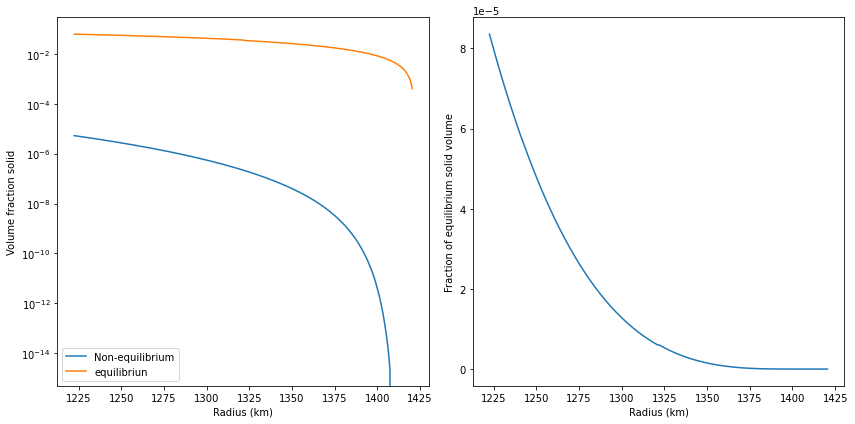

In [6]:
fig, axs = plt.subplots(ncols=2, figsize=(12,6), tight_layout=True)
ax = axs[0]
ax.plot(analysis_radii[1:-1]/1000.0, solid_vf[1:-1], label='Non-equilibrium')

ax.plot(analysis_radii[1:-1]/1000.0, feot.volume_fraction_solid(xfunc(analysis_radii[1:-1]), 
                                                                pfunc(analysis_radii[1:-1]), 
                                                                tfunc(analysis_radii[1:-1])), label='equilibriun')
ax.set_yscale("log", nonpositive='clip')
ax.set_ylabel('Volume fraction solid')
ax.set_xlabel('Radius (km)')
ax.legend()

ax = axs[1]
ax.plot(analysis_radii[1:-1]/1000.0, 
        solid_vf[1:-1] / feot.volume_fraction_solid(xfunc(analysis_radii[1:-1]), 
                                                                pfunc(analysis_radii[1:-1]), 
                                                                tfunc(analysis_radii[1:-1])))
ax.set_ylabel('Fraction of equilibrium solid volume')
ax.set_xlabel('Radius (km)')

plt.show()

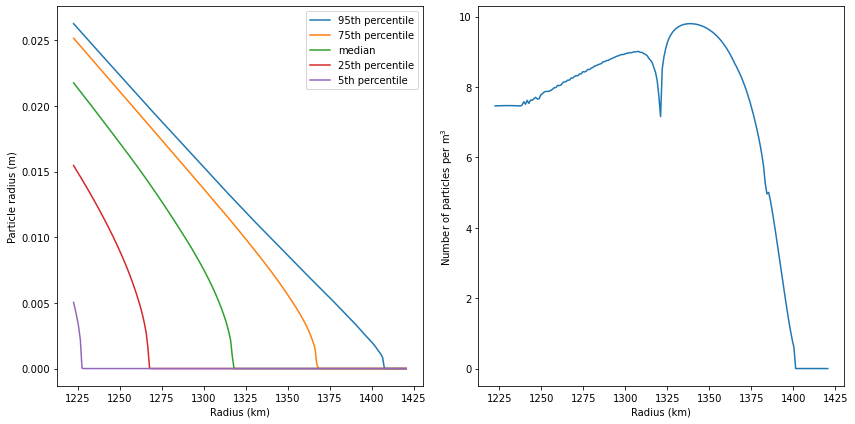

In [7]:
fig, axs = plt.subplots(ncols=2, figsize=(12,6), tight_layout=True)

ax = axs[0]
#ax.plot(analysis_radii[1:-1]/1000.0, np.max(particle_radius_unnormalised[1:-1], axis=1), label='max')
#ax.plot(analysis_radii[1:-1]/1000.0, np.mean(particle_radius_unnormalised[1:-1], axis=1), label='mean')
ax.plot(analysis_radii[1:-1]/1000.0, np.percentile(particle_radius_unnormalised[1:-1], 95, axis=1),
        label='95th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.percentile(particle_radius_unnormalised[1:-1], 75, axis=1),
        label='75th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.percentile(particle_radius_unnormalised[1:-1], 50, axis=1),
        label='median')
ax.plot(analysis_radii[1:-1]/1000.0, np.percentile(particle_radius_unnormalised[1:-1], 25, axis=1),
        label='25th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.percentile(particle_radius_unnormalised[1:-1], 5, axis=1),
        label='5th percentile')
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Particle radius (m)')
ax.legend()

ax = axs[1]
ax.plot(analysis_radii[1:-1]/1000.0, particle_densities[1:-1])
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Number of particles per m$^3$')
#ax.legend()

plt.show()

/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/andreww/miniforge3/envs/py39/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


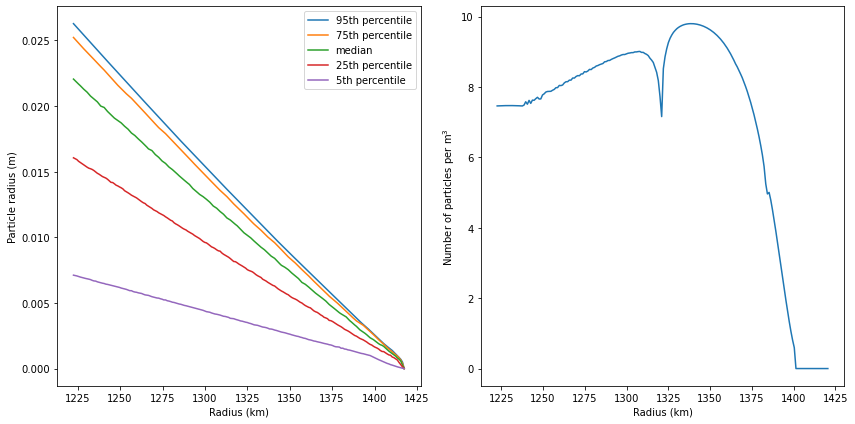

In [8]:
import numpy.ma as ma
masked_particle_radius_unnormalised = ma.masked_less(particle_radius_unnormalised, 1.0E-9)
masked_particle_radius_unnormalised = np.ma.filled(masked_particle_radius_unnormalised, np.nan)

fig, axs = plt.subplots(ncols=2, figsize=(12,6), tight_layout=True)

ax = axs[0]
#ax.plot(analysis_radii[1:-1]/1000.0, np.max(particle_radius_unnormalised[1:-1], axis=1), label='max')
#ax.plot(analysis_radii[1:-1]/1000.0, np.mean(particle_radius_unnormalised[1:-1], axis=1), label='mean')
ax.plot(analysis_radii[1:-1]/1000.0, np.nanpercentile(masked_particle_radius_unnormalised[1:-1], 95, axis=1),
        label='95th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.nanpercentile(masked_particle_radius_unnormalised[1:-1], 75, axis=1),
        label='75th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.nanpercentile(masked_particle_radius_unnormalised[1:-1], 50, axis=1),
        label='median')
ax.plot(analysis_radii[1:-1]/1000.0, np.nanpercentile(masked_particle_radius_unnormalised[1:-1], 25, axis=1),
        label='25th percentile')
ax.plot(analysis_radii[1:-1]/1000.0, np.nanpercentile(masked_particle_radius_unnormalised[1:-1], 5, axis=1),
        label='5th percentile')
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Particle radius (m)')
ax.legend()

ax = axs[1]
ax.plot(analysis_radii[1:-1]/1000.0, particle_densities[1:-1])
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Number of particles per m$^3$')
#ax.legend()

plt.show()

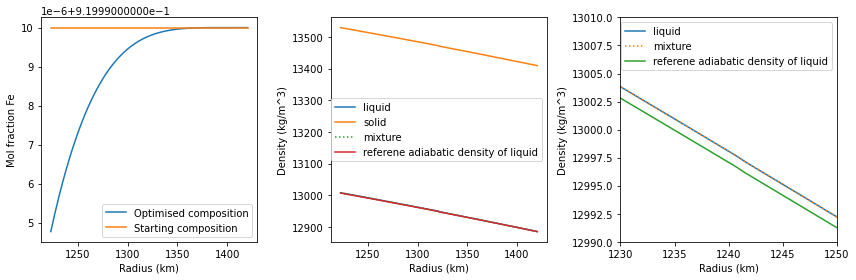

In [9]:
liquid_density, solid_mixture_density, fe_liquid_density, fe_hpc_density, \
           feo_liquid_density, feo_solid_density = feot.densities(opt_xlfunc(analysis_radii[1:-1]),
                                                                             pfunc(analysis_radii[1:-1]), 
                                                                             tfunc(analysis_radii[1:-1]))

ad_liquid_density, _, _, _, _, _ = feot.densities(xfunc(analysis_radii[1:-1]),
                                                                             pfunc(analysis_radii[1:-1]), 
                                                                             atfunc(analysis_radii[1:-1]))

fig, axs = plt.subplots(ncols=3, figsize=(12,4), tight_layout=True)

ax = axs[0]
ax.plot(analysis_radii[1:-1]/1000.0, opt_xlfunc(analysis_radii[1:-1]), label='Optimised composition')
ax.plot(analysis_radii[1:-1]/1000.0, xfunc(analysis_radii[1:-1]), label='Starting composition')
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Mol fraction Fe')
ax.legend()

ax = axs[1]
ax.plot(analysis_radii[1:-1]/1000.0, liquid_density, label='liquid')
ax.plot(analysis_radii[1:-1]/1000.0, fe_hpc_density, label='solid')
ax.plot(analysis_radii[1:-1]/1000.0, fe_hpc_density*solid_vf[1:-1] + liquid_density*(1.0-solid_vf[1:-1]),
        label='mixture', ls=':')
ax.plot(analysis_radii[1:-1]/1000.0, ad_liquid_density,
        label='referene adiabatic density of liquid', ls='-')
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Density (kg/m^3)')
ax.legend()

ax = axs[2]
ax.plot(analysis_radii[1:-1]/1000.0, liquid_density, label='liquid')
ax.plot(analysis_radii[1:-1]/1000.0, fe_hpc_density*solid_vf[1:-1] + liquid_density*(1.0-solid_vf[1:-1]),
        label='mixture', ls=':')
ax.plot(analysis_radii[1:-1]/1000.0, ad_liquid_density,
        label='referene adiabatic density of liquid', ls='-')
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Density (kg/m^3)')
ax.set_xlim(1230, 1250)
ax.set_ylim(12990, 13010)
ax.legend()

plt.show()

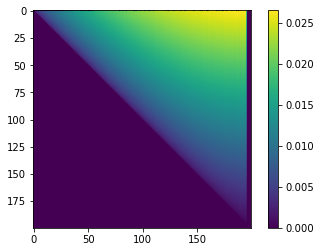

In [10]:
plt.imshow(particle_radius_unnormalised)
plt.colorbar()

In [11]:
particle_radius_unnormalised[1,18]

0.00948424862749742

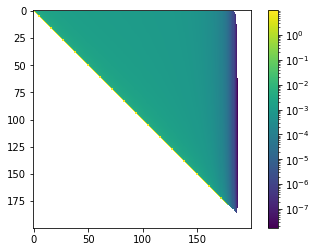

In [12]:
from matplotlib import colors

plt.imshow(partial_particle_densities, norm=colors.LogNorm(), interpolation='none')
plt.colorbar()

In [13]:
i = 10
print("At analysis radii ", analysis_radii[i])

At analysis radii  1231550.2512562815


Particle radii between 0.0265 and 9.07e-06 m


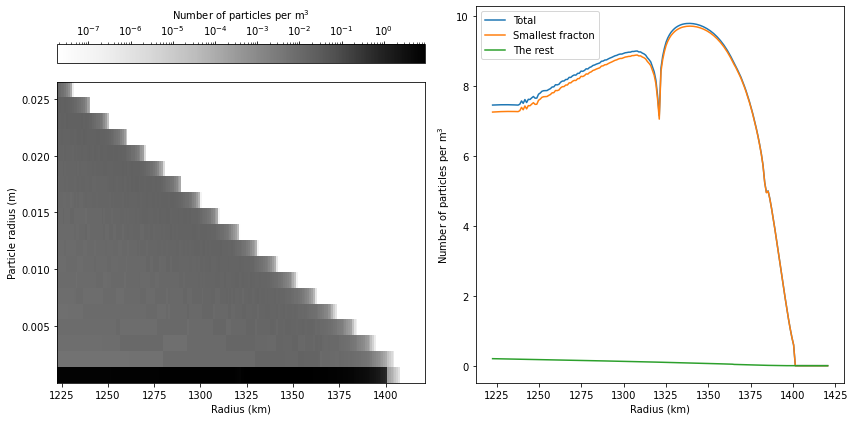

In [14]:
max_particle_radius = particle_radius_unnormalised[particle_radius_unnormalised > 0.0].max()
min_particle_radius = particle_radius_unnormalised[particle_radius_unnormalised > 0.0].min()
print("Particle radii between {:.3g} and {:.3g} m".format(max_particle_radius, min_particle_radius))

particle_size_distributions = []
edges = None
binsin = np.linspace(min_particle_radius, max_particle_radius, 20)

for i, r in enumerate(analysis_radii):
    csd, edg = np.histogram(particle_radius_unnormalised[i,:], 
                            weights=partial_particle_densities[i,:],
                            range=(min_particle_radius, max_particle_radius),
                            bins=binsin)
    if edges is None:
        edges = edg
    else:
        assert np.array_equal(edges, edg)
    
    particle_size_distributions.append(csd)

csd = np.array(particle_size_distributions)

fig, axs = plt.subplots(ncols=2, figsize=(12,6), tight_layout=True)

ax = axs[0]
im = ax.imshow(csd[1:,:].T, norm=colors.LogNorm(), aspect='auto', interpolation='none', 
              cmap=plt.get_cmap('Greys'), origin='lower', 
              extent=[analysis_radii[1]/1000.0, analysis_radii[-1]/1000.0,
                      edges[0], edges[-1]])
ax.set_ylabel('Particle radius (m)')
ax.set_xlabel('Radius (km)')
#ax.set_yscale('log')

cb = plt.colorbar(im, ax=ax, location='top')
cb.set_label('Number of particles per m$^{3}$')


ax = axs[1]
ax.plot(analysis_radii[1:-1]/1000.0, csd[1:-1,:].sum(axis=1), label='Total')
ax.plot(analysis_radii[1:-1]/1000.0, csd[1:-1,0], label='Smallest fracton')
ax.plot(analysis_radii[1:-1]/1000.0, csd[1:-1,1:].sum(axis=1), label='The rest')
ax.legend()
ax.set_xlabel('Radius (km)')
ax.set_ylabel('Number of particles per m$^3$')
#ax.set_yscale('log')

plt.show()

In [15]:
edges

array([9.07312658e-06, 1.40453172e-03, 2.79999032e-03, 4.19544891e-03,
       5.59090751e-03, 6.98636611e-03, 8.38182470e-03, 9.77728330e-03,
       1.11727419e-02, 1.25682005e-02, 1.39636591e-02, 1.53591177e-02,
       1.67545763e-02, 1.81500349e-02, 1.95454935e-02, 2.09409521e-02,
       2.23364107e-02, 2.37318693e-02, 2.51273279e-02, 2.65227865e-02])

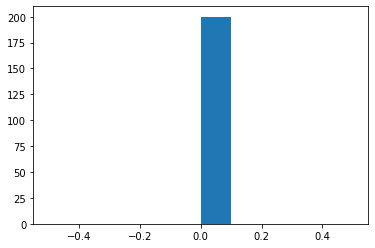

In [16]:
_ = plt.hist(particle_radius_unnormalised[i,:])


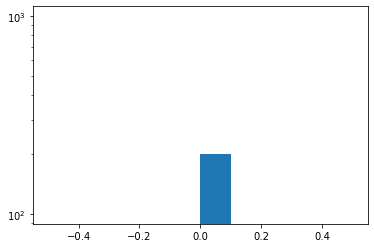

In [17]:
_ = plt.hist(partial_particle_densities[i,:])
plt.yscale('log')

In [18]:
print(np.sum(partial_particle_densities[i,:]))
partial_particle_densities[i,:]

0.0


array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [19]:
particle_radius_unnormalised[i,:]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [20]:
p_hist = []
for j in range(20):
    if particle_radius_unnormalised[i,j] >   1.0E-4: # So not swamped by little particles that have just formed...
        p_hist.extend([particle_radius_unnormalised[i,j]] * int(partial_particle_densities[i,j]))

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

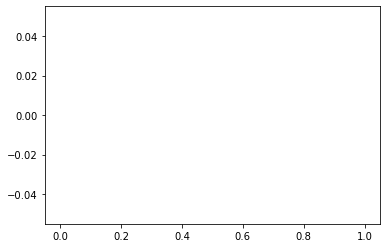

In [21]:
plt.hist(p_hist)


{'whiskers': [<matplotlib.lines.Line2D at 0x168234f70>,
 'caps': [<matplotlib.lines.Line2D at 0x1577806d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x168234b20>],
 'medians': [<matplotlib.lines.Line2D at 0x157780df0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1577961c0>],
 'means': []}

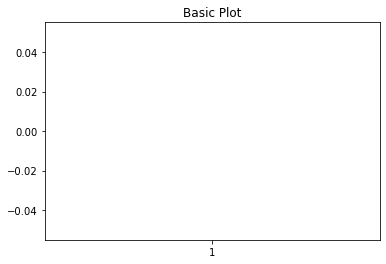

In [22]:
fig1, ax1 = plt.subplots()
ax1.set_title('Basic Plot')
ax1.boxplot(p_hist)


ValueError: zero-size array to reduction operation minimum which has no identity

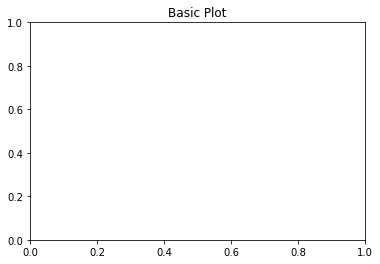

In [23]:
fig1, ax1 = plt.subplots()
ax1.set_title('Basic Plot')
ax1.violinplot(p_hist)


# Need to fix the units for the partial particle densities! See the python module!